In [2]:
%matplotlib inline

In [3]:
%load_ext autoreload
%autoreload 2

In [4]:
import glob
import h5py

In [5]:
import os
import sys
import time
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# pytorch
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader, SubsetRandomSampler, random_split

# sklearn functions
from sklearn.metrics import accuracy_score, roc_auc_score
from sklearn.model_selection import train_test_split, KFold, GroupShuffleSplit
from utils import plot_roc_curve

# load functions from nitorch
sys.path.insert(0,"/analysis/fabiane/phd/nitorch/")
from nitorch.data import load_nifti
from nitorch.transforms import  ToTensor, SagittalTranslate, SagittalFlip, \
                                AxialTranslate, normalization_factors, Normalize, \
                                IntensityRescale
from nitorch.callbacks import EarlyStopping, ModelCheckpoint
from nitorch.trainer import Trainer
from nitorch.initialization import weights_init
from nitorch.metrics import balanced_accuracy, sensitivity, specificity
from nitorch.utils import count_parameters

from itertools import product

In [6]:
import random
#from models_ukb import ModelLiu
from hyperparameter_options import params_baseline as hyperparams

In [7]:
torch.__version__

'1.8.1'

In [29]:
gpu = 2
multi_gpus = None #[0, 1]
zero_one_normalize = False
dtype = np.float64

In [9]:
# load mask
mask = None

In [10]:
# path to be used for all data sets
train_data_path = "/ritter/share/data/ADNI_HDF5/Splits_Eitel/10xrandom_splits/train_AD_CN_2Yr15T_plus_UniqueScreening_quickprep_(96, 114, 96)_random_state"

In [11]:
to_tensor = ToTensor()

In [12]:
def draw_patch(img, patch_size, all_locs=False):
    """
    Draw a patch from the image based on the specified size. 
    By default draws randomly but setting all_locs = True
    returns all possible patches in a batch.
    
    Params:
        all_locs - set to True returns all patches
    """
    img_shape = img.shape
    patch_pot_locs = [[0, int(patch_size[dim]*0.5), patch_size[dim]] for dim in range(len(img_shape))]
    # check correct size
    for dim in range(len(img_shape)):
        assert(np.max(patch_pot_locs[dim]) + patch_size[dim] <= img_shape[dim])
        
    if all_locs:
        # return all locations
        patches = []
        #num_patches_per_dim = [reduce((lambda x, y: x*y), dim_list) for dim_list in patch_pot_locs]
        #num_patches_per_dim = [len(dim_list) for dim_list in patch_pot_locs]
        all_locs = list(product(*patch_pot_locs))
        for patch_locs in all_locs:
            patch = img[patch_locs[0]:patch_locs[0]+patch_size[0],
                    patch_locs[1]:patch_locs[1]+patch_size[1],
                    patch_locs[2]:patch_locs[2]+patch_size[2]]
            patches.append(patch)
        return patches
    else:
        # return random location
        patch_locs = [random.choice(patch_pot_locs[dim]) for dim in range(len(img_shape))]
        #patch_locs = [patch_pot_locs[dim][1] for dim in range(len(img_shape))] ### Use the same patch each round
        patch = img[patch_locs[0]:patch_locs[0]+patch_size[0],
                    patch_locs[1]:patch_locs[1]+patch_size[1],
                    patch_locs[2]:patch_locs[2]+patch_size[2]]
        return patch

class ADNIDataset(Dataset):
    def __init__(self, X, y, transform=None, target_transform=None, mask=None, dtype=np.float32, patched=False, all_locs=False):
        self.X = np.tile(np.copy(X), 5)
        self.y = np.tile(np.copy(y), 5)
        #print(self.X.shape)
        #self.X = np.copy(X)
        #self.y = np.copy(y)
        
        self.transform = transform
        self.target_transform = target_transform
        self.mask = mask
        self.dtype = dtype
        self.patched = patched
        self.all_locs = all_locs
        
    def __len__(self):
        return len(self.X)
    
    def __getitem__(self, idx):
        image = self.X[idx]
        label = self.y[idx] >= 0.5
        label = torch.FloatTensor([label])
        
        if self.transform:
            image = self.transform(image)
        
        if self.patched:
            reshaped_img = image[8:85,10:105,5:85]
            patch_size = [s//k for s, k in zip(reshaped_img.shape, [2, 3, 2])]
            image = draw_patch(reshaped_img, patch_size, all_locs=self.all_locs)
        
        # normalize by max
        image /= np.max(image)
        
        image = to_tensor(image)
            
        sample = {"image" : image,
                 "label" : label}
        return sample


In [13]:
augmentations = [SagittalTranslate(dist=(3))]

# Define the classifier

In [14]:
class ModelLiu(nn.Module):
    """
    3D Patch-based model from the paper: Multi-Modality Cascaded
    Convolutional Neural Networks for Alzheimer’s Disease Diagnosis
    https://link.springer.com/article/10.1007/s12021-018-9370-4#Sec2
    
    Implementation inspired by:
    https://github.com/Tristacheng/mutimodality_cnn
    """
    def __init__(self):
        super(ModelLiu, self).__init__()
        self.drp_rate = [0.1, 0.4]
        self.drop_conv = nn.Dropout3d(p=self.drp_rate[0])
        self.drop_embed = nn.Dropout3d(p=self.drp_rate[1]/2)        

        self.Conv_1 = nn.Conv3d(1, 15, kernel_size=3, stride=1, padding=0)
        self.pool_1 = nn.MaxPool3d(kernel_size=2, stride=2, padding=0)
        
        self.Conv_2 = nn.Conv3d(15, 25, kernel_size=3, stride=1, padding=(0, 1, 0))
        self.pool_2 = nn.MaxPool3d(kernel_size=2, stride=2, padding=0)

        self.Conv_3 = nn.Conv3d(25, 50, kernel_size=3, stride=1, padding=(1, 1, 0))
        self.pool_3 = nn.MaxPool3d(kernel_size=2, stride=2, padding=0)

        self.Conv_4 = nn.Conv3d(50, 50, kernel_size=3, stride=1, padding=0)



        self.classifier = nn.Sequential(
            nn.Linear(100, 40),
            nn.Tanh(),
            nn.Dropout3d(p=self.drp_rate[1]),
            nn.Linear(40, 1)
        )

    def encode(self, x, print_size=False):
        if print_size:
            print(x.shape)
        x = F.tanh(self.Conv_1(x))
        h = self.drop_conv(self.pool_1(x))
        if print_size:
            print(h.shape)
        x = F.tanh(self.Conv_2(h))
        h = self.drop_conv(self.pool_2(x))
        if print_size:
            print(h.shape)
        x = F.tanh(self.Conv_3(h))
        h = self.drop_conv(self.pool_3(x))
        if print_size:
            print(h.shape)
        x = F.tanh(self.Conv_4(h))
        h = self.drop_embed(x)
        if print_size:
            print(h.shape)
        return h

    def forward(self, x):
        print_size = False
        x = self.encode(x, print_size=print_size)
        x = self.flatten(x)
        x = self.classifier(x)
        return x
    
    def flatten(self, x):
        return x.view(x.size(0), -1)

In [15]:
def pick_model(name):
    if name == "ModelA":
        net = ModelA()
    elif name == "ModelB":
        net = ModelB()
    elif name == "ModelAPIF":
        net = ModelAPIF()
    elif name == "ModelBPIF":
        net = ModelBPIF()
    elif name == "ModelLiu":
        net = ModelLiu()
    return net

def update_outer_scores(outer_fold_best, report, retain_metric, selected_hyperparams, inner_fold_idx):
    outer_fold_best["final_acc"] = report["val_metrics"][retain_metric][-1]
    outer_fold_best["best_acc"] = np.max(report["val_metrics"][retain_metric][ignore_epochs:])
    outer_fold_best["final_iter"] = len(report["val_metrics"][retain_metric])
    outer_fold_best["best_iter"] = outer_fold_best["final_iter"] - np.argmax(np.flip(np.copy(report["val_metrics"][retain_metric]), axis=0))
    outer_fold_best["params"] = selected_hyperparams
    outer_fold_best["inner_fold_idx"] = inner_fold_idx
    return outer_fold_best

# Training

In [16]:
def run(
    net,
    data,
    shape,
    callbacks=[],
    augmentations=[],
    masked=False,
    metrics=[],
    k_folds=None,
    b=None,
    num_epochs=35,
    retain_metric=None
):      
   
    fold_metric = []
    all_outer_bests = []
    best_metric = []
    models = []
    fold = 0
    initial_prepend = None
    
    random_states = np.arange(20, 30) # will be used again to split in testing phase
    
    for outer_fold, r in enumerate(random_states):
        print("###### Starting outer fold {}".format(outer_fold))

        # load data sets
        train_h5 = h5py.File(train_data_path + str(r) + ".h5", 'r')
        val_h5 = h5py.File(train_data_path.replace("train", "val") + str(r) + ".h5", 'r')
        
        X_train, y_train = np.array(train_h5['X']), np.array(train_h5['y'])
        X_val, y_val = val_h5['X'], val_h5['y']
        
        # select only 20 % 
        X_train, _, y_train, _ = train_test_split(X_train, y_train, train_size=0.2, random_state=42)

        # dataset overview
        y = np.concatenate([np.array(y_train), np.array(y_val)])
        print("# of patients {}, # of healthy controls {}".format(np.sum(y), len(y)-np.sum(y)))

        print(len(y_train))
        print(len(y_val))
        
        if zero_one_normalize:
            intensity = IntensityRescale(data_min=np.min(X_train), data_max=np.max(X_train)) # use the same min and max for all datasets
            adni_data_train = ADNIDataset(X_train, y_train, transform=transforms.Compose(augmentations + [intensity]), mask=mask, dtype=dtype, patched=True)
            adni_data_val = ADNIDataset(X_val, y_val, transform=transforms.Compose([intensity]), mask=mask, dtype=dtype, patched=True)
        else:
            adni_data_train = ADNIDataset(X_train, y_train, transform=transforms.Compose(augmentations), mask=mask, dtype=dtype, patched=True)
            adni_data_val = ADNIDataset(X_val, y_val, transform=None, mask=mask, dtype=dtype, patched=True)
        
        train_h5.close()
        val_h5.close()
        
        outer_fold_best = {
            "final_acc" : 0,
            "best_acc" : 0,
            "final_iter" : 0,
            "best_iter" : 0,
            "params" : {},
            "inner_fold_idx" : 0
        }
        
        for inner_fold in range(5):
            print("###### Starting inner fold {}".format(inner_fold))
            # sample randomly from the hyperparameter options each inner fold
            #model_name = random.choice(hyperparams["model"])
            model_name = "ModelLiu"
            b = random.choice(hyperparams["batch_size"])
            patience = random.choice(hyperparams["patience"]["small"])
            #lr = random.choice(hyperparams["lr"])
            lr = 1e-3

            selected_hyperparams = {
                "model" : model_name,
                "batch_size" : b,
                "patience" : patience,
                "lr" : lr
                }
            print(selected_hyperparams)
            
            #        # restart model
            del net
            net = ModelLiu().cuda(gpu)

            print("Trainable model parameters: {}".format(count_parameters(net)))
        
            callbacks = [EarlyStopping(patience=patience, ignore_before=ignore_epochs, retain_metric="loss", mode='min'),
                         ModelCheckpoint(path=output_dir,
                                         prepend="outer_{}_inner_{}".format(outer_fold, inner_fold),
                                         store_best=True,
                                         ignore_before=ignore_epochs,
                                         retain_metric=retain_metric)]
        
            # add current fold number to model checkpoint path
            if callbacks is not None:
                for idx, callback in enumerate(callbacks):
                    if isinstance(callback, ModelCheckpoint):
                        if initial_prepend is None:
                            initial_prepend = callbacks[idx].prepend
                        callbacks[idx].prepend = initial_prepend + "cv_fold_{}_".format(fold)
                        initial_prepend = None
            fold += 1

            # set optimizer
            wd = 5e-4 #0.008
            criterion = nn.BCEWithLogitsLoss().cuda(gpu)
            optimizer = optim.Adam(net.parameters(), lr=lr, weight_decay=wd)
            #optimizer = optim.Adadelta(net.parameters(), lr=lr, rho=0.95,weight_decay=wd)

            train_loader = DataLoader(
                adni_data_train, batch_size=b, shuffle=True, num_workers=4
            )

            val_loader = DataLoader(
                adni_data_val, batch_size=2, shuffle=True, num_workers=2
            )

            trainer = Trainer(
                net,
                criterion,
                optimizer,
                metrics=metrics,
                callbacks=callbacks,
                device=gpu
            )
            # train model and store results
            net, report = trainer.train_model(
                train_loader,
                val_loader,
                num_epochs=num_epochs,
                show_train_steps=2,
                show_validation_epochs=1,
            )
            # append validation score of the retain metric
            if isinstance(retain_metric, str):
                # use the average of the last 10 epochs
                best_val = np.mean(report["val_metrics"][retain_metric][-10:])
                fold_metric.append(report["val_metrics"][retain_metric][-1])
                best_metric.append(best_val)
                # replace best model for this outer_fold in case of improvement
                #if report["val_metrics"][retain_metric][-1] > outer_fold_best["final_acc"]:
                if report["val_metrics"][retain_metric][-1] > outer_fold_best["final_acc"]:
                    update_outer_scores(outer_fold_best, report, retain_metric, selected_hyperparams, inner_fold)
            else:
                # use the average of the last 10 epochs
                best_val = np.mean(report["val_metrics"][retain_metric.__name__][-10:])
                fold_metric.append(report["val_metrics"][retain_metric.__name__][-1])
                best_metric.append(best_val)
                # replace best model for this outer_fold in case of improvement
                #if report["val_metrics"][retain_metric.__name__][-1] > outer_fold_best["final_acc"]:
                if best_val > outer_fold_best["final_acc"]:
                    update_outer_scores(outer_fold_best, report, retain_metric.__name__, selected_hyperparams, inner_fold)

            models.append(net)        
            print("Finished inner fold.")

            # visualize result
            trainer.visualize_training(report, metrics)
            trainer.evaluate_model(val_loader, gpu)
        print("Finished outer fold.")
        print(outer_fold_best)
        all_outer_bests.append(outer_fold_best)

    print("################################")
    print("################################")
    print("All accuracies: {}".format(fold_metric))
    print("Best accuracies mean: {} All :{}".format(np.mean(best_metric), best_metric))
    print(all_outer_bests)
    return fold_metric, models

In [17]:
num_epochs = 650
min_iters = 3
ignore_epochs = 150
normalize = False
retain_metric = balanced_accuracy
metrics = [accuracy_score, balanced_accuracy]

In [18]:
r = 1

In [19]:
output_dir = "/ritter/share/projects/Methods/Eitel_local_filter/experiments_submission/models/ADNI/20_percent/10xrandom_splits/liu_patches/"

###### Starting outer fold 0


/home/fabiane/.local/lib/python3.6/site-packages/sklearn/model_selection/_split.py:2069: FutureWarning: From version 0.21, test_size will always complement train_size unless both are specified.
  FutureWarning)


# of patients 128, # of healthy controls 118
139
107
###### Starting inner fold 0
{'model': 'ModelLiu', 'batch_size': 6, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001


/home/fabiane/anaconda2/envs/mort1/lib/python3.6/site-packages/torch/nn/functional.py:1320: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")


[0,     2] loss: 0.71558
[0,     4] loss: 0.69279
[0,     6] loss: 0.68903
[0,     8] loss: 0.74409
[0,    10] loss: 0.73026
[0,    12] loss: 0.68796
[0,    14] loss: 0.65318
[0,    16] loss: 0.59545
[0,    18] loss: 0.47539
[0,    20] loss: 0.71523
[0,    22] loss: 1.01017
Time elapsed: 0h:0m:2s
train accuracy_score: 57.55 %
train balanced_accuracy: 55.24 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.755204
[1,     2] loss: 0.65154
[1,     4] loss: 0.68372
[1,     6] loss: 0.64616
[1,     8] loss: 0.76307
[1,    10] loss: 0.74401
[1,    12] loss: 0.65348
[1,    14] loss: 0.70747
[1,    16] loss: 0.61174
[1,    18] loss: 0.76061
[1,    20] loss: 0.71538
[1,    22] loss: 0.72113
Time elapsed: 0h:0m:5s
train accuracy_score: 55.40 %
train balanced_accuracy: 49.54 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.697609
[2,     2] loss: 0.66802
[2,     4] loss: 0.66225
[2,     6] loss: 0.68495
[2,     8] loss: 0.65038
[2,    10] loss: 0.719

[18,    18] loss: 0.82466
[18,    20] loss: 0.84042
[18,    22] loss: 0.64743
Time elapsed: 0h:0m:58s
train accuracy_score: 56.12 %
train balanced_accuracy: 49.77 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.739171
[19,     2] loss: 0.69309
[19,     4] loss: 0.71393
[19,     6] loss: 0.70896
[19,     8] loss: 0.70311
[19,    10] loss: 0.71825
[19,    12] loss: 0.62998
[19,    14] loss: 0.71375
[19,    16] loss: 0.72244
[19,    18] loss: 0.64524
[19,    20] loss: 0.68978
[19,    22] loss: 0.65498
Time elapsed: 0h:1m:1s
train accuracy_score: 57.55 %
train balanced_accuracy: 51.23 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.717571
[20,     2] loss: 0.67168
[20,     4] loss: 0.73261
[20,     6] loss: 0.68605
[20,     8] loss: 0.67481
[20,    10] loss: 0.65503
[20,    12] loss: 0.69501
[20,    14] loss: 0.66591
[20,    16] loss: 0.68543
[20,    18] loss: 0.74748
[20,    20] loss: 0.61779
[20,    22] loss: 0.70711
Time elapsed: 0h:1m:5

Time elapsed: 0h:1m:55s
train accuracy_score: 53.96 %
train balanced_accuracy: 47.67 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.718531
[37,     2] loss: 0.58717
[37,     4] loss: 0.74336
[37,     6] loss: 0.64182
[37,     8] loss: 0.64240
[37,    10] loss: 0.71194
[37,    12] loss: 0.76119
[37,    14] loss: 0.64829
[37,    16] loss: 0.66425
[37,    18] loss: 0.67918
[37,    20] loss: 0.80760
[37,    22] loss: 0.68264
Time elapsed: 0h:1m:58s
train accuracy_score: 56.83 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.723936
[38,     2] loss: 0.64416
[38,     4] loss: 0.73166
[38,     6] loss: 0.68172
[38,     8] loss: 0.70208
[38,    10] loss: 0.68350
[38,    12] loss: 0.73583
[38,    14] loss: 0.72412
[38,    16] loss: 0.70138
[38,    18] loss: 0.70337
[38,    20] loss: 0.71171
[38,    22] loss: 0.64811
Time elapsed: 0h:2m:1s
train accuracy_score: 51.80 %
train balanced_accuracy: 47.37 %
val accuracy

val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.714885
[55,     2] loss: 0.67322
[55,     4] loss: 0.64549
[55,     6] loss: 0.74652
[55,     8] loss: 0.61187
[55,    10] loss: 0.66845
[55,    12] loss: 0.62994
[55,    14] loss: 0.76481
[55,    16] loss: 0.77990
[55,    18] loss: 0.61373
[55,    20] loss: 0.79666
[55,    22] loss: 0.67926
Time elapsed: 0h:2m:55s
train accuracy_score: 56.83 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.719215
[56,     2] loss: 0.64877
[56,     4] loss: 0.72963
[56,     6] loss: 0.68583
[56,     8] loss: 0.70264
[56,    10] loss: 0.60112
[56,    12] loss: 0.78370
[56,    14] loss: 0.74434
[56,    16] loss: 0.60554
[56,    18] loss: 0.76060
[56,    20] loss: 0.61377
[56,    22] loss: 0.69605
Time elapsed: 0h:2m:58s
train accuracy_score: 56.83 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.723180
[57,     2] loss: 0.

[73,     2] loss: 0.69990
[73,     4] loss: 0.66783
[73,     6] loss: 0.65612
[73,     8] loss: 0.78253
[73,    10] loss: 0.71990
[73,    12] loss: 0.73318
[73,    14] loss: 0.67699
[73,    16] loss: 0.69739
[73,    18] loss: 0.65257
[73,    20] loss: 0.68585
[73,    22] loss: 0.61955
Time elapsed: 0h:3m:52s
train accuracy_score: 56.83 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.712949
[74,     2] loss: 0.68250
[74,     4] loss: 0.65736
[74,     6] loss: 0.66195
[74,     8] loss: 0.71382
[74,    10] loss: 0.64404
[74,    12] loss: 0.69519
[74,    14] loss: 0.63297
[74,    16] loss: 0.71029
[74,    18] loss: 0.66758
[74,    20] loss: 0.69503
[74,    22] loss: 0.70142
Time elapsed: 0h:3m:55s
train accuracy_score: 58.99 %
train balanced_accuracy: 52.50 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.709338
[75,     2] loss: 0.68684
[75,     4] loss: 0.70732
[75,     6] loss: 0.71556
[75,     8] loss: 0.

[91,     8] loss: 0.67729
[91,    10] loss: 0.68499
[91,    12] loss: 0.63914
[91,    14] loss: 0.69932
[91,    16] loss: 0.66973
[91,    18] loss: 0.67144
[91,    20] loss: 0.65061
[91,    22] loss: 0.66870
Time elapsed: 0h:4m:49s
train accuracy_score: 58.27 %
train balanced_accuracy: 51.67 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.709043
[92,     2] loss: 0.69185
[92,     4] loss: 0.63755
[92,     6] loss: 0.67999
[92,     8] loss: 0.72228
[92,    10] loss: 0.69437
[92,    12] loss: 0.72687
[92,    14] loss: 0.67176
[92,    16] loss: 0.69463
[92,    18] loss: 0.68503
[92,    20] loss: 0.64281
[92,    22] loss: 0.68898
Time elapsed: 0h:4m:52s
train accuracy_score: 57.55 %
train balanced_accuracy: 50.83 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.714586
[93,     2] loss: 0.63138
[93,     4] loss: 0.73906
[93,     6] loss: 0.69039
[93,     8] loss: 0.72253
[93,    10] loss: 0.68202
[93,    12] loss: 0.68278
[93,    14] loss: 0.

[109,    14] loss: 0.75004
[109,    16] loss: 0.65474
[109,    18] loss: 0.68926
[109,    20] loss: 0.74074
[109,    22] loss: 0.68214
Time elapsed: 0h:5m:46s
train accuracy_score: 56.83 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.718311
[110,     2] loss: 0.69549
[110,     4] loss: 0.74683
[110,     6] loss: 0.65676
[110,     8] loss: 0.68701
[110,    10] loss: 0.70618
[110,    12] loss: 0.67454
[110,    14] loss: 0.69179
[110,    16] loss: 0.65335
[110,    18] loss: 0.68653
[110,    20] loss: 0.65973
[110,    22] loss: 0.66137
Time elapsed: 0h:5m:49s
train accuracy_score: 56.83 %
train balanced_accuracy: 50.40 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.703855
[111,     2] loss: 0.66857
[111,     4] loss: 0.59389
[111,     6] loss: 0.72014
[111,     8] loss: 0.72609
[111,    10] loss: 0.79959
[111,    12] loss: 0.63109
[111,    14] loss: 0.68826
[111,    16] loss: 0.71712
[111,    18] loss: 0.6

[127,     8] loss: 0.67236
[127,    10] loss: 0.67859
[127,    12] loss: 0.70567
[127,    14] loss: 0.63722
[127,    16] loss: 0.72781
[127,    18] loss: 0.68478
[127,    20] loss: 0.66971
[127,    22] loss: 0.65670
Time elapsed: 0h:6m:42s
train accuracy_score: 56.83 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.711293
[128,     2] loss: 0.65798
[128,     4] loss: 0.75770
[128,     6] loss: 0.66084
[128,     8] loss: 0.70763
[128,    10] loss: 0.63126
[128,    12] loss: 0.68465
[128,    14] loss: 0.70422
[128,    16] loss: 0.69112
[128,    18] loss: 0.67713
[128,    20] loss: 0.68266
[128,    22] loss: 0.75727
Time elapsed: 0h:6m:45s
train accuracy_score: 56.83 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.711633
[129,     2] loss: 0.72425
[129,     4] loss: 0.68077
[129,     6] loss: 0.68910
[129,     8] loss: 0.71573
[129,    10] loss: 0.66705
[129,    12] loss: 0.6

[145,     2] loss: 0.67372
[145,     4] loss: 0.69097
[145,     6] loss: 0.70799
[145,     8] loss: 0.65354
[145,    10] loss: 0.67366
[145,    12] loss: 0.70763
[145,    14] loss: 0.68180
[145,    16] loss: 0.63416
[145,    18] loss: 0.68402
[145,    20] loss: 0.71133
[145,    22] loss: 0.65871
Time elapsed: 0h:7m:38s
train accuracy_score: 56.83 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.715728
[146,     2] loss: 0.73333
[146,     4] loss: 0.65696
[146,     6] loss: 0.67854
[146,     8] loss: 0.62598
[146,    10] loss: 0.71422
[146,    12] loss: 0.68805
[146,    14] loss: 0.67022
[146,    16] loss: 0.64893
[146,    18] loss: 0.58177
[146,    20] loss: 0.69523
[146,    22] loss: 0.79599
Time elapsed: 0h:7m:42s
train accuracy_score: 56.83 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.713504
[147,     2] loss: 0.67427
[147,     4] loss: 0.68236
[147,     6] loss: 0.6

val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.717386
[163,     2] loss: 0.67963
[163,     4] loss: 0.72684
[163,     6] loss: 0.65526
[163,     8] loss: 0.68311
[163,    10] loss: 0.71945
[163,    12] loss: 0.75950
[163,    14] loss: 0.64691
[163,    16] loss: 0.64568
[163,    18] loss: 0.66797
[163,    20] loss: 0.72662
[163,    22] loss: 0.67324
Time elapsed: 0h:8m:36s
train accuracy_score: 56.83 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.710920
[164,     2] loss: 0.71300
[164,     4] loss: 0.71662
[164,     6] loss: 0.67161
[164,     8] loss: 0.72613
[164,    10] loss: 0.70179
[164,    12] loss: 0.63027
[164,    14] loss: 0.67432
[164,    16] loss: 0.63950
[164,    18] loss: 0.67717
[164,    20] loss: 0.71870
[164,    22] loss: 0.63105
Time elapsed: 0h:8m:39s
train accuracy_score: 56.83 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.71505

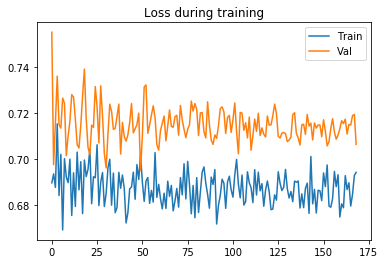

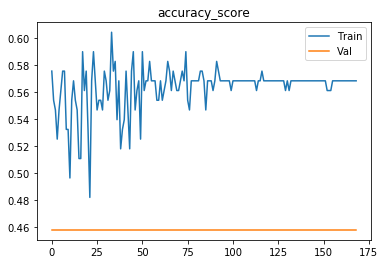

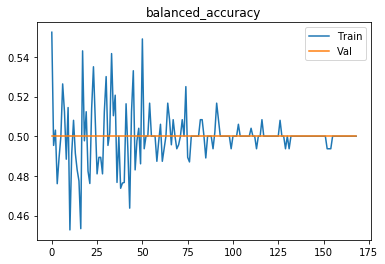

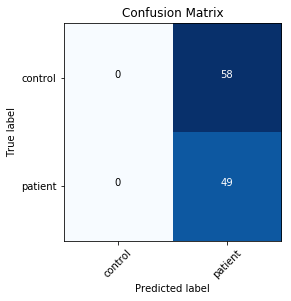

###### Starting inner fold 1
{'model': 'ModelLiu', 'batch_size': 12, 'patience': 12, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.67535
[0,     4] loss: 0.68566
[0,     6] loss: 0.70071
[0,     8] loss: 0.71859
[0,    10] loss: 0.70704
Time elapsed: 0h:0m:2s
train accuracy_score: 51.08 %
train balanced_accuracy: 49.35 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.711313
[1,     2] loss: 0.68719
[1,     4] loss: 0.62872
[1,     6] loss: 0.66677
[1,     8] loss: 0.69004
[1,    10] loss: 0.78192
Time elapsed: 0h:0m:5s
train accuracy_score: 55.40 %
train balanced_accuracy: 49.74 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.736465
[2,     2] loss: 0.74554
[2,     4] loss: 0.66889
[2,     6] loss: 0.72377
[2,     8] loss: 0.64953
[2,    10] loss: 0.67055
Time elapsed: 0h:0m:8s
train accuracy_score: 53.96 %
train balanced_accuracy: 49.47 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.729769


val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.706479
[28,     2] loss: 0.68396
[28,     4] loss: 0.69024
[28,     6] loss: 0.71646
[28,     8] loss: 0.66039
[28,    10] loss: 0.70195
Time elapsed: 0h:1m:31s
train accuracy_score: 54.68 %
train balanced_accuracy: 50.71 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.709125
[29,     2] loss: 0.70490
[29,     4] loss: 0.71675
[29,     6] loss: 0.70017
[29,     8] loss: 0.65108
[29,    10] loss: 0.70967
Time elapsed: 0h:1m:35s
train accuracy_score: 53.96 %
train balanced_accuracy: 48.87 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.721787
[30,     2] loss: 0.67587
[30,     4] loss: 0.64391
[30,     6] loss: 0.74776
[30,     8] loss: 0.68462
[30,    10] loss: 0.70783
Time elapsed: 0h:1m:38s
train accuracy_score: 54.68 %
train balanced_accuracy: 48.30 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.720866
[31,     2] loss: 0.65917
[31,     4]

val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.710554
[56,     2] loss: 0.70402
[56,     4] loss: 0.68347
[56,     6] loss: 0.66795
[56,     8] loss: 0.70100
[56,    10] loss: 0.69555
Time elapsed: 0h:2m:59s
train accuracy_score: 55.40 %
train balanced_accuracy: 49.54 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.709574
[57,     2] loss: 0.67328
[57,     4] loss: 0.68696
[57,     6] loss: 0.74899
[57,     8] loss: 0.72571
[57,    10] loss: 0.65292
Time elapsed: 0h:3m:2s
train accuracy_score: 56.12 %
train balanced_accuracy: 50.17 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.716107
[58,     2] loss: 0.69856
[58,     4] loss: 0.69154
[58,     6] loss: 0.72526
[58,     8] loss: 0.68559
[58,    10] loss: 0.76199
Time elapsed: 0h:3m:6s
train accuracy_score: 56.12 %
train balanced_accuracy: 49.37 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.724309
[59,     2] loss: 0.70098
[59,     4] l

val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.715452
[84,     2] loss: 0.71585
[84,     4] loss: 0.66081
[84,     6] loss: 0.65543
[84,     8] loss: 0.69684
[84,    10] loss: 0.62943
Time elapsed: 0h:4m:26s
train accuracy_score: 55.40 %
train balanced_accuracy: 49.34 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.711253
[85,     2] loss: 0.64849
[85,     4] loss: 0.68599
[85,     6] loss: 0.67147
[85,     8] loss: 0.74936
[85,    10] loss: 0.69688
Time elapsed: 0h:4m:29s
train accuracy_score: 56.83 %
train balanced_accuracy: 50.40 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.717131
[86,     2] loss: 0.70366
[86,     4] loss: 0.66015
[86,     6] loss: 0.69065
[86,     8] loss: 0.65088
[86,    10] loss: 0.70869
Time elapsed: 0h:4m:32s
train accuracy_score: 56.83 %
train balanced_accuracy: 50.40 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.713116
[87,     2] loss: 0.68958
[87,     4]

Time elapsed: 0h:5m:49s
train accuracy_score: 56.12 %
train balanced_accuracy: 49.77 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.723375
[112,     2] loss: 0.69426
[112,     4] loss: 0.68643
[112,     6] loss: 0.70995
[112,     8] loss: 0.72315
[112,    10] loss: 0.65201
Time elapsed: 0h:5m:52s
train accuracy_score: 56.12 %
train balanced_accuracy: 49.57 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.717864
[113,     2] loss: 0.63850
[113,     4] loss: 0.71157
[113,     6] loss: 0.77219
[113,     8] loss: 0.64942
[113,    10] loss: 0.76246
Time elapsed: 0h:5m:55s
train accuracy_score: 57.55 %
train balanced_accuracy: 51.03 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.725672
[114,     2] loss: 0.67782
[114,     4] loss: 0.75003
[114,     6] loss: 0.66221
[114,     8] loss: 0.72581
[114,    10] loss: 0.69622
Time elapsed: 0h:5m:58s
train accuracy_score: 55.40 %
train balanced_accuracy: 48.73 %
val accuracy_

[139,     2] loss: 0.67404
[139,     4] loss: 0.72751
[139,     6] loss: 0.66965
[139,     8] loss: 0.67581
[139,    10] loss: 0.68022
Time elapsed: 0h:7m:14s
train accuracy_score: 56.83 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.715684
[140,     2] loss: 0.67696
[140,     4] loss: 0.68306
[140,     6] loss: 0.68190
[140,     8] loss: 0.74741
[140,    10] loss: 0.66604
Time elapsed: 0h:7m:17s
train accuracy_score: 56.83 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.717165
[141,     2] loss: 0.68705
[141,     4] loss: 0.70321
[141,     6] loss: 0.68001
[141,     8] loss: 0.71690
[141,    10] loss: 0.65081
Time elapsed: 0h:7m:21s
train accuracy_score: 54.68 %
train balanced_accuracy: 48.10 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.707917
[142,     2] loss: 0.69516
[142,     4] loss: 0.73922
[142,     6] loss: 0.64133
[142,     8] loss: 

Time elapsed: 0h:8m:45s
train accuracy_score: 55.40 %
train balanced_accuracy: 48.73 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.713786
[167,     2] loss: 0.68308
[167,     4] loss: 0.68780
[167,     6] loss: 0.69166
[167,     8] loss: 0.69056
[167,    10] loss: 0.71045
Time elapsed: 0h:8m:48s
train accuracy_score: 56.83 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.718780
[168,     2] loss: 0.68294
[168,     4] loss: 0.69023
[168,     6] loss: 0.69941
[168,     8] loss: 0.67783
[168,    10] loss: 0.65405
Time elapsed: 0h:8m:51s
train accuracy_score: 56.83 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.721197
[169,     2] loss: 0.70340
[169,     4] loss: 0.68875
[169,     6] loss: 0.67303
[169,     8] loss: 0.71544
[169,    10] loss: 0.63855
Time elapsed: 0h:8m:55s
train accuracy_score: 56.83 %
train balanced_accuracy: 50.00 %
val accuracy_

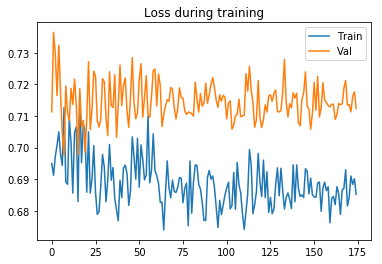

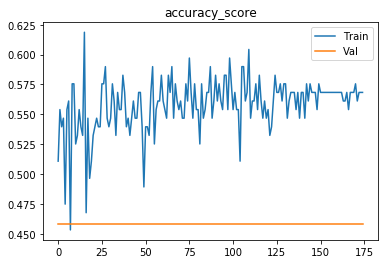

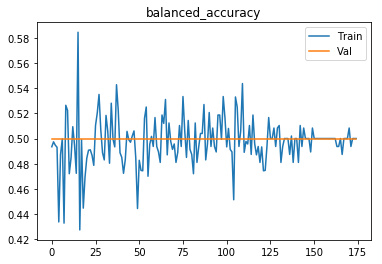

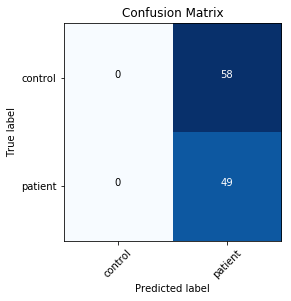

###### Starting inner fold 2
{'model': 'ModelLiu', 'batch_size': 4, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.74656
[0,     4] loss: 0.69163
[0,     6] loss: 0.76555
[0,     8] loss: 0.71929
[0,    10] loss: 0.63273
[0,    12] loss: 0.62807
[0,    14] loss: 0.78070
[0,    16] loss: 0.62410
[0,    18] loss: 0.70850
[0,    20] loss: 0.67184
[0,    22] loss: 0.70133
[0,    24] loss: 0.60680
[0,    26] loss: 0.67173
[0,    28] loss: 0.87604
[0,    30] loss: 0.73313
[0,    32] loss: 0.67268
[0,    34] loss: 0.68696
Time elapsed: 0h:0m:2s
train accuracy_score: 53.24 %
train balanced_accuracy: 52.45 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.726163
[1,     2] loss: 0.78508
[1,     4] loss: 0.66913
[1,     6] loss: 0.61520
[1,     8] loss: 0.92622
[1,    10] loss: 0.60185
[1,    12] loss: 0.69365
[1,    14] loss: 0.56891
[1,    16] loss: 0.47570
[1,    18] loss: 0.73913
[1,    20] loss: 0.77665
[1,    22] loss: 0.71871
[1, 

Time elapsed: 0h:0m:41s
train accuracy_score: 53.24 %
train balanced_accuracy: 50.24 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.714532
[14,     2] loss: 0.72850
[14,     4] loss: 0.61974
[14,     6] loss: 0.73841
[14,     8] loss: 0.85747
[14,    10] loss: 0.53765
[14,    12] loss: 0.59226
[14,    14] loss: 0.74958
[14,    16] loss: 0.79103
[14,    18] loss: 0.73922
[14,    20] loss: 0.79752
[14,    22] loss: 0.77141
[14,    24] loss: 0.71210
[14,    26] loss: 0.61979
[14,    28] loss: 0.79809
[14,    30] loss: 0.76295
[14,    32] loss: 0.78505
[14,    34] loss: 0.75966
Time elapsed: 0h:0m:44s
train accuracy_score: 52.52 %
train balanced_accuracy: 47.00 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.705882
[15,     2] loss: 0.70058
[15,     4] loss: 0.73485
[15,     6] loss: 0.65809
[15,     8] loss: 0.73555
[15,    10] loss: 0.67422
[15,    12] loss: 0.71737
[15,    14] loss: 0.70575
[15,    16] loss: 0.81730
[15,    18] loss: 0.

[27,    18] loss: 0.75134
[27,    20] loss: 0.66457
[27,    22] loss: 0.72781
[27,    24] loss: 0.70419
[27,    26] loss: 0.74486
[27,    28] loss: 0.72174
[27,    30] loss: 0.59787
[27,    32] loss: 0.61292
[27,    34] loss: 0.72105
Time elapsed: 0h:1m:23s
train accuracy_score: 51.80 %
train balanced_accuracy: 47.97 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.713629
[28,     2] loss: 0.69758
[28,     4] loss: 0.61929
[28,     6] loss: 0.75781
[28,     8] loss: 0.85154
[28,    10] loss: 0.80598
[28,    12] loss: 0.58157
[28,    14] loss: 0.63214
[28,    16] loss: 0.68870
[28,    18] loss: 0.73443
[28,    20] loss: 0.71332
[28,    22] loss: 0.65570
[28,    24] loss: 0.59280
[28,    26] loss: 0.76511
[28,    28] loss: 0.71632
[28,    30] loss: 0.58748
[28,    32] loss: 0.71467
[28,    34] loss: 0.71796
Time elapsed: 0h:1m:26s
train accuracy_score: 53.24 %
train balanced_accuracy: 48.04 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.7

val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.709425
[41,     2] loss: 0.72560
[41,     4] loss: 0.72957
[41,     6] loss: 0.61081
[41,     8] loss: 0.71679
[41,    10] loss: 0.64886
[41,    12] loss: 0.77154
[41,    14] loss: 0.73426
[41,    16] loss: 0.69407
[41,    18] loss: 0.60106
[41,    20] loss: 0.67637
[41,    22] loss: 0.77919
[41,    24] loss: 0.71250
[41,    26] loss: 0.69020
[41,    28] loss: 0.64865
[41,    30] loss: 0.70008
[41,    32] loss: 0.69986
[41,    34] loss: 0.70923
Time elapsed: 0h:2m:5s
train accuracy_score: 55.40 %
train balanced_accuracy: 48.93 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.719789
[42,     2] loss: 0.70826
[42,     4] loss: 0.73435
[42,     6] loss: 0.62908
[42,     8] loss: 0.67270
[42,    10] loss: 0.68444
[42,    12] loss: 0.61375
[42,    14] loss: 0.58792
[42,    16] loss: 0.63957
[42,    18] loss: 0.74272
[42,    20] loss: 0.63202
[42,    22] loss: 0.67341
[42,    24] loss: 0.73976
[42,

[54,    20] loss: 0.72477
[54,    22] loss: 0.75486
[54,    24] loss: 0.72556
[54,    26] loss: 0.75239
[54,    28] loss: 0.68767
[54,    30] loss: 0.65740
[54,    32] loss: 0.71371
[54,    34] loss: 0.69030
Time elapsed: 0h:2m:45s
train accuracy_score: 55.40 %
train balanced_accuracy: 49.74 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.706595
[55,     2] loss: 0.72667
[55,     4] loss: 0.75422
[55,     6] loss: 0.68834
[55,     8] loss: 0.66266
[55,    10] loss: 0.72237
[55,    12] loss: 0.71543
[55,    14] loss: 0.66780
[55,    16] loss: 0.69730
[55,    18] loss: 0.66811
[55,    20] loss: 0.70742
[55,    22] loss: 0.65082
[55,    24] loss: 0.69434
[55,    26] loss: 0.60311
[55,    28] loss: 0.59686
[55,    30] loss: 0.69388
[55,    32] loss: 0.74756
[55,    34] loss: 0.79167
Time elapsed: 0h:2m:48s
train accuracy_score: 53.24 %
train balanced_accuracy: 47.04 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.720902
[56,     2] loss: 0.

[68,     2] loss: 0.73917
[68,     4] loss: 0.69074
[68,     6] loss: 0.66024
[68,     8] loss: 0.73409
[68,    10] loss: 0.66837
[68,    12] loss: 0.73765
[68,    14] loss: 0.71799
[68,    16] loss: 0.70585
[68,    18] loss: 0.62568
[68,    20] loss: 0.65129
[68,    22] loss: 0.67691
[68,    24] loss: 0.66649
[68,    26] loss: 0.75747
[68,    28] loss: 0.67948
[68,    30] loss: 0.67116
[68,    32] loss: 0.74683
[68,    34] loss: 0.64212
Time elapsed: 0h:3m:27s
train accuracy_score: 56.83 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.708508
[69,     2] loss: 0.71904
[69,     4] loss: 0.68750
[69,     6] loss: 0.72325
[69,     8] loss: 0.69099
[69,    10] loss: 0.71205
[69,    12] loss: 0.68909
[69,    14] loss: 0.68983
[69,    16] loss: 0.70221
[69,    18] loss: 0.69939
[69,    20] loss: 0.66741
[69,    22] loss: 0.64648
[69,    24] loss: 0.65713
[69,    26] loss: 0.76315
[69,    28] loss: 0.62995
[69,    30] loss: 0.74614
[69

[81,    26] loss: 0.65645
[81,    28] loss: 0.70396
[81,    30] loss: 0.64403
[81,    32] loss: 0.57162
[81,    34] loss: 0.70979
Time elapsed: 0h:4m:5s
train accuracy_score: 56.12 %
train balanced_accuracy: 49.37 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.714154
[82,     2] loss: 0.72652
[82,     4] loss: 0.62950
[82,     6] loss: 0.65213
[82,     8] loss: 0.64581
[82,    10] loss: 0.69205
[82,    12] loss: 0.64336
[82,    14] loss: 0.62136
[82,    16] loss: 0.76392
[82,    18] loss: 0.68534
[82,    20] loss: 0.70168
[82,    22] loss: 0.63446
[82,    24] loss: 0.79225
[82,    26] loss: 0.74038
[82,    28] loss: 0.72834
[82,    30] loss: 0.60237
[82,    32] loss: 0.72066
[82,    34] loss: 0.66741
Time elapsed: 0h:4m:8s
train accuracy_score: 56.83 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.711251
[83,     2] loss: 0.67028
[83,     4] loss: 0.69438
[83,     6] loss: 0.69816
[83,     8] loss: 0.67

[95,     8] loss: 0.67048
[95,    10] loss: 0.63285
[95,    12] loss: 0.67891
[95,    14] loss: 0.66506
[95,    16] loss: 0.70366
[95,    18] loss: 0.64461
[95,    20] loss: 0.66779
[95,    22] loss: 0.75617
[95,    24] loss: 0.68540
[95,    26] loss: 0.79296
[95,    28] loss: 0.73781
[95,    30] loss: 0.71177
[95,    32] loss: 0.65036
[95,    34] loss: 0.69455
Time elapsed: 0h:4m:49s
train accuracy_score: 56.83 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.711627
[96,     2] loss: 0.73136
[96,     4] loss: 0.64705
[96,     6] loss: 0.63040
[96,     8] loss: 0.66761
[96,    10] loss: 0.73526
[96,    12] loss: 0.60673
[96,    14] loss: 0.69596
[96,    16] loss: 0.74044
[96,    18] loss: 0.66761
[96,    20] loss: 0.75823
[96,    22] loss: 0.77119
[96,    24] loss: 0.58390
[96,    26] loss: 0.73130
[96,    28] loss: 0.63341
[96,    30] loss: 0.63995
[96,    32] loss: 0.69300
[96,    34] loss: 0.69129
Time elapsed: 0h:4m:52s
train

[108,    24] loss: 0.72594
[108,    26] loss: 0.62879
[108,    28] loss: 0.71382
[108,    30] loss: 0.66983
[108,    32] loss: 0.68935
[108,    34] loss: 0.66158
Time elapsed: 0h:5m:29s
train accuracy_score: 56.83 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.711273
[109,     2] loss: 0.68810
[109,     4] loss: 0.64975
[109,     6] loss: 0.78029
[109,     8] loss: 0.69071
[109,    10] loss: 0.71595
[109,    12] loss: 0.64458
[109,    14] loss: 0.70228
[109,    16] loss: 0.66983
[109,    18] loss: 0.63500
[109,    20] loss: 0.68324
[109,    22] loss: 0.69081
[109,    24] loss: 0.73595
[109,    26] loss: 0.66021
[109,    28] loss: 0.63841
[109,    30] loss: 0.68300
[109,    32] loss: 0.63210
[109,    34] loss: 0.71073
Time elapsed: 0h:5m:32s
train accuracy_score: 56.83 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.717671
[110,     2] loss: 0.67896
[110,     4] loss: 0.5

[121,    32] loss: 0.63863
[121,    34] loss: 0.62153
Time elapsed: 0h:6m:9s
train accuracy_score: 56.83 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.718313
[122,     2] loss: 0.73678
[122,     4] loss: 0.60395
[122,     6] loss: 0.76033
[122,     8] loss: 0.61779
[122,    10] loss: 0.63144
[122,    12] loss: 0.74210
[122,    14] loss: 0.66347
[122,    16] loss: 0.78892
[122,    18] loss: 0.58171
[122,    20] loss: 0.77673
[122,    22] loss: 0.57237
[122,    24] loss: 0.68624
[122,    26] loss: 0.66617
[122,    28] loss: 0.78774
[122,    30] loss: 0.63000
[122,    32] loss: 0.66100
[122,    34] loss: 0.72168
Time elapsed: 0h:6m:11s
train accuracy_score: 56.83 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.720438
[123,     2] loss: 0.67162
[123,     4] loss: 0.66668
[123,     6] loss: 0.75820
[123,     8] loss: 0.64283
[123,    10] loss: 0.66492
[123,    12] loss: 0.69

val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.713994
[135,     2] loss: 0.66653
[135,     4] loss: 0.68681
[135,     6] loss: 0.79176
[135,     8] loss: 0.67902
[135,    10] loss: 0.67606
[135,    12] loss: 0.69665
[135,    14] loss: 0.67912
[135,    16] loss: 0.63799
[135,    18] loss: 0.67514
[135,    20] loss: 0.68826
[135,    22] loss: 0.71875
[135,    24] loss: 0.74085
[135,    26] loss: 0.73104
[135,    28] loss: 0.69773
[135,    30] loss: 0.69376
[135,    32] loss: 0.64648
[135,    34] loss: 0.61559
Time elapsed: 0h:6m:51s
train accuracy_score: 56.83 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.713766
[136,     2] loss: 0.66958
[136,     4] loss: 0.66153
[136,     6] loss: 0.66473
[136,     8] loss: 0.72392
[136,    10] loss: 0.74718
[136,    12] loss: 0.71980
[136,    14] loss: 0.74316
[136,    16] loss: 0.64847
[136,    18] loss: 0.64532
[136,    20] loss: 0.67838
[136,    22] loss: 0.67269
[

[148,    10] loss: 0.63710
[148,    12] loss: 0.67677
[148,    14] loss: 0.66578
[148,    16] loss: 0.68630
[148,    18] loss: 0.73346
[148,    20] loss: 0.62949
[148,    22] loss: 0.65953
[148,    24] loss: 0.59309
[148,    26] loss: 0.69140
[148,    28] loss: 0.70689
[148,    30] loss: 0.69926
[148,    32] loss: 0.79179
[148,    34] loss: 0.69116
Time elapsed: 0h:7m:29s
train accuracy_score: 56.83 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.719169
[149,     2] loss: 0.73860
[149,     4] loss: 0.66066
[149,     6] loss: 0.63769
[149,     8] loss: 0.69789
[149,    10] loss: 0.65921
[149,    12] loss: 0.74174
[149,    14] loss: 0.68885
[149,    16] loss: 0.64589
[149,    18] loss: 0.72538
[149,    20] loss: 0.72191
[149,    22] loss: 0.60982
[149,    24] loss: 0.72782
[149,    26] loss: 0.70396
[149,    28] loss: 0.68926
[149,    30] loss: 0.63683
[149,    32] loss: 0.69652
[149,    34] loss: 0.64161
Time elapsed: 0h:7m:32s
t

[161,    24] loss: 0.67460
[161,    26] loss: 0.66706
[161,    28] loss: 0.69881
[161,    30] loss: 0.74397
[161,    32] loss: 0.75550
[161,    34] loss: 0.69183
Time elapsed: 0h:8m:7s
train accuracy_score: 56.83 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.711035
[162,     2] loss: 0.64555
[162,     4] loss: 0.66295
[162,     6] loss: 0.60215
[162,     8] loss: 0.76280
[162,    10] loss: 0.65436
[162,    12] loss: 0.59170
[162,    14] loss: 0.70447
[162,    16] loss: 0.70247
[162,    18] loss: 0.73862
[162,    20] loss: 0.74065
[162,    22] loss: 0.69773
[162,    24] loss: 0.66852
[162,    26] loss: 0.66043
[162,    28] loss: 0.67522
[162,    30] loss: 0.65708
[162,    32] loss: 0.76565
[162,    34] loss: 0.64729
Time elapsed: 0h:8m:10s
train accuracy_score: 56.83 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.712565
[163,     2] loss: 0.69588
[163,     4] loss: 0.68

Time elapsed: 0h:8m:46s
train accuracy_score: 56.83 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.718770
[175,     2] loss: 0.73732
[175,     4] loss: 0.60936
[175,     6] loss: 0.66823
[175,     8] loss: 0.58988
[175,    10] loss: 0.61951
[175,    12] loss: 0.66101
[175,    14] loss: 0.64191
[175,    16] loss: 0.72097
[175,    18] loss: 0.75512
[175,    20] loss: 0.66936
[175,    22] loss: 0.66149
[175,    24] loss: 0.71516
[175,    26] loss: 0.81596
[175,    28] loss: 0.70139
[175,    30] loss: 0.70362
[175,    32] loss: 0.67754
[175,    34] loss: 0.68942
Time elapsed: 0h:8m:49s
train accuracy_score: 56.83 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.715512
[176,     2] loss: 0.70169
[176,     4] loss: 0.70589
[176,     6] loss: 0.64795
[176,     8] loss: 0.64873
[176,    10] loss: 0.65996
[176,    12] loss: 0.67060
[176,    14] loss: 0.70942
[176,    16] loss: 0.6

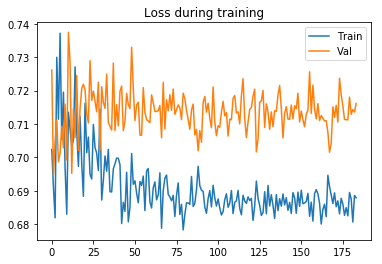

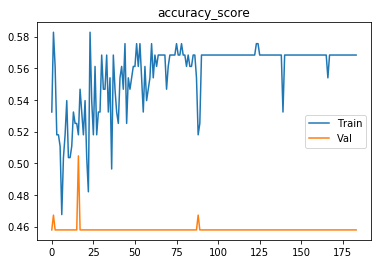

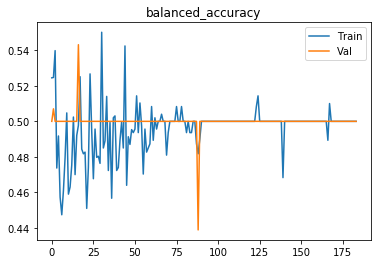

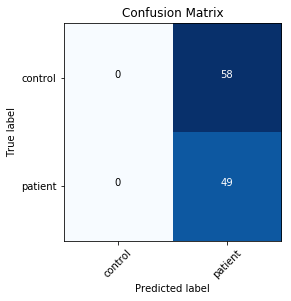

###### Starting inner fold 3
{'model': 'ModelLiu', 'batch_size': 6, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.69622
[0,     4] loss: 0.64346
[0,     6] loss: 0.73938
[0,     8] loss: 0.81656
[0,    10] loss: 0.71210
[0,    12] loss: 0.67258
[0,    14] loss: 0.72336
[0,    16] loss: 0.72344
[0,    18] loss: 0.65666
[0,    20] loss: 0.67449
[0,    22] loss: 0.54397
Time elapsed: 0h:0m:2s
train accuracy_score: 56.12 %
train balanced_accuracy: 54.38 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.781977
[1,     2] loss: 0.59248
[1,     4] loss: 0.67909
[1,     6] loss: 0.73573
[1,     8] loss: 0.82088
[1,    10] loss: 0.70312
[1,    12] loss: 0.56081
[1,    14] loss: 0.69505
[1,    16] loss: 0.78498
[1,    18] loss: 0.67861
[1,    20] loss: 0.63948
[1,    22] loss: 0.75013
Time elapsed: 0h:0m:5s
train accuracy_score: 56.12 %
train balanced_accuracy: 49.97 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss:

[18,     8] loss: 0.67459
[18,    10] loss: 0.82111
[18,    12] loss: 0.69271
[18,    14] loss: 0.61594
[18,    16] loss: 0.60358
[18,    18] loss: 0.75838
[18,    20] loss: 0.68763
[18,    22] loss: 0.73897
Time elapsed: 0h:1m:3s
train accuracy_score: 54.68 %
train balanced_accuracy: 50.51 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.721586
[19,     2] loss: 0.70610
[19,     4] loss: 0.71470
[19,     6] loss: 0.63971
[19,     8] loss: 0.73701
[19,    10] loss: 0.67505
[19,    12] loss: 0.64031
[19,    14] loss: 0.71406
[19,    16] loss: 0.68602
[19,    18] loss: 0.68073
[19,    20] loss: 0.78446
[19,    22] loss: 0.66407
Time elapsed: 0h:1m:7s
train accuracy_score: 53.24 %
train balanced_accuracy: 48.24 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.717671
[20,     2] loss: 0.68402
[20,     4] loss: 0.75635
[20,     6] loss: 0.68976
[20,     8] loss: 0.68211
[20,    10] loss: 0.70837
[20,    12] loss: 0.69473
[20,    14] loss: 0.62

[36,    18] loss: 0.67305
[36,    20] loss: 0.66323
[36,    22] loss: 0.68721
Time elapsed: 0h:2m:6s
train accuracy_score: 54.68 %
train balanced_accuracy: 48.30 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.716820
[37,     2] loss: 0.65384
[37,     4] loss: 0.67773
[37,     6] loss: 0.69897
[37,     8] loss: 0.71934
[37,    10] loss: 0.68025
[37,    12] loss: 0.68474
[37,    14] loss: 0.69662
[37,    16] loss: 0.73034
[37,    18] loss: 0.62027
[37,    20] loss: 0.73229
[37,    22] loss: 0.72669
Time elapsed: 0h:2m:9s
train accuracy_score: 52.52 %
train balanced_accuracy: 47.20 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.704341
[38,     2] loss: 0.66761
[38,     4] loss: 0.71463
[38,     6] loss: 0.68342
[38,     8] loss: 0.72352
[38,    10] loss: 0.75061
[38,    12] loss: 0.73664
[38,    14] loss: 0.70811
[38,    16] loss: 0.69334
[38,    18] loss: 0.70999
[38,    20] loss: 0.70210
[38,    22] loss: 0.63671
Time elapsed: 0h:2m:13

Time elapsed: 0h:3m:3s
train accuracy_score: 56.83 %
train balanced_accuracy: 50.60 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.711815
[55,     2] loss: 0.70838
[55,     4] loss: 0.72889
[55,     6] loss: 0.66616
[55,     8] loss: 0.70250
[55,    10] loss: 0.67450
[55,    12] loss: 0.68198
[55,    14] loss: 0.67271
[55,    16] loss: 0.69900
[55,    18] loss: 0.65729
[55,    20] loss: 0.64007
[55,    22] loss: 0.66131
Time elapsed: 0h:3m:6s
train accuracy_score: 58.99 %
train balanced_accuracy: 53.10 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.718002
[56,     2] loss: 0.64484
[56,     4] loss: 0.75268
[56,     6] loss: 0.63504
[56,     8] loss: 0.73282
[56,    10] loss: 0.68159
[56,    12] loss: 0.72164
[56,    14] loss: 0.75208
[56,    16] loss: 0.56680
[56,    18] loss: 0.68480
[56,    20] loss: 0.67036
[56,    22] loss: 0.66321
Time elapsed: 0h:3m:9s
train accuracy_score: 56.83 %
train balanced_accuracy: 50.00 %
val accuracy_s

val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.709862
[73,     2] loss: 0.64450
[73,     4] loss: 0.67741
[73,     6] loss: 0.65240
[73,     8] loss: 0.67297
[73,    10] loss: 0.75252
[73,    12] loss: 0.70996
[73,    14] loss: 0.66693
[73,    16] loss: 0.66860
[73,    18] loss: 0.70678
[73,    20] loss: 0.74180
[73,    22] loss: 0.71619
Time elapsed: 0h:4m:7s
train accuracy_score: 56.83 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.712743
[74,     2] loss: 0.71312
[74,     4] loss: 0.69684
[74,     6] loss: 0.71111
[74,     8] loss: 0.70558
[74,    10] loss: 0.64281
[74,    12] loss: 0.66193
[74,    14] loss: 0.71546
[74,    16] loss: 0.69538
[74,    18] loss: 0.65123
[74,    20] loss: 0.65152
[74,    22] loss: 0.68747
Time elapsed: 0h:4m:10s
train accuracy_score: 55.40 %
train balanced_accuracy: 48.73 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.712780
[75,     2] loss: 0.5

[91,     2] loss: 0.68300
[91,     4] loss: 0.62461
[91,     6] loss: 0.64459
[91,     8] loss: 0.60811
[91,    10] loss: 0.74830
[91,    12] loss: 0.82908
[91,    14] loss: 0.74293
[91,    16] loss: 0.69423
[91,    18] loss: 0.65186
[91,    20] loss: 0.75025
[91,    22] loss: 0.66907
Time elapsed: 0h:5m:7s
train accuracy_score: 56.83 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.726146
[92,     2] loss: 0.72606
[92,     4] loss: 0.69881
[92,     6] loss: 0.70749
[92,     8] loss: 0.75128
[92,    10] loss: 0.72461
[92,    12] loss: 0.66146
[92,    14] loss: 0.65625
[92,    16] loss: 0.66223
[92,    18] loss: 0.65078
[92,    20] loss: 0.72589
[92,    22] loss: 0.66443
Time elapsed: 0h:5m:10s
train accuracy_score: 55.40 %
train balanced_accuracy: 48.73 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.716480
[93,     2] loss: 0.67343
[93,     4] loss: 0.67778
[93,     6] loss: 0.67677
[93,     8] loss: 0.7

[109,     2] loss: 0.66186
[109,     4] loss: 0.70769
[109,     6] loss: 0.63596
[109,     8] loss: 0.80130
[109,    10] loss: 0.70062
[109,    12] loss: 0.62108
[109,    14] loss: 0.71916
[109,    16] loss: 0.68293
[109,    18] loss: 0.69131
[109,    20] loss: 0.65256
[109,    22] loss: 0.65615
Time elapsed: 0h:6m:7s
train accuracy_score: 57.55 %
train balanced_accuracy: 50.83 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.715185
[110,     2] loss: 0.72951
[110,     4] loss: 0.70417
[110,     6] loss: 0.67502
[110,     8] loss: 0.70065
[110,    10] loss: 0.69463
[110,    12] loss: 0.64565
[110,    14] loss: 0.72930
[110,    16] loss: 0.68945
[110,    18] loss: 0.66288
[110,    20] loss: 0.66359
[110,    22] loss: 0.65439
Time elapsed: 0h:6m:10s
train accuracy_score: 56.12 %
train balanced_accuracy: 49.77 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.706149
[111,     2] loss: 0.69864
[111,     4] loss: 0.70288
[111,     6] loss: 0.64

val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.714599
[127,     2] loss: 0.66343
[127,     4] loss: 0.75424
[127,     6] loss: 0.65119
[127,     8] loss: 0.65531
[127,    10] loss: 0.67502
[127,    12] loss: 0.69193
[127,    14] loss: 0.66181
[127,    16] loss: 0.69961
[127,    18] loss: 0.79219
[127,    20] loss: 0.65221
[127,    22] loss: 0.66532
Time elapsed: 0h:7m:3s
train accuracy_score: 56.83 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.723158
[128,     2] loss: 0.68253
[128,     4] loss: 0.80366
[128,     6] loss: 0.67372
[128,     8] loss: 0.69951
[128,    10] loss: 0.68928
[128,    12] loss: 0.69576
[128,    14] loss: 0.64673
[128,    16] loss: 0.67867
[128,    18] loss: 0.72815
[128,    20] loss: 0.65643
[128,    22] loss: 0.63848
Time elapsed: 0h:7m:6s
train accuracy_score: 56.12 %
train balanced_accuracy: 49.37 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.706714


[144,    22] loss: 0.67552
Time elapsed: 0h:7m:57s
train accuracy_score: 56.83 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.713634
[145,     2] loss: 0.71680
[145,     4] loss: 0.69345
[145,     6] loss: 0.77114
[145,     8] loss: 0.59229
[145,    10] loss: 0.63801
[145,    12] loss: 0.63516
[145,    14] loss: 0.70946
[145,    16] loss: 0.66695
[145,    18] loss: 0.69444
[145,    20] loss: 0.67786
[145,    22] loss: 0.73115
Time elapsed: 0h:8m:1s
train accuracy_score: 56.83 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.720773
[146,     2] loss: 0.71152
[146,     4] loss: 0.61820
[146,     6] loss: 0.63168
[146,     8] loss: 0.68339
[146,    10] loss: 0.70953
[146,    12] loss: 0.69878
[146,    14] loss: 0.74853
[146,    16] loss: 0.66661
[146,    18] loss: 0.65010
[146,    20] loss: 0.65472
[146,    22] loss: 0.70065
Time elapsed: 0h:8m:4s
train accuracy_score: 56.83

[162,    16] loss: 0.74830
[162,    18] loss: 0.71000
[162,    20] loss: 0.65211
[162,    22] loss: 0.67099
Time elapsed: 0h:8m:59s
train accuracy_score: 56.83 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.704690
[163,     2] loss: 0.68740
[163,     4] loss: 0.66653
[163,     6] loss: 0.67874
[163,     8] loss: 0.67138
[163,    10] loss: 0.68947
[163,    12] loss: 0.61667
[163,    14] loss: 0.67278
[163,    16] loss: 0.72162
[163,    18] loss: 0.70811
[163,    20] loss: 0.71180
[163,    22] loss: 0.73064
Time elapsed: 0h:9m:2s
train accuracy_score: 56.83 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.709866
[164,     2] loss: 0.73254
[164,     4] loss: 0.71291
[164,     6] loss: 0.70017
[164,     8] loss: 0.67534
[164,    10] loss: 0.70477
[164,    12] loss: 0.70687
[164,    14] loss: 0.67846
[164,    16] loss: 0.66477
[164,    18] loss: 0.71609
[164,    20] loss: 0.63

[180,     8] loss: 0.62928
[180,    10] loss: 0.68363
[180,    12] loss: 0.69957
[180,    14] loss: 0.67618
[180,    16] loss: 0.74605
[180,    18] loss: 0.78477
[180,    20] loss: 0.81929
[180,    22] loss: 0.60899
Time elapsed: 0h:10m:1s
train accuracy_score: 56.83 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.728580
[181,     2] loss: 0.66749
[181,     4] loss: 0.65426
[181,     6] loss: 0.65471
[181,     8] loss: 0.64922
[181,    10] loss: 0.68254
[181,    12] loss: 0.80006
[181,    14] loss: 0.77626
[181,    16] loss: 0.73930
[181,    18] loss: 0.64240
[181,    20] loss: 0.64653
[181,    22] loss: 0.64195
Time elapsed: 0h:10m:4s
train accuracy_score: 56.83 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.719828
[182,     2] loss: 0.63115
[182,     4] loss: 0.64064
[182,     6] loss: 0.64598
[182,     8] loss: 0.72431
[182,    10] loss: 0.66952
[182,    12] loss: 0.6

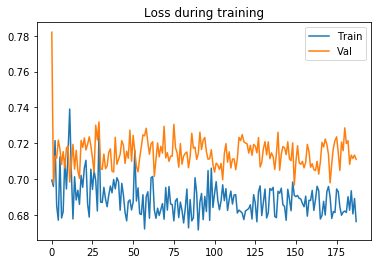

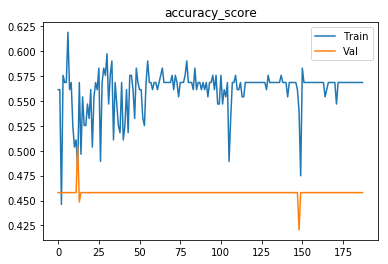

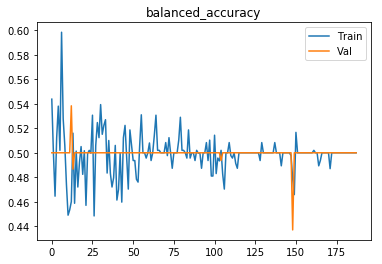

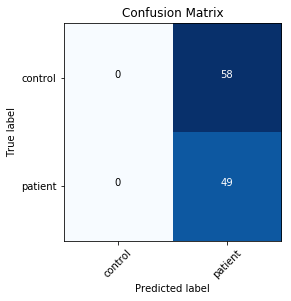

###### Starting inner fold 4
{'model': 'ModelLiu', 'batch_size': 4, 'patience': 12, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.73435
[0,     4] loss: 0.65249
[0,     6] loss: 0.66337
[0,     8] loss: 0.64068
[0,    10] loss: 0.72931
[0,    12] loss: 0.74557
[0,    14] loss: 0.62841
[0,    16] loss: 0.78921
[0,    18] loss: 0.68602
[0,    20] loss: 0.80678
[0,    22] loss: 0.66557
[0,    24] loss: 0.92597
[0,    26] loss: 0.63685
[0,    28] loss: 0.91165
[0,    30] loss: 0.66787
[0,    32] loss: 0.79813
[0,    34] loss: 0.67799
Time elapsed: 0h:0m:2s
train accuracy_score: 51.80 %
train balanced_accuracy: 47.57 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.699702
[1,     2] loss: 0.66799
[1,     4] loss: 0.67074
[1,     6] loss: 0.58036
[1,     8] loss: 0.68845
[1,    10] loss: 0.84959
[1,    12] loss: 0.75294
[1,    14] loss: 0.49783
[1,    16] loss: 0.69194
[1,    18] loss: 0.76527
[1,    20] loss: 0.73655
[1,    22] loss: 0.74575
[1, 

[13,    34] loss: 0.68919
Time elapsed: 0h:0m:43s
train accuracy_score: 54.68 %
train balanced_accuracy: 50.71 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.723715
[14,     2] loss: 0.68103
[14,     4] loss: 0.63599
[14,     6] loss: 0.71902
[14,     8] loss: 0.78567
[14,    10] loss: 0.77696
[14,    12] loss: 0.80795
[14,    14] loss: 0.66868
[14,    16] loss: 0.68361
[14,    18] loss: 0.76922
[14,    20] loss: 0.70676
[14,    22] loss: 0.74559
[14,    24] loss: 0.66786
[14,    26] loss: 0.64833
[14,    28] loss: 0.73600
[14,    30] loss: 0.73045
[14,    32] loss: 0.72412
[14,    34] loss: 0.59623
Time elapsed: 0h:0m:46s
train accuracy_score: 50.36 %
train balanced_accuracy: 46.91 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.729282
[15,     2] loss: 0.76693
[15,     4] loss: 0.79713
[15,     6] loss: 0.72419
[15,     8] loss: 0.70300
[15,    10] loss: 0.96076
[15,    12] loss: 0.76980
[15,    14] loss: 0.77639
[15,    16] loss: 0.

[27,    16] loss: 0.67624
[27,    18] loss: 0.61603
[27,    20] loss: 0.63251
[27,    22] loss: 0.66600
[27,    24] loss: 0.78647
[27,    26] loss: 0.67179
[27,    28] loss: 0.80214
[27,    30] loss: 0.61896
[27,    32] loss: 0.71654
[27,    34] loss: 0.59828
Time elapsed: 0h:1m:29s
train accuracy_score: 56.12 %
train balanced_accuracy: 51.17 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.705837
[28,     2] loss: 0.65851
[28,     4] loss: 0.68609
[28,     6] loss: 0.69565
[28,     8] loss: 0.62171
[28,    10] loss: 0.75698
[28,    12] loss: 0.67699
[28,    14] loss: 0.65033
[28,    16] loss: 0.77237
[28,    18] loss: 0.75301
[28,    20] loss: 0.65540
[28,    22] loss: 0.62756
[28,    24] loss: 0.62719
[28,    26] loss: 0.68153
[28,    28] loss: 0.68098
[28,    30] loss: 0.72826
[28,    32] loss: 0.65829
[28,    34] loss: 0.79092
Time elapsed: 0h:1m:32s
train accuracy_score: 57.55 %
train balanced_accuracy: 52.64 %
val accuracy_score: 45.79 %
val balanced_accur

val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.715759
[41,     2] loss: 0.73014
[41,     4] loss: 0.70085
[41,     6] loss: 0.68417
[41,     8] loss: 0.87977
[41,    10] loss: 0.78683
[41,    12] loss: 0.63334
[41,    14] loss: 0.64084
[41,    16] loss: 0.58892
[41,    18] loss: 0.71618
[41,    20] loss: 0.68159
[41,    22] loss: 0.62902
[41,    24] loss: 0.71481
[41,    26] loss: 0.62715
[41,    28] loss: 0.72373
[41,    30] loss: 0.73778
[41,    32] loss: 0.62907
[41,    34] loss: 0.67411
Time elapsed: 0h:2m:16s
train accuracy_score: 57.55 %
train balanced_accuracy: 51.23 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.723246
[42,     2] loss: 0.69972
[42,     4] loss: 0.75650
[42,     6] loss: 0.69711
[42,     8] loss: 0.71454
[42,    10] loss: 0.65890
[42,    12] loss: 0.64189
[42,    14] loss: 0.65645
[42,    16] loss: 0.73110
[42,    18] loss: 0.67186
[42,    20] loss: 0.62550
[42,    22] loss: 0.85155
[42,    24] loss: 0.58355
[42

[54,    22] loss: 0.72858
[54,    24] loss: 0.65867
[54,    26] loss: 0.68306
[54,    28] loss: 0.68064
[54,    30] loss: 0.64407
[54,    32] loss: 0.66446
[54,    34] loss: 0.72548
Time elapsed: 0h:3m:0s
train accuracy_score: 53.24 %
train balanced_accuracy: 48.44 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.709771
[55,     2] loss: 0.69837
[55,     4] loss: 0.60444
[55,     6] loss: 0.77127
[55,     8] loss: 0.73352
[55,    10] loss: 0.67585
[55,    12] loss: 0.62808
[55,    14] loss: 0.62018
[55,    16] loss: 0.67095
[55,    18] loss: 0.70786
[55,    20] loss: 0.61833
[55,    22] loss: 0.63283
[55,    24] loss: 0.77374
[55,    26] loss: 0.76518
[55,    28] loss: 0.73481
[55,    30] loss: 0.62456
[55,    32] loss: 0.70358
[55,    34] loss: 0.77268
Time elapsed: 0h:3m:3s
train accuracy_score: 57.55 %
train balanced_accuracy: 51.23 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.720759
[56,     2] loss: 0.64567
[56,     4] loss: 0.61

[68,     2] loss: 0.78098
[68,     4] loss: 0.68586
[68,     6] loss: 0.69882
[68,     8] loss: 0.62048
[68,    10] loss: 0.70375
[68,    12] loss: 0.63410
[68,    14] loss: 0.74082
[68,    16] loss: 0.71591
[68,    18] loss: 0.61703
[68,    20] loss: 0.66296
[68,    22] loss: 0.72660
[68,    24] loss: 0.78248
[68,    26] loss: 0.62308
[68,    28] loss: 0.59773
[68,    30] loss: 0.68793
[68,    32] loss: 0.67310
[68,    34] loss: 0.64079
Time elapsed: 0h:3m:41s
train accuracy_score: 60.43 %
train balanced_accuracy: 54.97 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.711593
[69,     2] loss: 0.67314
[69,     4] loss: 0.68344
[69,     6] loss: 0.78384
[69,     8] loss: 0.68671
[69,    10] loss: 0.65192
[69,    12] loss: 0.66750
[69,    14] loss: 0.66262
[69,    16] loss: 0.66909
[69,    18] loss: 0.80781
[69,    20] loss: 0.65736
[69,    22] loss: 0.66011
[69,    24] loss: 0.68103
[69,    26] loss: 0.73377
[69,    28] loss: 0.70485
[69,    30] loss: 0.68865
[69

[81,    30] loss: 0.78446
[81,    32] loss: 0.69018
[81,    34] loss: 0.78091
Time elapsed: 0h:4m:21s
train accuracy_score: 55.40 %
train balanced_accuracy: 48.93 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.720788
[82,     2] loss: 0.58314
[82,     4] loss: 0.64541
[82,     6] loss: 0.78360
[82,     8] loss: 0.81881
[82,    10] loss: 0.61186
[82,    12] loss: 0.74518
[82,    14] loss: 0.68444
[82,    16] loss: 0.73711
[82,    18] loss: 0.66014
[82,    20] loss: 0.68885
[82,    22] loss: 0.73839
[82,    24] loss: 0.69539
[82,    26] loss: 0.64363
[82,    28] loss: 0.68160
[82,    30] loss: 0.73643
[82,    32] loss: 0.68428
[82,    34] loss: 0.68477
Time elapsed: 0h:4m:24s
train accuracy_score: 55.40 %
train balanced_accuracy: 48.73 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.704414
[83,     2] loss: 0.70235
[83,     4] loss: 0.64373
[83,     6] loss: 0.70438
[83,     8] loss: 0.69768
[83,    10] loss: 0.68639
[83,    12] loss: 0.

[95,    12] loss: 0.71415
[95,    14] loss: 0.71550
[95,    16] loss: 0.70171
[95,    18] loss: 0.61512
[95,    20] loss: 0.69816
[95,    22] loss: 0.65891
[95,    24] loss: 0.65885
[95,    26] loss: 0.67129
[95,    28] loss: 0.65505
[95,    30] loss: 0.70331
[95,    32] loss: 0.78970
[95,    34] loss: 0.68861
Time elapsed: 0h:5m:4s
train accuracy_score: 56.83 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.712300
[96,     2] loss: 0.70121
[96,     4] loss: 0.75577
[96,     6] loss: 0.70150
[96,     8] loss: 0.73528
[96,    10] loss: 0.70030
[96,    12] loss: 0.72422
[96,    14] loss: 0.66583
[96,    16] loss: 0.65229
[96,    18] loss: 0.65122
[96,    20] loss: 0.70753
[96,    22] loss: 0.67313
[96,    24] loss: 0.66659
[96,    26] loss: 0.66617
[96,    28] loss: 0.70697
[96,    30] loss: 0.63026
[96,    32] loss: 0.65625
[96,    34] loss: 0.65707
Time elapsed: 0h:5m:7s
train accuracy_score: 58.27 %
train balanced_accuracy: 51.6

[108,    32] loss: 0.68931
[108,    34] loss: 0.67829
Time elapsed: 0h:5m:44s
train accuracy_score: 56.12 %
train balanced_accuracy: 49.37 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.705436
[109,     2] loss: 0.68398
[109,     4] loss: 0.65796
[109,     6] loss: 0.70905
[109,     8] loss: 0.72061
[109,    10] loss: 0.66911
[109,    12] loss: 0.68851
[109,    14] loss: 0.66140
[109,    16] loss: 0.66153
[109,    18] loss: 0.71802
[109,    20] loss: 0.69888
[109,    22] loss: 0.72207
[109,    24] loss: 0.68495
[109,    26] loss: 0.67501
[109,    28] loss: 0.69759
[109,    30] loss: 0.72954
[109,    32] loss: 0.63374
[109,    34] loss: 0.65533
Time elapsed: 0h:5m:47s
train accuracy_score: 56.12 %
train balanced_accuracy: 49.57 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.703416
[110,     2] loss: 0.69215
[110,     4] loss: 0.62783
[110,     6] loss: 0.71904
[110,     8] loss: 0.73000
[110,    10] loss: 0.68949
[110,    12] loss: 0.6

val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.712386
[122,     2] loss: 0.69157
[122,     4] loss: 0.70425
[122,     6] loss: 0.65698
[122,     8] loss: 0.64299
[122,    10] loss: 0.68170
[122,    12] loss: 0.63920
[122,    14] loss: 0.68362
[122,    16] loss: 0.58522
[122,    18] loss: 0.75161
[122,    20] loss: 0.81376
[122,    22] loss: 0.69629
[122,    24] loss: 0.66958
[122,    26] loss: 0.76104
[122,    28] loss: 0.57436
[122,    30] loss: 0.59390
[122,    32] loss: 0.77273
[122,    34] loss: 0.66003
Time elapsed: 0h:6m:27s
train accuracy_score: 56.12 %
train balanced_accuracy: 49.37 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.716193
[123,     2] loss: 0.66493
[123,     4] loss: 0.66056
[123,     6] loss: 0.59880
[123,     8] loss: 0.76237
[123,    10] loss: 0.71516
[123,    12] loss: 0.65381
[123,    14] loss: 0.72887
[123,    16] loss: 0.67530
[123,    18] loss: 0.61209
[123,    20] loss: 0.65306
[123,    22] loss: 0.76245
[

[135,    12] loss: 0.67866
[135,    14] loss: 0.71995
[135,    16] loss: 0.67634
[135,    18] loss: 0.69160
[135,    20] loss: 0.73452
[135,    22] loss: 0.60889
[135,    24] loss: 0.63615
[135,    26] loss: 0.71668
[135,    28] loss: 0.62814
[135,    30] loss: 0.64422
[135,    32] loss: 0.70166
[135,    34] loss: 0.78344
Time elapsed: 0h:7m:6s
train accuracy_score: 56.83 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.716561
[136,     2] loss: 0.76193
[136,     4] loss: 0.77845
[136,     6] loss: 0.60496
[136,     8] loss: 0.69934
[136,    10] loss: 0.64238
[136,    12] loss: 0.71102
[136,    14] loss: 0.70147
[136,    16] loss: 0.67710
[136,    18] loss: 0.69741
[136,    20] loss: 0.64532
[136,    22] loss: 0.68495
[136,    24] loss: 0.67749
[136,    26] loss: 0.73476
[136,    28] loss: 0.69309
[136,    30] loss: 0.66693
[136,    32] loss: 0.61279
[136,    34] loss: 0.67725
Time elapsed: 0h:7m:9s
train accuracy_score: 56.83 %


[148,    20] loss: 0.67991
[148,    22] loss: 0.70504
[148,    24] loss: 0.67979
[148,    26] loss: 0.74297
[148,    28] loss: 0.80947
[148,    30] loss: 0.69902
[148,    32] loss: 0.68421
[148,    34] loss: 0.70425
Time elapsed: 0h:7m:46s
train accuracy_score: 56.83 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.713377
[149,     2] loss: 0.68866
[149,     4] loss: 0.78970
[149,     6] loss: 0.65428
[149,     8] loss: 0.77206
[149,    10] loss: 0.68547
[149,    12] loss: 0.62224
[149,    14] loss: 0.67881
[149,    16] loss: 0.68114
[149,    18] loss: 0.72051
[149,    20] loss: 0.70708
[149,    22] loss: 0.62155
[149,    24] loss: 0.68393
[149,    26] loss: 0.63559
[149,    28] loss: 0.68785
[149,    30] loss: 0.62210
[149,    32] loss: 0.74718
[149,    34] loss: 0.72148
Time elapsed: 0h:7m:49s
train accuracy_score: 56.83 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.71

[161,    32] loss: 0.64243
[161,    34] loss: 0.73313
Time elapsed: 0h:8m:24s
train accuracy_score: 56.83 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.711468
[162,     2] loss: 0.63185
[162,     4] loss: 0.62897
[162,     6] loss: 0.69955
[162,     8] loss: 0.71148
[162,    10] loss: 0.67954
[162,    12] loss: 0.57617
[162,    14] loss: 0.71623
[162,    16] loss: 0.76120
[162,    18] loss: 0.68118
[162,    20] loss: 0.65675
[162,    22] loss: 0.71798
[162,    24] loss: 0.70104
[162,    26] loss: 0.66881
[162,    28] loss: 0.76478
[162,    30] loss: 0.65961
[162,    32] loss: 0.69032
[162,    34] loss: 0.77716
Time elapsed: 0h:8m:27s
train accuracy_score: 56.83 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.716724
[163,     2] loss: 0.79159
[163,     4] loss: 0.71056
[163,     6] loss: 0.72385
[163,     8] loss: 0.71791
[163,    10] loss: 0.69580
[163,    12] loss: 0.6

val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.712276
[175,     2] loss: 0.73971
[175,     4] loss: 0.65131
[175,     6] loss: 0.62652
[175,     8] loss: 0.66959
[175,    10] loss: 0.62787
[175,    12] loss: 0.65361
[175,    14] loss: 0.70990
[175,    16] loss: 0.70823
[175,    18] loss: 0.77229
[175,    20] loss: 0.60614
[175,    22] loss: 0.72899
[175,    24] loss: 0.63933
[175,    26] loss: 0.61425
[175,    28] loss: 0.66271
[175,    30] loss: 0.73816
[175,    32] loss: 0.76527
[175,    34] loss: 0.66438
Time elapsed: 0h:9m:6s
train accuracy_score: 56.83 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.722085
[176,     2] loss: 0.67873
[176,     4] loss: 0.71731
[176,     6] loss: 0.76409
[176,     8] loss: 0.60774
[176,    10] loss: 0.66493
[176,    12] loss: 0.68129
[176,    14] loss: 0.68305
[176,    16] loss: 0.60170
[176,    18] loss: 0.72471
[176,    20] loss: 0.59883
[176,    22] loss: 0.81788
[1

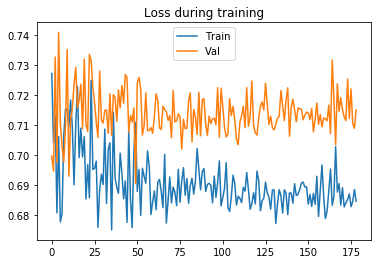

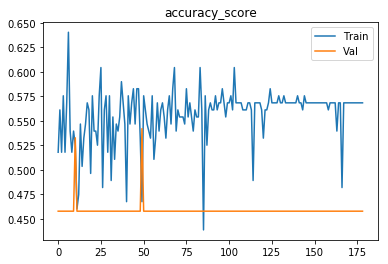

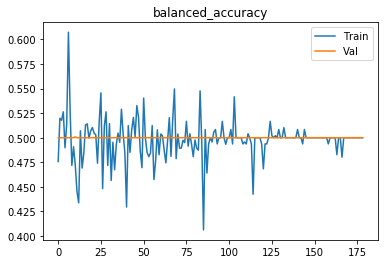

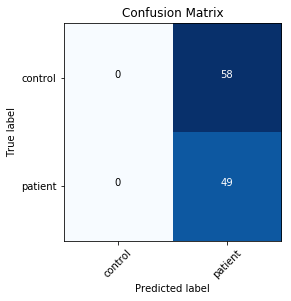

Finished outer fold.
{'final_acc': 0.5, 'best_acc': 0.5, 'final_iter': 169, 'best_iter': 169, 'params': {'model': 'ModelLiu', 'batch_size': 6, 'patience': 16, 'lr': 0.001}, 'inner_fold_idx': 0}
###### Starting outer fold 1
# of patients 109, # of healthy controls 125
139
95
###### Starting inner fold 0
{'model': 'ModelLiu', 'batch_size': 4, 'patience': 12, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.73177
[0,     4] loss: 0.69347
[0,     6] loss: 0.70089
[0,     8] loss: 0.66189
[0,    10] loss: 0.83797
[0,    12] loss: 0.73864
[0,    14] loss: 0.71644
[0,    16] loss: 0.72541
[0,    18] loss: 0.72880
[0,    20] loss: 0.62580
[0,    22] loss: 0.69598
[0,    24] loss: 0.76146
[0,    26] loss: 0.77726
[0,    28] loss: 0.65656
[0,    30] loss: 0.63346
[0,    32] loss: 0.65364
[0,    34] loss: 0.73129
Time elapsed: 0h:0m:2s
train accuracy_score: 48.20 %
train balanced_accuracy: 48.23 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.690786
[1, 

[13,    12] loss: 0.68040
[13,    14] loss: 0.67279
[13,    16] loss: 0.66770
[13,    18] loss: 0.62146
[13,    20] loss: 0.69284
[13,    22] loss: 0.68005
[13,    24] loss: 0.82165
[13,    26] loss: 0.70435
[13,    28] loss: 0.67032
[13,    30] loss: 0.64138
[13,    32] loss: 0.68195
[13,    34] loss: 0.67168
Time elapsed: 0h:0m:38s
train accuracy_score: 57.55 %
train balanced_accuracy: 57.55 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.691247
[14,     2] loss: 0.72976
[14,     4] loss: 0.75849
[14,     6] loss: 0.71326
[14,     8] loss: 0.63961
[14,    10] loss: 0.71318
[14,    12] loss: 0.71660
[14,    14] loss: 0.60665
[14,    16] loss: 0.71839
[14,    18] loss: 0.70802
[14,    20] loss: 0.72675
[14,    22] loss: 0.67435
[14,    24] loss: 0.62050
[14,    26] loss: 0.69064
[14,    28] loss: 0.70374
[14,    30] loss: 0.70798
[14,    32] loss: 0.75403
[14,    34] loss: 0.68149
Time elapsed: 0h:0m:41s
train accuracy_score: 56.12 %
train balanced_accuracy: 56

Time elapsed: 0h:1m:14s
train accuracy_score: 39.57 %
train balanced_accuracy: 39.49 %
val accuracy_score: 42.11 %
val balanced_accuracy: 50.00 %
Val loss: 0.697020
[27,     2] loss: 0.66782
[27,     4] loss: 0.62465
[27,     6] loss: 0.68913
[27,     8] loss: 0.68421
[27,    10] loss: 0.77478
[27,    12] loss: 0.75101
[27,    14] loss: 0.64107
[27,    16] loss: 0.68489
[27,    18] loss: 0.67205
[27,    20] loss: 0.76688
[27,    22] loss: 0.70670
[27,    24] loss: 0.64861
[27,    26] loss: 0.70514
[27,    28] loss: 0.74235
[27,    30] loss: 0.69550
[27,    32] loss: 0.70382
[27,    34] loss: 0.69245
Time elapsed: 0h:1m:17s
train accuracy_score: 50.36 %
train balanced_accuracy: 50.41 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.692208
[28,     2] loss: 0.80501
[28,     4] loss: 0.67084
[28,     6] loss: 0.71737
[28,     8] loss: 0.63786
[28,    10] loss: 0.66740
[28,    12] loss: 0.68035
[28,    14] loss: 0.72082
[28,    16] loss: 0.65682
[28,    18] loss: 0.

[40,    24] loss: 0.70829
[40,    26] loss: 0.73391
[40,    28] loss: 0.74955
[40,    30] loss: 0.67041
[40,    32] loss: 0.76342
[40,    34] loss: 0.66967
Time elapsed: 0h:1m:54s
train accuracy_score: 44.60 %
train balanced_accuracy: 44.63 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.688378
[41,     2] loss: 0.70733
[41,     4] loss: 0.70163
[41,     6] loss: 0.71420
[41,     8] loss: 0.63875
[41,    10] loss: 0.65540
[41,    12] loss: 0.72215
[41,    14] loss: 0.65981
[41,    16] loss: 0.72449
[41,    18] loss: 0.67143
[41,    20] loss: 0.71624
[41,    22] loss: 0.69075
[41,    24] loss: 0.73511
[41,    26] loss: 0.58278
[41,    28] loss: 0.67120
[41,    30] loss: 0.73922
[41,    32] loss: 0.73287
[41,    34] loss: 0.81725
Time elapsed: 0h:1m:56s
train accuracy_score: 50.36 %
train balanced_accuracy: 50.28 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.687033
[42,     2] loss: 0.72532
[42,     4] loss: 0.66825
[42,     6] loss: 0.

[54,     2] loss: 0.76595
[54,     4] loss: 0.70072
[54,     6] loss: 0.72368
[54,     8] loss: 0.69007
[54,    10] loss: 0.68916
[54,    12] loss: 0.69299
[54,    14] loss: 0.66842
[54,    16] loss: 0.73662
[54,    18] loss: 0.65531
[54,    20] loss: 0.68022
[54,    22] loss: 0.74783
[54,    24] loss: 0.70560
[54,    26] loss: 0.69567
[54,    28] loss: 0.68636
[54,    30] loss: 0.76749
[54,    32] loss: 0.74126
[54,    34] loss: 0.75217
Time elapsed: 0h:2m:35s
train accuracy_score: 43.88 %
train balanced_accuracy: 43.93 %
val accuracy_score: 42.11 %
val balanced_accuracy: 50.00 %
Val loss: 0.693703
[55,     2] loss: 0.70263
[55,     4] loss: 0.70298
[55,     6] loss: 0.73723
[55,     8] loss: 0.73910
[55,    10] loss: 0.66526
[55,    12] loss: 0.68355
[55,    14] loss: 0.69732
[55,    16] loss: 0.68578
[55,    18] loss: 0.67736
[55,    20] loss: 0.67928
[55,    22] loss: 0.69276
[55,    24] loss: 0.66529
[55,    26] loss: 0.68623
[55,    28] loss: 0.74900
[55,    30] loss: 0.70832
[55

[67,    30] loss: 0.73748
[67,    32] loss: 0.67439
[67,    34] loss: 0.62048
Time elapsed: 0h:3m:14s
train accuracy_score: 48.20 %
train balanced_accuracy: 48.13 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.692527
[68,     2] loss: 0.71277
[68,     4] loss: 0.67683
[68,     6] loss: 0.67564
[68,     8] loss: 0.70043
[68,    10] loss: 0.72274
[68,    12] loss: 0.68683
[68,    14] loss: 0.66701
[68,    16] loss: 0.71358
[68,    18] loss: 0.74694
[68,    20] loss: 0.70637
[68,    22] loss: 0.63608
[68,    24] loss: 0.67365
[68,    26] loss: 0.64088
[68,    28] loss: 0.70595
[68,    30] loss: 0.69473
[68,    32] loss: 0.71869
[68,    34] loss: 0.68854
Time elapsed: 0h:3m:17s
train accuracy_score: 51.08 %
train balanced_accuracy: 51.00 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.690739
[69,     2] loss: 0.70552
[69,     4] loss: 0.66815
[69,     6] loss: 0.66300
[69,     8] loss: 0.67047
[69,    10] loss: 0.70815
[69,    12] loss: 0.

[81,    12] loss: 0.69378
[81,    14] loss: 0.69348
[81,    16] loss: 0.66516
[81,    18] loss: 0.66679
[81,    20] loss: 0.72402
[81,    22] loss: 0.68893
[81,    24] loss: 0.68297
[81,    26] loss: 0.68369
[81,    28] loss: 0.68636
[81,    30] loss: 0.70476
[81,    32] loss: 0.67352
[81,    34] loss: 0.69227
Time elapsed: 0h:3m:57s
train accuracy_score: 54.68 %
train balanced_accuracy: 54.64 %
val accuracy_score: 42.11 %
val balanced_accuracy: 50.00 %
Val loss: 0.693475
[82,     2] loss: 0.67848
[82,     4] loss: 0.71478
[82,     6] loss: 0.67825
[82,     8] loss: 0.68238
[82,    10] loss: 0.68506
[82,    12] loss: 0.71867
[82,    14] loss: 0.69784
[82,    16] loss: 0.73326
[82,    18] loss: 0.72685
[82,    20] loss: 0.67435
[82,    22] loss: 0.68481
[82,    24] loss: 0.69220
[82,    26] loss: 0.74773
[82,    28] loss: 0.68071
[82,    30] loss: 0.73767
[82,    32] loss: 0.70366
[82,    34] loss: 0.69483
Time elapsed: 0h:4m:0s
train accuracy_score: 44.60 %
train balanced_accuracy: 44.

Time elapsed: 0h:4m:36s
train accuracy_score: 44.60 %
train balanced_accuracy: 44.61 %
val accuracy_score: 42.11 %
val balanced_accuracy: 50.00 %
Val loss: 0.697134
[95,     2] loss: 0.68119
[95,     4] loss: 0.69207
[95,     6] loss: 0.70875
[95,     8] loss: 0.67539
[95,    10] loss: 0.72440
[95,    12] loss: 0.65627
[95,    14] loss: 0.71367
[95,    16] loss: 0.67512
[95,    18] loss: 0.71157
[95,    20] loss: 0.71295
[95,    22] loss: 0.70513
[95,    24] loss: 0.68986
[95,    26] loss: 0.70049
[95,    28] loss: 0.66804
[95,    30] loss: 0.73483
[95,    32] loss: 0.65371
[95,    34] loss: 0.71512
Time elapsed: 0h:4m:39s
train accuracy_score: 49.64 %
train balanced_accuracy: 49.83 %
val accuracy_score: 42.11 %
val balanced_accuracy: 50.00 %
Val loss: 0.697685
[96,     2] loss: 0.69615
[96,     4] loss: 0.68543
[96,     6] loss: 0.71679
[96,     8] loss: 0.71082
[96,    10] loss: 0.71674
[96,    12] loss: 0.68186
[96,    14] loss: 0.71768
[96,    16] loss: 0.72167
[96,    18] loss: 0.

[108,    14] loss: 0.66970
[108,    16] loss: 0.64607
[108,    18] loss: 0.67249
[108,    20] loss: 0.66229
[108,    22] loss: 0.74965
[108,    24] loss: 0.71779
[108,    26] loss: 0.69768
[108,    28] loss: 0.69190
[108,    30] loss: 0.69059
[108,    32] loss: 0.68619
[108,    34] loss: 0.69839
Time elapsed: 0h:5m:16s
train accuracy_score: 56.83 %
train balanced_accuracy: 56.68 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.689099
[109,     2] loss: 0.70468
[109,     4] loss: 0.70669
[109,     6] loss: 0.68430
[109,     8] loss: 0.69047
[109,    10] loss: 0.67023
[109,    12] loss: 0.67054
[109,    14] loss: 0.71817
[109,    16] loss: 0.67421
[109,    18] loss: 0.69199
[109,    20] loss: 0.70781
[109,    22] loss: 0.73211
[109,    24] loss: 0.65303
[109,    26] loss: 0.73771
[109,    28] loss: 0.67313
[109,    30] loss: 0.68316
[109,    32] loss: 0.67461
[109,    34] loss: 0.74518
Time elapsed: 0h:5m:19s
train accuracy_score: 47.48 %
train balanced_accuracy: 

[121,    22] loss: 0.70376
[121,    24] loss: 0.69233
[121,    26] loss: 0.71922
[121,    28] loss: 0.69335
[121,    30] loss: 0.68622
[121,    32] loss: 0.68777
[121,    34] loss: 0.69777
Time elapsed: 0h:5m:52s
train accuracy_score: 48.20 %
train balanced_accuracy: 48.21 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.689581
[122,     2] loss: 0.70678
[122,     4] loss: 0.68701
[122,     6] loss: 0.68140
[122,     8] loss: 0.71258
[122,    10] loss: 0.69130
[122,    12] loss: 0.71409
[122,    14] loss: 0.68634
[122,    16] loss: 0.67999
[122,    18] loss: 0.67083
[122,    20] loss: 0.68532
[122,    22] loss: 0.69291
[122,    24] loss: 0.67892
[122,    26] loss: 0.69073
[122,    28] loss: 0.68383
[122,    30] loss: 0.70779
[122,    32] loss: 0.68829
[122,    34] loss: 0.70135
Time elapsed: 0h:5m:54s
train accuracy_score: 56.83 %
train balanced_accuracy: 56.84 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.692919
[123,     2] loss: 0.7

Time elapsed: 0h:6m:27s
train accuracy_score: 45.32 %
train balanced_accuracy: 45.38 %
val accuracy_score: 42.11 %
val balanced_accuracy: 50.00 %
Val loss: 0.695298
[135,     2] loss: 0.68678
[135,     4] loss: 0.69875
[135,     6] loss: 0.69055
[135,     8] loss: 0.69314
[135,    10] loss: 0.69559
[135,    12] loss: 0.69872
[135,    14] loss: 0.70686
[135,    16] loss: 0.68537
[135,    18] loss: 0.70450
[135,    20] loss: 0.70259
[135,    22] loss: 0.68013
[135,    24] loss: 0.68370
[135,    26] loss: 0.69078
[135,    28] loss: 0.70223
[135,    30] loss: 0.70270
[135,    32] loss: 0.71706
[135,    34] loss: 0.69508
Time elapsed: 0h:6m:30s
train accuracy_score: 49.64 %
train balanced_accuracy: 49.55 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.691181
[136,     2] loss: 0.70302
[136,     4] loss: 0.68773
[136,     6] loss: 0.72536
[136,     8] loss: 0.68485
[136,    10] loss: 0.68814
[136,    12] loss: 0.68334
[136,    14] loss: 0.70646
[136,    16] loss: 0.6

val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.691261
[148,     2] loss: 0.70815
[148,     4] loss: 0.68817
[148,     6] loss: 0.71281
[148,     8] loss: 0.71788
[148,    10] loss: 0.69505
[148,    12] loss: 0.69179
[148,    14] loss: 0.68871
[148,    16] loss: 0.70517
[148,    18] loss: 0.70616
[148,    20] loss: 0.69817
[148,    22] loss: 0.71262
[148,    24] loss: 0.68336
[148,    26] loss: 0.71866
[148,    28] loss: 0.70384
[148,    30] loss: 0.70381
[148,    32] loss: 0.70383
[148,    34] loss: 0.69333
Time elapsed: 0h:7m:7s
train accuracy_score: 41.73 %
train balanced_accuracy: 41.76 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.690961
[149,     2] loss: 0.69545
[149,     4] loss: 0.68278
[149,     6] loss: 0.70212
[149,     8] loss: 0.73060
[149,    10] loss: 0.65767
[149,    12] loss: 0.61810
[149,    14] loss: 0.68740
[149,    16] loss: 0.69053
[149,    18] loss: 0.75658
[149,    20] loss: 0.77442
[149,    22] loss: 0.66951
[1

[161,    12] loss: 0.67711
[161,    14] loss: 0.68869
[161,    16] loss: 0.70045
[161,    18] loss: 0.70609
[161,    20] loss: 0.69226
[161,    22] loss: 0.69540
[161,    24] loss: 0.69011
[161,    26] loss: 0.68964
[161,    28] loss: 0.67509
[161,    30] loss: 0.70117
[161,    32] loss: 0.69377
[161,    34] loss: 0.70454
Time elapsed: 0h:7m:45s
train accuracy_score: 47.48 %
train balanced_accuracy: 47.36 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.692264
[162,     2] loss: 0.69902
[162,     4] loss: 0.70475
[162,     6] loss: 0.69044
[162,     8] loss: 0.69922
[162,    10] loss: 0.69196
[162,    12] loss: 0.72160
[162,    14] loss: 0.67909
[162,    16] loss: 0.70893
[162,    18] loss: 0.69834
[162,    20] loss: 0.68690
[162,    22] loss: 0.68766
[162,    24] loss: 0.69271
[162,    26] loss: 0.68131
[162,    28] loss: 0.69230
[162,    30] loss: 0.70933
[162,    32] loss: 0.69363
[162,    34] loss: 0.69781
Time elapsed: 0h:7m:48s
train accuracy_score: 44.60 

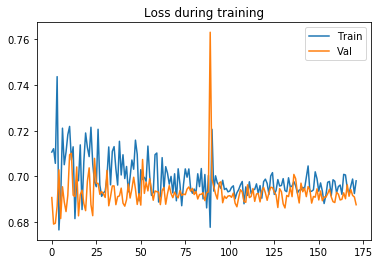

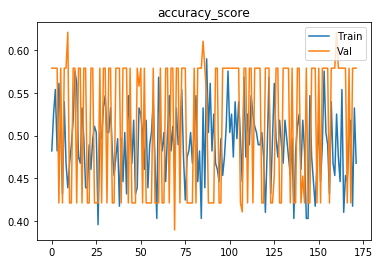

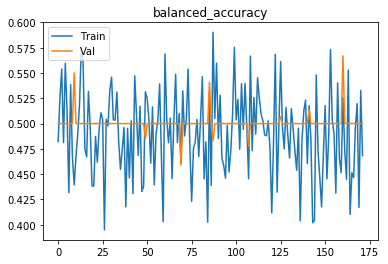

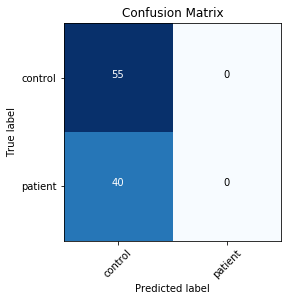

###### Starting inner fold 1
{'model': 'ModelLiu', 'batch_size': 12, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.71099
[0,     4] loss: 0.67306
[0,     6] loss: 0.72698
[0,     8] loss: 0.70778
[0,    10] loss: 0.64906
Time elapsed: 0h:0m:2s
train accuracy_score: 45.32 %
train balanced_accuracy: 45.26 %
val accuracy_score: 42.11 %
val balanced_accuracy: 48.98 %
Val loss: 0.732524
[1,     2] loss: 0.70918
[1,     4] loss: 0.70599
[1,     6] loss: 0.71676
[1,     8] loss: 0.66696
[1,    10] loss: 0.68700
Time elapsed: 0h:0m:5s
train accuracy_score: 46.04 %
train balanced_accuracy: 46.06 %
val accuracy_score: 64.21 %
val balanced_accuracy: 62.27 %
Val loss: 0.682161
[2,     2] loss: 0.67804
[2,     4] loss: 0.73100
[2,     6] loss: 0.65402
[2,     8] loss: 0.75222
[2,    10] loss: 0.76960
Time elapsed: 0h:0m:8s
train accuracy_score: 47.48 %
train balanced_accuracy: 47.27 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.682536


val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.690071
[28,     2] loss: 0.67048
[28,     4] loss: 0.70480
[28,     6] loss: 0.72900
[28,     8] loss: 0.66376
[28,    10] loss: 0.76282
Time elapsed: 0h:1m:31s
train accuracy_score: 50.36 %
train balanced_accuracy: 50.31 %
val accuracy_score: 62.11 %
val balanced_accuracy: 58.07 %
Val loss: 0.691362
[29,     2] loss: 0.72298
[29,     4] loss: 0.71290
[29,     6] loss: 0.71638
[29,     8] loss: 0.68642
[29,    10] loss: 0.74488
Time elapsed: 0h:1m:34s
train accuracy_score: 43.88 %
train balanced_accuracy: 43.90 %
val accuracy_score: 53.68 %
val balanced_accuracy: 51.14 %
Val loss: 0.692675
[30,     2] loss: 0.68367
[30,     4] loss: 0.73660
[30,     6] loss: 0.73237
[30,     8] loss: 0.66402
[30,    10] loss: 0.70274
Time elapsed: 0h:1m:37s
train accuracy_score: 50.36 %
train balanced_accuracy: 50.45 %
val accuracy_score: 42.11 %
val balanced_accuracy: 50.00 %
Val loss: 0.696505
[31,     2] loss: 0.69657
[31,     4]

val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.688651
[56,     2] loss: 0.68355
[56,     4] loss: 0.70446
[56,     6] loss: 0.75789
[56,     8] loss: 0.66891
[56,    10] loss: 0.69405
Time elapsed: 0h:2m:55s
train accuracy_score: 49.64 %
train balanced_accuracy: 49.55 %
val accuracy_score: 42.11 %
val balanced_accuracy: 50.00 %
Val loss: 0.696645
[57,     2] loss: 0.69333
[57,     4] loss: 0.71367
[57,     6] loss: 0.69758
[57,     8] loss: 0.67817
[57,    10] loss: 0.75144
Time elapsed: 0h:2m:58s
train accuracy_score: 46.04 %
train balanced_accuracy: 46.13 %
val accuracy_score: 42.11 %
val balanced_accuracy: 50.00 %
Val loss: 0.701007
[58,     2] loss: 0.70160
[58,     4] loss: 0.68601
[58,     6] loss: 0.69458
[58,     8] loss: 0.66566
[58,    10] loss: 0.68794
Time elapsed: 0h:3m:1s
train accuracy_score: 53.96 %
train balanced_accuracy: 54.00 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.683947
[59,     2] loss: 0.69692
[59,     4] 

val accuracy_score: 51.58 %
val balanced_accuracy: 46.25 %
Val loss: 0.692947
[84,     2] loss: 0.71365
[84,     4] loss: 0.69845
[84,     6] loss: 0.69867
[84,     8] loss: 0.72039
[84,    10] loss: 0.70308
Time elapsed: 0h:4m:19s
train accuracy_score: 38.13 %
train balanced_accuracy: 38.15 %
val accuracy_score: 42.11 %
val balanced_accuracy: 50.00 %
Val loss: 0.700951
[85,     2] loss: 0.69742
[85,     4] loss: 0.65873
[85,     6] loss: 0.70219
[85,     8] loss: 0.70112
[85,    10] loss: 0.70774
Time elapsed: 0h:4m:22s
train accuracy_score: 51.08 %
train balanced_accuracy: 51.19 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.686431
[86,     2] loss: 0.74349
[86,     4] loss: 0.70019
[86,     6] loss: 0.69276
[86,     8] loss: 0.69602
[86,    10] loss: 0.71661
Time elapsed: 0h:4m:25s
train accuracy_score: 45.32 %
train balanced_accuracy: 45.24 %
val accuracy_score: 42.11 %
val balanced_accuracy: 50.00 %
Val loss: 0.698273
[87,     2] loss: 0.72246
[87,     4]

Time elapsed: 0h:5m:41s
train accuracy_score: 47.48 %
train balanced_accuracy: 47.48 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.690118
[112,     2] loss: 0.70751
[112,     4] loss: 0.68513
[112,     6] loss: 0.69678
[112,     8] loss: 0.66906
[112,    10] loss: 0.67718
Time elapsed: 0h:5m:44s
train accuracy_score: 58.99 %
train balanced_accuracy: 58.96 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.689650
[113,     2] loss: 0.71386
[113,     4] loss: 0.71432
[113,     6] loss: 0.69893
[113,     8] loss: 0.68020
[113,    10] loss: 0.68620
Time elapsed: 0h:5m:47s
train accuracy_score: 48.20 %
train balanced_accuracy: 48.03 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.690758
[114,     2] loss: 0.67849
[114,     4] loss: 0.67906
[114,     6] loss: 0.71824
[114,     8] loss: 0.69811
[114,    10] loss: 0.70129
Time elapsed: 0h:5m:50s
train accuracy_score: 48.20 %
train balanced_accuracy: 48.17 %
val accuracy_

[139,     2] loss: 0.69387
[139,     4] loss: 0.70289
[139,     6] loss: 0.70381
[139,     8] loss: 0.70740
[139,    10] loss: 0.68205
Time elapsed: 0h:7m:7s
train accuracy_score: 49.64 %
train balanced_accuracy: 49.53 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.690901
[140,     2] loss: 0.69996
[140,     4] loss: 0.69723
[140,     6] loss: 0.70232
[140,     8] loss: 0.69087
[140,    10] loss: 0.68199
Time elapsed: 0h:7m:10s
train accuracy_score: 50.36 %
train balanced_accuracy: 50.29 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.692936
[141,     2] loss: 0.70479
[141,     4] loss: 0.69742
[141,     6] loss: 0.69399
[141,     8] loss: 0.71787
[141,    10] loss: 0.68777
Time elapsed: 0h:7m:13s
train accuracy_score: 44.60 %
train balanced_accuracy: 44.57 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.691938
[142,     2] loss: 0.69397
[142,     4] loss: 0.69561
[142,     6] loss: 0.71776
[142,     8] loss: 0

[166,    10] loss: 0.69520
Time elapsed: 0h:8m:28s
train accuracy_score: 35.97 %
train balanced_accuracy: 35.94 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.692483
[167,     2] loss: 0.69221
[167,     4] loss: 0.68059
[167,     6] loss: 0.70682
[167,     8] loss: 0.69851
[167,    10] loss: 0.68833
Time elapsed: 0h:8m:31s
train accuracy_score: 55.40 %
train balanced_accuracy: 55.39 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.692525
[168,     2] loss: 0.69967
[168,     4] loss: 0.68904
[168,     6] loss: 0.70065
[168,     8] loss: 0.69199
[168,    10] loss: 0.69956
Time elapsed: 0h:8m:34s
train accuracy_score: 49.64 %
train balanced_accuracy: 49.63 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.692191
[169,     2] loss: 0.68875
[169,     4] loss: 0.69667
[169,     6] loss: 0.69276
[169,     8] loss: 0.70720
[169,    10] loss: 0.68959
Time elapsed: 0h:8m:37s
train accuracy_score: 46.76 %
train balanced_accu

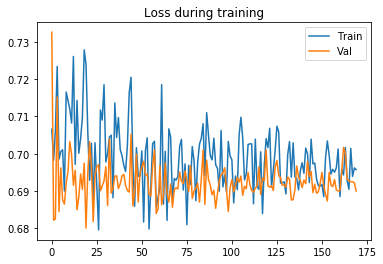

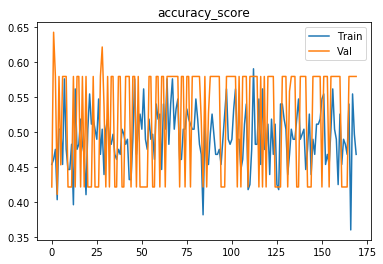

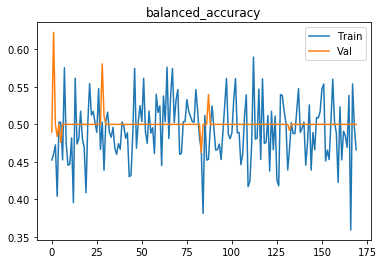

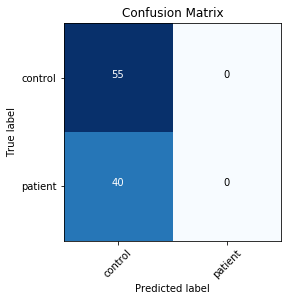

###### Starting inner fold 2
{'model': 'ModelLiu', 'batch_size': 12, 'patience': 12, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.70765
[0,     4] loss: 0.71215
[0,     6] loss: 0.69272
[0,     8] loss: 0.69711
[0,    10] loss: 0.68956
Time elapsed: 0h:0m:2s
train accuracy_score: 51.80 %
train balanced_accuracy: 51.84 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.681678
[1,     2] loss: 0.75537
[1,     4] loss: 0.67246
[1,     6] loss: 0.70891
[1,     8] loss: 0.71617
[1,    10] loss: 0.71577
Time elapsed: 0h:0m:5s
train accuracy_score: 53.24 %
train balanced_accuracy: 53.04 %
val accuracy_score: 42.11 %
val balanced_accuracy: 50.00 %
Val loss: 0.708758
[2,     2] loss: 0.71224
[2,     4] loss: 0.70025
[2,     6] loss: 0.71575
[2,     8] loss: 0.73383
[2,    10] loss: 0.70254
Time elapsed: 0h:0m:8s
train accuracy_score: 46.04 %
train balanced_accuracy: 46.13 %
val accuracy_score: 50.53 %
val balanced_accuracy: 43.98 %
Val loss: 0.693336


val accuracy_score: 42.11 %
val balanced_accuracy: 50.00 %
Val loss: 0.710746
[28,     2] loss: 0.66987
[28,     4] loss: 0.72150
[28,     6] loss: 0.69757
[28,     8] loss: 0.67723
[28,    10] loss: 0.73683
Time elapsed: 0h:1m:26s
train accuracy_score: 50.36 %
train balanced_accuracy: 50.48 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.687373
[29,     2] loss: 0.72626
[29,     4] loss: 0.68134
[29,     6] loss: 0.69477
[29,     8] loss: 0.64964
[29,    10] loss: 0.70320
Time elapsed: 0h:1m:29s
train accuracy_score: 49.64 %
train balanced_accuracy: 49.48 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.685798
[30,     2] loss: 0.72869
[30,     4] loss: 0.70897
[30,     6] loss: 0.64799
[30,     8] loss: 0.67121
[30,    10] loss: 0.71810
Time elapsed: 0h:1m:32s
train accuracy_score: 53.24 %
train balanced_accuracy: 53.17 %
val accuracy_score: 38.95 %
val balanced_accuracy: 46.25 %
Val loss: 0.693393
[31,     2] loss: 0.72459
[31,     4]

val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.689936
[56,     2] loss: 0.67447
[56,     4] loss: 0.68643
[56,     6] loss: 0.70391
[56,     8] loss: 0.70978
[56,    10] loss: 0.66958
Time elapsed: 0h:2m:49s
train accuracy_score: 53.24 %
train balanced_accuracy: 53.18 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.692385
[57,     2] loss: 0.70633
[57,     4] loss: 0.70136
[57,     6] loss: 0.69269
[57,     8] loss: 0.69947
[57,    10] loss: 0.66234
Time elapsed: 0h:2m:52s
train accuracy_score: 49.64 %
train balanced_accuracy: 49.59 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.691373
[58,     2] loss: 0.69047
[58,     4] loss: 0.71441
[58,     6] loss: 0.70052
[58,     8] loss: 0.69033
[58,    10] loss: 0.71543
Time elapsed: 0h:2m:55s
train accuracy_score: 54.68 %
train balanced_accuracy: 54.73 %
val accuracy_score: 42.11 %
val balanced_accuracy: 50.00 %
Val loss: 0.703252
[59,     2] loss: 0.69306
[59,     4]

val accuracy_score: 42.11 %
val balanced_accuracy: 50.00 %
Val loss: 0.695738
[84,     2] loss: 0.70783
[84,     4] loss: 0.74308
[84,     6] loss: 0.71674
[84,     8] loss: 0.71418
[84,    10] loss: 0.70889
Time elapsed: 0h:4m:13s
train accuracy_score: 44.60 %
train balanced_accuracy: 44.69 %
val accuracy_score: 42.11 %
val balanced_accuracy: 50.00 %
Val loss: 0.695296
[85,     2] loss: 0.69096
[85,     4] loss: 0.70688
[85,     6] loss: 0.70315
[85,     8] loss: 0.68776
[85,    10] loss: 0.69365
Time elapsed: 0h:4m:16s
train accuracy_score: 51.08 %
train balanced_accuracy: 51.14 %
val accuracy_score: 42.11 %
val balanced_accuracy: 50.00 %
Val loss: 0.694459
[86,     2] loss: 0.69880
[86,     4] loss: 0.69437
[86,     6] loss: 0.71281
[86,     8] loss: 0.72971
[86,    10] loss: 0.69793
Time elapsed: 0h:4m:20s
train accuracy_score: 46.04 %
train balanced_accuracy: 46.04 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.688049
[87,     2] loss: 0.70026
[87,     4]

Time elapsed: 0h:5m:35s
train accuracy_score: 51.08 %
train balanced_accuracy: 51.05 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.691273
[112,     2] loss: 0.69126
[112,     4] loss: 0.68141
[112,     6] loss: 0.69671
[112,     8] loss: 0.66967
[112,    10] loss: 0.71202
Time elapsed: 0h:5m:37s
train accuracy_score: 56.12 %
train balanced_accuracy: 56.05 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.688949
[113,     2] loss: 0.71937
[113,     4] loss: 0.67943
[113,     6] loss: 0.71862
[113,     8] loss: 0.70561
[113,    10] loss: 0.69697
Time elapsed: 0h:5m:41s
train accuracy_score: 43.17 %
train balanced_accuracy: 43.21 %
val accuracy_score: 42.11 %
val balanced_accuracy: 50.00 %
Val loss: 0.696657
[114,     2] loss: 0.70944
[114,     4] loss: 0.69135
[114,     6] loss: 0.69457
[114,     8] loss: 0.70028
[114,    10] loss: 0.68484
Time elapsed: 0h:5m:44s
train accuracy_score: 45.32 %
train balanced_accuracy: 45.27 %
val accuracy_

[139,     2] loss: 0.72331
[139,     4] loss: 0.70039
[139,     6] loss: 0.68553
[139,     8] loss: 0.71824
[139,    10] loss: 0.67863
Time elapsed: 0h:6m:59s
train accuracy_score: 44.60 %
train balanced_accuracy: 44.67 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.692386
[140,     2] loss: 0.69051
[140,     4] loss: 0.68877
[140,     6] loss: 0.70106
[140,     8] loss: 0.67772
[140,    10] loss: 0.70684
Time elapsed: 0h:7m:2s
train accuracy_score: 51.80 %
train balanced_accuracy: 51.65 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.687191
[141,     2] loss: 0.68688
[141,     4] loss: 0.69904
[141,     6] loss: 0.71434
[141,     8] loss: 0.68779
[141,    10] loss: 0.68991
Time elapsed: 0h:7m:5s
train accuracy_score: 52.52 %
train balanced_accuracy: 52.39 %
val accuracy_score: 56.84 %
val balanced_accuracy: 49.09 %
Val loss: 0.692130
[142,     2] loss: 0.68415
[142,     4] loss: 0.71152
[142,     6] loss: 0.69411
[142,     8] loss: 0.

Finished inner fold.


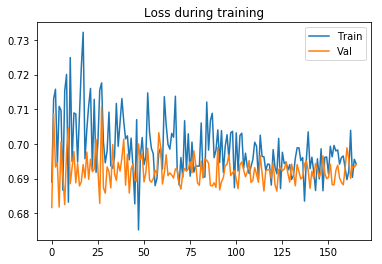

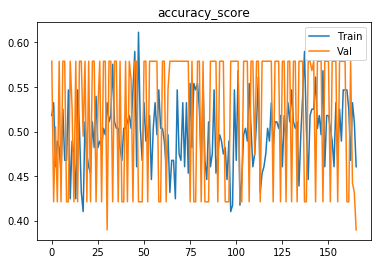

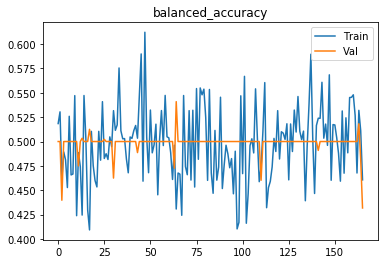

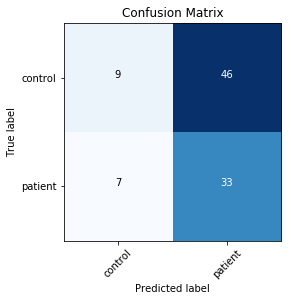

###### Starting inner fold 3
{'model': 'ModelLiu', 'batch_size': 6, 'patience': 12, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.69225
[0,     4] loss: 0.71981
[0,     6] loss: 0.67762
[0,     8] loss: 0.66522
[0,    10] loss: 0.72971
[0,    12] loss: 0.75534
[0,    14] loss: 0.67105
[0,    16] loss: 0.84241
[0,    18] loss: 0.71084
[0,    20] loss: 0.72274
[0,    22] loss: 0.71368
Time elapsed: 0h:0m:2s
train accuracy_score: 46.04 %
train balanced_accuracy: 45.91 %
val accuracy_score: 44.21 %
val balanced_accuracy: 51.48 %
Val loss: 0.695572
[1,     2] loss: 0.72187
[1,     4] loss: 0.66762
[1,     6] loss: 0.70227
[1,     8] loss: 0.71364
[1,    10] loss: 0.75501
[1,    12] loss: 0.56416
[1,    14] loss: 0.71675
[1,    16] loss: 0.75363
[1,    18] loss: 0.65365
[1,    20] loss: 0.66514
[1,    22] loss: 0.69599
Time elapsed: 0h:0m:5s
train accuracy_score: 55.40 %
train balanced_accuracy: 55.56 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss:

[18,     8] loss: 0.71114
[18,    10] loss: 0.68379
[18,    12] loss: 0.68425
[18,    14] loss: 0.71495
[18,    16] loss: 0.76017
[18,    18] loss: 0.73635
[18,    20] loss: 0.70206
[18,    22] loss: 0.75556
Time elapsed: 0h:0m:53s
train accuracy_score: 46.76 %
train balanced_accuracy: 46.69 %
val accuracy_score: 60.00 %
val balanced_accuracy: 55.23 %
Val loss: 0.679362
[19,     2] loss: 0.69566
[19,     4] loss: 0.70883
[19,     6] loss: 0.68968
[19,     8] loss: 0.67687
[19,    10] loss: 0.74077
[19,    12] loss: 0.71054
[19,    14] loss: 0.73497
[19,    16] loss: 0.68254
[19,    18] loss: 0.64485
[19,    20] loss: 0.73717
[19,    22] loss: 0.67454
Time elapsed: 0h:0m:56s
train accuracy_score: 51.80 %
train balanced_accuracy: 51.63 %
val accuracy_score: 54.74 %
val balanced_accuracy: 49.32 %
Val loss: 0.691503
[20,     2] loss: 0.75361
[20,     4] loss: 0.68749
[20,     6] loss: 0.70921
[20,     8] loss: 0.77686
[20,    10] loss: 0.73490
[20,    12] loss: 0.67055
[20,    14] loss: 0.

[36,    14] loss: 0.69042
[36,    16] loss: 0.74181
[36,    18] loss: 0.72212
[36,    20] loss: 0.71013
[36,    22] loss: 0.63533
Time elapsed: 0h:1m:45s
train accuracy_score: 53.24 %
train balanced_accuracy: 53.41 %
val accuracy_score: 43.16 %
val balanced_accuracy: 49.55 %
Val loss: 0.695110
[37,     2] loss: 0.66935
[37,     4] loss: 0.72582
[37,     6] loss: 0.65077
[37,     8] loss: 0.72265
[37,    10] loss: 0.68341
[37,    12] loss: 0.70928
[37,    14] loss: 0.69485
[37,    16] loss: 0.65286
[37,    18] loss: 0.69760
[37,    20] loss: 0.73225
[37,    22] loss: 0.74407
Time elapsed: 0h:1m:48s
train accuracy_score: 51.08 %
train balanced_accuracy: 51.02 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.689472
[38,     2] loss: 0.69355
[38,     4] loss: 0.72967
[38,     6] loss: 0.71892
[38,     8] loss: 0.71772
[38,    10] loss: 0.65620
[38,    12] loss: 0.67204
[38,    14] loss: 0.74959
[38,    16] loss: 0.68191
[38,    18] loss: 0.70273
[38,    20] loss: 0.

Time elapsed: 0h:2m:37s
train accuracy_score: 53.96 %
train balanced_accuracy: 53.75 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.687133
[55,     2] loss: 0.70168
[55,     4] loss: 0.66449
[55,     6] loss: 0.66655
[55,     8] loss: 0.70454
[55,    10] loss: 0.73132
[55,    12] loss: 0.69460
[55,    14] loss: 0.69501
[55,    16] loss: 0.67236
[55,    18] loss: 0.68735
[55,    20] loss: 0.72040
[55,    22] loss: 0.69257
Time elapsed: 0h:2m:40s
train accuracy_score: 52.52 %
train balanced_accuracy: 52.46 %
val accuracy_score: 46.32 %
val balanced_accuracy: 49.20 %
Val loss: 0.693917
[56,     2] loss: 0.69223
[56,     4] loss: 0.70125
[56,     6] loss: 0.68868
[56,     8] loss: 0.69875
[56,    10] loss: 0.66610
[56,    12] loss: 0.70123
[56,    14] loss: 0.71523
[56,    16] loss: 0.69676
[56,    18] loss: 0.69651
[56,    20] loss: 0.69781
[56,    22] loss: 0.69466
Time elapsed: 0h:2m:43s
train accuracy_score: 50.36 %
train balanced_accuracy: 50.36 %
val accurac

val accuracy_score: 42.11 %
val balanced_accuracy: 50.00 %
Val loss: 0.696253
[73,     2] loss: 0.70022
[73,     4] loss: 0.66094
[73,     6] loss: 0.73864
[73,     8] loss: 0.63318
[73,    10] loss: 0.67492
[73,    12] loss: 0.71907
[73,    14] loss: 0.78296
[73,    16] loss: 0.72566
[73,    18] loss: 0.69809
[73,    20] loss: 0.71419
[73,    22] loss: 0.70422
Time elapsed: 0h:3m:33s
train accuracy_score: 46.76 %
train balanced_accuracy: 47.02 %
val accuracy_score: 40.00 %
val balanced_accuracy: 46.48 %
Val loss: 0.694025
[74,     2] loss: 0.67305
[74,     4] loss: 0.64019
[74,     6] loss: 0.72361
[74,     8] loss: 0.75498
[74,    10] loss: 0.75497
[74,    12] loss: 0.72444
[74,    14] loss: 0.70983
[74,    16] loss: 0.71988
[74,    18] loss: 0.67414
[74,    20] loss: 0.75862
[74,    22] loss: 0.63205
Time elapsed: 0h:3m:36s
train accuracy_score: 48.20 %
train balanced_accuracy: 47.91 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.683524
[75,     2] loss: 0.

[91,     2] loss: 0.67250
[91,     4] loss: 0.68995
[91,     6] loss: 0.66421
[91,     8] loss: 0.69881
[91,    10] loss: 0.70544
[91,    12] loss: 0.71805
[91,    14] loss: 0.70529
[91,    16] loss: 0.72087
[91,    18] loss: 0.68231
[91,    20] loss: 0.70919
[91,    22] loss: 0.66407
Time elapsed: 0h:4m:25s
train accuracy_score: 51.80 %
train balanced_accuracy: 51.81 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.691545
[92,     2] loss: 0.69056
[92,     4] loss: 0.70959
[92,     6] loss: 0.67830
[92,     8] loss: 0.69963
[92,    10] loss: 0.69323
[92,    12] loss: 0.72613
[92,    14] loss: 0.68553
[92,    16] loss: 0.70019
[92,    18] loss: 0.70286
[92,    20] loss: 0.71419
[92,    22] loss: 0.70825
Time elapsed: 0h:4m:28s
train accuracy_score: 48.92 %
train balanced_accuracy: 48.78 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.689452
[93,     2] loss: 0.69623
[93,     4] loss: 0.65998
[93,     6] loss: 0.68655
[93,     8] loss: 0.

[109,     2] loss: 0.68018
[109,     4] loss: 0.69039
[109,     6] loss: 0.70877
[109,     8] loss: 0.68343
[109,    10] loss: 0.70205
[109,    12] loss: 0.68672
[109,    14] loss: 0.66764
[109,    16] loss: 0.68692
[109,    18] loss: 0.72263
[109,    20] loss: 0.70594
[109,    22] loss: 0.75816
Time elapsed: 0h:5m:18s
train accuracy_score: 44.60 %
train balanced_accuracy: 44.35 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.687145
[110,     2] loss: 0.64419
[110,     4] loss: 0.68415
[110,     6] loss: 0.70420
[110,     8] loss: 0.67198
[110,    10] loss: 0.72606
[110,    12] loss: 0.72270
[110,    14] loss: 0.72676
[110,    16] loss: 0.72314
[110,    18] loss: 0.69701
[110,    20] loss: 0.72177
[110,    22] loss: 0.70883
Time elapsed: 0h:5m:21s
train accuracy_score: 50.36 %
train balanced_accuracy: 50.02 %
val accuracy_score: 55.79 %
val balanced_accuracy: 49.20 %
Val loss: 0.689893
[111,     2] loss: 0.68605
[111,     4] loss: 0.69559
[111,     6] loss: 0.7

val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.685074
[127,     2] loss: 0.69381
[127,     4] loss: 0.68407
[127,     6] loss: 0.70120
[127,     8] loss: 0.68645
[127,    10] loss: 0.68679
[127,    12] loss: 0.67480
[127,    14] loss: 0.71244
[127,    16] loss: 0.67081
[127,    18] loss: 0.71372
[127,    20] loss: 0.68782
[127,    22] loss: 0.68514
Time elapsed: 0h:6m:9s
train accuracy_score: 46.76 %
train balanced_accuracy: 46.63 %
val accuracy_score: 44.21 %
val balanced_accuracy: 50.11 %
Val loss: 0.697800
[128,     2] loss: 0.68153
[128,     4] loss: 0.68626
[128,     6] loss: 0.69387
[128,     8] loss: 0.69891
[128,    10] loss: 0.68692
[128,    12] loss: 0.69183
[128,    14] loss: 0.70565
[128,    16] loss: 0.68667
[128,    18] loss: 0.73760
[128,    20] loss: 0.69623
[128,    22] loss: 0.69948
Time elapsed: 0h:6m:12s
train accuracy_score: 51.08 %
train balanced_accuracy: 51.27 %
val accuracy_score: 49.47 %
val balanced_accuracy: 52.27 %
Val loss: 0.692552

Time elapsed: 0h:6m:59s
train accuracy_score: 58.99 %
train balanced_accuracy: 58.87 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.692982
[145,     2] loss: 0.69578
[145,     4] loss: 0.69153
[145,     6] loss: 0.68883
[145,     8] loss: 0.68872
[145,    10] loss: 0.68473
[145,    12] loss: 0.68583
[145,    14] loss: 0.70000
[145,    16] loss: 0.70115
[145,    18] loss: 0.68083
[145,    20] loss: 0.70445
[145,    22] loss: 0.69392
Time elapsed: 0h:7m:2s
train accuracy_score: 52.52 %
train balanced_accuracy: 52.58 %
val accuracy_score: 42.11 %
val balanced_accuracy: 50.00 %
Val loss: 0.694620
[146,     2] loss: 0.68417
[146,     4] loss: 0.68888
[146,     6] loss: 0.68900
[146,     8] loss: 0.69697
[146,    10] loss: 0.68755
[146,    12] loss: 0.70661
[146,    14] loss: 0.70435
[146,    16] loss: 0.70884
[146,    18] loss: 0.68358
[146,    20] loss: 0.70747
[146,    22] loss: 0.70247
Time elapsed: 0h:7m:5s
train accuracy_score: 46.76 %
train balanced_accuracy:

[162,    18] loss: 0.69962
[162,    20] loss: 0.68857
[162,    22] loss: 0.70422
Time elapsed: 0h:7m:51s
train accuracy_score: 43.17 %
train balanced_accuracy: 43.21 %
val accuracy_score: 42.11 %
val balanced_accuracy: 50.00 %
Val loss: 0.693664
[163,     2] loss: 0.69437
[163,     4] loss: 0.69915
[163,     6] loss: 0.69963
[163,     8] loss: 0.68471
[163,    10] loss: 0.70538
[163,    12] loss: 0.68522
[163,    14] loss: 0.69411
[163,    16] loss: 0.70739
[163,    18] loss: 0.67147
[163,    20] loss: 0.69429
[163,    22] loss: 0.69639
Time elapsed: 0h:7m:54s
train accuracy_score: 50.36 %
train balanced_accuracy: 50.32 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.691900
[164,     2] loss: 0.70351
[164,     4] loss: 0.69087
[164,     6] loss: 0.71203
[164,     8] loss: 0.70568
[164,    10] loss: 0.69844
[164,    12] loss: 0.72040
[164,    14] loss: 0.68047
[164,    16] loss: 0.69145
[164,    18] loss: 0.68680
[164,    20] loss: 0.68991
[164,    22] loss: 0.7

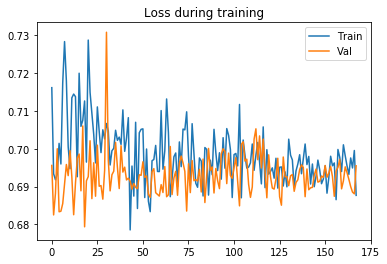

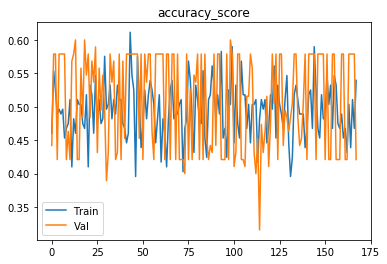

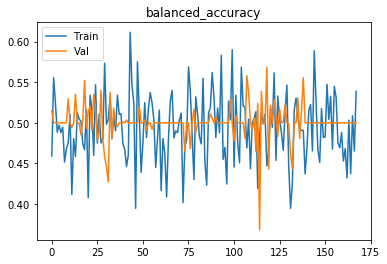

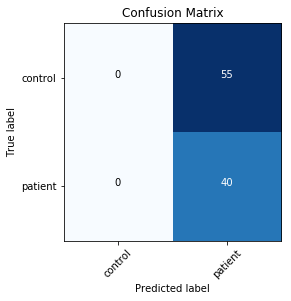

###### Starting inner fold 4
{'model': 'ModelLiu', 'batch_size': 12, 'patience': 12, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.70949
[0,     4] loss: 0.69040
[0,     6] loss: 0.67493
[0,     8] loss: 0.72227
[0,    10] loss: 0.66878
Time elapsed: 0h:0m:2s
train accuracy_score: 48.92 %
train balanced_accuracy: 49.01 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.677162
[1,     2] loss: 0.70596
[1,     4] loss: 0.81897
[1,     6] loss: 0.74177
[1,     8] loss: 0.68990
[1,    10] loss: 0.70841
Time elapsed: 0h:0m:5s
train accuracy_score: 46.04 %
train balanced_accuracy: 45.91 %
val accuracy_score: 42.11 %
val balanced_accuracy: 50.00 %
Val loss: 0.716848
[2,     2] loss: 0.71243
[2,     4] loss: 0.67711
[2,     6] loss: 0.69270
[2,     8] loss: 0.68764
[2,    10] loss: 0.74154
Time elapsed: 0h:0m:8s
train accuracy_score: 46.76 %
train balanced_accuracy: 46.85 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.687497


val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.692099
[28,     2] loss: 0.72308
[28,     4] loss: 0.70485
[28,     6] loss: 0.67578
[28,     8] loss: 0.71185
[28,    10] loss: 0.72578
Time elapsed: 0h:1m:26s
train accuracy_score: 46.76 %
train balanced_accuracy: 46.83 %
val accuracy_score: 42.11 %
val balanced_accuracy: 50.00 %
Val loss: 0.699693
[29,     2] loss: 0.71305
[29,     4] loss: 0.71540
[29,     6] loss: 0.70286
[29,     8] loss: 0.72817
[29,    10] loss: 0.70370
Time elapsed: 0h:1m:29s
train accuracy_score: 41.73 %
train balanced_accuracy: 41.66 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.689572
[30,     2] loss: 0.67395
[30,     4] loss: 0.72569
[30,     6] loss: 0.72318
[30,     8] loss: 0.69740
[30,    10] loss: 0.71022
Time elapsed: 0h:1m:32s
train accuracy_score: 49.64 %
train balanced_accuracy: 49.67 %
val accuracy_score: 42.11 %
val balanced_accuracy: 50.00 %
Val loss: 0.700821
[31,     2] loss: 0.72102
[31,     4]

val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.690839
[56,     2] loss: 0.69048
[56,     4] loss: 0.69765
[56,     6] loss: 0.71636
[56,     8] loss: 0.68685
[56,    10] loss: 0.71320
Time elapsed: 0h:2m:51s
train accuracy_score: 51.08 %
train balanced_accuracy: 50.99 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.687446
[57,     2] loss: 0.67455
[57,     4] loss: 0.67031
[57,     6] loss: 0.72552
[57,     8] loss: 0.67235
[57,    10] loss: 0.73159
Time elapsed: 0h:2m:54s
train accuracy_score: 51.08 %
train balanced_accuracy: 50.88 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.685811
[58,     2] loss: 0.68847
[58,     4] loss: 0.72049
[58,     6] loss: 0.67689
[58,     8] loss: 0.68065
[58,    10] loss: 0.72017
Time elapsed: 0h:2m:57s
train accuracy_score: 48.92 %
train balanced_accuracy: 48.84 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.692342
[59,     2] loss: 0.68517
[59,     4]

val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.687873
[84,     2] loss: 0.69794
[84,     4] loss: 0.68470
[84,     6] loss: 0.68043
[84,     8] loss: 0.70747
[84,    10] loss: 0.67752
Time elapsed: 0h:4m:16s
train accuracy_score: 53.96 %
train balanced_accuracy: 53.81 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.690333
[85,     2] loss: 0.69387
[85,     4] loss: 0.67536
[85,     6] loss: 0.68662
[85,     8] loss: 0.69432
[85,    10] loss: 0.70981
Time elapsed: 0h:4m:19s
train accuracy_score: 57.55 %
train balanced_accuracy: 57.51 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.691806
[86,     2] loss: 0.68829
[86,     4] loss: 0.69326
[86,     6] loss: 0.68048
[86,     8] loss: 0.70948
[86,    10] loss: 0.71203
Time elapsed: 0h:4m:22s
train accuracy_score: 52.52 %
train balanced_accuracy: 52.45 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.687312
[87,     2] loss: 0.69990
[87,     4]

Time elapsed: 0h:5m:38s
train accuracy_score: 50.36 %
train balanced_accuracy: 50.38 %
val accuracy_score: 43.16 %
val balanced_accuracy: 42.73 %
Val loss: 0.693134
[112,     2] loss: 0.71586
[112,     4] loss: 0.69469
[112,     6] loss: 0.69286
[112,     8] loss: 0.68478
[112,    10] loss: 0.67903
Time elapsed: 0h:5m:41s
train accuracy_score: 45.32 %
train balanced_accuracy: 45.36 %
val accuracy_score: 42.11 %
val balanced_accuracy: 50.00 %
Val loss: 0.697245
[113,     2] loss: 0.69607
[113,     4] loss: 0.72958
[113,     6] loss: 0.70935
[113,     8] loss: 0.67568
[113,    10] loss: 0.69334
Time elapsed: 0h:5m:44s
train accuracy_score: 48.92 %
train balanced_accuracy: 48.98 %
val accuracy_score: 42.11 %
val balanced_accuracy: 50.00 %
Val loss: 0.693377
[114,     2] loss: 0.68829
[114,     4] loss: 0.70988
[114,     6] loss: 0.70095
[114,     8] loss: 0.71550
[114,    10] loss: 0.70723
Time elapsed: 0h:5m:47s
train accuracy_score: 50.36 %
train balanced_accuracy: 50.23 %
val accuracy_

[139,     2] loss: 0.68385
[139,     4] loss: 0.69635
[139,     6] loss: 0.69465
[139,     8] loss: 0.69132
[139,    10] loss: 0.68680
Time elapsed: 0h:7m:3s
train accuracy_score: 51.08 %
train balanced_accuracy: 50.83 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.690241
[140,     2] loss: 0.71033
[140,     4] loss: 0.69055
[140,     6] loss: 0.66910
[140,     8] loss: 0.70245
[140,    10] loss: 0.68318
Time elapsed: 0h:7m:6s
train accuracy_score: 53.96 %
train balanced_accuracy: 53.91 %
val accuracy_score: 42.11 %
val balanced_accuracy: 50.00 %
Val loss: 0.694630
[141,     2] loss: 0.69275
[141,     4] loss: 0.71225
[141,     6] loss: 0.70462
[141,     8] loss: 0.67887
[141,    10] loss: 0.68977
Time elapsed: 0h:7m:9s
train accuracy_score: 51.08 %
train balanced_accuracy: 51.06 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.690236
[142,     2] loss: 0.69847
[142,     4] loss: 0.68575
[142,     6] loss: 0.69789
[142,     8] loss: 0.6

Time elapsed: 0h:8m:25s
train accuracy_score: 54.68 %
train balanced_accuracy: 54.65 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.690558
[167,     2] loss: 0.70743
[167,     4] loss: 0.68494
[167,     6] loss: 0.69021
[167,     8] loss: 0.69678
[167,    10] loss: 0.70676
Time elapsed: 0h:8m:28s
train accuracy_score: 48.92 %
train balanced_accuracy: 48.80 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.690842
[168,     2] loss: 0.69579
[168,     4] loss: 0.71208
[168,     6] loss: 0.67324
[168,     8] loss: 0.69197
[168,    10] loss: 0.69772
Time elapsed: 0h:8m:32s
train accuracy_score: 46.04 %
train balanced_accuracy: 45.91 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.689922
[169,     2] loss: 0.69286
[169,     4] loss: 0.68772
[169,     6] loss: 0.69202
[169,     8] loss: 0.69344
[169,    10] loss: 0.69053
Time elapsed: 0h:8m:34s
train accuracy_score: 54.68 %
train balanced_accuracy: 54.58 %
val accuracy_

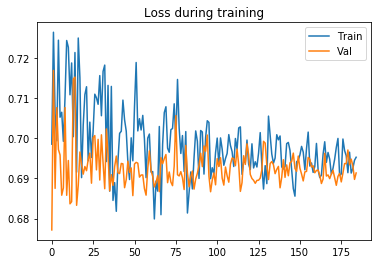

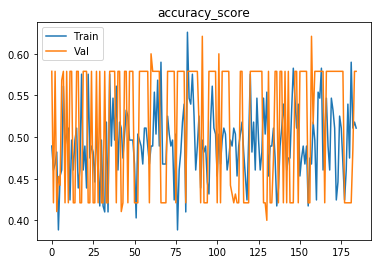

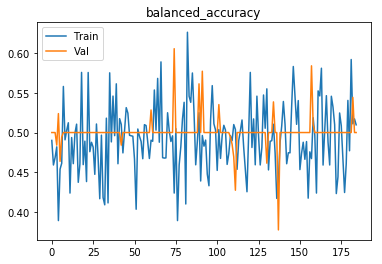

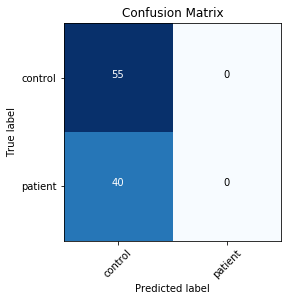

Finished outer fold.
{'final_acc': 0.5, 'best_acc': 0.58409090909090911, 'final_iter': 185, 'best_iter': 75, 'params': {'model': 'ModelLiu', 'batch_size': 12, 'patience': 12, 'lr': 0.001}, 'inner_fold_idx': 4}
###### Starting outer fold 2
# of patients 122, # of healthy controls 117
138
101
###### Starting inner fold 0
{'model': 'ModelLiu', 'batch_size': 12, 'patience': 12, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.72636
[0,     4] loss: 0.69566
[0,     6] loss: 0.70844
[0,     8] loss: 0.70129
[0,    10] loss: 0.69543
Time elapsed: 0h:0m:2s
train accuracy_score: 42.03 %
train balanced_accuracy: 40.68 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.723737
[1,     2] loss: 0.66895
[1,     4] loss: 0.69811
[1,     6] loss: 0.81812
[1,     8] loss: 0.66509
[1,    10] loss: 0.69883
Time elapsed: 0h:0m:5s
train accuracy_score: 51.45 %
train balanced_accuracy: 48.34 %
val accuracy_score: 54.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.6916

val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.726288
[27,     2] loss: 0.73446
[27,     4] loss: 0.67898
[27,     6] loss: 0.70056
[27,     8] loss: 0.68414
[27,    10] loss: 0.67949
Time elapsed: 0h:1m:25s
train accuracy_score: 50.00 %
train balanced_accuracy: 47.18 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.698366
[28,     2] loss: 0.71516
[28,     4] loss: 0.64111
[28,     6] loss: 0.68791
[28,     8] loss: 0.74437
[28,    10] loss: 0.73471
Time elapsed: 0h:1m:29s
train accuracy_score: 52.17 %
train balanced_accuracy: 48.56 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.731125
[29,     2] loss: 0.72782
[29,     4] loss: 0.70288
[29,     6] loss: 0.68945
[29,     8] loss: 0.71967
[29,    10] loss: 0.71229
Time elapsed: 0h:1m:32s
train accuracy_score: 49.28 %
train balanced_accuracy: 45.78 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.699098
[30,     2] loss: 0.68710
[30,     4]

val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.706522
[55,     2] loss: 0.67962
[55,     4] loss: 0.68746
[55,     6] loss: 0.65874
[55,     8] loss: 0.63460
[55,    10] loss: 0.76188
Time elapsed: 0h:2m:53s
train accuracy_score: 55.07 %
train balanced_accuracy: 51.49 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.718081
[56,     2] loss: 0.68008
[56,     4] loss: 0.71570
[56,     6] loss: 0.69730
[56,     8] loss: 0.71189
[56,    10] loss: 0.73090
Time elapsed: 0h:2m:56s
train accuracy_score: 55.80 %
train balanced_accuracy: 51.40 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.706362
[57,     2] loss: 0.67169
[57,     4] loss: 0.69820
[57,     6] loss: 0.69773
[57,     8] loss: 0.72974
[57,    10] loss: 0.69347
Time elapsed: 0h:2m:59s
train accuracy_score: 54.35 %
train balanced_accuracy: 51.72 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.701439
[58,     2] loss: 0.69622
[58,     4]

val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.705067
[83,     2] loss: 0.69571
[83,     4] loss: 0.67217
[83,     6] loss: 0.67372
[83,     8] loss: 0.71990
[83,    10] loss: 0.68471
Time elapsed: 0h:4m:21s
train accuracy_score: 50.72 %
train balanced_accuracy: 46.80 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.716375
[84,     2] loss: 0.66940
[84,     4] loss: 0.68224
[84,     6] loss: 0.68630
[84,     8] loss: 0.65629
[84,    10] loss: 0.72862
Time elapsed: 0h:4m:24s
train accuracy_score: 55.80 %
train balanced_accuracy: 51.10 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.709869
[85,     2] loss: 0.69509
[85,     4] loss: 0.71358
[85,     6] loss: 0.64996
[85,     8] loss: 0.68434
[85,    10] loss: 0.66816
Time elapsed: 0h:4m:28s
train accuracy_score: 57.25 %
train balanced_accuracy: 53.90 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.703622
[86,     2] loss: 0.68954
[86,     4]

Time elapsed: 0h:5m:46s
train accuracy_score: 50.72 %
train balanced_accuracy: 46.65 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.705133
[111,     2] loss: 0.67290
[111,     4] loss: 0.66408
[111,     6] loss: 0.70903
[111,     8] loss: 0.67468
[111,    10] loss: 0.69665
Time elapsed: 0h:5m:49s
train accuracy_score: 55.07 %
train balanced_accuracy: 50.74 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.714553
[112,     2] loss: 0.69824
[112,     4] loss: 0.67676
[112,     6] loss: 0.66360
[112,     8] loss: 0.70703
[112,    10] loss: 0.68134
Time elapsed: 0h:5m:52s
train accuracy_score: 55.07 %
train balanced_accuracy: 50.15 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.710879
[113,     2] loss: 0.69157
[113,     4] loss: 0.71209
[113,     6] loss: 0.67392
[113,     8] loss: 0.71917
[113,    10] loss: 0.70986
Time elapsed: 0h:5m:55s
train accuracy_score: 52.90 %
train balanced_accuracy: 48.17 %
val accuracy_

[138,     2] loss: 0.67037
[138,     4] loss: 0.71316
[138,     6] loss: 0.69548
[138,     8] loss: 0.65184
[138,    10] loss: 0.71969
Time elapsed: 0h:7m:14s
train accuracy_score: 54.35 %
train balanced_accuracy: 50.23 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.709336
[139,     2] loss: 0.70801
[139,     4] loss: 0.69804
[139,     6] loss: 0.65331
[139,     8] loss: 0.67908
[139,    10] loss: 0.69362
Time elapsed: 0h:7m:17s
train accuracy_score: 54.35 %
train balanced_accuracy: 49.79 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.708956
[140,     2] loss: 0.69132
[140,     4] loss: 0.68354
[140,     6] loss: 0.73034
[140,     8] loss: 0.65669
[140,    10] loss: 0.66299
Time elapsed: 0h:7m:20s
train accuracy_score: 54.35 %
train balanced_accuracy: 50.38 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.707072
[141,     2] loss: 0.68264
[141,     4] loss: 0.67413
[141,     6] loss: 0.69965
[141,     8] loss: 

Time elapsed: 0h:8m:38s
train accuracy_score: 53.62 %
train balanced_accuracy: 49.13 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.702302
[166,     2] loss: 0.69357
[166,     4] loss: 0.73116
[166,     6] loss: 0.67677
[166,     8] loss: 0.70115
[166,    10] loss: 0.68694
Time elapsed: 0h:8m:41s
train accuracy_score: 50.72 %
train balanced_accuracy: 46.80 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.701058
[167,     2] loss: 0.69588
[167,     4] loss: 0.69497
[167,     6] loss: 0.69322
[167,     8] loss: 0.67135
[167,    10] loss: 0.66610
Time elapsed: 0h:8m:44s
train accuracy_score: 57.25 %
train balanced_accuracy: 52.87 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.708664
[168,     2] loss: 0.70666
[168,     4] loss: 0.67393
[168,     6] loss: 0.71540
[168,     8] loss: 0.69231
[168,    10] loss: 0.66234
Time elapsed: 0h:8m:47s
train accuracy_score: 54.35 %
train balanced_accuracy: 49.34 %
val accuracy_

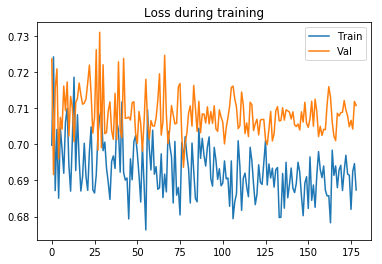

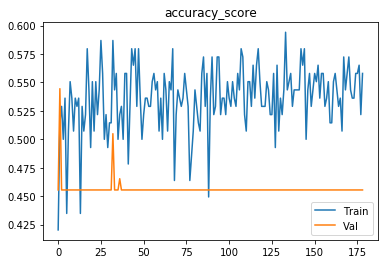

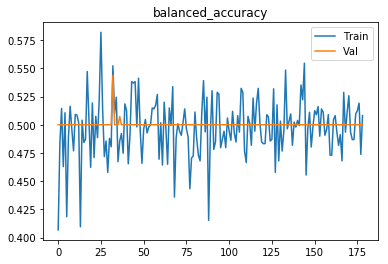

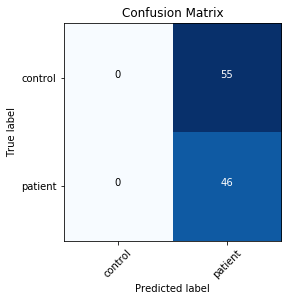

###### Starting inner fold 1
{'model': 'ModelLiu', 'batch_size': 6, 'patience': 12, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.75722
[0,     4] loss: 0.70909
[0,     6] loss: 0.73323
[0,     8] loss: 0.67759
[0,    10] loss: 0.62711
[0,    12] loss: 0.75081
[0,    14] loss: 0.68796
[0,    16] loss: 0.65278
[0,    18] loss: 0.82686
[0,    20] loss: 0.71066
[0,    22] loss: 0.73340
Time elapsed: 0h:0m:1s
train accuracy_score: 49.28 %
train balanced_accuracy: 46.97 %
val accuracy_score: 54.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.690834
[1,     2] loss: 0.69057
[1,     4] loss: 0.67982
[1,     6] loss: 0.65548
[1,     8] loss: 0.79993
[1,    10] loss: 0.68097
[1,    12] loss: 0.67718
[1,    14] loss: 0.72578
[1,    16] loss: 0.72075
[1,    18] loss: 0.62251
[1,    20] loss: 0.72973
[1,    22] loss: 0.70489
Time elapsed: 0h:0m:5s
train accuracy_score: 47.10 %
train balanced_accuracy: 47.52 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss:

[18,     8] loss: 0.71603
[18,    10] loss: 0.72599
[18,    12] loss: 0.71610
[18,    14] loss: 0.69463
[18,    16] loss: 0.74087
[18,    18] loss: 0.64292
[18,    20] loss: 0.71790
[18,    22] loss: 0.63878
Time elapsed: 0h:0m:56s
train accuracy_score: 51.45 %
train balanced_accuracy: 48.05 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.703705
[19,     2] loss: 0.71874
[19,     4] loss: 0.66677
[19,     6] loss: 0.65298
[19,     8] loss: 0.71224
[19,    10] loss: 0.66564
[19,    12] loss: 0.72154
[19,    14] loss: 0.69603
[19,    16] loss: 0.68400
[19,    18] loss: 0.70998
[19,    20] loss: 0.68883
[19,    22] loss: 0.70909
Time elapsed: 0h:0m:58s
train accuracy_score: 52.90 %
train balanced_accuracy: 50.25 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.712873
[20,     2] loss: 0.65484
[20,     4] loss: 0.76464
[20,     6] loss: 0.62197
[20,     8] loss: 0.71388
[20,    10] loss: 0.65105
[20,    12] loss: 0.72138
[20,    14] loss: 0.

[36,    14] loss: 0.73232
[36,    16] loss: 0.69948
[36,    18] loss: 0.68247
[36,    20] loss: 0.76120
[36,    22] loss: 0.70240
Time elapsed: 0h:1m:49s
train accuracy_score: 41.30 %
train balanced_accuracy: 40.17 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.710329
[37,     2] loss: 0.73757
[37,     4] loss: 0.72625
[37,     6] loss: 0.68848
[37,     8] loss: 0.67320
[37,    10] loss: 0.72403
[37,    12] loss: 0.67683
[37,    14] loss: 0.69706
[37,    16] loss: 0.67443
[37,    18] loss: 0.65571
[37,    20] loss: 0.68586
[37,    22] loss: 0.68408
Time elapsed: 0h:1m:52s
train accuracy_score: 50.72 %
train balanced_accuracy: 46.65 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.707492
[38,     2] loss: 0.68070
[38,     4] loss: 0.68568
[38,     6] loss: 0.70322
[38,     8] loss: 0.69727
[38,    10] loss: 0.71046
[38,    12] loss: 0.67920
[38,    14] loss: 0.74390
[38,    16] loss: 0.68658
[38,    18] loss: 0.69007
[38,    20] loss: 0.

[54,    22] loss: 0.66170
Time elapsed: 0h:2m:42s
train accuracy_score: 52.17 %
train balanced_accuracy: 47.96 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.700435
[55,     2] loss: 0.65912
[55,     4] loss: 0.70962
[55,     6] loss: 0.77440
[55,     8] loss: 0.68841
[55,    10] loss: 0.64667
[55,    12] loss: 0.71162
[55,    14] loss: 0.66989
[55,    16] loss: 0.66968
[55,    18] loss: 0.74668
[55,    20] loss: 0.74607
[55,    22] loss: 0.70669
Time elapsed: 0h:2m:45s
train accuracy_score: 50.72 %
train balanced_accuracy: 46.20 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.713514
[56,     2] loss: 0.71341
[56,     4] loss: 0.68287
[56,     6] loss: 0.66670
[56,     8] loss: 0.65824
[56,    10] loss: 0.68174
[56,    12] loss: 0.72879
[56,    14] loss: 0.66237
[56,    16] loss: 0.68849
[56,    18] loss: 0.64875
[56,    20] loss: 0.71976
[56,    22] loss: 0.72504
Time elapsed: 0h:2m:48s
train accuracy_score: 55.07 %
train balanced_acc

val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.707169
[73,     2] loss: 0.66523
[73,     4] loss: 0.65158
[73,     6] loss: 0.67731
[73,     8] loss: 0.69646
[73,    10] loss: 0.71220
[73,    12] loss: 0.68157
[73,    14] loss: 0.64729
[73,    16] loss: 0.72582
[73,    18] loss: 0.72138
[73,    20] loss: 0.64713
[73,    22] loss: 0.68895
Time elapsed: 0h:3m:40s
train accuracy_score: 57.25 %
train balanced_accuracy: 52.57 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.702957
[74,     2] loss: 0.72376
[74,     4] loss: 0.71933
[74,     6] loss: 0.70691
[74,     8] loss: 0.68739
[74,    10] loss: 0.69741
[74,    12] loss: 0.69066
[74,    14] loss: 0.69536
[74,    16] loss: 0.66730
[74,    18] loss: 0.71320
[74,    20] loss: 0.65370
[74,    22] loss: 0.67046
Time elapsed: 0h:3m:43s
train accuracy_score: 52.17 %
train balanced_accuracy: 49.15 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.700918
[75,     2] loss: 0.

[91,    10] loss: 0.65023
[91,    12] loss: 0.71513
[91,    14] loss: 0.71860
[91,    16] loss: 0.69492
[91,    18] loss: 0.65228
[91,    20] loss: 0.74277
[91,    22] loss: 0.63845
Time elapsed: 0h:4m:33s
train accuracy_score: 55.07 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.709304
[92,     2] loss: 0.63522
[92,     4] loss: 0.71578
[92,     6] loss: 0.62915
[92,     8] loss: 0.67643
[92,    10] loss: 0.71254
[92,    12] loss: 0.69065
[92,    14] loss: 0.73062
[92,    16] loss: 0.75717
[92,    18] loss: 0.73469
[92,    20] loss: 0.64720
[92,    22] loss: 0.65635
Time elapsed: 0h:4m:36s
train accuracy_score: 55.07 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.705959
[93,     2] loss: 0.70306
[93,     4] loss: 0.69100
[93,     6] loss: 0.70311
[93,     8] loss: 0.69543
[93,    10] loss: 0.70830
[93,    12] loss: 0.69932
[93,    14] loss: 0.69381
[93,    16] loss: 0.

[109,    14] loss: 0.66791
[109,    16] loss: 0.67920
[109,    18] loss: 0.68967
[109,    20] loss: 0.65097
[109,    22] loss: 0.70501
Time elapsed: 0h:5m:26s
train accuracy_score: 55.07 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.705968
[110,     2] loss: 0.68117
[110,     4] loss: 0.66061
[110,     6] loss: 0.66451
[110,     8] loss: 0.72484
[110,    10] loss: 0.68706
[110,    12] loss: 0.70001
[110,    14] loss: 0.72655
[110,    16] loss: 0.71347
[110,    18] loss: 0.69900
[110,    20] loss: 0.66408
[110,    22] loss: 0.66697
Time elapsed: 0h:5m:29s
train accuracy_score: 55.07 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.705764
[111,     2] loss: 0.65304
[111,     4] loss: 0.69536
[111,     6] loss: 0.71973
[111,     8] loss: 0.70508
[111,    10] loss: 0.67075
[111,    12] loss: 0.70859
[111,    14] loss: 0.69909
[111,    16] loss: 0.68065
[111,    18] loss: 0.6

[127,     8] loss: 0.73103
[127,    10] loss: 0.68372
[127,    12] loss: 0.72219
[127,    14] loss: 0.63961
[127,    16] loss: 0.68124
[127,    18] loss: 0.71447
[127,    20] loss: 0.69027
[127,    22] loss: 0.64425
Time elapsed: 0h:6m:20s
train accuracy_score: 55.07 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.709372
[128,     2] loss: 0.67085
[128,     4] loss: 0.69700
[128,     6] loss: 0.67702
[128,     8] loss: 0.73432
[128,    10] loss: 0.65677
[128,    12] loss: 0.75457
[128,    14] loss: 0.68758
[128,    16] loss: 0.66740
[128,    18] loss: 0.70303
[128,    20] loss: 0.68459
[128,    22] loss: 0.63991
Time elapsed: 0h:6m:23s
train accuracy_score: 55.07 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.707274
[129,     2] loss: 0.68466
[129,     4] loss: 0.67088
[129,     6] loss: 0.73043
[129,     8] loss: 0.75323
[129,    10] loss: 0.66694
[129,    12] loss: 0.6

[145,     2] loss: 0.71670
[145,     4] loss: 0.68027
[145,     6] loss: 0.68778
[145,     8] loss: 0.74210
[145,    10] loss: 0.66826
[145,    12] loss: 0.72480
[145,    14] loss: 0.68125
[145,    16] loss: 0.68324
[145,    18] loss: 0.63317
[145,    20] loss: 0.67616
[145,    22] loss: 0.71108
Time elapsed: 0h:7m:14s
train accuracy_score: 55.07 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.712638
[146,     2] loss: 0.71783
[146,     4] loss: 0.65204
[146,     6] loss: 0.64471
[146,     8] loss: 0.75856
[146,    10] loss: 0.59954
[146,    12] loss: 0.75499
[146,    14] loss: 0.60855
[146,    16] loss: 0.67982
[146,    18] loss: 0.71555
[146,    20] loss: 0.70583
[146,    22] loss: 0.78561
Time elapsed: 0h:7m:17s
train accuracy_score: 55.07 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.717276
[147,     2] loss: 0.65451
[147,     4] loss: 0.68760
[147,     6] loss: 0.6

val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.707688
[163,     2] loss: 0.66911
[163,     4] loss: 0.67953
[163,     6] loss: 0.69349
[163,     8] loss: 0.67475
[163,    10] loss: 0.74474
[163,    12] loss: 0.63178
[163,    14] loss: 0.66667
[163,    16] loss: 0.70940
[163,    18] loss: 0.72284
[163,    20] loss: 0.74240
[163,    22] loss: 0.65905
Time elapsed: 0h:8m:8s
train accuracy_score: 55.07 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.710091
[164,     2] loss: 0.68581
[164,     4] loss: 0.70427
[164,     6] loss: 0.65135
[164,     8] loss: 0.67432
[164,    10] loss: 0.72686
[164,    12] loss: 0.67599
[164,    14] loss: 0.67497
[164,    16] loss: 0.69109
[164,    18] loss: 0.69172
[164,    20] loss: 0.66831
[164,    22] loss: 0.68952
Time elapsed: 0h:8m:11s
train accuracy_score: 55.07 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.701558

Time elapsed: 0h:8m:59s
train accuracy_score: 55.07 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.705790
[181,     2] loss: 0.70907
[181,     4] loss: 0.71111
[181,     6] loss: 0.65444
[181,     8] loss: 0.65671
[181,    10] loss: 0.75576
[181,    12] loss: 0.73060
[181,    14] loss: 0.65836
[181,    16] loss: 0.65934
[181,    18] loss: 0.70173
[181,    20] loss: 0.68905
[181,    22] loss: 0.65911
Time elapsed: 0h:9m:2s
train accuracy_score: 55.07 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.703632
[182,     2] loss: 0.72746
[182,     4] loss: 0.68536
[182,     6] loss: 0.67871
[182,     8] loss: 0.69880
[182,    10] loss: 0.64014
[182,    12] loss: 0.70863
[182,    14] loss: 0.66249
[182,    16] loss: 0.71089
[182,    18] loss: 0.66234
[182,    20] loss: 0.67734
[182,    22] loss: 0.68982
Time elapsed: 0h:9m:5s
train accuracy_score: 55.07 %
train balanced_accuracy:

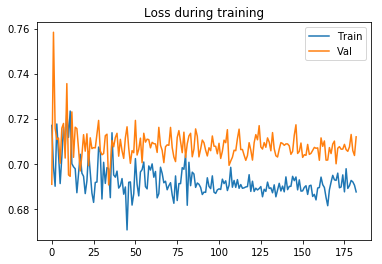

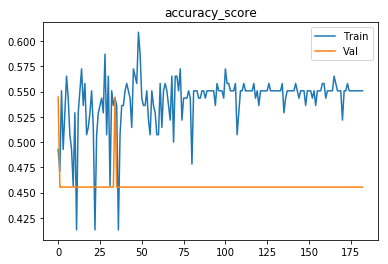

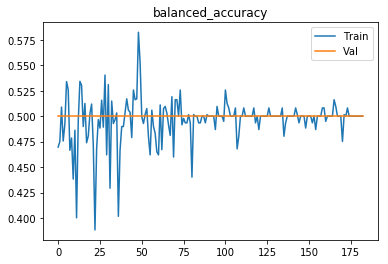

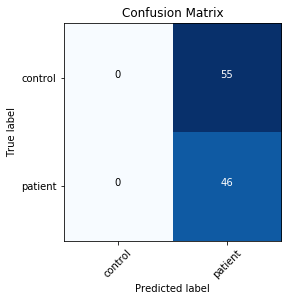

###### Starting inner fold 2
{'model': 'ModelLiu', 'batch_size': 6, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.70269
[0,     4] loss: 0.66323
[0,     6] loss: 0.76980
[0,     8] loss: 0.81543
[0,    10] loss: 0.80974
[0,    12] loss: 0.77657
[0,    14] loss: 0.66509
[0,    16] loss: 0.83619
[0,    18] loss: 0.72529
[0,    20] loss: 0.67444
[0,    22] loss: 0.69892
Time elapsed: 0h:0m:2s
train accuracy_score: 52.90 %
train balanced_accuracy: 51.59 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.726336
[1,     2] loss: 0.74004
[1,     4] loss: 0.70881
[1,     6] loss: 0.75731
[1,     8] loss: 0.78599
[1,    10] loss: 0.75673
[1,    12] loss: 0.69195
[1,    14] loss: 0.70277
[1,    16] loss: 0.78645
[1,    18] loss: 0.73116
[1,    20] loss: 0.73299
[1,    22] loss: 0.67744
Time elapsed: 0h:0m:5s
train accuracy_score: 43.48 %
train balanced_accuracy: 41.85 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss:

[18,     8] loss: 0.72433
[18,    10] loss: 0.72229
[18,    12] loss: 0.69257
[18,    14] loss: 0.69059
[18,    16] loss: 0.70359
[18,    18] loss: 0.77077
[18,    20] loss: 0.72618
[18,    22] loss: 0.73965
Time elapsed: 0h:0m:55s
train accuracy_score: 51.45 %
train balanced_accuracy: 47.30 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.710262
[19,     2] loss: 0.70479
[19,     4] loss: 0.79372
[19,     6] loss: 0.67970
[19,     8] loss: 0.71215
[19,    10] loss: 0.72325
[19,    12] loss: 0.67959
[19,    14] loss: 0.71972
[19,    16] loss: 0.81048
[19,    18] loss: 0.71448
[19,    20] loss: 0.65953
[19,    22] loss: 0.70025
Time elapsed: 0h:0m:58s
train accuracy_score: 44.93 %
train balanced_accuracy: 41.68 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.704925
[20,     2] loss: 0.73747
[20,     4] loss: 0.74615
[20,     6] loss: 0.71679
[20,     8] loss: 0.66927
[20,    10] loss: 0.67591
[20,    12] loss: 0.70702
[20,    14] loss: 0.

[36,    16] loss: 0.62425
[36,    18] loss: 0.76358
[36,    20] loss: 0.67496
[36,    22] loss: 0.69275
Time elapsed: 0h:1m:49s
train accuracy_score: 52.17 %
train balanced_accuracy: 47.96 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.709345
[37,     2] loss: 0.76476
[37,     4] loss: 0.68404
[37,     6] loss: 0.71115
[37,     8] loss: 0.70578
[37,    10] loss: 0.68288
[37,    12] loss: 0.71864
[37,    14] loss: 0.68911
[37,    16] loss: 0.74101
[37,    18] loss: 0.74526
[37,    20] loss: 0.73078
[37,    22] loss: 0.65926
Time elapsed: 0h:1m:52s
train accuracy_score: 46.38 %
train balanced_accuracy: 43.59 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.707160
[38,     2] loss: 0.73000
[38,     4] loss: 0.63752
[38,     6] loss: 0.63523
[38,     8] loss: 0.67456
[38,    10] loss: 0.72552
[38,    12] loss: 0.71590
[38,    14] loss: 0.67546
[38,    16] loss: 0.73494
[38,    18] loss: 0.69897
[38,    20] loss: 0.66571
[38,    22] loss: 0.

Time elapsed: 0h:2m:42s
train accuracy_score: 54.35 %
train balanced_accuracy: 49.79 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.713716
[55,     2] loss: 0.71429
[55,     4] loss: 0.66185
[55,     6] loss: 0.65417
[55,     8] loss: 0.71113
[55,    10] loss: 0.70226
[55,    12] loss: 0.71197
[55,    14] loss: 0.72805
[55,    16] loss: 0.63710
[55,    18] loss: 0.66417
[55,    20] loss: 0.74458
[55,    22] loss: 0.68520
Time elapsed: 0h:2m:45s
train accuracy_score: 55.07 %
train balanced_accuracy: 52.67 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.702679
[56,     2] loss: 0.66540
[56,     4] loss: 0.70572
[56,     6] loss: 0.69751
[56,     8] loss: 0.71163
[56,    10] loss: 0.67368
[56,    12] loss: 0.71230
[56,    14] loss: 0.62053
[56,    16] loss: 0.72690
[56,    18] loss: 0.66929
[56,    20] loss: 0.73200
[56,    22] loss: 0.62897
Time elapsed: 0h:2m:47s
train accuracy_score: 57.25 %
train balanced_accuracy: 53.76 %
val accurac

val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.704248
[73,     2] loss: 0.70891
[73,     4] loss: 0.68445
[73,     6] loss: 0.70832
[73,     8] loss: 0.67891
[73,    10] loss: 0.70253
[73,    12] loss: 0.64166
[73,    14] loss: 0.64518
[73,    16] loss: 0.72164
[73,    18] loss: 0.67240
[73,    20] loss: 0.68649
[73,    22] loss: 0.71993
Time elapsed: 0h:3m:39s
train accuracy_score: 52.17 %
train balanced_accuracy: 49.00 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.708370
[74,     2] loss: 0.65070
[74,     4] loss: 0.72057
[74,     6] loss: 0.69093
[74,     8] loss: 0.67274
[74,    10] loss: 0.69327
[74,    12] loss: 0.71292
[74,    14] loss: 0.70564
[74,    16] loss: 0.69250
[74,    18] loss: 0.67921
[74,    20] loss: 0.64464
[74,    22] loss: 0.69782
Time elapsed: 0h:3m:42s
train accuracy_score: 57.25 %
train balanced_accuracy: 53.16 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.705248
[75,     2] loss: 0.

[91,     8] loss: 0.68970
[91,    10] loss: 0.71418
[91,    12] loss: 0.73132
[91,    14] loss: 0.67214
[91,    16] loss: 0.67274
[91,    18] loss: 0.65166
[91,    20] loss: 0.67844
[91,    22] loss: 0.69633
Time elapsed: 0h:4m:32s
train accuracy_score: 54.35 %
train balanced_accuracy: 49.94 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.710713
[92,     2] loss: 0.65073
[92,     4] loss: 0.72089
[92,     6] loss: 0.70971
[92,     8] loss: 0.70141
[92,    10] loss: 0.69765
[92,    12] loss: 0.70761
[92,    14] loss: 0.61564
[92,    16] loss: 0.63395
[92,    18] loss: 0.74188
[92,    20] loss: 0.78343
[92,    22] loss: 0.69478
Time elapsed: 0h:4m:35s
train accuracy_score: 55.07 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.715472
[93,     2] loss: 0.69286
[93,     4] loss: 0.65256
[93,     6] loss: 0.65171
[93,     8] loss: 0.68628
[93,    10] loss: 0.65802
[93,    12] loss: 0.70269
[93,    14] loss: 0.

[109,     8] loss: 0.67851
[109,    10] loss: 0.73775
[109,    12] loss: 0.71321
[109,    14] loss: 0.68792
[109,    16] loss: 0.65836
[109,    18] loss: 0.73424
[109,    20] loss: 0.68497
[109,    22] loss: 0.68188
Time elapsed: 0h:5m:25s
train accuracy_score: 53.62 %
train balanced_accuracy: 49.43 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.705324
[110,     2] loss: 0.69723
[110,     4] loss: 0.70600
[110,     6] loss: 0.65978
[110,     8] loss: 0.68098
[110,    10] loss: 0.72866
[110,    12] loss: 0.66119
[110,    14] loss: 0.70132
[110,    16] loss: 0.71450
[110,    18] loss: 0.67100
[110,    20] loss: 0.67744
[110,    22] loss: 0.74074
Time elapsed: 0h:5m:28s
train accuracy_score: 54.35 %
train balanced_accuracy: 50.08 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.709039
[111,     2] loss: 0.65257
[111,     4] loss: 0.64796
[111,     6] loss: 0.70770
[111,     8] loss: 0.73220
[111,    10] loss: 0.72548
[111,    12] loss: 0.7

[127,     2] loss: 0.68446
[127,     4] loss: 0.71206
[127,     6] loss: 0.67199
[127,     8] loss: 0.72471
[127,    10] loss: 0.69745
[127,    12] loss: 0.65135
[127,    14] loss: 0.65909
[127,    16] loss: 0.71023
[127,    18] loss: 0.70036
[127,    20] loss: 0.65076
[127,    22] loss: 0.75819
Time elapsed: 0h:6m:18s
train accuracy_score: 53.62 %
train balanced_accuracy: 49.58 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.719295
[128,     2] loss: 0.67611
[128,     4] loss: 0.69319
[128,     6] loss: 0.67132
[128,     8] loss: 0.67890
[128,    10] loss: 0.71089
[128,    12] loss: 0.63689
[128,    14] loss: 0.70860
[128,    16] loss: 0.63434
[128,    18] loss: 0.70117
[128,    20] loss: 0.69643
[128,    22] loss: 0.69003
Time elapsed: 0h:6m:21s
train accuracy_score: 55.80 %
train balanced_accuracy: 50.96 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.709454
[129,     2] loss: 0.67079
[129,     4] loss: 0.65061
[129,     6] loss: 0.7

val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.710397
[145,     2] loss: 0.68385
[145,     4] loss: 0.71247
[145,     6] loss: 0.74839
[145,     8] loss: 0.70902
[145,    10] loss: 0.66637
[145,    12] loss: 0.69629
[145,    14] loss: 0.67717
[145,    16] loss: 0.63432
[145,    18] loss: 0.69107
[145,    20] loss: 0.67122
[145,    22] loss: 0.64652
Time elapsed: 0h:7m:12s
train accuracy_score: 53.62 %
train balanced_accuracy: 49.13 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.702359
[146,     2] loss: 0.68794
[146,     4] loss: 0.71736
[146,     6] loss: 0.70035
[146,     8] loss: 0.68931
[146,    10] loss: 0.63571
[146,    12] loss: 0.69973
[146,    14] loss: 0.70155
[146,    16] loss: 0.63462
[146,    18] loss: 0.75110
[146,    20] loss: 0.67929
[146,    22] loss: 0.66549
Time elapsed: 0h:7m:15s
train accuracy_score: 57.25 %
train balanced_accuracy: 52.42 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.70829

Time elapsed: 0h:8m:2s
train accuracy_score: 52.90 %
train balanced_accuracy: 48.17 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.705233
[163,     2] loss: 0.73224
[163,     4] loss: 0.74346
[163,     6] loss: 0.66356
[163,     8] loss: 0.65218
[163,    10] loss: 0.68432
[163,    12] loss: 0.68206
[163,    14] loss: 0.71307
[163,    16] loss: 0.65574
[163,    18] loss: 0.66962
[163,    20] loss: 0.71855
[163,    22] loss: 0.65094
Time elapsed: 0h:8m:5s
train accuracy_score: 55.07 %
train balanced_accuracy: 50.30 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.705412
[164,     2] loss: 0.66791
[164,     4] loss: 0.67223
[164,     6] loss: 0.63083
[164,     8] loss: 0.70529
[164,    10] loss: 0.72408
[164,    12] loss: 0.66545
[164,    14] loss: 0.67379
[164,    16] loss: 0.77928
[164,    18] loss: 0.73573
[164,    20] loss: 0.65615
[164,    22] loss: 0.72308
Time elapsed: 0h:8m:8s
train accuracy_score: 55.07 %
train balanced_accuracy: 

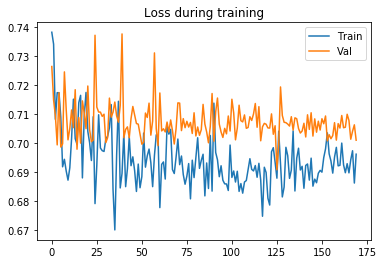

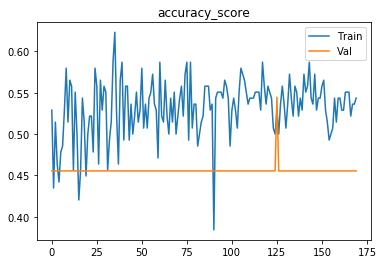

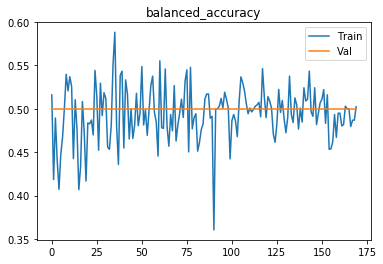

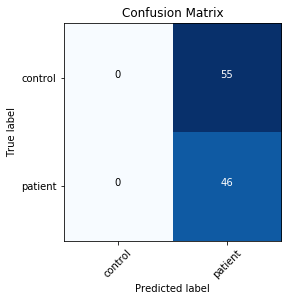

###### Starting inner fold 3
{'model': 'ModelLiu', 'batch_size': 4, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.73221
[0,     4] loss: 0.69674
[0,     6] loss: 0.69377
[0,     8] loss: 0.68070
[0,    10] loss: 0.57327
[0,    12] loss: 0.54128
[0,    14] loss: 1.06584
[0,    16] loss: 0.86759
[0,    18] loss: 0.68467
[0,    20] loss: 0.77422
[0,    22] loss: 0.67429
[0,    24] loss: 0.84917
[0,    26] loss: 0.82060
[0,    28] loss: 0.85773
[0,    30] loss: 0.88949
[0,    32] loss: 0.65055
[0,    34] loss: 0.82679
Time elapsed: 0h:0m:1s
train accuracy_score: 39.86 %
train balanced_accuracy: 38.26 %
val accuracy_score: 54.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.689179
[1,     2] loss: 0.66395
[1,     4] loss: 0.63403
[1,     6] loss: 0.63468
[1,     8] loss: 0.69613
[1,    10] loss: 0.62648
[1,    12] loss: 0.97545
[1,    14] loss: 0.61189
[1,    16] loss: 0.67182
[1,    18] loss: 0.55110
[1,    20] loss: 0.67824
[1,    22] loss: 1.05813
[1, 

[13,    34] loss: 0.73208
Time elapsed: 0h:0m:39s
train accuracy_score: 56.52 %
train balanced_accuracy: 52.95 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.707991
[14,     2] loss: 0.71588
[14,     4] loss: 0.63885
[14,     6] loss: 0.70875
[14,     8] loss: 0.63155
[14,    10] loss: 0.64874
[14,    12] loss: 0.73673
[14,    14] loss: 0.73300
[14,    16] loss: 0.75705
[14,    18] loss: 0.69492
[14,    20] loss: 0.72569
[14,    22] loss: 0.70989
[14,    24] loss: 0.66904
[14,    26] loss: 0.63946
[14,    28] loss: 0.75720
[14,    30] loss: 0.69489
[14,    32] loss: 0.71677
[14,    34] loss: 0.63933
Time elapsed: 0h:0m:41s
train accuracy_score: 49.28 %
train balanced_accuracy: 49.34 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.701104
[15,     2] loss: 0.71895
[15,     4] loss: 0.64045
[15,     6] loss: 0.68455
[15,     8] loss: 0.80815
[15,    10] loss: 0.66514
[15,    12] loss: 0.55861
[15,    14] loss: 0.75140
[15,    16] loss: 0.

[27,    12] loss: 0.69565
[27,    14] loss: 0.62969
[27,    16] loss: 0.64337
[27,    18] loss: 0.68051
[27,    20] loss: 0.67123
[27,    22] loss: 0.60689
[27,    24] loss: 0.66092
[27,    26] loss: 0.61260
[27,    28] loss: 0.71048
[27,    30] loss: 0.66021
[27,    32] loss: 0.66202
[27,    34] loss: 0.77655
Time elapsed: 0h:1m:18s
train accuracy_score: 63.77 %
train balanced_accuracy: 63.24 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.694607
[28,     2] loss: 0.76869
[28,     4] loss: 0.67403
[28,     6] loss: 0.65799
[28,     8] loss: 0.73754
[28,    10] loss: 0.75506
[28,    12] loss: 0.70944
[28,    14] loss: 0.71152
[28,    16] loss: 0.68281
[28,    18] loss: 0.67365
[28,    20] loss: 0.64302
[28,    22] loss: 0.66325
[28,    24] loss: 0.65856
[28,    26] loss: 0.67051
[28,    28] loss: 0.67764
[28,    30] loss: 0.73931
[28,    32] loss: 0.61324
[28,    34] loss: 0.67443
Time elapsed: 0h:1m:20s
train accuracy_score: 54.35 %
train balanced_accuracy: 51

Time elapsed: 0h:1m:54s
train accuracy_score: 53.62 %
train balanced_accuracy: 49.43 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.703160
[41,     2] loss: 0.68696
[41,     4] loss: 0.68564
[41,     6] loss: 0.67416
[41,     8] loss: 0.74113
[41,    10] loss: 0.76971
[41,    12] loss: 0.73944
[41,    14] loss: 0.67245
[41,    16] loss: 0.72168
[41,    18] loss: 0.69945
[41,    20] loss: 0.69787
[41,    22] loss: 0.72052
[41,    24] loss: 0.68309
[41,    26] loss: 0.68160
[41,    28] loss: 0.70735
[41,    30] loss: 0.72076
[41,    32] loss: 0.65943
[41,    34] loss: 0.63839
Time elapsed: 0h:1m:57s
train accuracy_score: 53.62 %
train balanced_accuracy: 52.84 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.706228
[42,     2] loss: 0.65458
[42,     4] loss: 0.67492
[42,     6] loss: 0.75320
[42,     8] loss: 0.77643
[42,    10] loss: 0.70403
[42,    12] loss: 0.75686
[42,    14] loss: 0.72549
[42,    16] loss: 0.70939
[42,    18] loss: 0.

[54,    24] loss: 0.71596
[54,    26] loss: 0.74257
[54,    28] loss: 0.65882
[54,    30] loss: 0.72888
[54,    32] loss: 0.67734
[54,    34] loss: 0.63877
Time elapsed: 0h:2m:32s
train accuracy_score: 56.52 %
train balanced_accuracy: 53.54 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.708952
[55,     2] loss: 0.71167
[55,     4] loss: 0.66524
[55,     6] loss: 0.74236
[55,     8] loss: 0.70729
[55,    10] loss: 0.74184
[55,    12] loss: 0.66803
[55,    14] loss: 0.65999
[55,    16] loss: 0.69333
[55,    18] loss: 0.63867
[55,    20] loss: 0.68914
[55,    22] loss: 0.66633
[55,    24] loss: 0.68725
[55,    26] loss: 0.61892
[55,    28] loss: 0.66252
[55,    30] loss: 0.77155
[55,    32] loss: 0.84681
[55,    34] loss: 0.67304
Time elapsed: 0h:2m:35s
train accuracy_score: 53.62 %
train balanced_accuracy: 49.28 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.720645
[56,     2] loss: 0.59616
[56,     4] loss: 0.66616
[56,     6] loss: 0.

[68,     2] loss: 0.72154
[68,     4] loss: 0.66113
[68,     6] loss: 0.72440
[68,     8] loss: 0.65230
[68,    10] loss: 0.69230
[68,    12] loss: 0.72580
[68,    14] loss: 0.73254
[68,    16] loss: 0.66669
[68,    18] loss: 0.68362
[68,    20] loss: 0.68743
[68,    22] loss: 0.71186
[68,    24] loss: 0.69003
[68,    26] loss: 0.70915
[68,    28] loss: 0.71273
[68,    30] loss: 0.70101
[68,    32] loss: 0.69507
[68,    34] loss: 0.69606
Time elapsed: 0h:3m:12s
train accuracy_score: 47.83 %
train balanced_accuracy: 45.50 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.697782
[69,     2] loss: 0.68032
[69,     4] loss: 0.74416
[69,     6] loss: 0.66011
[69,     8] loss: 0.67024
[69,    10] loss: 0.72514
[69,    12] loss: 0.65114
[69,    14] loss: 0.67835
[69,    16] loss: 0.67568
[69,    18] loss: 0.65176
[69,    20] loss: 0.72340
[69,    22] loss: 0.70968
[69,    24] loss: 0.74964
[69,    26] loss: 0.70871
[69,    28] loss: 0.68582
[69,    30] loss: 0.74451
[69

[81,    26] loss: 0.67377
[81,    28] loss: 0.67747
[81,    30] loss: 0.76635
[81,    32] loss: 0.65480
[81,    34] loss: 0.70108
Time elapsed: 0h:3m:48s
train accuracy_score: 55.07 %
train balanced_accuracy: 51.78 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.700811
[82,     2] loss: 0.69161
[82,     4] loss: 0.69171
[82,     6] loss: 0.71559
[82,     8] loss: 0.68964
[82,    10] loss: 0.67861
[82,    12] loss: 0.71388
[82,    14] loss: 0.66843
[82,    16] loss: 0.67707
[82,    18] loss: 0.73751
[82,    20] loss: 0.66945
[82,    22] loss: 0.71735
[82,    24] loss: 0.68070
[82,    26] loss: 0.64529
[82,    28] loss: 0.70435
[82,    30] loss: 0.66825
[82,    32] loss: 0.72226
[82,    34] loss: 0.66895
Time elapsed: 0h:3m:51s
train accuracy_score: 50.72 %
train balanced_accuracy: 46.94 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.704009
[83,     2] loss: 0.64846
[83,     4] loss: 0.63094
[83,     6] loss: 0.69640
[83,     8] loss: 0.

[95,    14] loss: 0.67511
[95,    16] loss: 0.69324
[95,    18] loss: 0.63155
[95,    20] loss: 0.68094
[95,    22] loss: 0.69376
[95,    24] loss: 0.70907
[95,    26] loss: 0.69201
[95,    28] loss: 0.67670
[95,    30] loss: 0.68490
[95,    32] loss: 0.68112
[95,    34] loss: 0.65064
Time elapsed: 0h:4m:26s
train accuracy_score: 55.07 %
train balanced_accuracy: 50.45 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.703004
[96,     2] loss: 0.73384
[96,     4] loss: 0.64188
[96,     6] loss: 0.68604
[96,     8] loss: 0.65411
[96,    10] loss: 0.71266
[96,    12] loss: 0.68496
[96,    14] loss: 0.67359
[96,    16] loss: 0.69404
[96,    18] loss: 0.64333
[96,    20] loss: 0.76124
[96,    22] loss: 0.70977
[96,    24] loss: 0.70296
[96,    26] loss: 0.68374
[96,    28] loss: 0.70470
[96,    30] loss: 0.75457
[96,    32] loss: 0.68891
[96,    34] loss: 0.68646
Time elapsed: 0h:4m:29s
train accuracy_score: 54.35 %
train balanced_accuracy: 49.49 %
val accuracy_score: 

Time elapsed: 0h:5m:3s
train accuracy_score: 49.28 %
train balanced_accuracy: 45.03 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.701085
[109,     2] loss: 0.66656
[109,     4] loss: 0.66921
[109,     6] loss: 0.69738
[109,     8] loss: 0.67873
[109,    10] loss: 0.66499
[109,    12] loss: 0.77598
[109,    14] loss: 0.67921
[109,    16] loss: 0.76106
[109,    18] loss: 0.65438
[109,    20] loss: 0.69336
[109,    22] loss: 0.70535
[109,    24] loss: 0.63689
[109,    26] loss: 0.67150
[109,    28] loss: 0.64753
[109,    30] loss: 0.69232
[109,    32] loss: 0.68969
[109,    34] loss: 0.79527
Time elapsed: 0h:5m:6s
train accuracy_score: 55.07 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.711360
[110,     2] loss: 0.68419
[110,     4] loss: 0.70797
[110,     6] loss: 0.64865
[110,     8] loss: 0.70115
[110,    10] loss: 0.73622
[110,    12] loss: 0.64015
[110,    14] loss: 0.74128
[110,    16] loss: 0.720

val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.706937
[122,     2] loss: 0.70974
[122,     4] loss: 0.72212
[122,     6] loss: 0.67185
[122,     8] loss: 0.70301
[122,    10] loss: 0.70628
[122,    12] loss: 0.74030
[122,    14] loss: 0.67359
[122,    16] loss: 0.65637
[122,    18] loss: 0.69717
[122,    20] loss: 0.68830
[122,    22] loss: 0.66497
[122,    24] loss: 0.68585
[122,    26] loss: 0.67862
[122,    28] loss: 0.67079
[122,    30] loss: 0.67682
[122,    32] loss: 0.70287
[122,    34] loss: 0.67034
Time elapsed: 0h:5m:42s
train accuracy_score: 53.62 %
train balanced_accuracy: 48.83 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.708228
[123,     2] loss: 0.67786
[123,     4] loss: 0.71208
[123,     6] loss: 0.71743
[123,     8] loss: 0.70243
[123,    10] loss: 0.67832
[123,    12] loss: 0.66338
[123,    14] loss: 0.73300
[123,    16] loss: 0.67226
[123,    18] loss: 0.66331
[123,    20] loss: 0.63962
[123,    22] loss: 0.77337
[

[135,    12] loss: 0.72341
[135,    14] loss: 0.64511
[135,    16] loss: 0.61789
[135,    18] loss: 0.72937
[135,    20] loss: 0.61361
[135,    22] loss: 0.68890
[135,    24] loss: 0.75904
[135,    26] loss: 0.67608
[135,    28] loss: 0.72866
[135,    30] loss: 0.73928
[135,    32] loss: 0.73622
[135,    34] loss: 0.68073
Time elapsed: 0h:6m:19s
train accuracy_score: 55.07 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.709608
[136,     2] loss: 0.67695
[136,     4] loss: 0.68990
[136,     6] loss: 0.64985
[136,     8] loss: 0.68373
[136,    10] loss: 0.67009
[136,    12] loss: 0.64484
[136,    14] loss: 0.78866
[136,    16] loss: 0.75403
[136,    18] loss: 0.63451
[136,    20] loss: 0.64946
[136,    22] loss: 0.70567
[136,    24] loss: 0.64586
[136,    26] loss: 0.74028
[136,    28] loss: 0.67273
[136,    30] loss: 0.73341
[136,    32] loss: 0.63367
[136,    34] loss: 0.77415
Time elapsed: 0h:6m:21s
train accuracy_score: 55.07 

[148,    22] loss: 0.72178
[148,    24] loss: 0.64503
[148,    26] loss: 0.71155
[148,    28] loss: 0.66583
[148,    30] loss: 0.65151
[148,    32] loss: 0.68085
[148,    34] loss: 0.74186
Time elapsed: 0h:6m:55s
train accuracy_score: 54.35 %
train balanced_accuracy: 49.49 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.705758
[149,     2] loss: 0.68263
[149,     4] loss: 0.64045
[149,     6] loss: 0.75320
[149,     8] loss: 0.69650
[149,    10] loss: 0.63415
[149,    12] loss: 0.70622
[149,    14] loss: 0.71442
[149,    16] loss: 0.70010
[149,    18] loss: 0.73501
[149,    20] loss: 0.64925
[149,    22] loss: 0.67598
[149,    24] loss: 0.63416
[149,    26] loss: 0.74981
[149,    28] loss: 0.72180
[149,    30] loss: 0.69379
[149,    32] loss: 0.75348
[149,    34] loss: 0.64239
Time elapsed: 0h:6m:58s
train accuracy_score: 55.07 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.707316
[150,     2] loss: 0.7

Time elapsed: 0h:7m:31s
train accuracy_score: 55.07 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.703880
[162,     2] loss: 0.74123
[162,     4] loss: 0.69621
[162,     6] loss: 0.73862
[162,     8] loss: 0.65356
[162,    10] loss: 0.71256
[162,    12] loss: 0.67917
[162,    14] loss: 0.67280
[162,    16] loss: 0.70080
[162,    18] loss: 0.66420
[162,    20] loss: 0.67332
[162,    22] loss: 0.68137
[162,    24] loss: 0.67356
[162,    26] loss: 0.65234
[162,    28] loss: 0.68934
[162,    30] loss: 0.68215
[162,    32] loss: 0.70260
[162,    34] loss: 0.61690
Time elapsed: 0h:7m:34s
train accuracy_score: 55.07 %
train balanced_accuracy: 50.15 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.708439
[163,     2] loss: 0.67773
[163,     4] loss: 0.76518
[163,     6] loss: 0.65346
[163,     8] loss: 0.70875
[163,    10] loss: 0.63728
[163,    12] loss: 0.65113
[163,    14] loss: 0.71835
[163,    16] loss: 0.7

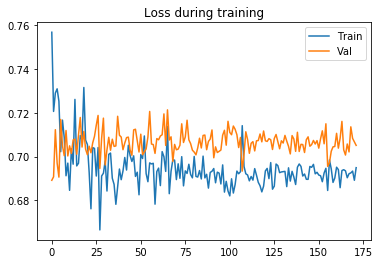

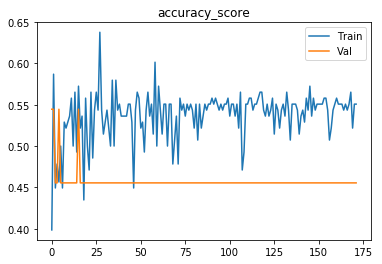

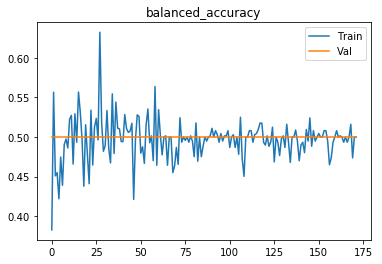

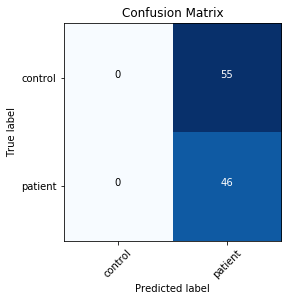

###### Starting inner fold 4
{'model': 'ModelLiu', 'batch_size': 6, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.71737
[0,     4] loss: 0.68547
[0,     6] loss: 0.70807
[0,     8] loss: 0.69401
[0,    10] loss: 0.72925
[0,    12] loss: 0.68034
[0,    14] loss: 0.62706
[0,    16] loss: 0.67150
[0,    18] loss: 0.84350
[0,    20] loss: 0.71377
[0,    22] loss: 0.69008
Time elapsed: 0h:0m:2s
train accuracy_score: 53.62 %
train balanced_accuracy: 50.17 %
val accuracy_score: 51.49 %
val balanced_accuracy: 52.79 %
Val loss: 0.691746
[1,     2] loss: 0.68798
[1,     4] loss: 0.72092
[1,     6] loss: 0.71898
[1,     8] loss: 0.67739
[1,    10] loss: 0.68885
[1,    12] loss: 0.70641
[1,    14] loss: 0.70093
[1,    16] loss: 0.82518
[1,    18] loss: 0.75887
[1,    20] loss: 0.72889
[1,    22] loss: 0.64916
Time elapsed: 0h:0m:5s
train accuracy_score: 42.75 %
train balanced_accuracy: 41.64 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss:

[18,     8] loss: 0.62659
[18,    10] loss: 0.71123
[18,    12] loss: 0.80525
[18,    14] loss: 0.66584
[18,    16] loss: 0.70330
[18,    18] loss: 0.76116
[18,    20] loss: 0.80357
[18,    22] loss: 0.73187
Time elapsed: 0h:0m:55s
train accuracy_score: 55.07 %
train balanced_accuracy: 50.45 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.720607
[19,     2] loss: 0.68552
[19,     4] loss: 0.68320
[19,     6] loss: 0.65583
[19,     8] loss: 0.68281
[19,    10] loss: 0.69819
[19,    12] loss: 0.70637
[19,    14] loss: 0.73391
[19,    16] loss: 0.65347
[19,    18] loss: 0.67339
[19,    20] loss: 0.69045
[19,    22] loss: 0.70125
Time elapsed: 0h:0m:59s
train accuracy_score: 53.62 %
train balanced_accuracy: 50.47 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.699330
[20,     2] loss: 0.72366
[20,     4] loss: 0.72337
[20,     6] loss: 0.73657
[20,     8] loss: 0.62863
[20,    10] loss: 0.72801
[20,    12] loss: 0.72893
[20,    14] loss: 0.

[36,    14] loss: 0.69503
[36,    16] loss: 0.68487
[36,    18] loss: 0.65019
[36,    20] loss: 0.80195
[36,    22] loss: 0.73463
Time elapsed: 0h:1m:49s
train accuracy_score: 55.80 %
train balanced_accuracy: 51.99 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.715872
[37,     2] loss: 0.70157
[37,     4] loss: 0.71112
[37,     6] loss: 0.63418
[37,     8] loss: 0.74165
[37,    10] loss: 0.69228
[37,    12] loss: 0.68306
[37,    14] loss: 0.70317
[37,    16] loss: 0.69502
[37,    18] loss: 0.72349
[37,    20] loss: 0.72005
[37,    22] loss: 0.70326
Time elapsed: 0h:1m:52s
train accuracy_score: 52.17 %
train balanced_accuracy: 48.11 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.710052
[38,     2] loss: 0.68039
[38,     4] loss: 0.73995
[38,     6] loss: 0.65340
[38,     8] loss: 0.67481
[38,    10] loss: 0.73671
[38,    12] loss: 0.68096
[38,    14] loss: 0.70994
[38,    16] loss: 0.72501
[38,    18] loss: 0.65221
[38,    20] loss: 0.

Time elapsed: 0h:2m:43s
train accuracy_score: 53.62 %
train balanced_accuracy: 49.13 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.713002
[55,     2] loss: 0.71878
[55,     4] loss: 0.74145
[55,     6] loss: 0.67333
[55,     8] loss: 0.70812
[55,    10] loss: 0.69149
[55,    12] loss: 0.70553
[55,    14] loss: 0.67599
[55,    16] loss: 0.63550
[55,    18] loss: 0.64730
[55,    20] loss: 0.69121
[55,    22] loss: 0.70821
Time elapsed: 0h:2m:46s
train accuracy_score: 51.45 %
train balanced_accuracy: 48.79 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.702424
[56,     2] loss: 0.63937
[56,     4] loss: 0.73319
[56,     6] loss: 0.71208
[56,     8] loss: 0.71442
[56,    10] loss: 0.67131
[56,    12] loss: 0.73349
[56,    14] loss: 0.70381
[56,    16] loss: 0.66180
[56,    18] loss: 0.66767
[56,    20] loss: 0.65407
[56,    22] loss: 0.67675
Time elapsed: 0h:2m:49s
train accuracy_score: 57.25 %
train balanced_accuracy: 53.01 %
val accurac

val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.704058
[73,     2] loss: 0.70515
[73,     4] loss: 0.72405
[73,     6] loss: 0.63784
[73,     8] loss: 0.71422
[73,    10] loss: 0.72000
[73,    12] loss: 0.67515
[73,    14] loss: 0.66856
[73,    16] loss: 0.65018
[73,    18] loss: 0.68464
[73,    20] loss: 0.68044
[73,    22] loss: 0.70132
Time elapsed: 0h:3m:39s
train accuracy_score: 51.45 %
train balanced_accuracy: 47.01 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.707119
[74,     2] loss: 0.65162
[74,     4] loss: 0.65605
[74,     6] loss: 0.73012
[74,     8] loss: 0.69148
[74,    10] loss: 0.67960
[74,    12] loss: 0.75622
[74,    14] loss: 0.68175
[74,    16] loss: 0.67959
[74,    18] loss: 0.67999
[74,    20] loss: 0.69793
[74,    22] loss: 0.73060
Time elapsed: 0h:3m:42s
train accuracy_score: 55.80 %
train balanced_accuracy: 51.10 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.709996
[75,     2] loss: 0.

[91,     8] loss: 0.68006
[91,    10] loss: 0.68675
[91,    12] loss: 0.66362
[91,    14] loss: 0.70961
[91,    16] loss: 0.67109
[91,    18] loss: 0.69165
[91,    20] loss: 0.74083
[91,    22] loss: 0.68526
Time elapsed: 0h:4m:33s
train accuracy_score: 54.35 %
train balanced_accuracy: 49.34 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.705490
[92,     2] loss: 0.70673
[92,     4] loss: 0.66145
[92,     6] loss: 0.68444
[92,     8] loss: 0.69402
[92,    10] loss: 0.72966
[92,    12] loss: 0.68544
[92,    14] loss: 0.68790
[92,    16] loss: 0.70498
[92,    18] loss: 0.67599
[92,    20] loss: 0.66294
[92,    22] loss: 0.70462
Time elapsed: 0h:4m:36s
train accuracy_score: 51.45 %
train balanced_accuracy: 46.71 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.702593
[93,     2] loss: 0.70500
[93,     4] loss: 0.65894
[93,     6] loss: 0.70300
[93,     8] loss: 0.71792
[93,    10] loss: 0.64514
[93,    12] loss: 0.68633
[93,    14] loss: 0.

[109,     8] loss: 0.66428
[109,    10] loss: 0.65059
[109,    12] loss: 0.68904
[109,    14] loss: 0.73271
[109,    16] loss: 0.67381
[109,    18] loss: 0.68482
[109,    20] loss: 0.70386
[109,    22] loss: 0.69151
Time elapsed: 0h:5m:27s
train accuracy_score: 55.07 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.706687
[110,     2] loss: 0.70013
[110,     4] loss: 0.67502
[110,     6] loss: 0.67326
[110,     8] loss: 0.69867
[110,    10] loss: 0.68966
[110,    12] loss: 0.68843
[110,    14] loss: 0.64843
[110,    16] loss: 0.69840
[110,    18] loss: 0.68973
[110,    20] loss: 0.71621
[110,    22] loss: 0.70715
Time elapsed: 0h:5m:30s
train accuracy_score: 55.07 %
train balanced_accuracy: 50.00 %
val accuracy_score: 47.52 %
val balanced_accuracy: 48.62 %
Val loss: 0.696318
[111,     2] loss: 0.71479
[111,     4] loss: 0.69126
[111,     6] loss: 0.70363
[111,     8] loss: 0.69471
[111,    10] loss: 0.68103
[111,    12] loss: 0.6

[127,     2] loss: 0.73082
[127,     4] loss: 0.65147
[127,     6] loss: 0.69012
[127,     8] loss: 0.71113
[127,    10] loss: 0.68411
[127,    12] loss: 0.66658
[127,    14] loss: 0.63377
[127,    16] loss: 0.76399
[127,    18] loss: 0.69120
[127,    20] loss: 0.66804
[127,    22] loss: 0.70211
Time elapsed: 0h:6m:21s
train accuracy_score: 55.07 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.708296
[128,     2] loss: 0.73192
[128,     4] loss: 0.72584
[128,     6] loss: 0.70901
[128,     8] loss: 0.71091
[128,    10] loss: 0.67160
[128,    12] loss: 0.66307
[128,    14] loss: 0.68467
[128,    16] loss: 0.69107
[128,    18] loss: 0.66723
[128,    20] loss: 0.65918
[128,    22] loss: 0.68767
Time elapsed: 0h:6m:24s
train accuracy_score: 55.07 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.704415
[129,     2] loss: 0.71849
[129,     4] loss: 0.72284
[129,     6] loss: 0.6

val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.710246
[145,     2] loss: 0.62785
[145,     4] loss: 0.67323
[145,     6] loss: 0.76565
[145,     8] loss: 0.68062
[145,    10] loss: 0.69038
[145,    12] loss: 0.72155
[145,    14] loss: 0.73829
[145,    16] loss: 0.65254
[145,    18] loss: 0.64657
[145,    20] loss: 0.66930
[145,    22] loss: 0.71660
Time elapsed: 0h:7m:15s
train accuracy_score: 55.07 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.707385
[146,     2] loss: 0.67569
[146,     4] loss: 0.65139
[146,     6] loss: 0.67856
[146,     8] loss: 0.69605
[146,    10] loss: 0.69335
[146,    12] loss: 0.70951
[146,    14] loss: 0.68334
[146,    16] loss: 0.69704
[146,    18] loss: 0.64236
[146,    20] loss: 0.73096
[146,    22] loss: 0.70183
Time elapsed: 0h:7m:18s
train accuracy_score: 55.07 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.70858

Time elapsed: 0h:8m:6s
train accuracy_score: 55.07 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.710764
[163,     2] loss: 0.69715
[163,     4] loss: 0.68599
[163,     6] loss: 0.70630
[163,     8] loss: 0.66754
[163,    10] loss: 0.64090
[163,    12] loss: 0.64443
[163,    14] loss: 0.63171
[163,    16] loss: 0.74967
[163,    18] loss: 0.73655
[163,    20] loss: 0.70604
[163,    22] loss: 0.75508
Time elapsed: 0h:8m:9s
train accuracy_score: 55.07 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.715796
[164,     2] loss: 0.67409
[164,     4] loss: 0.70348
[164,     6] loss: 0.67372
[164,     8] loss: 0.69686
[164,    10] loss: 0.64696
[164,    12] loss: 0.71096
[164,    14] loss: 0.69654
[164,    16] loss: 0.62880
[164,    18] loss: 0.70517
[164,    20] loss: 0.65167
[164,    22] loss: 0.73921
Time elapsed: 0h:8m:12s
train accuracy_score: 55.07 %
train balanced_accuracy:

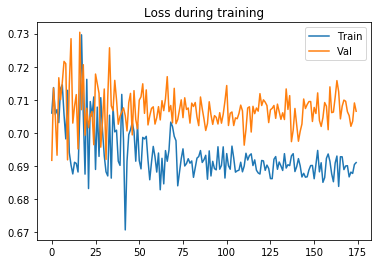

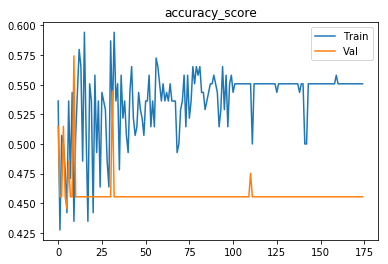

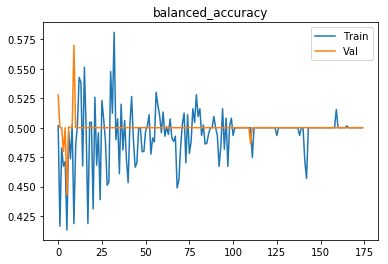

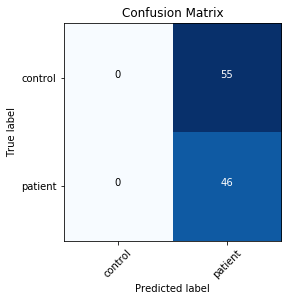

Finished outer fold.
{'final_acc': 0.5, 'best_acc': 0.5, 'final_iter': 179, 'best_iter': 33, 'params': {'model': 'ModelLiu', 'batch_size': 12, 'patience': 12, 'lr': 0.001}, 'inner_fold_idx': 0}
###### Starting outer fold 3
# of patients 98, # of healthy controls 141
141
98
###### Starting inner fold 0
{'model': 'ModelLiu', 'batch_size': 6, 'patience': 12, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.73147
[0,     4] loss: 0.70920
[0,     6] loss: 0.68020
[0,     8] loss: 0.67880
[0,    10] loss: 0.72256
[0,    12] loss: 0.69431
[0,    14] loss: 0.69842
[0,    16] loss: 0.68840
[0,    18] loss: 0.67275
[0,    20] loss: 0.69554
[0,    22] loss: 0.56146
Time elapsed: 0h:0m:2s
train accuracy_score: 53.19 %
train balanced_accuracy: 50.40 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.667517
[1,     2] loss: 0.72977
[1,     4] loss: 0.54142
[1,     6] loss: 0.60312
[1,     8] loss: 0.64174
[1,    10] loss: 0.71778
[1,    12] loss: 0.78217
[1,  

[17,    22] loss: 0.68713
Time elapsed: 0h:0m:52s
train accuracy_score: 48.94 %
train balanced_accuracy: 45.83 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.669448
[18,     2] loss: 0.73540
[18,     4] loss: 0.71489
[18,     6] loss: 0.69745
[18,     8] loss: 0.71619
[18,    10] loss: 0.77521
[18,    12] loss: 0.63645
[18,    14] loss: 0.64563
[18,    16] loss: 0.71427
[18,    18] loss: 0.65425
[18,    20] loss: 0.72532
[18,    22] loss: 0.67702
Time elapsed: 0h:0m:55s
train accuracy_score: 54.61 %
train balanced_accuracy: 48.61 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.667730
[19,     2] loss: 0.56685
[19,     4] loss: 0.77975
[19,     6] loss: 0.58671
[19,     8] loss: 0.69919
[19,    10] loss: 0.72378
[19,    12] loss: 0.89297
[19,    14] loss: 0.71617
[19,    16] loss: 0.73466
[19,    18] loss: 0.63022
[19,    20] loss: 0.65549
[19,    22] loss: 0.62065
Time elapsed: 0h:0m:58s
train accuracy_score: 55.32 %
train balanced_acc

val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.671272
[36,     2] loss: 0.67544
[36,     4] loss: 0.65746
[36,     6] loss: 0.65240
[36,     8] loss: 0.81119
[36,    10] loss: 0.76772
[36,    12] loss: 0.65473
[36,    14] loss: 0.65644
[36,    16] loss: 0.72457
[36,    18] loss: 0.65803
[36,    20] loss: 0.64246
[36,    22] loss: 0.77554
Time elapsed: 0h:1m:49s
train accuracy_score: 52.48 %
train balanced_accuracy: 46.54 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.669487
[37,     2] loss: 0.74460
[37,     4] loss: 0.72265
[37,     6] loss: 0.65370
[37,     8] loss: 0.70751
[37,    10] loss: 0.79666
[37,    12] loss: 0.62860
[37,    14] loss: 0.55330
[37,    16] loss: 0.70781
[37,    18] loss: 0.65135
[37,    20] loss: 0.91015
[37,    22] loss: 0.76540
Time elapsed: 0h:1m:52s
train accuracy_score: 47.52 %
train balanced_accuracy: 42.44 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.668078
[38,     2] loss: 0.

[54,     6] loss: 0.64656
[54,     8] loss: 0.61914
[54,    10] loss: 0.69987
[54,    12] loss: 0.65997
[54,    14] loss: 0.65996
[54,    16] loss: 0.73809
[54,    18] loss: 0.66839
[54,    20] loss: 0.69381
[54,    22] loss: 0.73510
Time elapsed: 0h:2m:49s
train accuracy_score: 56.03 %
train balanced_accuracy: 49.85 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.670121
[55,     2] loss: 0.66550
[55,     4] loss: 0.75115
[55,     6] loss: 0.59275
[55,     8] loss: 0.63592
[55,    10] loss: 0.65264
[55,    12] loss: 0.76456
[55,    14] loss: 0.72085
[55,    16] loss: 0.82976
[55,    18] loss: 0.68773
[55,    20] loss: 0.71791
[55,    22] loss: 0.66281
Time elapsed: 0h:2m:53s
train accuracy_score: 53.90 %
train balanced_accuracy: 47.78 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.677091
[56,     2] loss: 0.70756
[56,     4] loss: 0.69994
[56,     6] loss: 0.70433
[56,     8] loss: 0.64123
[56,    10] loss: 0.62689
[56,    12] loss: 0.

[72,    12] loss: 0.62511
[72,    14] loss: 0.73144
[72,    16] loss: 0.64686
[72,    18] loss: 0.72490
[72,    20] loss: 0.71205
[72,    22] loss: 0.62442
Time elapsed: 0h:4m:0s
train accuracy_score: 56.74 %
train balanced_accuracy: 49.60 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.671238
[73,     2] loss: 0.65010
[73,     4] loss: 0.72950
[73,     6] loss: 0.72646
[73,     8] loss: 0.66643
[73,    10] loss: 0.66956
[73,    12] loss: 0.60537
[73,    14] loss: 0.71484
[73,    16] loss: 0.64927
[73,    18] loss: 0.76925
[73,    20] loss: 0.65136
[73,    22] loss: 0.76754
Time elapsed: 0h:4m:5s
train accuracy_score: 56.74 %
train balanced_accuracy: 49.81 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.669939
[74,     2] loss: 0.72562
[74,     4] loss: 0.65924
[74,     6] loss: 0.64295
[74,     8] loss: 0.71531
[74,    10] loss: 0.67913
[74,    12] loss: 0.73154
[74,    14] loss: 0.73041
[74,    16] loss: 0.66265
[74,    18] loss: 0.65

Time elapsed: 0h:5m:11s
train accuracy_score: 57.45 %
train balanced_accuracy: 50.65 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.670385
[91,     2] loss: 0.68270
[91,     4] loss: 0.64560
[91,     6] loss: 0.66657
[91,     8] loss: 0.63131
[91,    10] loss: 0.66699
[91,    12] loss: 0.76031
[91,    14] loss: 0.71350
[91,    16] loss: 0.69277
[91,    18] loss: 0.73327
[91,    20] loss: 0.71041
[91,    22] loss: 0.70339
Time elapsed: 0h:5m:15s
train accuracy_score: 57.45 %
train balanced_accuracy: 50.00 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.669638
[92,     2] loss: 0.68610
[92,     4] loss: 0.67029
[92,     6] loss: 0.62817
[92,     8] loss: 0.80551
[92,    10] loss: 0.68328
[92,    12] loss: 0.71641
[92,    14] loss: 0.67954
[92,    16] loss: 0.74469
[92,    18] loss: 0.70285
[92,    20] loss: 0.70089
[92,    22] loss: 0.72312
Time elapsed: 0h:5m:19s
train accuracy_score: 56.74 %
train balanced_accuracy: 49.38 %
val accurac

Time elapsed: 0h:6m:13s
train accuracy_score: 59.57 %
train balanced_accuracy: 52.93 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.676086
[109,     2] loss: 0.65216
[109,     4] loss: 0.65817
[109,     6] loss: 0.69853
[109,     8] loss: 0.68675
[109,    10] loss: 0.70966
[109,    12] loss: 0.55704
[109,    14] loss: 0.71038
[109,    16] loss: 0.66926
[109,    18] loss: 0.77513
[109,    20] loss: 0.74807
[109,    22] loss: 0.73133
Time elapsed: 0h:6m:17s
train accuracy_score: 58.87 %
train balanced_accuracy: 51.67 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.671181
[110,     2] loss: 0.72326
[110,     4] loss: 0.68673
[110,     6] loss: 0.67437
[110,     8] loss: 0.69053
[110,    10] loss: 0.67659
[110,    12] loss: 0.73742
[110,    14] loss: 0.68546
[110,    16] loss: 0.67836
[110,    18] loss: 0.67464
[110,    20] loss: 0.70149
[110,    22] loss: 0.68096
Time elapsed: 0h:6m:21s
train accuracy_score: 58.16 %
train balanced_accurac

[126,    16] loss: 0.72319
[126,    18] loss: 0.69970
[126,    20] loss: 0.71834
[126,    22] loss: 0.63697
Time elapsed: 0h:7m:23s
train accuracy_score: 57.45 %
train balanced_accuracy: 50.00 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.671351
[127,     2] loss: 0.62401
[127,     4] loss: 0.67493
[127,     6] loss: 0.68687
[127,     8] loss: 0.64306
[127,    10] loss: 0.66203
[127,    12] loss: 0.72940
[127,    14] loss: 0.67645
[127,    16] loss: 0.67284
[127,    18] loss: 0.76701
[127,    20] loss: 0.63429
[127,    22] loss: 0.73184
Time elapsed: 0h:7m:26s
train accuracy_score: 57.45 %
train balanced_accuracy: 50.00 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.670338
[128,     2] loss: 0.71646
[128,     4] loss: 0.72347
[128,     6] loss: 0.66922
[128,     8] loss: 0.69371
[128,    10] loss: 0.70155
[128,    12] loss: 0.69660
[128,    14] loss: 0.63624
[128,    16] loss: 0.73596
[128,    18] loss: 0.65669
[128,    20] loss: 0.7

[144,    10] loss: 0.69397
[144,    12] loss: 0.69431
[144,    14] loss: 0.62056
[144,    16] loss: 0.65291
[144,    18] loss: 0.60498
[144,    20] loss: 0.65956
[144,    22] loss: 0.75795
Time elapsed: 0h:8m:31s
train accuracy_score: 57.45 %
train balanced_accuracy: 50.00 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.669685
[145,     2] loss: 0.62962
[145,     4] loss: 0.71121
[145,     6] loss: 0.69840
[145,     8] loss: 0.73522
[145,    10] loss: 0.72767
[145,    12] loss: 0.60845
[145,    14] loss: 0.62147
[145,    16] loss: 0.67582
[145,    18] loss: 0.69260
[145,    20] loss: 0.71838
[145,    22] loss: 0.64575
Time elapsed: 0h:8m:35s
train accuracy_score: 57.45 %
train balanced_accuracy: 50.00 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.671261
[146,     2] loss: 0.67824
[146,     4] loss: 0.72223
[146,     6] loss: 0.68940
[146,     8] loss: 0.68339
[146,    10] loss: 0.72015
[146,    12] loss: 0.65278
[146,    14] loss: 0.6

[162,     2] loss: 0.69365
[162,     4] loss: 0.73643
[162,     6] loss: 0.67281
[162,     8] loss: 0.70897
[162,    10] loss: 0.60725
[162,    12] loss: 0.59203
[162,    14] loss: 0.65034
[162,    16] loss: 0.75633
[162,    18] loss: 0.61186
[162,    20] loss: 0.77359
[162,    22] loss: 0.69094
Time elapsed: 0h:9m:41s
train accuracy_score: 57.45 %
train balanced_accuracy: 50.00 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.670026
[163,     2] loss: 0.65047
[163,     4] loss: 0.67549
[163,     6] loss: 0.72819
[163,     8] loss: 0.67700
[163,    10] loss: 0.71502
[163,    12] loss: 0.64484
[163,    14] loss: 0.70977
[163,    16] loss: 0.73342
[163,    18] loss: 0.63019
[163,    20] loss: 0.67753
[163,    22] loss: 0.69049
Time elapsed: 0h:9m:45s
train accuracy_score: 57.45 %
train balanced_accuracy: 50.00 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.670235
[164,     2] loss: 0.70183
[164,     4] loss: 0.66323
[164,     6] loss: 0.6

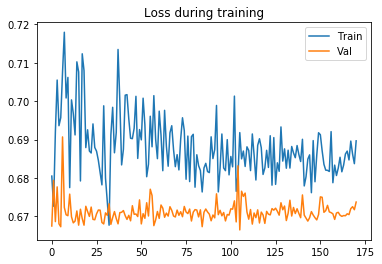

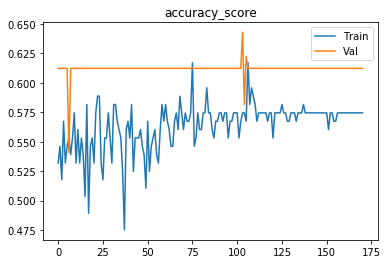

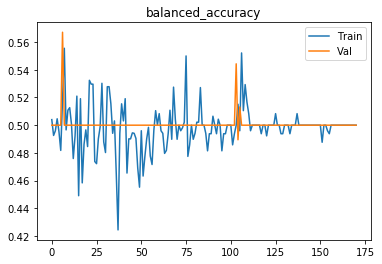

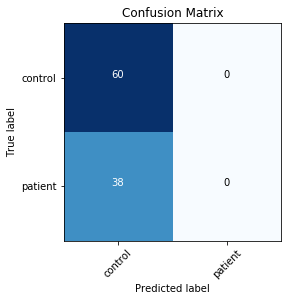

###### Starting inner fold 1
{'model': 'ModelLiu', 'batch_size': 4, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.70313
[0,     4] loss: 0.67087
[0,     6] loss: 0.67676
[0,     8] loss: 0.66639
[0,    10] loss: 0.95947
[0,    12] loss: 0.72764
[0,    14] loss: 0.71718
[0,    16] loss: 0.74767
[0,    18] loss: 0.69921
[0,    20] loss: 0.69909
[0,    22] loss: 0.68620
[0,    24] loss: 0.70220
[0,    26] loss: 0.61054
[0,    28] loss: 0.79328
[0,    30] loss: 0.95344
[0,    32] loss: 0.70658
[0,    34] loss: 0.61318
Time elapsed: 0h:0m:3s
train accuracy_score: 53.19 %
train balanced_accuracy: 49.75 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.669542
[1,     2] loss: 0.75593
[1,     4] loss: 0.61627
[1,     6] loss: 0.69324
[1,     8] loss: 0.78862
[1,    10] loss: 0.63518
[1,    12] loss: 0.64162
[1,    14] loss: 0.69640
[1,    16] loss: 0.62450
[1,    18] loss: 0.77377
[1,    20] loss: 0.71533
[1,    22] loss: 0.74552
[1, 

[13,    30] loss: 0.62630
[13,    32] loss: 0.77202
[13,    34] loss: 0.67617
Time elapsed: 0h:0m:53s
train accuracy_score: 51.77 %
train balanced_accuracy: 47.01 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.668979
[14,     2] loss: 0.64170
[14,     4] loss: 0.70716
[14,     6] loss: 0.65234
[14,     8] loss: 0.66497
[14,    10] loss: 0.69415
[14,    12] loss: 0.65752
[14,    14] loss: 0.63174
[14,    16] loss: 0.74173
[14,    18] loss: 0.59818
[14,    20] loss: 0.61817
[14,    22] loss: 0.75653
[14,    24] loss: 0.69031
[14,    26] loss: 0.64316
[14,    28] loss: 0.69112
[14,    30] loss: 0.67986
[14,    32] loss: 0.73102
[14,    34] loss: 0.76567
Time elapsed: 0h:0m:58s
train accuracy_score: 58.87 %
train balanced_accuracy: 52.53 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.668546
[15,     2] loss: 0.78173
[15,     4] loss: 0.63165
[15,     6] loss: 0.68343
[15,     8] loss: 0.76081
[15,    10] loss: 0.71692
[15,    12] loss: 0.

[27,    10] loss: 0.80075
[27,    12] loss: 0.73677
[27,    14] loss: 0.72119
[27,    16] loss: 0.66361
[27,    18] loss: 0.62293
[27,    20] loss: 0.70247
[27,    22] loss: 0.63333
[27,    24] loss: 0.69282
[27,    26] loss: 0.72871
[27,    28] loss: 0.69172
[27,    30] loss: 0.71100
[27,    32] loss: 0.68527
[27,    34] loss: 0.60697
Time elapsed: 0h:1m:49s
train accuracy_score: 51.06 %
train balanced_accuracy: 44.88 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.672063
[28,     2] loss: 0.74212
[28,     4] loss: 0.72897
[28,     6] loss: 0.73479
[28,     8] loss: 0.75176
[28,    10] loss: 0.62496
[28,    12] loss: 0.67329
[28,    14] loss: 0.62844
[28,    16] loss: 0.66176
[28,    18] loss: 0.62853
[28,    20] loss: 0.69980
[28,    22] loss: 0.65251
[28,    24] loss: 0.60538
[28,    26] loss: 0.76831
[28,    28] loss: 0.61845
[28,    30] loss: 0.71494
[28,    32] loss: 0.68414
[28,    34] loss: 0.81314
Time elapsed: 0h:1m:53s
train accuracy_score: 56.03 %
t

Time elapsed: 0h:2m:40s
train accuracy_score: 57.45 %
train balanced_accuracy: 50.00 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.672934
[41,     2] loss: 0.64916
[41,     4] loss: 0.76221
[41,     6] loss: 0.70199
[41,     8] loss: 0.73194
[41,    10] loss: 0.65423
[41,    12] loss: 0.75508
[41,    14] loss: 0.60634
[41,    16] loss: 0.56984
[41,    18] loss: 0.80559
[41,    20] loss: 0.70859
[41,    22] loss: 0.70452
[41,    24] loss: 0.71608
[41,    26] loss: 0.63144
[41,    28] loss: 0.69485
[41,    30] loss: 0.66598
[41,    32] loss: 0.62916
[41,    34] loss: 0.78280
Time elapsed: 0h:2m:44s
train accuracy_score: 56.74 %
train balanced_accuracy: 49.38 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.670014
[42,     2] loss: 0.72079
[42,     4] loss: 0.63803
[42,     6] loss: 0.70503
[42,     8] loss: 0.76848
[42,    10] loss: 0.68606
[42,    12] loss: 0.72072
[42,    14] loss: 0.69968
[42,    16] loss: 0.62090
[42,    18] loss: 0.

[54,    16] loss: 0.70146
[54,    18] loss: 0.68283
[54,    20] loss: 0.66603
[54,    22] loss: 0.67111
[54,    24] loss: 0.69128
[54,    26] loss: 0.66375
[54,    28] loss: 0.59669
[54,    30] loss: 0.66466
[54,    32] loss: 0.72848
[54,    34] loss: 0.65119
Time elapsed: 0h:3m:37s
train accuracy_score: 56.74 %
train balanced_accuracy: 49.60 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.670815
[55,     2] loss: 0.65074
[55,     4] loss: 0.62991
[55,     6] loss: 0.71591
[55,     8] loss: 0.69263
[55,    10] loss: 0.70473
[55,    12] loss: 0.64990
[55,    14] loss: 0.70031
[55,    16] loss: 0.68045
[55,    18] loss: 0.61614
[55,    20] loss: 0.76582
[55,    22] loss: 0.70648
[55,    24] loss: 0.67668
[55,    26] loss: 0.74534
[55,    28] loss: 0.83784
[55,    30] loss: 0.69733
[55,    32] loss: 0.65917
[55,    34] loss: 0.68372
Time elapsed: 0h:3m:41s
train accuracy_score: 57.45 %
train balanced_accuracy: 50.00 %
val accuracy_score: 61.22 %
val balanced_accur

val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.671479
[68,     2] loss: 0.64079
[68,     4] loss: 0.67668
[68,     6] loss: 0.67402
[68,     8] loss: 0.73315
[68,    10] loss: 0.65743
[68,    12] loss: 0.71409
[68,    14] loss: 0.69141
[68,    16] loss: 0.57092
[68,    18] loss: 0.70596
[68,    20] loss: 0.65100
[68,    22] loss: 0.67815
[68,    24] loss: 0.77723
[68,    26] loss: 0.64973
[68,    28] loss: 0.75024
[68,    30] loss: 0.63861
[68,    32] loss: 0.75207
[68,    34] loss: 0.72606
Time elapsed: 0h:4m:34s
train accuracy_score: 57.45 %
train balanced_accuracy: 50.00 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.670111
[69,     2] loss: 0.74542
[69,     4] loss: 0.67509
[69,     6] loss: 0.70249
[69,     8] loss: 0.72483
[69,    10] loss: 0.72318
[69,    12] loss: 0.67665
[69,    14] loss: 0.70421
[69,    16] loss: 0.70660
[69,    18] loss: 0.71595
[69,    20] loss: 0.70334
[69,    22] loss: 0.67972
[69,    24] loss: 0.69844
[69

[81,    22] loss: 0.69310
[81,    24] loss: 0.66627
[81,    26] loss: 0.60376
[81,    28] loss: 0.64121
[81,    30] loss: 0.69891
[81,    32] loss: 0.67673
[81,    34] loss: 0.72358
Time elapsed: 0h:5m:27s
train accuracy_score: 57.45 %
train balanced_accuracy: 50.00 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.669487
[82,     2] loss: 0.70973
[82,     4] loss: 0.54008
[82,     6] loss: 0.65362
[82,     8] loss: 0.63411
[82,    10] loss: 0.77326
[82,    12] loss: 0.65198
[82,    14] loss: 0.71567
[82,    16] loss: 0.63200
[82,    18] loss: 0.75500
[82,    20] loss: 0.60413
[82,    22] loss: 0.70922
[82,    24] loss: 0.67393
[82,    26] loss: 0.65113
[82,    28] loss: 0.69383
[82,    30] loss: 0.70240
[82,    32] loss: 0.71047
[82,    34] loss: 0.66722
Time elapsed: 0h:5m:31s
train accuracy_score: 57.45 %
train balanced_accuracy: 50.00 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.670399
[83,     2] loss: 0.63120
[83,     4] loss: 0.

[95,     2] loss: 0.79778
[95,     4] loss: 0.72096
[95,     6] loss: 0.63421
[95,     8] loss: 0.76817
[95,    10] loss: 0.66937
[95,    12] loss: 0.65831
[95,    14] loss: 0.68351
[95,    16] loss: 0.75194
[95,    18] loss: 0.69054
[95,    20] loss: 0.62735
[95,    22] loss: 0.64578
[95,    24] loss: 0.67904
[95,    26] loss: 0.70477
[95,    28] loss: 0.63889
[95,    30] loss: 0.64112
[95,    32] loss: 0.64136
[95,    34] loss: 0.70082
Time elapsed: 0h:6m:25s
train accuracy_score: 57.45 %
train balanced_accuracy: 50.22 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.674016
[96,     2] loss: 0.74470
[96,     4] loss: 0.69976
[96,     6] loss: 0.69000
[96,     8] loss: 0.69614
[96,    10] loss: 0.59244
[96,    12] loss: 0.72084
[96,    14] loss: 0.65644
[96,    16] loss: 0.73808
[96,    18] loss: 0.66745
[96,    20] loss: 0.66737
[96,    22] loss: 0.72304
[96,    24] loss: 0.69685
[96,    26] loss: 0.67080
[96,    28] loss: 0.60963
[96,    30] loss: 0.63223
[96

[108,    16] loss: 0.75692
[108,    18] loss: 0.61760
[108,    20] loss: 0.65390
[108,    22] loss: 0.74890
[108,    24] loss: 0.74862
[108,    26] loss: 0.79551
[108,    28] loss: 0.71085
[108,    30] loss: 0.66837
[108,    32] loss: 0.58385
[108,    34] loss: 0.72506
Time elapsed: 0h:7m:17s
train accuracy_score: 57.45 %
train balanced_accuracy: 50.00 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.670019
[109,     2] loss: 0.65662
[109,     4] loss: 0.73552
[109,     6] loss: 0.64952
[109,     8] loss: 0.83733
[109,    10] loss: 0.68400
[109,    12] loss: 0.62897
[109,    14] loss: 0.73395
[109,    16] loss: 0.70034
[109,    18] loss: 0.63685
[109,    20] loss: 0.66556
[109,    22] loss: 0.70088
[109,    24] loss: 0.66571
[109,    26] loss: 0.62043
[109,    28] loss: 0.65784
[109,    30] loss: 0.67658
[109,    32] loss: 0.72953
[109,    34] loss: 0.66603
Time elapsed: 0h:7m:21s
train accuracy_score: 57.45 %
train balanced_accuracy: 50.00 %
val accuracy_score:

[121,    30] loss: 0.69666
[121,    32] loss: 0.70999
[121,    34] loss: 0.61566
Time elapsed: 0h:8m:10s
train accuracy_score: 57.45 %
train balanced_accuracy: 50.00 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.674835
[122,     2] loss: 0.63245
[122,     4] loss: 0.62287
[122,     6] loss: 0.75031
[122,     8] loss: 0.71514
[122,    10] loss: 0.66430
[122,    12] loss: 0.72977
[122,    14] loss: 0.65090
[122,    16] loss: 0.61534
[122,    18] loss: 0.72810
[122,    20] loss: 0.69585
[122,    22] loss: 0.65615
[122,    24] loss: 0.68937
[122,    26] loss: 0.70685
[122,    28] loss: 0.74758
[122,    30] loss: 0.69690
[122,    32] loss: 0.70309
[122,    34] loss: 0.65855
Time elapsed: 0h:8m:14s
train accuracy_score: 57.45 %
train balanced_accuracy: 50.00 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.670798
[123,     2] loss: 0.67336
[123,     4] loss: 0.62618
[123,     6] loss: 0.68225
[123,     8] loss: 0.74162
[123,    10] loss: 0.6

Time elapsed: 0h:8m:58s
train accuracy_score: 57.45 %
train balanced_accuracy: 50.00 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.670406
[135,     2] loss: 0.59773
[135,     4] loss: 0.65791
[135,     6] loss: 0.71812
[135,     8] loss: 0.62133
[135,    10] loss: 0.67853
[135,    12] loss: 0.63751
[135,    14] loss: 0.74487
[135,    16] loss: 0.65883
[135,    18] loss: 0.65749
[135,    20] loss: 0.83804
[135,    22] loss: 0.59575
[135,    24] loss: 0.60488
[135,    26] loss: 0.65478
[135,    28] loss: 0.75157
[135,    30] loss: 0.70663
[135,    32] loss: 0.84362
[135,    34] loss: 0.70246
Time elapsed: 0h:9m:2s
train accuracy_score: 57.45 %
train balanced_accuracy: 50.00 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.668978
[136,     2] loss: 0.74275
[136,     4] loss: 0.84740
[136,     6] loss: 0.62589
[136,     8] loss: 0.66059
[136,    10] loss: 0.62144
[136,    12] loss: 0.64033
[136,    14] loss: 0.74731
[136,    16] loss: 0.68

val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.680348
[148,     2] loss: 0.66857
[148,     4] loss: 0.71872
[148,     6] loss: 0.72354
[148,     8] loss: 0.68719
[148,    10] loss: 0.62063
[148,    12] loss: 0.67336
[148,    14] loss: 0.62386
[148,    16] loss: 0.74372
[148,    18] loss: 0.67161
[148,    20] loss: 0.66755
[148,    22] loss: 0.73601
[148,    24] loss: 0.71999
[148,    26] loss: 0.58218
[148,    28] loss: 0.75932
[148,    30] loss: 0.63287
[148,    32] loss: 0.69576
[148,    34] loss: 0.80244
Time elapsed: 0h:9m:54s
train accuracy_score: 57.45 %
train balanced_accuracy: 50.00 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.669686
[149,     2] loss: 0.63091
[149,     4] loss: 0.71509
[149,     6] loss: 0.71239
[149,     8] loss: 0.65708
[149,    10] loss: 0.71218
[149,    12] loss: 0.67593
[149,    14] loss: 0.64836
[149,    16] loss: 0.58444
[149,    18] loss: 0.74407
[149,    20] loss: 0.65911
[149,    22] loss: 0.57505
[

[161,     2] loss: 0.68167
[161,     4] loss: 0.67717
[161,     6] loss: 0.60934
[161,     8] loss: 0.76700
[161,    10] loss: 0.67438
[161,    12] loss: 0.67214
[161,    14] loss: 0.64723
[161,    16] loss: 0.74937
[161,    18] loss: 0.64381
[161,    20] loss: 0.66169
[161,    22] loss: 0.67019
[161,    24] loss: 0.67304
[161,    26] loss: 0.71041
[161,    28] loss: 0.67922
[161,    30] loss: 0.63220
[161,    32] loss: 0.67044
[161,    34] loss: 0.75261
Time elapsed: 0h:10m:45s
train accuracy_score: 56.74 %
train balanced_accuracy: 49.60 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.679745
[162,     2] loss: 0.69933
[162,     4] loss: 0.69806
[162,     6] loss: 0.66051
[162,     8] loss: 0.66382
[162,    10] loss: 0.59926
[162,    12] loss: 0.62611
[162,    14] loss: 0.79280
[162,    16] loss: 0.76358
[162,    18] loss: 0.71243
[162,    20] loss: 0.63788
[162,    22] loss: 0.69485
[162,    24] loss: 0.69815
[162,    26] loss: 0.70216
[162,    28] loss: 0.670

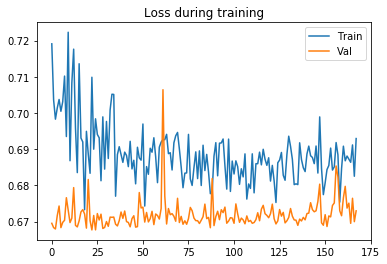

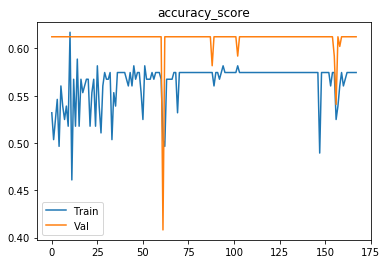

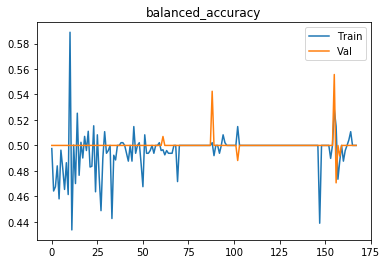

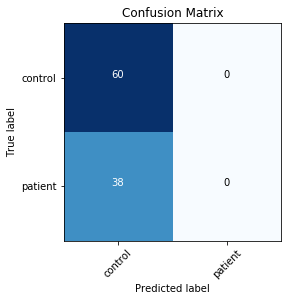

###### Starting inner fold 2
{'model': 'ModelLiu', 'batch_size': 4, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.75080
[0,     4] loss: 0.72972
[0,     6] loss: 0.66972
[0,     8] loss: 0.64618
[0,    10] loss: 0.67618
[0,    12] loss: 0.78442
[0,    14] loss: 0.46150
[0,    16] loss: 0.82228
[0,    18] loss: 0.71023
[0,    20] loss: 0.77513
[0,    22] loss: 0.76525
[0,    24] loss: 0.71219
[0,    26] loss: 0.69070
[0,    28] loss: 0.73634
[0,    30] loss: 0.69399
[0,    32] loss: 0.68336
[0,    34] loss: 0.62960
Time elapsed: 0h:0m:2s
train accuracy_score: 51.77 %
train balanced_accuracy: 46.79 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.667170
[1,     2] loss: 0.82366
[1,     4] loss: 0.83244
[1,     6] loss: 0.76427
[1,     8] loss: 0.65687
[1,    10] loss: 0.75920
[1,    12] loss: 0.67738
[1,    14] loss: 0.78259
[1,    16] loss: 0.78349
[1,    18] loss: 0.68158
[1,    20] loss: 0.60293
[1,    22] loss: 0.64299
[1, 

Time elapsed: 0h:0m:40s
train accuracy_score: 54.61 %
train balanced_accuracy: 50.99 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.669505
[14,     2] loss: 0.69028
[14,     4] loss: 0.71184
[14,     6] loss: 0.60651
[14,     8] loss: 0.62557
[14,    10] loss: 0.64812
[14,    12] loss: 0.63129
[14,    14] loss: 0.81060
[14,    16] loss: 0.56804
[14,    18] loss: 0.59353
[14,    20] loss: 0.58765
[14,    22] loss: 0.78284
[14,    24] loss: 0.76011
[14,    26] loss: 0.78017
[14,    28] loss: 0.86965
[14,    30] loss: 0.76882
[14,    32] loss: 0.64531
[14,    34] loss: 0.65881
Time elapsed: 0h:0m:43s
train accuracy_score: 55.32 %
train balanced_accuracy: 48.36 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.675083
[15,     2] loss: 0.66789
[15,     4] loss: 0.70100
[15,     6] loss: 0.70955
[15,     8] loss: 0.72776
[15,    10] loss: 0.69231
[15,    12] loss: 0.68016
[15,    14] loss: 0.72073
[15,    16] loss: 0.66724
[15,    18] loss: 0.

[27,    22] loss: 0.71541
[27,    24] loss: 0.64562
[27,    26] loss: 0.74313
[27,    28] loss: 0.62638
[27,    30] loss: 0.73244
[27,    32] loss: 0.72695
[27,    34] loss: 0.68626
Time elapsed: 0h:1m:20s
train accuracy_score: 50.35 %
train balanced_accuracy: 45.77 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.669867
[28,     2] loss: 0.64697
[28,     4] loss: 0.77363
[28,     6] loss: 0.56847
[28,     8] loss: 0.67869
[28,    10] loss: 0.61999
[28,    12] loss: 0.67931
[28,    14] loss: 0.72687
[28,    16] loss: 0.83657
[28,    18] loss: 0.71763
[28,    20] loss: 0.70502
[28,    22] loss: 0.82234
[28,    24] loss: 0.59633
[28,    26] loss: 0.67931
[28,    28] loss: 0.82569
[28,    30] loss: 0.70340
[28,    32] loss: 0.65947
[28,    34] loss: 0.63693
Time elapsed: 0h:1m:23s
train accuracy_score: 56.74 %
train balanced_accuracy: 50.03 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.677480
[29,     2] loss: 0.68368
[29,     4] loss: 0.

[41,     2] loss: 0.63968
[41,     4] loss: 0.67652
[41,     6] loss: 0.76401
[41,     8] loss: 0.71975
[41,    10] loss: 0.70217
[41,    12] loss: 0.69968
[41,    14] loss: 0.67627
[41,    16] loss: 0.62210
[41,    18] loss: 0.73599
[41,    20] loss: 0.55120
[41,    22] loss: 0.80509
[41,    24] loss: 0.66861
[41,    26] loss: 0.62673
[41,    28] loss: 0.67706
[41,    30] loss: 0.72799
[41,    32] loss: 0.68181
[41,    34] loss: 0.76462
Time elapsed: 0h:2m:1s
train accuracy_score: 56.03 %
train balanced_accuracy: 49.20 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.669724
[42,     2] loss: 0.73199
[42,     4] loss: 0.61384
[42,     6] loss: 0.66728
[42,     8] loss: 0.76205
[42,    10] loss: 0.78499
[42,    12] loss: 0.61521
[42,    14] loss: 0.70509
[42,    16] loss: 0.63472
[42,    18] loss: 0.73332
[42,    20] loss: 0.76610
[42,    22] loss: 0.76844
[42,    24] loss: 0.63486
[42,    26] loss: 0.69887
[42,    28] loss: 0.70672
[42,    30] loss: 0.65370
[42,

[54,    32] loss: 0.67548
[54,    34] loss: 0.76930
Time elapsed: 0h:2m:41s
train accuracy_score: 55.32 %
train balanced_accuracy: 48.36 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.670272
[55,     2] loss: 0.59932
[55,     4] loss: 0.68408
[55,     6] loss: 0.67473
[55,     8] loss: 0.67563
[55,    10] loss: 0.60626
[55,    12] loss: 0.71372
[55,    14] loss: 0.59160
[55,    16] loss: 0.70754
[55,    18] loss: 0.52013
[55,    20] loss: 0.79079
[55,    22] loss: 0.77779
[55,    24] loss: 0.63807
[55,    26] loss: 0.64585
[55,    28] loss: 0.71811
[55,    30] loss: 0.64694
[55,    32] loss: 0.76282
[55,    34] loss: 0.75928
Time elapsed: 0h:2m:44s
train accuracy_score: 57.45 %
train balanced_accuracy: 50.00 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.669133
[56,     2] loss: 0.62185
[56,     4] loss: 0.63333
[56,     6] loss: 0.67923
[56,     8] loss: 0.67049
[56,    10] loss: 0.72957
[56,    12] loss: 0.69915
[56,    14] loss: 0.

[68,    16] loss: 0.67599
[68,    18] loss: 0.72396
[68,    20] loss: 0.70797
[68,    22] loss: 0.69890
[68,    24] loss: 0.70696
[68,    26] loss: 0.67340
[68,    28] loss: 0.70484
[68,    30] loss: 0.68357
[68,    32] loss: 0.67945
[68,    34] loss: 0.64933
Time elapsed: 0h:3m:26s
train accuracy_score: 54.61 %
train balanced_accuracy: 50.12 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.676442
[69,     2] loss: 0.66819
[69,     4] loss: 0.68482
[69,     6] loss: 0.69250
[69,     8] loss: 0.63940
[69,    10] loss: 0.63219
[69,    12] loss: 0.71234
[69,    14] loss: 0.64507
[69,    16] loss: 0.66610
[69,    18] loss: 0.69561
[69,    20] loss: 0.57471
[69,    22] loss: 0.64486
[69,    24] loss: 0.85497
[69,    26] loss: 0.81408
[69,    28] loss: 0.60615
[69,    30] loss: 0.78585
[69,    32] loss: 0.70622
[69,    34] loss: 0.74314
Time elapsed: 0h:3m:29s
train accuracy_score: 57.45 %
train balanced_accuracy: 50.00 %
val accuracy_score: 61.22 %
val balanced_accur

val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.677972
[82,     2] loss: 0.66387
[82,     4] loss: 0.67158
[82,     6] loss: 0.69705
[82,     8] loss: 0.79764
[82,    10] loss: 0.64788
[82,    12] loss: 0.71008
[82,    14] loss: 0.63699
[82,    16] loss: 0.68370
[82,    18] loss: 0.66142
[82,    20] loss: 0.64057
[82,    22] loss: 0.65140
[82,    24] loss: 0.64766
[82,    26] loss: 0.78340
[82,    28] loss: 0.69245
[82,    30] loss: 0.67773
[82,    32] loss: 0.74387
[82,    34] loss: 0.60486
Time elapsed: 0h:4m:17s
train accuracy_score: 55.32 %
train balanced_accuracy: 48.80 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.673407
[83,     2] loss: 0.65724
[83,     4] loss: 0.71939
[83,     6] loss: 0.74612
[83,     8] loss: 0.65222
[83,    10] loss: 0.70153
[83,    12] loss: 0.62456
[83,    14] loss: 0.67761
[83,    16] loss: 0.70999
[83,    18] loss: 0.77897
[83,    20] loss: 0.69116
[83,    22] loss: 0.59927
[83,    24] loss: 0.66129
[83

[95,    24] loss: 0.66998
[95,    26] loss: 0.76327
[95,    28] loss: 0.75068
[95,    30] loss: 0.76263
[95,    32] loss: 0.64693
[95,    34] loss: 0.63519
Time elapsed: 0h:4m:58s
train accuracy_score: 57.45 %
train balanced_accuracy: 50.00 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.670055
[96,     2] loss: 0.75533
[96,     4] loss: 0.68915
[96,     6] loss: 0.73259
[96,     8] loss: 0.68080
[96,    10] loss: 0.63190
[96,    12] loss: 0.63357
[96,    14] loss: 0.63277
[96,    16] loss: 0.74315
[96,    18] loss: 0.71238
[96,    20] loss: 0.64680
[96,    22] loss: 0.65959
[96,    24] loss: 0.77380
[96,    26] loss: 0.67059
[96,    28] loss: 0.64224
[96,    30] loss: 0.68736
[96,    32] loss: 0.67021
[96,    34] loss: 0.63032
Time elapsed: 0h:5m:1s
train accuracy_score: 57.45 %
train balanced_accuracy: 50.00 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.670588
[97,     2] loss: 0.61610
[97,     4] loss: 0.76507
[97,     6] loss: 0.6

Time elapsed: 0h:5m:50s
train accuracy_score: 57.45 %
train balanced_accuracy: 50.00 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.676827
[109,     2] loss: 0.66693
[109,     4] loss: 0.70511
[109,     6] loss: 0.70683
[109,     8] loss: 0.70886
[109,    10] loss: 0.74054
[109,    12] loss: 0.70771
[109,    14] loss: 0.65911
[109,    16] loss: 0.66581
[109,    18] loss: 0.66274
[109,    20] loss: 0.65836
[109,    22] loss: 0.66023
[109,    24] loss: 0.69545
[109,    26] loss: 0.63488
[109,    28] loss: 0.66057
[109,    30] loss: 0.77155
[109,    32] loss: 0.66959
[109,    34] loss: 0.68433
Time elapsed: 0h:5m:55s
train accuracy_score: 56.03 %
train balanced_accuracy: 48.77 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.665071
[110,     2] loss: 0.73838
[110,     4] loss: 0.72874
[110,     6] loss: 0.69622
[110,     8] loss: 0.62610
[110,    10] loss: 0.60868
[110,    12] loss: 0.74339
[110,    14] loss: 0.72297
[110,    16] loss: 0.6

val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.672551
[122,     2] loss: 0.68354
[122,     4] loss: 0.68078
[122,     6] loss: 0.72493
[122,     8] loss: 0.63034
[122,    10] loss: 0.63319
[122,    12] loss: 0.67424
[122,    14] loss: 0.71857
[122,    16] loss: 0.81832
[122,    18] loss: 0.53883
[122,    20] loss: 0.71136
[122,    22] loss: 0.79943
[122,    24] loss: 0.71748
[122,    26] loss: 0.64512
[122,    28] loss: 0.59393
[122,    30] loss: 0.78372
[122,    32] loss: 0.64583
[122,    34] loss: 0.77267
Time elapsed: 0h:6m:47s
train accuracy_score: 57.45 %
train balanced_accuracy: 50.00 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.670508
[123,     2] loss: 0.70642
[123,     4] loss: 0.74321
[123,     6] loss: 0.66937
[123,     8] loss: 0.69129
[123,    10] loss: 0.70220
[123,    12] loss: 0.66092
[123,    14] loss: 0.62348
[123,    16] loss: 0.73618
[123,    18] loss: 0.67070
[123,    20] loss: 0.60258
[123,    22] loss: 0.71478
[

[135,     8] loss: 0.65598
[135,    10] loss: 0.57666
[135,    12] loss: 0.68771
[135,    14] loss: 0.67978
[135,    16] loss: 0.69262
[135,    18] loss: 0.66300
[135,    20] loss: 0.70819
[135,    22] loss: 0.75496
[135,    24] loss: 0.70473
[135,    26] loss: 0.62249
[135,    28] loss: 0.67150
[135,    30] loss: 0.69561
[135,    32] loss: 0.75256
[135,    34] loss: 0.68094
Time elapsed: 0h:7m:33s
train accuracy_score: 57.45 %
train balanced_accuracy: 50.00 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.671305
[136,     2] loss: 0.61289
[136,     4] loss: 0.69036
[136,     6] loss: 0.62476
[136,     8] loss: 0.77741
[136,    10] loss: 0.62711
[136,    12] loss: 0.74505
[136,    14] loss: 0.63635
[136,    16] loss: 0.68475
[136,    18] loss: 0.67335
[136,    20] loss: 0.82430
[136,    22] loss: 0.69260
[136,    24] loss: 0.65915
[136,    26] loss: 0.67599
[136,    28] loss: 0.69003
[136,    30] loss: 0.64413
[136,    32] loss: 0.71314
[136,    34] loss: 0.7099

[148,    20] loss: 0.70888
[148,    22] loss: 0.63276
[148,    24] loss: 0.71716
[148,    26] loss: 0.67154
[148,    28] loss: 0.70574
[148,    30] loss: 0.78585
[148,    32] loss: 0.72656
[148,    34] loss: 0.70752
Time elapsed: 0h:8m:24s
train accuracy_score: 57.45 %
train balanced_accuracy: 50.00 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.683989
[149,     2] loss: 0.66440
[149,     4] loss: 0.66009
[149,     6] loss: 0.61490
[149,     8] loss: 0.69271
[149,    10] loss: 0.70950
[149,    12] loss: 0.67738
[149,    14] loss: 0.75929
[149,    16] loss: 0.72738
[149,    18] loss: 0.70164
[149,    20] loss: 0.71221
[149,    22] loss: 0.66314
[149,    24] loss: 0.63752
[149,    26] loss: 0.64524
[149,    28] loss: 0.72245
[149,    30] loss: 0.74077
[149,    32] loss: 0.63771
[149,    34] loss: 0.66287
Time elapsed: 0h:8m:28s
train accuracy_score: 57.45 %
train balanced_accuracy: 50.00 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.67

[161,    34] loss: 0.66085
Time elapsed: 0h:9m:17s
train accuracy_score: 57.45 %
train balanced_accuracy: 50.00 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.670671
[162,     2] loss: 0.65728
[162,     4] loss: 0.59329
[162,     6] loss: 0.77283
[162,     8] loss: 0.71169
[162,    10] loss: 0.67909
[162,    12] loss: 0.83654
[162,    14] loss: 0.74472
[162,    16] loss: 0.71634
[162,    18] loss: 0.66501
[162,    20] loss: 0.58801
[162,    22] loss: 0.71902
[162,    24] loss: 0.63266
[162,    26] loss: 0.64671
[162,    28] loss: 0.69040
[162,    30] loss: 0.67865
[162,    32] loss: 0.76273
[162,    34] loss: 0.57244
Time elapsed: 0h:9m:20s
train accuracy_score: 57.45 %
train balanced_accuracy: 50.00 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.672176
[163,     2] loss: 0.66087
[163,     4] loss: 0.72195
[163,     6] loss: 0.64784
[163,     8] loss: 0.65901
[163,    10] loss: 0.74966
[163,    12] loss: 0.71809
[163,    14] loss: 0.6

val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.673002
[175,     2] loss: 0.64788
[175,     4] loss: 0.67674
[175,     6] loss: 0.64177
[175,     8] loss: 0.68161
[175,    10] loss: 0.69854
[175,    12] loss: 0.67219
[175,    14] loss: 0.67594
[175,    16] loss: 0.75517
[175,    18] loss: 0.65064
[175,    20] loss: 0.67614
[175,    22] loss: 0.65757
[175,    24] loss: 0.73812
[175,    26] loss: 0.67267
[175,    28] loss: 0.66957
[175,    30] loss: 0.69973
[175,    32] loss: 0.76653
[175,    34] loss: 0.68370
Time elapsed: 0h:10m:11s
train accuracy_score: 57.45 %
train balanced_accuracy: 50.00 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.671913
[176,     2] loss: 0.70214
[176,     4] loss: 0.70185
[176,     6] loss: 0.69258
[176,     8] loss: 0.67832
[176,    10] loss: 0.67480
[176,    12] loss: 0.73978
[176,    14] loss: 0.69835
[176,    16] loss: 0.72065
[176,    18] loss: 0.62713
[176,    20] loss: 0.67483
[176,    22] loss: 0.72805


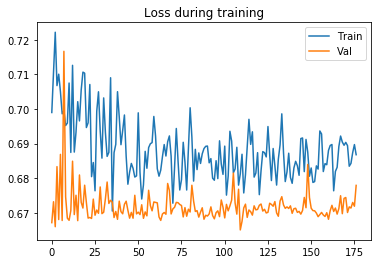

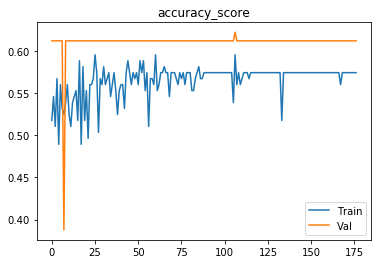

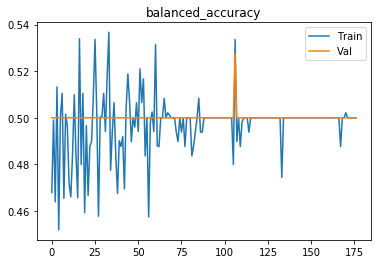

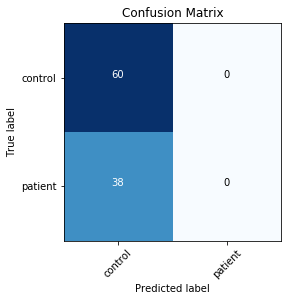

###### Starting inner fold 3
{'model': 'ModelLiu', 'batch_size': 6, 'patience': 12, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.68009
[0,     4] loss: 0.68918
[0,     6] loss: 0.70142
[0,     8] loss: 0.63425
[0,    10] loss: 0.75754
[0,    12] loss: 0.73868
[0,    14] loss: 0.65042
[0,    16] loss: 0.71126
[0,    18] loss: 0.66271
[0,    20] loss: 0.71329
[0,    22] loss: 0.64134
Time elapsed: 0h:0m:2s
train accuracy_score: 56.03 %
train balanced_accuracy: 49.20 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.664327
[1,     2] loss: 0.59637
[1,     4] loss: 0.80031
[1,     6] loss: 0.56828
[1,     8] loss: 0.69292
[1,    10] loss: 0.79960
[1,    12] loss: 0.73130
[1,    14] loss: 0.72454
[1,    16] loss: 0.66435
[1,    18] loss: 0.82665
[1,    20] loss: 0.61299
[1,    22] loss: 0.70489
Time elapsed: 0h:0m:6s
train accuracy_score: 58.16 %
train balanced_accuracy: 52.35 %
val accuracy_score: 38.78 %
val balanced_accuracy: 50.00 %
Val loss:

[18,     8] loss: 0.71814
[18,    10] loss: 0.64113
[18,    12] loss: 0.61605
[18,    14] loss: 0.75182
[18,    16] loss: 0.70085
[18,    18] loss: 0.69601
[18,    20] loss: 0.71704
[18,    22] loss: 0.60405
Time elapsed: 0h:1m:12s
train accuracy_score: 56.74 %
train balanced_accuracy: 49.38 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.671524
[19,     2] loss: 0.70601
[19,     4] loss: 0.73602
[19,     6] loss: 0.73074
[19,     8] loss: 0.72130
[19,    10] loss: 0.66895
[19,    12] loss: 0.69848
[19,    14] loss: 0.70333
[19,    16] loss: 0.66560
[19,    18] loss: 0.70626
[19,    20] loss: 0.69693
[19,    22] loss: 0.70442
Time elapsed: 0h:1m:15s
train accuracy_score: 52.48 %
train balanced_accuracy: 48.06 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.669727
[20,     2] loss: 0.59293
[20,     4] loss: 0.73091
[20,     6] loss: 0.65327
[20,     8] loss: 0.66150
[20,    10] loss: 0.78768
[20,    12] loss: 0.76089
[20,    14] loss: 0.

[36,    16] loss: 0.72080
[36,    18] loss: 0.71696
[36,    20] loss: 0.69406
[36,    22] loss: 0.73582
Time elapsed: 0h:2m:22s
train accuracy_score: 56.74 %
train balanced_accuracy: 49.60 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.670260
[37,     2] loss: 0.68073
[37,     4] loss: 0.61157
[37,     6] loss: 0.74272
[37,     8] loss: 0.75741
[37,    10] loss: 0.69674
[37,    12] loss: 0.75540
[37,    14] loss: 0.63400
[37,    16] loss: 0.59427
[37,    18] loss: 0.76735
[37,    20] loss: 0.69368
[37,    22] loss: 0.66938
Time elapsed: 0h:2m:25s
train accuracy_score: 52.48 %
train balanced_accuracy: 46.54 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.670207
[38,     2] loss: 0.72663
[38,     4] loss: 0.76657
[38,     6] loss: 0.74756
[38,     8] loss: 0.73857
[38,    10] loss: 0.70201
[38,    12] loss: 0.71431
[38,    14] loss: 0.64623
[38,    16] loss: 0.65307
[38,    18] loss: 0.64442
[38,    20] loss: 0.66501
[38,    22] loss: 0.

Time elapsed: 0h:3m:27s
train accuracy_score: 56.74 %
train balanced_accuracy: 49.81 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.672514
[55,     2] loss: 0.68400
[55,     4] loss: 0.71321
[55,     6] loss: 0.60817
[55,     8] loss: 0.65996
[55,    10] loss: 0.66018
[55,    12] loss: 0.62031
[55,    14] loss: 0.72963
[55,    16] loss: 0.67582
[55,    18] loss: 0.68027
[55,    20] loss: 0.76202
[55,    22] loss: 0.71920
Time elapsed: 0h:3m:31s
train accuracy_score: 57.45 %
train balanced_accuracy: 50.22 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.668880
[56,     2] loss: 0.71672
[56,     4] loss: 0.70309
[56,     6] loss: 0.69566
[56,     8] loss: 0.64999
[56,    10] loss: 0.68592
[56,    12] loss: 0.64640
[56,    14] loss: 0.67052
[56,    16] loss: 0.70329
[56,    18] loss: 0.67310
[56,    20] loss: 0.65687
[56,    22] loss: 0.69446
Time elapsed: 0h:3m:35s
train accuracy_score: 57.45 %
train balanced_accuracy: 50.00 %
val accurac

val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.668470
[73,     2] loss: 0.62789
[73,     4] loss: 0.65234
[73,     6] loss: 0.76016
[73,     8] loss: 0.64070
[73,    10] loss: 0.66580
[73,    12] loss: 0.68333
[73,    14] loss: 0.67714
[73,    16] loss: 0.62991
[73,    18] loss: 0.71882
[73,    20] loss: 0.74112
[73,    22] loss: 0.72909
Time elapsed: 0h:4m:26s
train accuracy_score: 57.45 %
train balanced_accuracy: 50.00 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.669484
[74,     2] loss: 0.64524
[74,     4] loss: 0.70442
[74,     6] loss: 0.57104
[74,     8] loss: 0.67806
[74,    10] loss: 0.64118
[74,    12] loss: 0.70174
[74,    14] loss: 0.73050
[74,    16] loss: 0.72450
[74,    18] loss: 0.81718
[74,    20] loss: 0.69037
[74,    22] loss: 0.70853
Time elapsed: 0h:4m:29s
train accuracy_score: 57.45 %
train balanced_accuracy: 50.00 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.670084
[75,     2] loss: 0.

[91,     2] loss: 0.70820
[91,     4] loss: 0.63159
[91,     6] loss: 0.75976
[91,     8] loss: 0.74950
[91,    10] loss: 0.73699
[91,    12] loss: 0.63781
[91,    14] loss: 0.67306
[91,    16] loss: 0.67027
[91,    18] loss: 0.67092
[91,    20] loss: 0.63100
[91,    22] loss: 0.68271
Time elapsed: 0h:5m:19s
train accuracy_score: 56.74 %
train balanced_accuracy: 49.81 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.670008
[92,     2] loss: 0.75267
[92,     4] loss: 0.65508
[92,     6] loss: 0.67110
[92,     8] loss: 0.65556
[92,    10] loss: 0.68804
[92,    12] loss: 0.69896
[92,    14] loss: 0.60154
[92,    16] loss: 0.67430
[92,    18] loss: 0.70916
[92,    20] loss: 0.68065
[92,    22] loss: 0.72583
Time elapsed: 0h:5m:22s
train accuracy_score: 54.61 %
train balanced_accuracy: 47.53 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.685272
[93,     2] loss: 0.68945
[93,     4] loss: 0.68815
[93,     6] loss: 0.68600
[93,     8] loss: 0.

[109,     2] loss: 0.65167
[109,     4] loss: 0.69645
[109,     6] loss: 0.70771
[109,     8] loss: 0.66683
[109,    10] loss: 0.69559
[109,    12] loss: 0.69890
[109,    14] loss: 0.65293
[109,    16] loss: 0.65069
[109,    18] loss: 0.77353
[109,    20] loss: 0.63980
[109,    22] loss: 0.68482
Time elapsed: 0h:6m:15s
train accuracy_score: 57.45 %
train balanced_accuracy: 50.00 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.673133
[110,     2] loss: 0.72316
[110,     4] loss: 0.60047
[110,     6] loss: 0.64297
[110,     8] loss: 0.66487
[110,    10] loss: 0.73468
[110,    12] loss: 0.64034
[110,    14] loss: 0.73386
[110,    16] loss: 0.69198
[110,    18] loss: 0.64781
[110,    20] loss: 0.74092
[110,    22] loss: 0.66464
Time elapsed: 0h:6m:18s
train accuracy_score: 57.45 %
train balanced_accuracy: 50.00 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.670469
[111,     2] loss: 0.62604
[111,     4] loss: 0.69618
[111,     6] loss: 0.7

val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.670286
[127,     2] loss: 0.68621
[127,     4] loss: 0.64374
[127,     6] loss: 0.73938
[127,     8] loss: 0.69675
[127,    10] loss: 0.61508
[127,    12] loss: 0.63083
[127,    14] loss: 0.75727
[127,    16] loss: 0.74477
[127,    18] loss: 0.62533
[127,    20] loss: 0.69534
[127,    22] loss: 0.63821
Time elapsed: 0h:7m:9s
train accuracy_score: 57.45 %
train balanced_accuracy: 50.00 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.671101
[128,     2] loss: 0.67837
[128,     4] loss: 0.66553
[128,     6] loss: 0.70120
[128,     8] loss: 0.60980
[128,    10] loss: 0.67159
[128,    12] loss: 0.77953
[128,    14] loss: 0.61365
[128,    16] loss: 0.79266
[128,    18] loss: 0.66859
[128,    20] loss: 0.67690
[128,    22] loss: 0.66238
Time elapsed: 0h:7m:12s
train accuracy_score: 57.45 %
train balanced_accuracy: 50.00 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.671198

Time elapsed: 0h:7m:59s
train accuracy_score: 57.45 %
train balanced_accuracy: 50.00 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.669283
[145,     2] loss: 0.68950
[145,     4] loss: 0.64201
[145,     6] loss: 0.70012
[145,     8] loss: 0.70748
[145,    10] loss: 0.70317
[145,    12] loss: 0.63134
[145,    14] loss: 0.70029
[145,    16] loss: 0.63548
[145,    18] loss: 0.63416
[145,    20] loss: 0.66166
[145,    22] loss: 0.80230
Time elapsed: 0h:8m:2s
train accuracy_score: 57.45 %
train balanced_accuracy: 50.00 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.670649
[146,     2] loss: 0.71385
[146,     4] loss: 0.65104
[146,     6] loss: 0.67843
[146,     8] loss: 0.63582
[146,    10] loss: 0.69385
[146,    12] loss: 0.68267
[146,    14] loss: 0.64218
[146,    16] loss: 0.69312
[146,    18] loss: 0.69998
[146,    20] loss: 0.68190
[146,    22] loss: 0.74031
Time elapsed: 0h:8m:5s
train accuracy_score: 57.45 %
train balanced_accuracy:

[162,    16] loss: 0.66903
[162,    18] loss: 0.75066
[162,    20] loss: 0.70310
[162,    22] loss: 0.64543
Time elapsed: 0h:8m:53s
train accuracy_score: 57.45 %
train balanced_accuracy: 50.00 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.673369
[163,     2] loss: 0.68556
[163,     4] loss: 0.68086
[163,     6] loss: 0.65150
[163,     8] loss: 0.77640
[163,    10] loss: 0.67761
[163,    12] loss: 0.67246
[163,    14] loss: 0.71477
[163,    16] loss: 0.65692
[163,    18] loss: 0.65125
[163,    20] loss: 0.68532
[163,    22] loss: 0.63106
Time elapsed: 0h:8m:56s
train accuracy_score: 57.45 %
train balanced_accuracy: 50.00 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.669832
[164,     2] loss: 0.68921
[164,     4] loss: 0.71139
[164,     6] loss: 0.65737
[164,     8] loss: 0.70882
[164,    10] loss: 0.67424
[164,    12] loss: 0.68586
[164,    14] loss: 0.66942
[164,    16] loss: 0.70095
[164,    18] loss: 0.70097
[164,    20] loss: 0.6

Best result during training: 0.50. Saving model..
Finished inner fold.


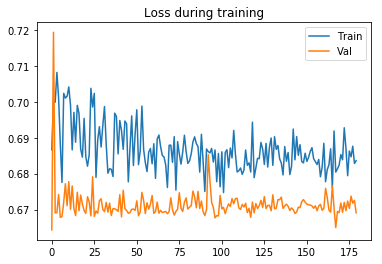

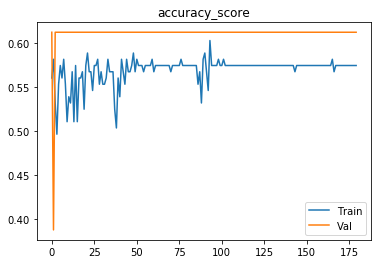

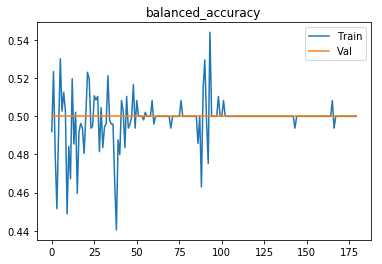

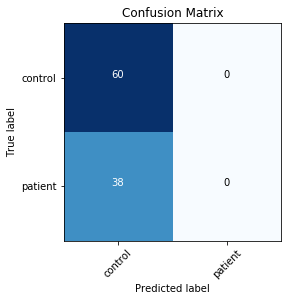

###### Starting inner fold 4
{'model': 'ModelLiu', 'batch_size': 12, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.65683
[0,     4] loss: 0.78050
[0,     6] loss: 0.68945
[0,     8] loss: 0.66532
[0,    10] loss: 0.68167
Time elapsed: 0h:0m:2s
train accuracy_score: 53.19 %
train balanced_accuracy: 49.32 %
val accuracy_score: 54.08 %
val balanced_accuracy: 48.99 %
Val loss: 0.690800
[1,     2] loss: 0.66867
[1,     4] loss: 0.65323
[1,     6] loss: 0.73393
[1,     8] loss: 0.72916
[1,    10] loss: 0.66022
Time elapsed: 0h:0m:7s
train accuracy_score: 57.45 %
train balanced_accuracy: 53.02 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.666098
[2,     2] loss: 0.73202
[2,     4] loss: 0.65634
[2,     6] loss: 0.65689
[2,     8] loss: 0.71586
[2,    10] loss: 0.68387
Time elapsed: 0h:0m:11s
train accuracy_score: 54.61 %
train balanced_accuracy: 49.48 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.677225

val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.667734
[28,     2] loss: 0.73968
[28,     4] loss: 0.71087
[28,     6] loss: 0.72304
[28,     8] loss: 0.67600
[28,    10] loss: 0.70407
Time elapsed: 0h:1m:52s
train accuracy_score: 57.45 %
train balanced_accuracy: 50.65 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.672235
[29,     2] loss: 0.65847
[29,     4] loss: 0.69902
[29,     6] loss: 0.67995
[29,     8] loss: 0.65862
[29,    10] loss: 0.75171
Time elapsed: 0h:1m:55s
train accuracy_score: 53.90 %
train balanced_accuracy: 49.29 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.674964
[30,     2] loss: 0.68116
[30,     4] loss: 0.67801
[30,     6] loss: 0.71733
[30,     8] loss: 0.69180
[30,    10] loss: 0.68390
Time elapsed: 0h:1m:59s
train accuracy_score: 54.61 %
train balanced_accuracy: 49.26 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.673421
[31,     2] loss: 0.70990
[31,     4]

val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.668912
[56,     2] loss: 0.68222
[56,     4] loss: 0.70898
[56,     6] loss: 0.67278
[56,     8] loss: 0.68629
[56,    10] loss: 0.66812
Time elapsed: 0h:3m:22s
train accuracy_score: 56.74 %
train balanced_accuracy: 50.68 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.676068
[57,     2] loss: 0.67546
[57,     4] loss: 0.68852
[57,     6] loss: 0.68392
[57,     8] loss: 0.67354
[57,    10] loss: 0.69733
Time elapsed: 0h:3m:25s
train accuracy_score: 56.03 %
train balanced_accuracy: 50.93 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.676211
[58,     2] loss: 0.68400
[58,     4] loss: 0.67308
[58,     6] loss: 0.68391
[58,     8] loss: 0.66909
[58,    10] loss: 0.73065
Time elapsed: 0h:3m:28s
train accuracy_score: 58.16 %
train balanced_accuracy: 52.35 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.671235
[59,     2] loss: 0.73614
[59,     4]

val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.672036
[84,     2] loss: 0.66946
[84,     4] loss: 0.72192
[84,     6] loss: 0.65490
[84,     8] loss: 0.71327
[84,    10] loss: 0.65267
Time elapsed: 0h:5m:5s
train accuracy_score: 56.74 %
train balanced_accuracy: 49.81 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.672051
[85,     2] loss: 0.68817
[85,     4] loss: 0.62680
[85,     6] loss: 0.75308
[85,     8] loss: 0.66222
[85,    10] loss: 0.70989
Time elapsed: 0h:5m:9s
train accuracy_score: 59.57 %
train balanced_accuracy: 52.72 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.670418
[86,     2] loss: 0.65646
[86,     4] loss: 0.67680
[86,     6] loss: 0.71971
[86,     8] loss: 0.65224
[86,    10] loss: 0.71402
Time elapsed: 0h:5m:12s
train accuracy_score: 56.74 %
train balanced_accuracy: 49.81 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.669479
[87,     2] loss: 0.68385
[87,     4] l

Time elapsed: 0h:6m:49s
train accuracy_score: 58.16 %
train balanced_accuracy: 51.05 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.669492
[112,     2] loss: 0.68465
[112,     4] loss: 0.67037
[112,     6] loss: 0.71287
[112,     8] loss: 0.63525
[112,    10] loss: 0.68410
Time elapsed: 0h:6m:52s
train accuracy_score: 56.03 %
train balanced_accuracy: 48.98 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.672196
[113,     2] loss: 0.67356
[113,     4] loss: 0.67442
[113,     6] loss: 0.67473
[113,     8] loss: 0.70814
[113,    10] loss: 0.70637
Time elapsed: 0h:6m:56s
train accuracy_score: 56.74 %
train balanced_accuracy: 49.81 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.671926
[114,     2] loss: 0.70727
[114,     4] loss: 0.66572
[114,     6] loss: 0.66975
[114,     8] loss: 0.62473
[114,    10] loss: 0.66935
Time elapsed: 0h:7m:0s
train accuracy_score: 61.70 %
train balanced_accuracy: 55.00 %
val accuracy_s

[139,     2] loss: 0.68673
[139,     4] loss: 0.65020
[139,     6] loss: 0.72738
[139,     8] loss: 0.64364
[139,    10] loss: 0.68875
Time elapsed: 0h:8m:46s
train accuracy_score: 58.16 %
train balanced_accuracy: 50.83 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.670355
[140,     2] loss: 0.67953
[140,     4] loss: 0.70761
[140,     6] loss: 0.61256
[140,     8] loss: 0.70855
[140,    10] loss: 0.64289
Time elapsed: 0h:8m:50s
train accuracy_score: 57.45 %
train balanced_accuracy: 50.00 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.670161
[141,     2] loss: 0.65625
[141,     4] loss: 0.68443
[141,     6] loss: 0.70157
[141,     8] loss: 0.70635
[141,    10] loss: 0.67336
Time elapsed: 0h:8m:53s
train accuracy_score: 57.45 %
train balanced_accuracy: 50.22 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.668872
[142,     2] loss: 0.68077
[142,     4] loss: 0.60117
[142,     6] loss: 0.75799
[142,     8] loss: 

Time elapsed: 0h:10m:5s
train accuracy_score: 57.45 %
train balanced_accuracy: 50.22 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.671026
[167,     2] loss: 0.70776
[167,     4] loss: 0.69694
[167,     6] loss: 0.64521
[167,     8] loss: 0.70578
[167,    10] loss: 0.63152
Time elapsed: 0h:10m:8s
train accuracy_score: 56.74 %
train balanced_accuracy: 49.60 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.671679
[168,     2] loss: 0.66326
[168,     4] loss: 0.67320
[168,     6] loss: 0.67971
[168,     8] loss: 0.69394
[168,    10] loss: 0.67780
Time elapsed: 0h:10m:11s
train accuracy_score: 56.74 %
train balanced_accuracy: 49.38 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.669747
[169,     2] loss: 0.68380
[169,     4] loss: 0.66477
[169,     6] loss: 0.66962
[169,     8] loss: 0.69928
[169,    10] loss: 0.70673
Time elapsed: 0h:10m:14s
train accuracy_score: 56.03 %
train balanced_accuracy: 48.77 %
val accurac

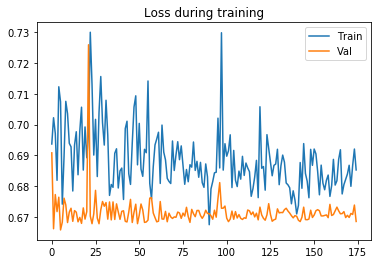

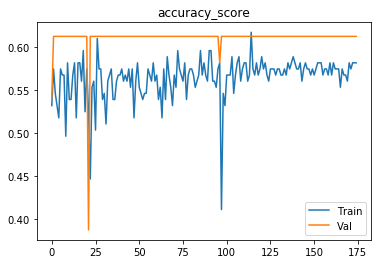

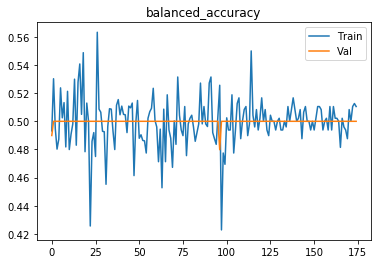

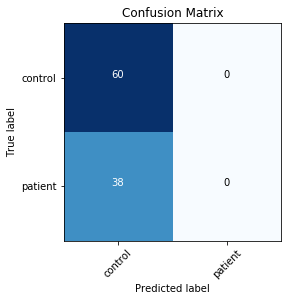

Finished outer fold.
{'final_acc': 0.5, 'best_acc': 0.5, 'final_iter': 171, 'best_iter': 7, 'params': {'model': 'ModelLiu', 'batch_size': 6, 'patience': 12, 'lr': 0.001}, 'inner_fold_idx': 0}
###### Starting outer fold 4
# of patients 117, # of healthy controls 126
139
104
###### Starting inner fold 0
{'model': 'ModelLiu', 'batch_size': 6, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.71158
[0,     4] loss: 0.69929
[0,     6] loss: 0.65035
[0,     8] loss: 0.64826
[0,    10] loss: 0.70347
[0,    12] loss: 0.96104
[0,    14] loss: 0.70020
[0,    16] loss: 0.76709
[0,    18] loss: 0.68620
[0,    20] loss: 0.65182
[0,    22] loss: 0.71472
Time elapsed: 0h:0m:2s
train accuracy_score: 48.92 %
train balanced_accuracy: 48.93 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.709761
[1,     2] loss: 0.69430
[1,     4] loss: 0.69998
[1,     6] loss: 0.63811
[1,     8] loss: 0.66517
[1,    10] loss: 0.73960
[1,    12] loss: 0.61728
[1,  

[17,    22] loss: 0.72360
Time elapsed: 0h:0m:55s
train accuracy_score: 47.48 %
train balanced_accuracy: 47.63 %
val accuracy_score: 54.81 %
val balanced_accuracy: 50.00 %
Val loss: 0.690754
[18,     2] loss: 0.68831
[18,     4] loss: 0.69047
[18,     6] loss: 0.72129
[18,     8] loss: 0.73304
[18,    10] loss: 0.73182
[18,    12] loss: 0.71612
[18,    14] loss: 0.64703
[18,    16] loss: 0.72122
[18,    18] loss: 0.79574
[18,    20] loss: 0.74701
[18,    22] loss: 0.66040
Time elapsed: 0h:0m:58s
train accuracy_score: 50.36 %
train balanced_accuracy: 50.47 %
val accuracy_score: 54.81 %
val balanced_accuracy: 50.00 %
Val loss: 0.692949
[19,     2] loss: 0.74225
[19,     4] loss: 0.74594
[19,     6] loss: 0.66400
[19,     8] loss: 0.67495
[19,    10] loss: 0.87615
[19,    12] loss: 0.81540
[19,    14] loss: 0.82032
[19,    16] loss: 0.65552
[19,    18] loss: 0.81019
[19,    20] loss: 0.67761
[19,    22] loss: 0.70973
Time elapsed: 0h:1m:1s
train accuracy_score: 41.73 %
train balanced_accu

val accuracy_score: 54.81 %
val balanced_accuracy: 50.00 %
Val loss: 0.691997
[36,     2] loss: 0.72701
[36,     4] loss: 0.72971
[36,     6] loss: 0.69000
[36,     8] loss: 0.68136
[36,    10] loss: 0.76574
[36,    12] loss: 0.69694
[36,    14] loss: 0.71101
[36,    16] loss: 0.72308
[36,    18] loss: 0.62396
[36,    20] loss: 0.74465
[36,    22] loss: 0.72886
Time elapsed: 0h:1m:54s
train accuracy_score: 45.32 %
train balanced_accuracy: 45.43 %
val accuracy_score: 54.81 %
val balanced_accuracy: 50.00 %
Val loss: 0.690521
[37,     2] loss: 0.68287
[37,     4] loss: 0.73998
[37,     6] loss: 0.64654
[37,     8] loss: 0.72300
[37,    10] loss: 0.69416
[37,    12] loss: 0.70166
[37,    14] loss: 0.65321
[37,    16] loss: 0.68951
[37,    18] loss: 0.69484
[37,    20] loss: 0.70154
[37,    22] loss: 0.72358
Time elapsed: 0h:1m:57s
train accuracy_score: 52.52 %
train balanced_accuracy: 52.59 %
val accuracy_score: 49.04 %
val balanced_accuracy: 45.67 %
Val loss: 0.693130
[38,     2] loss: 0.

[54,     4] loss: 0.66853
[54,     6] loss: 0.75337
[54,     8] loss: 0.76083
[54,    10] loss: 0.66074
[54,    12] loss: 0.67167
[54,    14] loss: 0.68176
[54,    16] loss: 0.72845
[54,    18] loss: 0.66575
[54,    20] loss: 0.69087
[54,    22] loss: 0.69694
Time elapsed: 0h:2m:52s
train accuracy_score: 48.92 %
train balanced_accuracy: 48.85 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.697794
[55,     2] loss: 0.69157
[55,     4] loss: 0.72580
[55,     6] loss: 0.67863
[55,     8] loss: 0.69375
[55,    10] loss: 0.68937
[55,    12] loss: 0.67429
[55,    14] loss: 0.68470
[55,    16] loss: 0.69777
[55,    18] loss: 0.66998
[55,    20] loss: 0.70514
[55,    22] loss: 0.70744
Time elapsed: 0h:2m:55s
train accuracy_score: 53.96 %
train balanced_accuracy: 53.90 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.694983
[56,     2] loss: 0.66519
[56,     4] loss: 0.68405
[56,     6] loss: 0.67659
[56,     8] loss: 0.73486
[56,    10] loss: 0.

[72,    12] loss: 0.69520
[72,    14] loss: 0.74575
[72,    16] loss: 0.70104
[72,    18] loss: 0.67961
[72,    20] loss: 0.67899
[72,    22] loss: 0.71554
Time elapsed: 0h:3m:52s
train accuracy_score: 50.36 %
train balanced_accuracy: 50.23 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.694462
[73,     2] loss: 0.69281
[73,     4] loss: 0.68720
[73,     6] loss: 0.67973
[73,     8] loss: 0.68829
[73,    10] loss: 0.71121
[73,    12] loss: 0.70092
[73,    14] loss: 0.68693
[73,    16] loss: 0.67658
[73,    18] loss: 0.65291
[73,    20] loss: 0.66772
[73,    22] loss: 0.70118
Time elapsed: 0h:3m:55s
train accuracy_score: 59.71 %
train balanced_accuracy: 59.75 %
val accuracy_score: 54.81 %
val balanced_accuracy: 50.00 %
Val loss: 0.691646
[74,     2] loss: 0.71736
[74,     4] loss: 0.69545
[74,     6] loss: 0.71539
[74,     8] loss: 0.73692
[74,    10] loss: 0.72597
[74,    12] loss: 0.72997
[74,    14] loss: 0.70145
[74,    16] loss: 0.68805
[74,    18] loss: 0.

[90,    22] loss: 0.68587
Time elapsed: 0h:4m:55s
train accuracy_score: 52.52 %
train balanced_accuracy: 52.47 %
val accuracy_score: 54.81 %
val balanced_accuracy: 50.00 %
Val loss: 0.692628
[91,     2] loss: 0.68923
[91,     4] loss: 0.69399
[91,     6] loss: 0.70252
[91,     8] loss: 0.68804
[91,    10] loss: 0.67534
[91,    12] loss: 0.71365
[91,    14] loss: 0.70045
[91,    16] loss: 0.71081
[91,    18] loss: 0.67280
[91,    20] loss: 0.66886
[91,    22] loss: 0.69161
Time elapsed: 0h:4m:58s
train accuracy_score: 48.92 %
train balanced_accuracy: 48.82 %
val accuracy_score: 54.81 %
val balanced_accuracy: 50.00 %
Val loss: 0.692856
[92,     2] loss: 0.66756
[92,     4] loss: 0.69013
[92,     6] loss: 0.68607
[92,     8] loss: 0.71548
[92,    10] loss: 0.67550
[92,    12] loss: 0.74919
[92,    14] loss: 0.66306
[92,    16] loss: 0.69324
[92,    18] loss: 0.70485
[92,    20] loss: 0.71899
[92,    22] loss: 0.70066
Time elapsed: 0h:5m:2s
train accuracy_score: 51.08 %
train balanced_accu

Time elapsed: 0h:5m:52s
train accuracy_score: 45.32 %
train balanced_accuracy: 45.20 %
val accuracy_score: 54.81 %
val balanced_accuracy: 50.00 %
Val loss: 0.691206
[109,     2] loss: 0.69769
[109,     4] loss: 0.67575
[109,     6] loss: 0.71143
[109,     8] loss: 0.71583
[109,    10] loss: 0.68945
[109,    12] loss: 0.69555
[109,    14] loss: 0.69951
[109,    16] loss: 0.71454
[109,    18] loss: 0.72400
[109,    20] loss: 0.68977
[109,    22] loss: 0.68887
Time elapsed: 0h:5m:55s
train accuracy_score: 45.32 %
train balanced_accuracy: 45.53 %
val accuracy_score: 54.81 %
val balanced_accuracy: 50.00 %
Val loss: 0.691955
[110,     2] loss: 0.69592
[110,     4] loss: 0.67824
[110,     6] loss: 0.68541
[110,     8] loss: 0.68784
[110,    10] loss: 0.67575
[110,    12] loss: 0.69242
[110,    14] loss: 0.67661
[110,    16] loss: 0.69122
[110,    18] loss: 0.66226
[110,    20] loss: 0.71256
[110,    22] loss: 0.71122
Time elapsed: 0h:5m:58s
train accuracy_score: 53.96 %
train balanced_accurac

[126,    18] loss: 0.67717
[126,    20] loss: 0.70679
[126,    22] loss: 0.69562
Time elapsed: 0h:6m:49s
train accuracy_score: 48.92 %
train balanced_accuracy: 49.03 %
val accuracy_score: 54.81 %
val balanced_accuracy: 50.00 %
Val loss: 0.691733
[127,     2] loss: 0.69353
[127,     4] loss: 0.66869
[127,     6] loss: 0.69318
[127,     8] loss: 0.66273
[127,    10] loss: 0.68907
[127,    12] loss: 0.67555
[127,    14] loss: 0.72479
[127,    16] loss: 0.68910
[127,    18] loss: 0.69368
[127,    20] loss: 0.72258
[127,    22] loss: 0.67901
Time elapsed: 0h:6m:52s
train accuracy_score: 53.96 %
train balanced_accuracy: 54.18 %
val accuracy_score: 54.81 %
val balanced_accuracy: 50.00 %
Val loss: 0.690251
[128,     2] loss: 0.70064
[128,     4] loss: 0.66699
[128,     6] loss: 0.72463
[128,     8] loss: 0.72698
[128,    10] loss: 0.67027
[128,    12] loss: 0.68376
[128,    14] loss: 0.71813
[128,    16] loss: 0.70212
[128,    18] loss: 0.69931
[128,    20] loss: 0.67849
[128,    22] loss: 0.6

[144,    12] loss: 0.70906
[144,    14] loss: 0.70487
[144,    16] loss: 0.71511
[144,    18] loss: 0.69720
[144,    20] loss: 0.71478
[144,    22] loss: 0.70432
Time elapsed: 0h:7m:50s
train accuracy_score: 41.01 %
train balanced_accuracy: 40.83 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.694182
[145,     2] loss: 0.68286
[145,     4] loss: 0.68274
[145,     6] loss: 0.69676
[145,     8] loss: 0.70203
[145,    10] loss: 0.70775
[145,    12] loss: 0.70217
[145,    14] loss: 0.67331
[145,    16] loss: 0.70714
[145,    18] loss: 0.72659
[145,    20] loss: 0.69006
[145,    22] loss: 0.68456
Time elapsed: 0h:7m:53s
train accuracy_score: 51.80 %
train balanced_accuracy: 51.60 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.695798
[146,     2] loss: 0.70202
[146,     4] loss: 0.70952
[146,     6] loss: 0.67636
[146,     8] loss: 0.68132
[146,    10] loss: 0.70281
[146,    12] loss: 0.69604
[146,    14] loss: 0.70715
[146,    16] loss: 0.7

[162,    10] loss: 0.67404
[162,    12] loss: 0.69309
[162,    14] loss: 0.70053
[162,    16] loss: 0.68557
[162,    18] loss: 0.69353
[162,    20] loss: 0.69591
[162,    22] loss: 0.67688
Time elapsed: 0h:8m:51s
train accuracy_score: 50.36 %
train balanced_accuracy: 50.25 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.693510
[163,     2] loss: 0.68468
[163,     4] loss: 0.69906
[163,     6] loss: 0.69895
[163,     8] loss: 0.68413
[163,    10] loss: 0.68408
[163,    12] loss: 0.68398
[163,    14] loss: 0.70026
[163,    16] loss: 0.69276
[163,    18] loss: 0.68398
[163,    20] loss: 0.69451
[163,    22] loss: 0.71016
Time elapsed: 0h:8m:54s
train accuracy_score: 51.08 %
train balanced_accuracy: 51.06 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.695053
[164,     2] loss: 0.68923
[164,     4] loss: 0.70447
[164,     6] loss: 0.70496
[164,     8] loss: 0.68720
[164,    10] loss: 0.68994
[164,    12] loss: 0.70520
[164,    14] loss: 0.6

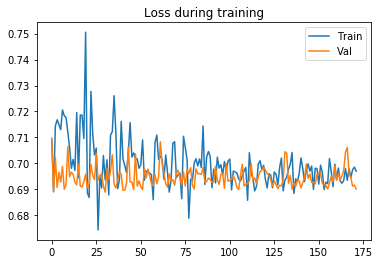

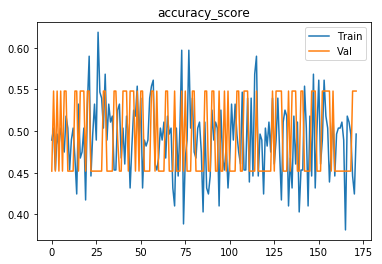

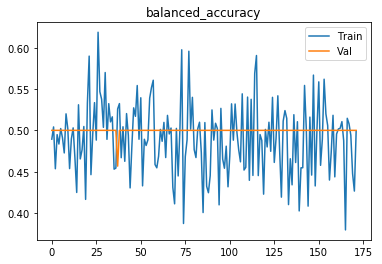

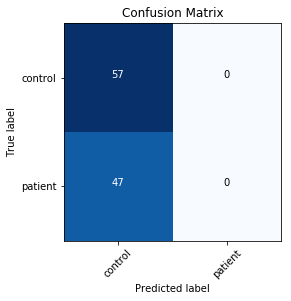

###### Starting inner fold 1
{'model': 'ModelLiu', 'batch_size': 4, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.65768
[0,     4] loss: 0.74333
[0,     6] loss: 0.71651
[0,     8] loss: 0.73306
[0,    10] loss: 0.68611
[0,    12] loss: 0.77183
[0,    14] loss: 0.79457
[0,    16] loss: 0.66833
[0,    18] loss: 0.73490
[0,    20] loss: 0.80015
[0,    22] loss: 0.69164
[0,    24] loss: 0.65841
[0,    26] loss: 0.63831
[0,    28] loss: 0.61910
[0,    30] loss: 0.73027
[0,    32] loss: 0.72984
[0,    34] loss: 0.79123
Time elapsed: 0h:0m:2s
train accuracy_score: 54.68 %
train balanced_accuracy: 54.64 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.700053
[1,     2] loss: 0.66827
[1,     4] loss: 0.69471
[1,     6] loss: 0.76330
[1,     8] loss: 0.71650
[1,    10] loss: 0.66826
[1,    12] loss: 0.69885
[1,    14] loss: 0.73833
[1,    16] loss: 0.70308
[1,    18] loss: 0.72616
[1,    20] loss: 0.80888
[1,    22] loss: 0.72068
[1, 

Time elapsed: 0h:0m:42s
train accuracy_score: 52.52 %
train balanced_accuracy: 52.47 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.694678
[14,     2] loss: 0.73339
[14,     4] loss: 0.69807
[14,     6] loss: 0.68308
[14,     8] loss: 0.73766
[14,    10] loss: 0.73841
[14,    12] loss: 0.68295
[14,    14] loss: 0.73717
[14,    16] loss: 0.66673
[14,    18] loss: 0.65294
[14,    20] loss: 0.68887
[14,    22] loss: 0.73631
[14,    24] loss: 0.69729
[14,    26] loss: 0.72743
[14,    28] loss: 0.71739
[14,    30] loss: 0.72859
[14,    32] loss: 0.57579
[14,    34] loss: 0.67690
Time elapsed: 0h:0m:45s
train accuracy_score: 49.64 %
train balanced_accuracy: 49.78 %
val accuracy_score: 54.81 %
val balanced_accuracy: 50.00 %
Val loss: 0.690425
[15,     2] loss: 0.69657
[15,     4] loss: 0.74619
[15,     6] loss: 0.72467
[15,     8] loss: 0.72902
[15,    10] loss: 0.69903
[15,    12] loss: 0.67856
[15,    14] loss: 0.63919
[15,    16] loss: 0.74926
[15,    18] loss: 0.

[27,    16] loss: 0.78181
[27,    18] loss: 0.66327
[27,    20] loss: 0.68765
[27,    22] loss: 0.70624
[27,    24] loss: 0.75022
[27,    26] loss: 0.75473
[27,    28] loss: 0.72463
[27,    30] loss: 0.77695
[27,    32] loss: 0.68123
[27,    34] loss: 0.76313
Time elapsed: 0h:1m:25s
train accuracy_score: 40.29 %
train balanced_accuracy: 40.29 %
val accuracy_score: 54.81 %
val balanced_accuracy: 50.00 %
Val loss: 0.691012
[28,     2] loss: 0.69950
[28,     4] loss: 0.68577
[28,     6] loss: 0.72897
[28,     8] loss: 0.73133
[28,    10] loss: 0.70393
[28,    12] loss: 0.68912
[28,    14] loss: 0.69288
[28,    16] loss: 0.64989
[28,    18] loss: 0.71746
[28,    20] loss: 0.69237
[28,    22] loss: 0.72906
[28,    24] loss: 0.73808
[28,    26] loss: 0.72027
[28,    28] loss: 0.67301
[28,    30] loss: 0.70110
[28,    32] loss: 0.68701
[28,    34] loss: 0.69037
Time elapsed: 0h:1m:28s
train accuracy_score: 47.48 %
train balanced_accuracy: 47.46 %
val accuracy_score: 45.19 %
val balanced_accur

val accuracy_score: 54.81 %
val balanced_accuracy: 50.00 %
Val loss: 0.691813
[41,     2] loss: 0.65143
[41,     4] loss: 0.74202
[41,     6] loss: 0.71789
[41,     8] loss: 0.73590
[41,    10] loss: 0.75128
[41,    12] loss: 0.65007
[41,    14] loss: 0.68061
[41,    16] loss: 0.69267
[41,    18] loss: 0.74326
[41,    20] loss: 0.74618
[41,    22] loss: 0.68691
[41,    24] loss: 0.69666
[41,    26] loss: 0.67877
[41,    28] loss: 0.67093
[41,    30] loss: 0.68343
[41,    32] loss: 0.68222
[41,    34] loss: 0.68150
Time elapsed: 0h:2m:8s
train accuracy_score: 50.36 %
train balanced_accuracy: 50.43 %
val accuracy_score: 54.81 %
val balanced_accuracy: 50.00 %
Val loss: 0.692125
[42,     2] loss: 0.67268
[42,     4] loss: 0.74846
[42,     6] loss: 0.71737
[42,     8] loss: 0.73506
[42,    10] loss: 0.69419
[42,    12] loss: 0.66362
[42,    14] loss: 0.73384
[42,    16] loss: 0.69532
[42,    18] loss: 0.72115
[42,    20] loss: 0.68481
[42,    22] loss: 0.70817
[42,    24] loss: 0.73905
[42,

[54,    24] loss: 0.70327
[54,    26] loss: 0.67922
[54,    28] loss: 0.65688
[54,    30] loss: 0.68378
[54,    32] loss: 0.69231
[54,    34] loss: 0.66809
Time elapsed: 0h:2m:48s
train accuracy_score: 46.76 %
train balanced_accuracy: 46.56 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.693720
[55,     2] loss: 0.70011
[55,     4] loss: 0.71097
[55,     6] loss: 0.68882
[55,     8] loss: 0.69442
[55,    10] loss: 0.70985
[55,    12] loss: 0.71471
[55,    14] loss: 0.70165
[55,    16] loss: 0.68525
[55,    18] loss: 0.69116
[55,    20] loss: 0.69613
[55,    22] loss: 0.70780
[55,    24] loss: 0.69626
[55,    26] loss: 0.69806
[55,    28] loss: 0.71078
[55,    30] loss: 0.69999
[55,    32] loss: 0.71453
[55,    34] loss: 0.67673
Time elapsed: 0h:2m:51s
train accuracy_score: 43.88 %
train balanced_accuracy: 43.91 %
val accuracy_score: 54.81 %
val balanced_accuracy: 50.00 %
Val loss: 0.692345
[56,     2] loss: 0.68589
[56,     4] loss: 0.65094
[56,     6] loss: 0.

[68,     2] loss: 0.69548
[68,     4] loss: 0.69609
[68,     6] loss: 0.70364
[68,     8] loss: 0.69900
[68,    10] loss: 0.70780
[68,    12] loss: 0.71573
[68,    14] loss: 0.72366
[68,    16] loss: 0.71880
[68,    18] loss: 0.67525
[68,    20] loss: 0.70161
[68,    22] loss: 0.69148
[68,    24] loss: 0.71184
[68,    26] loss: 0.68531
[68,    28] loss: 0.70026
[68,    30] loss: 0.72309
[68,    32] loss: 0.68794
[68,    34] loss: 0.69967
Time elapsed: 0h:3m:32s
train accuracy_score: 43.17 %
train balanced_accuracy: 43.17 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.696025
[69,     2] loss: 0.70599
[69,     4] loss: 0.69791
[69,     6] loss: 0.71950
[69,     8] loss: 0.70351
[69,    10] loss: 0.70602
[69,    12] loss: 0.68506
[69,    14] loss: 0.69456
[69,    16] loss: 0.70308
[69,    18] loss: 0.71262
[69,    20] loss: 0.71048
[69,    22] loss: 0.68078
[69,    24] loss: 0.72116
[69,    26] loss: 0.69418
[69,    28] loss: 0.69106
[69,    30] loss: 0.71267
[69

[81,    30] loss: 0.72412
[81,    32] loss: 0.68788
[81,    34] loss: 0.72093
Time elapsed: 0h:4m:14s
train accuracy_score: 48.20 %
train balanced_accuracy: 48.02 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.693689
[82,     2] loss: 0.71695
[82,     4] loss: 0.69268
[82,     6] loss: 0.68860
[82,     8] loss: 0.68755
[82,    10] loss: 0.71052
[82,    12] loss: 0.69829
[82,    14] loss: 0.67141
[82,    16] loss: 0.70410
[82,    18] loss: 0.71433
[82,    20] loss: 0.71565
[82,    22] loss: 0.70286
[82,    24] loss: 0.69511
[82,    26] loss: 0.68850
[82,    28] loss: 0.71282
[82,    30] loss: 0.70944
[82,    32] loss: 0.72138
[82,    34] loss: 0.70132
Time elapsed: 0h:4m:18s
train accuracy_score: 42.45 %
train balanced_accuracy: 42.33 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.693503
[83,     2] loss: 0.68171
[83,     4] loss: 0.70030
[83,     6] loss: 0.69857
[83,     8] loss: 0.69980
[83,    10] loss: 0.67795
[83,    12] loss: 0.

[95,    10] loss: 0.69030
[95,    12] loss: 0.70378
[95,    14] loss: 0.69241
[95,    16] loss: 0.68210
[95,    18] loss: 0.68651
[95,    20] loss: 0.71394
[95,    22] loss: 0.69909
[95,    24] loss: 0.69243
[95,    26] loss: 0.69803
[95,    28] loss: 0.70089
[95,    30] loss: 0.69571
[95,    32] loss: 0.68383
[95,    34] loss: 0.68764
Time elapsed: 0h:5m:0s
train accuracy_score: 51.08 %
train balanced_accuracy: 51.15 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.694719
[96,     2] loss: 0.70292
[96,     4] loss: 0.68442
[96,     6] loss: 0.68962
[96,     8] loss: 0.69732
[96,    10] loss: 0.67526
[96,    12] loss: 0.70221
[96,    14] loss: 0.69823
[96,    16] loss: 0.70791
[96,    18] loss: 0.69462
[96,    20] loss: 0.67572
[96,    22] loss: 0.71113
[96,    24] loss: 0.73002
[96,    26] loss: 0.67153
[96,    28] loss: 0.70764
[96,    30] loss: 0.69125
[96,    32] loss: 0.71323
[96,    34] loss: 0.69718
Time elapsed: 0h:5m:3s
train accuracy_score: 48.20 %
tra

[108,    30] loss: 0.69915
[108,    32] loss: 0.67506
[108,    34] loss: 0.69231
Time elapsed: 0h:5m:43s
train accuracy_score: 48.92 %
train balanced_accuracy: 48.90 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.695595
[109,     2] loss: 0.69361
[109,     4] loss: 0.71214
[109,     6] loss: 0.70495
[109,     8] loss: 0.67786
[109,    10] loss: 0.70495
[109,    12] loss: 0.69887
[109,    14] loss: 0.67878
[109,    16] loss: 0.68941
[109,    18] loss: 0.69640
[109,    20] loss: 0.66554
[109,    22] loss: 0.71118
[109,    24] loss: 0.70441
[109,    26] loss: 0.68181
[109,    28] loss: 0.70959
[109,    30] loss: 0.69551
[109,    32] loss: 0.69379
[109,    34] loss: 0.70614
Time elapsed: 0h:5m:46s
train accuracy_score: 50.36 %
train balanced_accuracy: 50.13 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.696070
[110,     2] loss: 0.69526
[110,     4] loss: 0.68315
[110,     6] loss: 0.69968
[110,     8] loss: 0.68790
[110,    10] loss: 0.6

val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.694804
[122,     2] loss: 0.70747
[122,     4] loss: 0.69298
[122,     6] loss: 0.67563
[122,     8] loss: 0.69689
[122,    10] loss: 0.66823
[122,    12] loss: 0.66835
[122,    14] loss: 0.69657
[122,    16] loss: 0.68731
[122,    18] loss: 0.72663
[122,    20] loss: 0.71266
[122,    22] loss: 0.67607
[122,    24] loss: 0.69357
[122,    26] loss: 0.72277
[122,    28] loss: 0.72909
[122,    30] loss: 0.67795
[122,    32] loss: 0.68080
[122,    34] loss: 0.71438
Time elapsed: 0h:6m:26s
train accuracy_score: 48.92 %
train balanced_accuracy: 48.63 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.694051
[123,     2] loss: 0.70056
[123,     4] loss: 0.70357
[123,     6] loss: 0.67251
[123,     8] loss: 0.71305
[123,    10] loss: 0.68153
[123,    12] loss: 0.68298
[123,    14] loss: 0.68459
[123,    16] loss: 0.68056
[123,    18] loss: 0.69861
[123,    20] loss: 0.68324
[123,    22] loss: 0.69175
[

[135,     8] loss: 0.68349
[135,    10] loss: 0.69080
[135,    12] loss: 0.67303
[135,    14] loss: 0.69124
[135,    16] loss: 0.68130
[135,    18] loss: 0.66706
[135,    20] loss: 0.70914
[135,    22] loss: 0.71172
[135,    24] loss: 0.70209
[135,    26] loss: 0.70484
[135,    28] loss: 0.69792
[135,    30] loss: 0.69840
[135,    32] loss: 0.68601
[135,    34] loss: 0.69408
Time elapsed: 0h:7m:8s
train accuracy_score: 51.08 %
train balanced_accuracy: 51.17 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.693968
[136,     2] loss: 0.67978
[136,     4] loss: 0.65495
[136,     6] loss: 0.70556
[136,     8] loss: 0.71980
[136,    10] loss: 0.69100
[136,    12] loss: 0.70730
[136,    14] loss: 0.69479
[136,    16] loss: 0.70520
[136,    18] loss: 0.68955
[136,    20] loss: 0.69220
[136,    22] loss: 0.69926
[136,    24] loss: 0.67359
[136,    26] loss: 0.67176
[136,    28] loss: 0.71728
[136,    30] loss: 0.69947
[136,    32] loss: 0.66802
[136,    34] loss: 0.71825

[148,    18] loss: 0.70372
[148,    20] loss: 0.68934
[148,    22] loss: 0.69853
[148,    24] loss: 0.69982
[148,    26] loss: 0.70805
[148,    28] loss: 0.69571
[148,    30] loss: 0.68974
[148,    32] loss: 0.68471
[148,    34] loss: 0.69457
Time elapsed: 0h:7m:51s
train accuracy_score: 45.32 %
train balanced_accuracy: 45.18 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.694241
[149,     2] loss: 0.69093
[149,     4] loss: 0.69427
[149,     6] loss: 0.71199
[149,     8] loss: 0.68983
[149,    10] loss: 0.67261
[149,    12] loss: 0.67624
[149,    14] loss: 0.68920
[149,    16] loss: 0.69351
[149,    18] loss: 0.68193
[149,    20] loss: 0.66744
[149,    22] loss: 0.71355
[149,    24] loss: 0.71263
[149,    26] loss: 0.69039
[149,    28] loss: 0.69235
[149,    30] loss: 0.68770
[149,    32] loss: 0.67509
[149,    34] loss: 0.68411
Time elapsed: 0h:7m:55s
train accuracy_score: 58.27 %
train balanced_accuracy: 58.12 %
val accuracy_score: 45.19 %
val balanced_accur

[161,    30] loss: 0.68813
[161,    32] loss: 0.71979
[161,    34] loss: 0.69297
Time elapsed: 0h:8m:35s
train accuracy_score: 44.60 %
train balanced_accuracy: 44.68 %
val accuracy_score: 54.81 %
val balanced_accuracy: 50.00 %
Val loss: 0.691521
[162,     2] loss: 0.71106
[162,     4] loss: 0.69819
[162,     6] loss: 0.70457
[162,     8] loss: 0.69819
[162,    10] loss: 0.69417
[162,    12] loss: 0.68200
[162,    14] loss: 0.69377
[162,    16] loss: 0.71090
[162,    18] loss: 0.69624
[162,    20] loss: 0.69577
[162,    22] loss: 0.70998
[162,    24] loss: 0.69602
[162,    26] loss: 0.66928
[162,    28] loss: 0.71629
[162,    30] loss: 0.69693
[162,    32] loss: 0.70010
[162,    34] loss: 0.69961
Time elapsed: 0h:8m:38s
train accuracy_score: 43.88 %
train balanced_accuracy: 44.08 %
val accuracy_score: 54.81 %
val balanced_accuracy: 50.00 %
Val loss: 0.691764
[163,     2] loss: 0.68932
[163,     4] loss: 0.70992
[163,     6] loss: 0.70733
[163,     8] loss: 0.69759
[163,    10] loss: 0.6

val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.695300
[175,     2] loss: 0.68198
[175,     4] loss: 0.68240
[175,     6] loss: 0.69562
[175,     8] loss: 0.69957
[175,    10] loss: 0.69283
[175,    12] loss: 0.70936
[175,    14] loss: 0.69763
[175,    16] loss: 0.69849
[175,    18] loss: 0.72141
[175,    20] loss: 0.72456
[175,    22] loss: 0.69903
[175,    24] loss: 0.68899
[175,    26] loss: 0.71089
[175,    28] loss: 0.69321
[175,    30] loss: 0.70128
[175,    32] loss: 0.70282
[175,    34] loss: 0.70791
Time elapsed: 0h:9m:21s
train accuracy_score: 46.04 %
train balanced_accuracy: 45.83 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.694228
[176,     2] loss: 0.69095
[176,     4] loss: 0.69035
[176,     6] loss: 0.67032
[176,     8] loss: 0.79363
[176,    10] loss: 0.74952
[176,    12] loss: 0.68344
[176,    14] loss: 0.66947
[176,    16] loss: 0.69744
[176,    18] loss: 0.67484
[176,    20] loss: 0.70639
[176,    22] loss: 0.70731
[

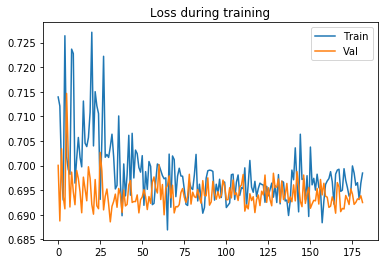

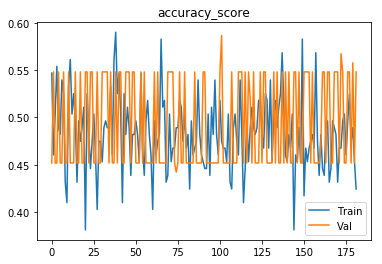

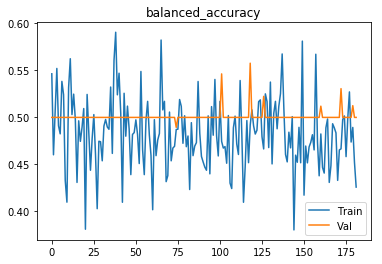

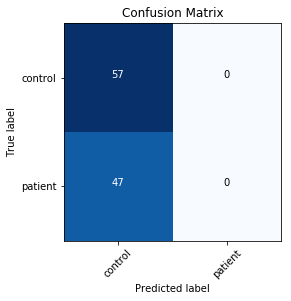

###### Starting inner fold 2
{'model': 'ModelLiu', 'batch_size': 4, 'patience': 12, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.69671
[0,     4] loss: 0.76879
[0,     6] loss: 0.78924
[0,     8] loss: 0.71806
[0,    10] loss: 0.69706
[0,    12] loss: 0.70198
[0,    14] loss: 0.68764
[0,    16] loss: 0.69351
[0,    18] loss: 0.66635
[0,    20] loss: 0.71239
[0,    22] loss: 0.71148
[0,    24] loss: 0.72171
[0,    26] loss: 0.74429
[0,    28] loss: 0.71682
[0,    30] loss: 0.71871
[0,    32] loss: 0.73158
[0,    34] loss: 0.68732
Time elapsed: 0h:0m:2s
train accuracy_score: 43.17 %
train balanced_accuracy: 43.18 %
val accuracy_score: 50.00 %
val balanced_accuracy: 50.09 %
Val loss: 0.692643
[1,     2] loss: 0.69500
[1,     4] loss: 0.71855
[1,     6] loss: 0.71004
[1,     8] loss: 0.72593
[1,    10] loss: 0.72257
[1,    12] loss: 0.69218
[1,    14] loss: 0.69528
[1,    16] loss: 0.65992
[1,    18] loss: 0.73274
[1,    20] loss: 0.68247
[1,    22] loss: 0.67893
[1, 

[13,    30] loss: 0.73712
[13,    32] loss: 0.64915
[13,    34] loss: 0.69080
Time elapsed: 0h:0m:45s
train accuracy_score: 53.96 %
train balanced_accuracy: 54.03 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.695071
[14,     2] loss: 0.67925
[14,     4] loss: 0.73778
[14,     6] loss: 0.70082
[14,     8] loss: 0.74191
[14,    10] loss: 0.66891
[14,    12] loss: 0.77574
[14,    14] loss: 0.65604
[14,    16] loss: 0.66741
[14,    18] loss: 0.68551
[14,    20] loss: 0.75234
[14,    22] loss: 0.70236
[14,    24] loss: 0.69741
[14,    26] loss: 0.66836
[14,    28] loss: 0.69177
[14,    30] loss: 0.64633
[14,    32] loss: 0.64446
[14,    34] loss: 0.67075
Time elapsed: 0h:0m:48s
train accuracy_score: 52.52 %
train balanced_accuracy: 52.46 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.697303
[15,     2] loss: 0.67752
[15,     4] loss: 0.68965
[15,     6] loss: 0.70471
[15,     8] loss: 0.63624
[15,    10] loss: 0.75029
[15,    12] loss: 0.

[27,    10] loss: 0.65990
[27,    12] loss: 0.72969
[27,    14] loss: 0.70709
[27,    16] loss: 0.72309
[27,    18] loss: 0.70831
[27,    20] loss: 0.66762
[27,    22] loss: 0.70829
[27,    24] loss: 0.70950
[27,    26] loss: 0.70766
[27,    28] loss: 0.71322
[27,    30] loss: 0.70314
[27,    32] loss: 0.76972
[27,    34] loss: 0.72715
Time elapsed: 0h:1m:31s
train accuracy_score: 50.36 %
train balanced_accuracy: 50.41 %
val accuracy_score: 54.81 %
val balanced_accuracy: 50.00 %
Val loss: 0.690715
[28,     2] loss: 0.68813
[28,     4] loss: 0.70194
[28,     6] loss: 0.72792
[28,     8] loss: 0.61406
[28,    10] loss: 0.75497
[28,    12] loss: 0.65543
[28,    14] loss: 0.69408
[28,    16] loss: 0.76888
[28,    18] loss: 0.71039
[28,    20] loss: 0.73353
[28,    22] loss: 0.75135
[28,    24] loss: 0.70344
[28,    26] loss: 0.68641
[28,    28] loss: 0.74164
[28,    30] loss: 0.67683
[28,    32] loss: 0.70220
[28,    34] loss: 0.67858
Time elapsed: 0h:1m:35s
train accuracy_score: 49.64 %
t

Time elapsed: 0h:2m:16s
train accuracy_score: 41.73 %
train balanced_accuracy: 41.77 %
val accuracy_score: 47.12 %
val balanced_accuracy: 50.26 %
Val loss: 0.690011
[41,     2] loss: 0.71209
[41,     4] loss: 0.68054
[41,     6] loss: 0.68693
[41,     8] loss: 0.69771
[41,    10] loss: 0.69571
[41,    12] loss: 0.71962
[41,    14] loss: 0.71529
[41,    16] loss: 0.68626
[41,    18] loss: 0.72654
[41,    20] loss: 0.70705
[41,    22] loss: 0.68730
[41,    24] loss: 0.69487
[41,    26] loss: 0.69383
[41,    28] loss: 0.69653
[41,    30] loss: 0.67830
[41,    32] loss: 0.64175
[41,    34] loss: 0.60764
Time elapsed: 0h:2m:20s
train accuracy_score: 50.36 %
train balanced_accuracy: 50.26 %
val accuracy_score: 41.35 %
val balanced_accuracy: 44.25 %
Val loss: 0.705005
[42,     2] loss: 0.69131
[42,     4] loss: 0.64283
[42,     6] loss: 0.73443
[42,     8] loss: 0.73789
[42,    10] loss: 0.66859
[42,    12] loss: 0.66973
[42,    14] loss: 0.68872
[42,    16] loss: 0.64936
[42,    18] loss: 0.

[54,    18] loss: 0.68811
[54,    20] loss: 0.72989
[54,    22] loss: 0.68855
[54,    24] loss: 0.68014
[54,    26] loss: 0.72420
[54,    28] loss: 0.71508
[54,    30] loss: 0.69770
[54,    32] loss: 0.68730
[54,    34] loss: 0.65887
Time elapsed: 0h:3m:4s
train accuracy_score: 53.96 %
train balanced_accuracy: 54.03 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.694048
[55,     2] loss: 0.71066
[55,     4] loss: 0.72240
[55,     6] loss: 0.71768
[55,     8] loss: 0.67486
[55,    10] loss: 0.65712
[55,    12] loss: 0.73698
[55,    14] loss: 0.66283
[55,    16] loss: 0.71641
[55,    18] loss: 0.67541
[55,    20] loss: 0.68517
[55,    22] loss: 0.67394
[55,    24] loss: 0.70234
[55,    26] loss: 0.69236
[55,    28] loss: 0.70558
[55,    30] loss: 0.69175
[55,    32] loss: 0.69440
[55,    34] loss: 0.72473
Time elapsed: 0h:3m:7s
train accuracy_score: 48.92 %
train balanced_accuracy: 48.75 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.697

val accuracy_score: 54.81 %
val balanced_accuracy: 50.00 %
Val loss: 0.691820
[68,     2] loss: 0.68281
[68,     4] loss: 0.68635
[68,     6] loss: 0.70324
[68,     8] loss: 0.70814
[68,    10] loss: 0.71946
[68,    12] loss: 0.69720
[68,    14] loss: 0.71688
[68,    16] loss: 0.69511
[68,    18] loss: 0.70323
[68,    20] loss: 0.69242
[68,    22] loss: 0.68117
[68,    24] loss: 0.72737
[68,    26] loss: 0.72779
[68,    28] loss: 0.73164
[68,    30] loss: 0.68345
[68,    32] loss: 0.70241
[68,    34] loss: 0.69571
Time elapsed: 0h:3m:49s
train accuracy_score: 49.64 %
train balanced_accuracy: 49.55 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.694498
[69,     2] loss: 0.70027
[69,     4] loss: 0.67755
[69,     6] loss: 0.68224
[69,     8] loss: 0.69194
[69,    10] loss: 0.69390
[69,    12] loss: 0.69978
[69,    14] loss: 0.69549
[69,    16] loss: 0.66902
[69,    18] loss: 0.66607
[69,    20] loss: 0.67648
[69,    22] loss: 0.68182
[69,    24] loss: 0.66160
[69

[81,    20] loss: 0.76283
[81,    22] loss: 0.67980
[81,    24] loss: 0.71289
[81,    26] loss: 0.66375
[81,    28] loss: 0.65199
[81,    30] loss: 0.71423
[81,    32] loss: 0.68474
[81,    34] loss: 0.69913
Time elapsed: 0h:4m:29s
train accuracy_score: 53.96 %
train balanced_accuracy: 54.23 %
val accuracy_score: 54.81 %
val balanced_accuracy: 50.00 %
Val loss: 0.692506
[82,     2] loss: 0.69488
[82,     4] loss: 0.69915
[82,     6] loss: 0.73233
[82,     8] loss: 0.67208
[82,    10] loss: 0.71202
[82,    12] loss: 0.71539
[82,    14] loss: 0.69895
[82,    16] loss: 0.69927
[82,    18] loss: 0.70296
[82,    20] loss: 0.69596
[82,    22] loss: 0.68128
[82,    24] loss: 0.68754
[82,    26] loss: 0.68290
[82,    28] loss: 0.70694
[82,    30] loss: 0.69184
[82,    32] loss: 0.72261
[82,    34] loss: 0.70752
Time elapsed: 0h:4m:32s
train accuracy_score: 43.88 %
train balanced_accuracy: 43.75 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.696063
[83,     2] loss: 0.

[95,     2] loss: 0.69740
[95,     4] loss: 0.70892
[95,     6] loss: 0.69339
[95,     8] loss: 0.67909
[95,    10] loss: 0.70200
[95,    12] loss: 0.69199
[95,    14] loss: 0.69342
[95,    16] loss: 0.69128
[95,    18] loss: 0.68512
[95,    20] loss: 0.71453
[95,    22] loss: 0.69918
[95,    24] loss: 0.69355
[95,    26] loss: 0.69779
[95,    28] loss: 0.67617
[95,    30] loss: 0.69037
[95,    32] loss: 0.69590
[95,    34] loss: 0.70625
Time elapsed: 0h:5m:15s
train accuracy_score: 45.32 %
train balanced_accuracy: 45.37 %
val accuracy_score: 55.77 %
val balanced_accuracy: 51.44 %
Val loss: 0.691141
[96,     2] loss: 0.69891
[96,     4] loss: 0.68943
[96,     6] loss: 0.68784
[96,     8] loss: 0.67075
[96,    10] loss: 0.69232
[96,    12] loss: 0.72610
[96,    14] loss: 0.71446
[96,    16] loss: 0.70862
[96,    18] loss: 0.69697
[96,    20] loss: 0.68584
[96,    22] loss: 0.69506
[96,    24] loss: 0.69344
[96,    26] loss: 0.70155
[96,    28] loss: 0.68979
[96,    30] loss: 0.69072
[96

[108,    18] loss: 0.70711
[108,    20] loss: 0.71767
[108,    22] loss: 0.69970
[108,    24] loss: 0.70383
[108,    26] loss: 0.69738
[108,    28] loss: 0.70291
[108,    30] loss: 0.68497
[108,    32] loss: 0.69072
[108,    34] loss: 0.68381
Time elapsed: 0h:5m:59s
train accuracy_score: 46.76 %
train balanced_accuracy: 47.02 %
val accuracy_score: 54.81 %
val balanced_accuracy: 50.00 %
Val loss: 0.691093
[109,     2] loss: 0.68914
[109,     4] loss: 0.72116
[109,     6] loss: 0.69107
[109,     8] loss: 0.68698
[109,    10] loss: 0.69320
[109,    12] loss: 0.69451
[109,    14] loss: 0.69217
[109,    16] loss: 0.74550
[109,    18] loss: 0.69719
[109,    20] loss: 0.66880
[109,    22] loss: 0.70744
[109,    24] loss: 0.72060
[109,    26] loss: 0.71510
[109,    28] loss: 0.75053
[109,    30] loss: 0.68449
[109,    32] loss: 0.64044
[109,    34] loss: 0.67888
Time elapsed: 0h:6m:2s
train accuracy_score: 47.48 %
train balanced_accuracy: 47.61 %
val accuracy_score: 54.81 %
val balanced_accura

[121,    26] loss: 0.70109
[121,    28] loss: 0.68941
[121,    30] loss: 0.67415
[121,    32] loss: 0.70584
[121,    34] loss: 0.70340
Time elapsed: 0h:6m:42s
train accuracy_score: 48.92 %
train balanced_accuracy: 48.73 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.694988
[122,     2] loss: 0.70999
[122,     4] loss: 0.69885
[122,     6] loss: 0.70817
[122,     8] loss: 0.70265
[122,    10] loss: 0.68226
[122,    12] loss: 0.69846
[122,    14] loss: 0.69785
[122,    16] loss: 0.68760
[122,    18] loss: 0.69507
[122,    20] loss: 0.69636
[122,    22] loss: 0.69153
[122,    24] loss: 0.68993
[122,    26] loss: 0.69372
[122,    28] loss: 0.69676
[122,    30] loss: 0.69329
[122,    32] loss: 0.69389
[122,    34] loss: 0.69814
Time elapsed: 0h:6m:45s
train accuracy_score: 48.20 %
train balanced_accuracy: 48.28 %
val accuracy_score: 54.81 %
val balanced_accuracy: 50.00 %
Val loss: 0.692379
[123,     2] loss: 0.69557
[123,     4] loss: 0.70124
[123,     6] loss: 0.6

Time elapsed: 0h:7m:26s
train accuracy_score: 49.64 %
train balanced_accuracy: 49.40 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.695207
[135,     2] loss: 0.69391
[135,     4] loss: 0.73135
[135,     6] loss: 0.68228
[135,     8] loss: 0.69446
[135,    10] loss: 0.66973
[135,    12] loss: 0.70118
[135,    14] loss: 0.70123
[135,    16] loss: 0.67994
[135,    18] loss: 0.70728
[135,    20] loss: 0.68753
[135,    22] loss: 0.67986
[135,    24] loss: 0.69704
[135,    26] loss: 0.69062
[135,    28] loss: 0.69142
[135,    30] loss: 0.68797
[135,    32] loss: 0.69746
[135,    34] loss: 0.70726
Time elapsed: 0h:7m:29s
train accuracy_score: 49.64 %
train balanced_accuracy: 49.44 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.694256
[136,     2] loss: 0.67869
[136,     4] loss: 0.68299
[136,     6] loss: 0.70034
[136,     8] loss: 0.67091
[136,    10] loss: 0.69853
[136,    12] loss: 0.68504
[136,    14] loss: 0.69279
[136,    16] loss: 0.6

val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.693237
[148,     2] loss: 0.69619
[148,     4] loss: 0.69119
[148,     6] loss: 0.68780
[148,     8] loss: 0.71029
[148,    10] loss: 0.70301
[148,    12] loss: 0.69472
[148,    14] loss: 0.69657
[148,    16] loss: 0.70047
[148,    18] loss: 0.68083
[148,    20] loss: 0.68678
[148,    22] loss: 0.68164
[148,    24] loss: 0.71189
[148,    26] loss: 0.68476
[148,    28] loss: 0.68209
[148,    30] loss: 0.69382
[148,    32] loss: 0.70388
[148,    34] loss: 0.70424
Time elapsed: 0h:8m:12s
train accuracy_score: 47.48 %
train balanced_accuracy: 47.35 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.694618
[149,     2] loss: 0.69312
[149,     4] loss: 0.69825
[149,     6] loss: 0.70891
[149,     8] loss: 0.68589
[149,    10] loss: 0.69725
[149,    12] loss: 0.69519
[149,    14] loss: 0.70122
[149,    16] loss: 0.69036
[149,    18] loss: 0.67663
[149,    20] loss: 0.69285
[149,    22] loss: 0.68254
[

[161,    10] loss: 0.69481
[161,    12] loss: 0.71177
[161,    14] loss: 0.69200
[161,    16] loss: 0.69124
[161,    18] loss: 0.70140
[161,    20] loss: 0.69618
[161,    22] loss: 0.69250
[161,    24] loss: 0.71104
[161,    26] loss: 0.67958
[161,    28] loss: 0.67898
[161,    30] loss: 0.69622
[161,    32] loss: 0.70611
[161,    34] loss: 0.68647
Time elapsed: 0h:8m:56s
train accuracy_score: 43.17 %
train balanced_accuracy: 43.15 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.694042
[162,     2] loss: 0.68531
[162,     4] loss: 0.69488
[162,     6] loss: 0.68743
[162,     8] loss: 0.69334
[162,    10] loss: 0.70201
[162,    12] loss: 0.69983
[162,    14] loss: 0.69422
[162,    16] loss: 0.69010
[162,    18] loss: 0.68155
[162,    20] loss: 0.71156
[162,    22] loss: 0.69474
[162,    24] loss: 0.68349
[162,    26] loss: 0.67999
[162,    28] loss: 0.74055
[162,    30] loss: 0.67647
[162,    32] loss: 0.70615
[162,    34] loss: 0.66444
Time elapsed: 0h:8m:59s
t

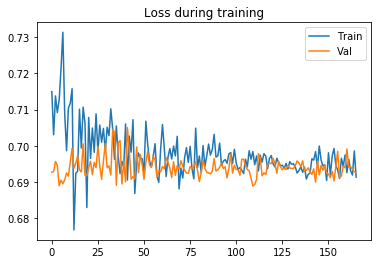

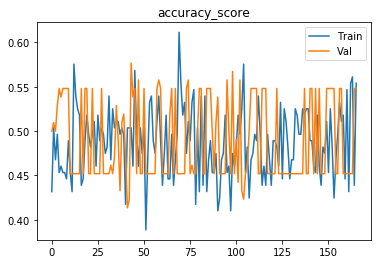

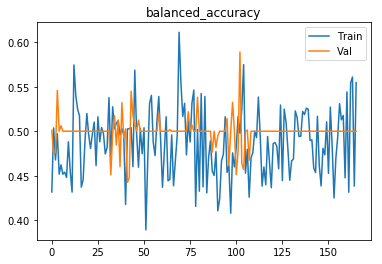

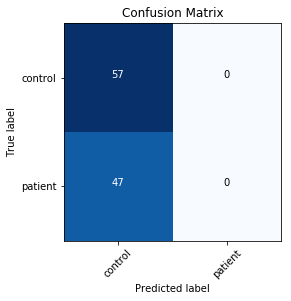

###### Starting inner fold 3
{'model': 'ModelLiu', 'batch_size': 12, 'patience': 12, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.70341
[0,     4] loss: 0.68200
[0,     6] loss: 0.77880
[0,     8] loss: 0.68697
[0,    10] loss: 0.69011
Time elapsed: 0h:0m:2s
train accuracy_score: 53.96 %
train balanced_accuracy: 53.89 %
val accuracy_score: 54.81 %
val balanced_accuracy: 50.00 %
Val loss: 0.729667
[1,     2] loss: 0.84289
[1,     4] loss: 0.67158
[1,     6] loss: 0.75758
[1,     8] loss: 0.65016
[1,    10] loss: 0.72194
Time elapsed: 0h:0m:5s
train accuracy_score: 51.08 %
train balanced_accuracy: 51.36 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.698653
[2,     2] loss: 0.67791
[2,     4] loss: 0.67962
[2,     6] loss: 0.72042
[2,     8] loss: 0.70697
[2,    10] loss: 0.71330
Time elapsed: 0h:0m:8s
train accuracy_score: 52.52 %
train balanced_accuracy: 52.25 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.698065


val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.694964
[28,     2] loss: 0.72594
[28,     4] loss: 0.68835
[28,     6] loss: 0.71545
[28,     8] loss: 0.72706
[28,    10] loss: 0.70517
Time elapsed: 0h:1m:38s
train accuracy_score: 45.32 %
train balanced_accuracy: 45.14 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.702193
[29,     2] loss: 0.70147
[29,     4] loss: 0.72244
[29,     6] loss: 0.71248
[29,     8] loss: 0.73313
[29,    10] loss: 0.68107
Time elapsed: 0h:1m:42s
train accuracy_score: 47.48 %
train balanced_accuracy: 47.55 %
val accuracy_score: 54.81 %
val balanced_accuracy: 50.00 %
Val loss: 0.690091
[30,     2] loss: 0.70463
[30,     4] loss: 0.69962
[30,     6] loss: 0.70157
[30,     8] loss: 0.69245
[30,    10] loss: 0.73694
Time elapsed: 0h:1m:45s
train accuracy_score: 48.92 %
train balanced_accuracy: 49.00 %
val accuracy_score: 54.81 %
val balanced_accuracy: 50.00 %
Val loss: 0.691234
[31,     2] loss: 0.70042
[31,     4]

val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.693962
[56,     2] loss: 0.70337
[56,     4] loss: 0.66187
[56,     6] loss: 0.72669
[56,     8] loss: 0.72436
[56,    10] loss: 0.73591
Time elapsed: 0h:3m:14s
train accuracy_score: 46.04 %
train balanced_accuracy: 45.87 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.699814
[57,     2] loss: 0.68186
[57,     4] loss: 0.71239
[57,     6] loss: 0.68486
[57,     8] loss: 0.71923
[57,    10] loss: 0.68657
Time elapsed: 0h:3m:18s
train accuracy_score: 54.68 %
train balanced_accuracy: 54.69 %
val accuracy_score: 54.81 %
val balanced_accuracy: 50.00 %
Val loss: 0.689314
[58,     2] loss: 0.69240
[58,     4] loss: 0.70925
[58,     6] loss: 0.76603
[58,     8] loss: 0.74587
[58,    10] loss: 0.67714
Time elapsed: 0h:3m:21s
train accuracy_score: 45.32 %
train balanced_accuracy: 45.51 %
val accuracy_score: 54.81 %
val balanced_accuracy: 50.00 %
Val loss: 0.689422
[59,     2] loss: 0.68824
[59,     4]

val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.694812
[84,     2] loss: 0.69383
[84,     4] loss: 0.72434
[84,     6] loss: 0.69599
[84,     8] loss: 0.69779
[84,    10] loss: 0.69010
Time elapsed: 0h:4m:50s
train accuracy_score: 51.80 %
train balanced_accuracy: 51.80 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.694322
[85,     2] loss: 0.69589
[85,     4] loss: 0.70637
[85,     6] loss: 0.70016
[85,     8] loss: 0.72729
[85,    10] loss: 0.70509
Time elapsed: 0h:4m:53s
train accuracy_score: 43.17 %
train balanced_accuracy: 43.16 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.694333
[86,     2] loss: 0.70255
[86,     4] loss: 0.70237
[86,     6] loss: 0.72121
[86,     8] loss: 0.69216
[86,    10] loss: 0.69439
Time elapsed: 0h:4m:57s
train accuracy_score: 47.48 %
train balanced_accuracy: 47.46 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.693815
[87,     2] loss: 0.71220
[87,     4]

Time elapsed: 0h:6m:22s
train accuracy_score: 48.92 %
train balanced_accuracy: 48.96 %
val accuracy_score: 54.81 %
val balanced_accuracy: 50.00 %
Val loss: 0.692870
[112,     2] loss: 0.69196
[112,     4] loss: 0.69850
[112,     6] loss: 0.70312
[112,     8] loss: 0.69485
[112,    10] loss: 0.67805
Time elapsed: 0h:6m:25s
train accuracy_score: 52.52 %
train balanced_accuracy: 52.53 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.695523
[113,     2] loss: 0.71183
[113,     4] loss: 0.71910
[113,     6] loss: 0.69565
[113,     8] loss: 0.71108
[113,    10] loss: 0.70432
Time elapsed: 0h:6m:29s
train accuracy_score: 45.32 %
train balanced_accuracy: 45.26 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.695169
[114,     2] loss: 0.68421
[114,     4] loss: 0.69982
[114,     6] loss: 0.71269
[114,     8] loss: 0.69767
[114,    10] loss: 0.70383
Time elapsed: 0h:6m:33s
train accuracy_score: 48.20 %
train balanced_accuracy: 48.04 %
val accuracy_

[139,     2] loss: 0.68434
[139,     4] loss: 0.68408
[139,     6] loss: 0.69303
[139,     8] loss: 0.68083
[139,    10] loss: 0.71006
Time elapsed: 0h:7m:58s
train accuracy_score: 56.83 %
train balanced_accuracy: 56.72 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.696613
[140,     2] loss: 0.68497
[140,     4] loss: 0.70244
[140,     6] loss: 0.67981
[140,     8] loss: 0.70944
[140,    10] loss: 0.69881
Time elapsed: 0h:8m:1s
train accuracy_score: 49.64 %
train balanced_accuracy: 49.48 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.695624
[141,     2] loss: 0.69355
[141,     4] loss: 0.70738
[141,     6] loss: 0.68709
[141,     8] loss: 0.68136
[141,    10] loss: 0.68392
Time elapsed: 0h:8m:5s
train accuracy_score: 53.24 %
train balanced_accuracy: 53.16 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.693740
[142,     2] loss: 0.69678
[142,     4] loss: 0.70702
[142,     6] loss: 0.69365
[142,     8] loss: 0.

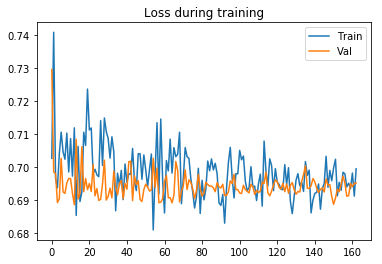

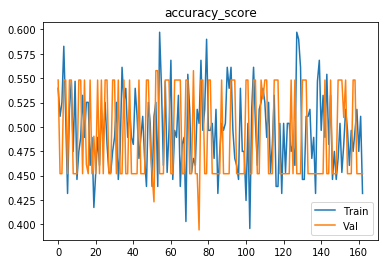

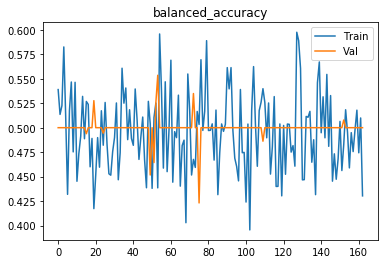

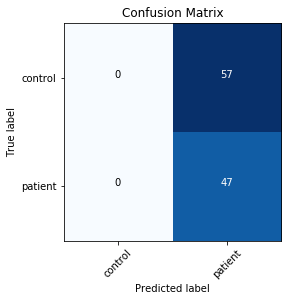

###### Starting inner fold 4
{'model': 'ModelLiu', 'batch_size': 6, 'patience': 12, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.68861
[0,     4] loss: 0.68518
[0,     6] loss: 0.65403
[0,     8] loss: 0.57866
[0,    10] loss: 0.79475
[0,    12] loss: 0.77838
[0,    14] loss: 0.67697
[0,    16] loss: 0.69937
[0,    18] loss: 0.69562
[0,    20] loss: 0.79904
[0,    22] loss: 0.76257
Time elapsed: 0h:0m:2s
train accuracy_score: 48.92 %
train balanced_accuracy: 48.88 %
val accuracy_score: 54.81 %
val balanced_accuracy: 50.00 %
Val loss: 0.688679
[1,     2] loss: 0.64893
[1,     4] loss: 0.78673
[1,     6] loss: 0.73338
[1,     8] loss: 0.73945
[1,    10] loss: 0.63770
[1,    12] loss: 0.64784
[1,    14] loss: 0.76330
[1,    16] loss: 0.83251
[1,    18] loss: 0.81810
[1,    20] loss: 0.73655
[1,    22] loss: 0.78842
Time elapsed: 0h:0m:6s
train accuracy_score: 43.88 %
train balanced_accuracy: 43.89 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss:

[18,     8] loss: 0.68627
[18,    10] loss: 0.67810
[18,    12] loss: 0.73026
[18,    14] loss: 0.79976
[18,    16] loss: 0.72664
[18,    18] loss: 0.73663
[18,    20] loss: 0.63626
[18,    22] loss: 0.68164
Time elapsed: 0h:1m:2s
train accuracy_score: 51.08 %
train balanced_accuracy: 51.25 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.693805
[19,     2] loss: 0.70515
[19,     4] loss: 0.77924
[19,     6] loss: 0.65248
[19,     8] loss: 0.75377
[19,    10] loss: 0.69979
[19,    12] loss: 0.66122
[19,    14] loss: 0.68326
[19,    16] loss: 0.62255
[19,    18] loss: 0.72209
[19,    20] loss: 0.66166
[19,    22] loss: 0.66668
Time elapsed: 0h:1m:5s
train accuracy_score: 47.48 %
train balanced_accuracy: 47.46 %
val accuracy_score: 54.81 %
val balanced_accuracy: 50.00 %
Val loss: 0.691225
[20,     2] loss: 0.69861
[20,     4] loss: 0.70848
[20,     6] loss: 0.72963
[20,     8] loss: 0.72389
[20,    10] loss: 0.70642
[20,    12] loss: 0.67293
[20,    14] loss: 0.74

[36,    16] loss: 0.74053
[36,    18] loss: 0.66867
[36,    20] loss: 0.75841
[36,    22] loss: 0.72249
Time elapsed: 0h:2m:4s
train accuracy_score: 44.60 %
train balanced_accuracy: 44.44 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.701007
[37,     2] loss: 0.70570
[37,     4] loss: 0.74366
[37,     6] loss: 0.67501
[37,     8] loss: 0.66504
[37,    10] loss: 0.68957
[37,    12] loss: 0.62626
[37,    14] loss: 0.81009
[37,    16] loss: 0.73882
[37,    18] loss: 0.72430
[37,    20] loss: 0.74620
[37,    22] loss: 0.68982
Time elapsed: 0h:2m:7s
train accuracy_score: 47.48 %
train balanced_accuracy: 47.39 %
val accuracy_score: 54.81 %
val balanced_accuracy: 50.00 %
Val loss: 0.689596
[38,     2] loss: 0.72626
[38,     4] loss: 0.69558
[38,     6] loss: 0.71854
[38,     8] loss: 0.69359
[38,    10] loss: 0.67143
[38,    12] loss: 0.70874
[38,    14] loss: 0.69987
[38,    16] loss: 0.75143
[38,    18] loss: 0.68879
[38,    20] loss: 0.67420
[38,    22] loss: 0.70

[54,    22] loss: 0.73132
Time elapsed: 0h:3m:4s
train accuracy_score: 52.52 %
train balanced_accuracy: 52.41 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.698565
[55,     2] loss: 0.69553
[55,     4] loss: 0.66734
[55,     6] loss: 0.70824
[55,     8] loss: 0.72286
[55,    10] loss: 0.69625
[55,    12] loss: 0.72781
[55,    14] loss: 0.67582
[55,    16] loss: 0.70647
[55,    18] loss: 0.71810
[55,    20] loss: 0.70804
[55,    22] loss: 0.69807
Time elapsed: 0h:3m:7s
train accuracy_score: 48.92 %
train balanced_accuracy: 48.93 %
val accuracy_score: 54.81 %
val balanced_accuracy: 50.00 %
Val loss: 0.690648
[56,     2] loss: 0.69596
[56,     4] loss: 0.73382
[56,     6] loss: 0.71865
[56,     8] loss: 0.66647
[56,    10] loss: 0.78584
[56,    12] loss: 0.71986
[56,    14] loss: 0.68720
[56,    16] loss: 0.74026
[56,    18] loss: 0.70980
[56,    20] loss: 0.70891
[56,    22] loss: 0.68122
Time elapsed: 0h:3m:11s
train accuracy_score: 48.20 %
train balanced_accur

val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.695660
[73,     2] loss: 0.66983
[73,     4] loss: 0.69052
[73,     6] loss: 0.66626
[73,     8] loss: 0.67126
[73,    10] loss: 0.72370
[73,    12] loss: 0.69759
[73,    14] loss: 0.67386
[73,    16] loss: 0.69621
[73,    18] loss: 0.66636
[73,    20] loss: 0.70289
[73,    22] loss: 0.70875
Time elapsed: 0h:4m:7s
train accuracy_score: 49.64 %
train balanced_accuracy: 49.49 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.698597
[74,     2] loss: 0.68584
[74,     4] loss: 0.68128
[74,     6] loss: 0.73916
[74,     8] loss: 0.67029
[74,    10] loss: 0.74039
[74,    12] loss: 0.68381
[74,    14] loss: 0.76238
[74,    16] loss: 0.69698
[74,    18] loss: 0.66204
[74,    20] loss: 0.70930
[74,    22] loss: 0.70564
Time elapsed: 0h:4m:11s
train accuracy_score: 50.36 %
train balanced_accuracy: 50.14 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.696043
[75,     2] loss: 0.6

[91,     2] loss: 0.67672
[91,     4] loss: 0.71019
[91,     6] loss: 0.70797
[91,     8] loss: 0.69688
[91,    10] loss: 0.70161
[91,    12] loss: 0.70106
[91,    14] loss: 0.68480
[91,    16] loss: 0.68673
[91,    18] loss: 0.73070
[91,    20] loss: 0.69791
[91,    22] loss: 0.70660
Time elapsed: 0h:5m:8s
train accuracy_score: 51.08 %
train balanced_accuracy: 51.05 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.695689
[92,     2] loss: 0.69694
[92,     4] loss: 0.69778
[92,     6] loss: 0.68474
[92,     8] loss: 0.67648
[92,    10] loss: 0.70090
[92,    12] loss: 0.69066
[92,    14] loss: 0.70219
[92,    16] loss: 0.67808
[92,    18] loss: 0.68572
[92,    20] loss: 0.69876
[92,    22] loss: 0.68826
Time elapsed: 0h:5m:12s
train accuracy_score: 52.52 %
train balanced_accuracy: 52.42 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.694806
[93,     2] loss: 0.68487
[93,     4] loss: 0.69593
[93,     6] loss: 0.71665
[93,     8] loss: 0.7

[109,     2] loss: 0.70860
[109,     4] loss: 0.67590
[109,     6] loss: 0.68796
[109,     8] loss: 0.71235
[109,    10] loss: 0.72828
[109,    12] loss: 0.71729
[109,    14] loss: 0.71035
[109,    16] loss: 0.70041
[109,    18] loss: 0.69900
[109,    20] loss: 0.67636
[109,    22] loss: 0.68553
Time elapsed: 0h:6m:9s
train accuracy_score: 48.20 %
train balanced_accuracy: 48.48 %
val accuracy_score: 54.81 %
val balanced_accuracy: 50.00 %
Val loss: 0.691999
[110,     2] loss: 0.69648
[110,     4] loss: 0.67870
[110,     6] loss: 0.72275
[110,     8] loss: 0.69819
[110,    10] loss: 0.69861
[110,    12] loss: 0.71860
[110,    14] loss: 0.66883
[110,    16] loss: 0.68347
[110,    18] loss: 0.70143
[110,    20] loss: 0.70691
[110,    22] loss: 0.70354
Time elapsed: 0h:6m:12s
train accuracy_score: 46.76 %
train balanced_accuracy: 46.94 %
val accuracy_score: 54.81 %
val balanced_accuracy: 50.00 %
Val loss: 0.692111
[111,     2] loss: 0.69251
[111,     4] loss: 0.69893
[111,     6] loss: 0.68

val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.698148
[127,     2] loss: 0.69418
[127,     4] loss: 0.68784
[127,     6] loss: 0.67600
[127,     8] loss: 0.71656
[127,    10] loss: 0.70099
[127,    12] loss: 0.68740
[127,    14] loss: 0.65557
[127,    16] loss: 0.69360
[127,    18] loss: 0.67394
[127,    20] loss: 0.71593
[127,    22] loss: 0.72710
Time elapsed: 0h:7m:7s
train accuracy_score: 50.36 %
train balanced_accuracy: 50.04 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.700091
[128,     2] loss: 0.68400
[128,     4] loss: 0.70125
[128,     6] loss: 0.72633
[128,     8] loss: 0.71293
[128,    10] loss: 0.68683
[128,    12] loss: 0.71140
[128,    14] loss: 0.70035
[128,    16] loss: 0.68628
[128,    18] loss: 0.71234
[128,    20] loss: 0.69212
[128,    22] loss: 0.68687
Time elapsed: 0h:7m:10s
train accuracy_score: 45.32 %
train balanced_accuracy: 45.21 %
val accuracy_score: 42.31 %
val balanced_accuracy: 46.44 %
Val loss: 0.693635

Time elapsed: 0h:8m:5s
train accuracy_score: 48.92 %
train balanced_accuracy: 48.72 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.697381
[145,     2] loss: 0.69851
[145,     4] loss: 0.68322
[145,     6] loss: 0.71605
[145,     8] loss: 0.70442
[145,    10] loss: 0.71410
[145,    12] loss: 0.68656
[145,    14] loss: 0.69873
[145,    16] loss: 0.69878
[145,    18] loss: 0.69249
[145,    20] loss: 0.68578
[145,    22] loss: 0.70379
Time elapsed: 0h:8m:8s
train accuracy_score: 49.64 %
train balanced_accuracy: 49.41 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.695617
[146,     2] loss: 0.69954
[146,     4] loss: 0.70262
[146,     6] loss: 0.70904
[146,     8] loss: 0.68636
[146,    10] loss: 0.69362
[146,    12] loss: 0.69460
[146,    14] loss: 0.70097
[146,    16] loss: 0.68294
[146,    18] loss: 0.67717
[146,    20] loss: 0.69215
[146,    22] loss: 0.69578
Time elapsed: 0h:8m:11s
train accuracy_score: 49.64 %
train balanced_accuracy:

[162,    20] loss: 0.69932
[162,    22] loss: 0.69021
Time elapsed: 0h:9m:4s
train accuracy_score: 52.52 %
train balanced_accuracy: 52.55 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.693722
Early stopping in epoch 163
Total time elapsed: 0h:9m:5s
Writing model to disk...
Best result during training: 0.50. Saving model..
Finished inner fold.


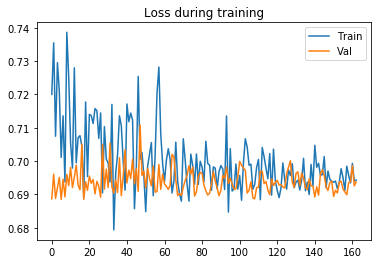

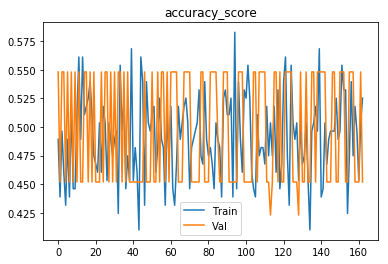

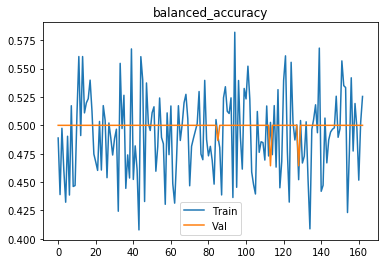

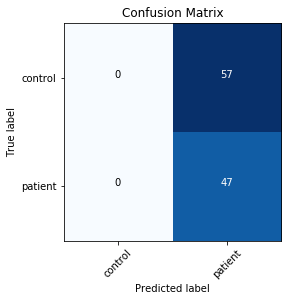

Finished outer fold.
{'final_acc': 0.5, 'best_acc': 0.53060843598357588, 'final_iter': 182, 'best_iter': 119, 'params': {'model': 'ModelLiu', 'batch_size': 4, 'patience': 16, 'lr': 0.001}, 'inner_fold_idx': 1}
###### Starting outer fold 5
# of patients 125, # of healthy controls 126
136
115
###### Starting inner fold 0
{'model': 'ModelLiu', 'batch_size': 6, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.66600
[0,     4] loss: 0.84126
[0,     6] loss: 0.67316
[0,     8] loss: 0.70383
[0,    10] loss: 0.68787
[0,    12] loss: 0.76388
[0,    14] loss: 0.72467
[0,    16] loss: 0.60890
[0,    18] loss: 0.60052
[0,    20] loss: 0.80077
[0,    22] loss: 0.84224
Time elapsed: 0h:0m:2s
train accuracy_score: 51.47 %
train balanced_accuracy: 49.39 %
val accuracy_score: 47.83 %
val balanced_accuracy: 53.76 %
Val loss: 0.705897
[1,     2] loss: 0.68917
[1,     4] loss: 0.69882
[1,     6] loss: 0.63738
[1,     8] loss: 0.63656
[1,    10] loss: 0.66659
[1,    12] l

[17,    22] loss: 0.63401
Time elapsed: 0h:0m:53s
train accuracy_score: 52.94 %
train balanced_accuracy: 50.00 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.710274
[18,     2] loss: 0.65985
[18,     4] loss: 0.77047
[18,     6] loss: 0.78419
[18,     8] loss: 0.71878
[18,    10] loss: 0.63438
[18,    12] loss: 0.71933
[18,    14] loss: 0.64160
[18,    16] loss: 0.66256
[18,    18] loss: 0.75323
[18,    20] loss: 0.66180
[18,    22] loss: 0.64410
Time elapsed: 0h:0m:57s
train accuracy_score: 52.21 %
train balanced_accuracy: 48.64 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.724172
[19,     2] loss: 0.67452
[19,     4] loss: 0.60226
[19,     6] loss: 0.78116
[19,     8] loss: 0.73710
[19,    10] loss: 0.77423
[19,    12] loss: 0.73297
[19,    14] loss: 0.70612
[19,    16] loss: 0.66545
[19,    18] loss: 0.66556
[19,    20] loss: 0.72302
[19,    22] loss: 0.64502
Time elapsed: 0h:1m:0s
train accuracy_score: 55.88 %
train balanced_accu

val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.720308
[36,     2] loss: 0.68551
[36,     4] loss: 0.69723
[36,     6] loss: 0.72154
[36,     8] loss: 0.70272
[36,    10] loss: 0.74262
[36,    12] loss: 0.65496
[36,    14] loss: 0.67831
[36,    16] loss: 0.70398
[36,    18] loss: 0.66437
[36,    20] loss: 0.66025
[36,    22] loss: 0.67898
Time elapsed: 0h:1m:56s
train accuracy_score: 56.62 %
train balanced_accuracy: 55.39 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.695905
[37,     2] loss: 0.67780
[37,     4] loss: 0.69421
[37,     6] loss: 0.74558
[37,     8] loss: 0.65568
[37,    10] loss: 0.73377
[37,    12] loss: 0.69337
[37,    14] loss: 0.64391
[37,    16] loss: 0.76546
[37,    18] loss: 0.67693
[37,    20] loss: 0.83122
[37,    22] loss: 0.76253
Time elapsed: 0h:1m:59s
train accuracy_score: 51.47 %
train balanced_accuracy: 48.86 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.730937
[38,     2] loss: 0.

[54,     2] loss: 0.71885
[54,     4] loss: 0.69186
[54,     6] loss: 0.71198
[54,     8] loss: 0.61556
[54,    10] loss: 0.71416
[54,    12] loss: 0.76098
[54,    14] loss: 0.72154
[54,    16] loss: 0.62580
[54,    18] loss: 0.67948
[54,    20] loss: 0.74527
[54,    22] loss: 0.69572
Time elapsed: 0h:2m:56s
train accuracy_score: 55.15 %
train balanced_accuracy: 51.10 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.728059
[55,     2] loss: 0.70444
[55,     4] loss: 0.73652
[55,     6] loss: 0.74550
[55,     8] loss: 0.76631
[55,    10] loss: 0.63570
[55,    12] loss: 0.70783
[55,    14] loss: 0.67416
[55,    16] loss: 0.65734
[55,    18] loss: 0.56002
[55,    20] loss: 0.67920
[55,    22] loss: 0.70665
Time elapsed: 0h:2m:59s
train accuracy_score: 57.35 %
train balanced_accuracy: 52.72 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.726031
[56,     2] loss: 0.74807
[56,     4] loss: 0.64466
[56,     6] loss: 0.69274
[56,     8] loss: 0.

[72,     8] loss: 0.63217
[72,    10] loss: 0.80435
[72,    12] loss: 0.65243
[72,    14] loss: 0.67796
[72,    16] loss: 0.70013
[72,    18] loss: 0.69129
[72,    20] loss: 0.73777
[72,    22] loss: 0.67569
Time elapsed: 0h:3m:56s
train accuracy_score: 57.35 %
train balanced_accuracy: 53.42 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.716414
[73,     2] loss: 0.65136
[73,     4] loss: 0.68526
[73,     6] loss: 0.62531
[73,     8] loss: 0.67772
[73,    10] loss: 0.70934
[73,    12] loss: 0.70865
[73,    14] loss: 0.66613
[73,    16] loss: 0.61568
[73,    18] loss: 0.74363
[73,    20] loss: 0.60872
[73,    22] loss: 0.77809
Time elapsed: 0h:3m:59s
train accuracy_score: 59.56 %
train balanced_accuracy: 55.57 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.723844
[74,     2] loss: 0.74553
[74,     4] loss: 0.66317
[74,     6] loss: 0.65619
[74,     8] loss: 0.70232
[74,    10] loss: 0.66955
[74,    12] loss: 0.71686
[74,    14] loss: 0.

[90,    18] loss: 0.68230
[90,    20] loss: 0.69633
[90,    22] loss: 0.75660
Time elapsed: 0h:4m:52s
train accuracy_score: 53.68 %
train balanced_accuracy: 48.73 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.718831
[91,     2] loss: 0.70316
[91,     4] loss: 0.64973
[91,     6] loss: 0.63775
[91,     8] loss: 0.67032
[91,    10] loss: 0.66573
[91,    12] loss: 0.74667
[91,    14] loss: 0.66763
[91,    16] loss: 0.73312
[91,    18] loss: 0.64568
[91,    20] loss: 0.60295
[91,    22] loss: 0.87447
Time elapsed: 0h:4m:56s
train accuracy_score: 52.94 %
train balanced_accuracy: 47.54 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.718163
[92,     2] loss: 0.69849
[92,     4] loss: 0.65745
[92,     6] loss: 0.63931
[92,     8] loss: 0.71152
[92,    10] loss: 0.65596
[92,    12] loss: 0.62701
[92,    14] loss: 0.70664
[92,    16] loss: 0.68555
[92,    18] loss: 0.68886
[92,    20] loss: 0.63479
[92,    22] loss: 0.76728
Time elapsed: 0h:4m:

[108,    20] loss: 0.76695
[108,    22] loss: 0.68099
Time elapsed: 0h:5m:46s
train accuracy_score: 55.15 %
train balanced_accuracy: 49.52 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.722117
[109,     2] loss: 0.75993
[109,     4] loss: 0.73093
[109,     6] loss: 0.65872
[109,     8] loss: 0.69529
[109,    10] loss: 0.69472
[109,    12] loss: 0.66736
[109,    14] loss: 0.68282
[109,    16] loss: 0.64514
[109,    18] loss: 0.70925
[109,    20] loss: 0.63634
[109,    22] loss: 0.64693
Time elapsed: 0h:5m:49s
train accuracy_score: 54.41 %
train balanced_accuracy: 48.86 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.711625
[110,     2] loss: 0.68868
[110,     4] loss: 0.66836
[110,     6] loss: 0.71054
[110,     8] loss: 0.66747
[110,    10] loss: 0.61991
[110,    12] loss: 0.67709
[110,    14] loss: 0.71006
[110,    16] loss: 0.79670
[110,    18] loss: 0.66633
[110,    20] loss: 0.67829
[110,    22] loss: 0.69408
Time elapsed: 0h:5m:52

[126,    12] loss: 0.67403
[126,    14] loss: 0.69050
[126,    16] loss: 0.71721
[126,    18] loss: 0.70230
[126,    20] loss: 0.67854
[126,    22] loss: 0.72338
Time elapsed: 0h:6m:41s
train accuracy_score: 56.62 %
train balanced_accuracy: 50.83 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.714664
[127,     2] loss: 0.66284
[127,     4] loss: 0.66136
[127,     6] loss: 0.65135
[127,     8] loss: 0.68217
[127,    10] loss: 0.77023
[127,    12] loss: 0.62392
[127,    14] loss: 0.71743
[127,    16] loss: 0.66293
[127,    18] loss: 0.73563
[127,    20] loss: 0.70277
[127,    22] loss: 0.75679
Time elapsed: 0h:6m:44s
train accuracy_score: 55.88 %
train balanced_accuracy: 50.00 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.718602
[128,     2] loss: 0.67919
[128,     4] loss: 0.68404
[128,     6] loss: 0.68045
[128,     8] loss: 0.63797
[128,    10] loss: 0.73392
[128,    12] loss: 0.68437
[128,    14] loss: 0.67318
[128,    16] loss: 0.6

[144,     8] loss: 0.69442
[144,    10] loss: 0.70653
[144,    12] loss: 0.67740
[144,    14] loss: 0.66951
[144,    16] loss: 0.65781
[144,    18] loss: 0.68091
[144,    20] loss: 0.67414
[144,    22] loss: 0.70781
Time elapsed: 0h:7m:39s
train accuracy_score: 55.15 %
train balanced_accuracy: 49.52 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.710047
[145,     2] loss: 0.71413
[145,     4] loss: 0.66067
[145,     6] loss: 0.70658
[145,     8] loss: 0.70067
[145,    10] loss: 0.70389
[145,    12] loss: 0.69419
[145,    14] loss: 0.70659
[145,    16] loss: 0.67820
[145,    18] loss: 0.66802
[145,    20] loss: 0.67202
[145,    22] loss: 0.71172
Time elapsed: 0h:7m:42s
train accuracy_score: 57.35 %
train balanced_accuracy: 51.67 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.710848
[146,     2] loss: 0.71277
[146,     4] loss: 0.66739
[146,     6] loss: 0.66179
[146,     8] loss: 0.67344
[146,    10] loss: 0.76173
[146,    12] loss: 0.6

[162,     2] loss: 0.68919
[162,     4] loss: 0.68390
[162,     6] loss: 0.70254
[162,     8] loss: 0.70092
[162,    10] loss: 0.68964
[162,    12] loss: 0.68706
[162,    14] loss: 0.67558
[162,    16] loss: 0.65682
[162,    18] loss: 0.72213
[162,    20] loss: 0.64495
[162,    22] loss: 0.70014
Time elapsed: 0h:8m:34s
train accuracy_score: 57.35 %
train balanced_accuracy: 51.67 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.712917
[163,     2] loss: 0.69023
[163,     4] loss: 0.67095
[163,     6] loss: 0.71425
[163,     8] loss: 0.72886
[163,    10] loss: 0.67394
[163,    12] loss: 0.74834
[163,    14] loss: 0.67086
[163,    16] loss: 0.65030
[163,    18] loss: 0.66049
[163,    20] loss: 0.70305
[163,    22] loss: 0.62684
Time elapsed: 0h:8m:37s
train accuracy_score: 56.62 %
train balanced_accuracy: 50.83 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.714915
[164,     2] loss: 0.68614
[164,     4] loss: 0.70883
[164,     6] loss: 0.7

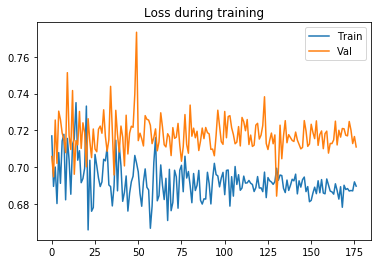

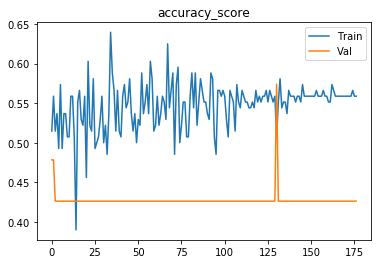

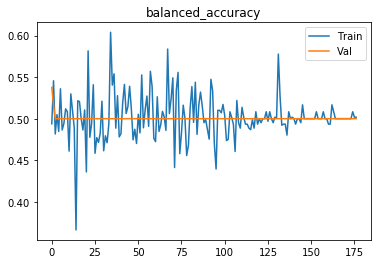

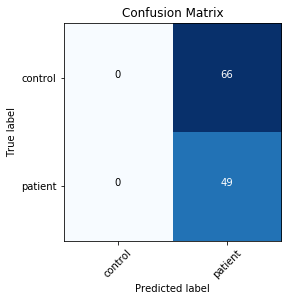

###### Starting inner fold 1
{'model': 'ModelLiu', 'batch_size': 12, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.70904
[0,     4] loss: 0.70472
[0,     6] loss: 0.69426
[0,     8] loss: 0.68821
[0,    10] loss: 0.68892
Time elapsed: 0h:0m:2s
train accuracy_score: 47.79 %
train balanced_accuracy: 44.34 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.729013
[1,     2] loss: 0.67594
[1,     4] loss: 0.59858
[1,     6] loss: 0.78419
[1,     8] loss: 0.74734
[1,    10] loss: 0.67967
Time elapsed: 0h:0m:5s
train accuracy_score: 57.35 %
train balanced_accuracy: 52.02 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.696674
[2,     2] loss: 0.68791
[2,     4] loss: 0.75776
[2,     6] loss: 0.72293
[2,     8] loss: 0.69343
[2,    10] loss: 0.71009
Time elapsed: 0h:0m:8s
train accuracy_score: 44.85 %
train balanced_accuracy: 45.22 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.719580


val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.722309
[28,     2] loss: 0.69459
[28,     4] loss: 0.66438
[28,     6] loss: 0.70105
[28,     8] loss: 0.70807
[28,    10] loss: 0.67059
Time elapsed: 0h:1m:28s
train accuracy_score: 55.15 %
train balanced_accuracy: 52.15 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.716019
[29,     2] loss: 0.72567
[29,     4] loss: 0.57528
[29,     6] loss: 0.71948
[29,     8] loss: 0.73730
[29,    10] loss: 0.66303
Time elapsed: 0h:1m:31s
train accuracy_score: 53.68 %
train balanced_accuracy: 49.25 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.729467
[30,     2] loss: 0.68215
[30,     4] loss: 0.76084
[30,     6] loss: 0.70153
[30,     8] loss: 0.65671
[30,    10] loss: 0.68977
Time elapsed: 0h:1m:34s
train accuracy_score: 55.88 %
train balanced_accuracy: 51.75 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.715314
[31,     2] loss: 0.68736
[31,     4]

val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.708885
[56,     2] loss: 0.69393
[56,     4] loss: 0.73697
[56,     6] loss: 0.72338
[56,     8] loss: 0.69809
[56,    10] loss: 0.68738
Time elapsed: 0h:2m:55s
train accuracy_score: 51.47 %
train balanced_accuracy: 48.51 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.707542
[57,     2] loss: 0.63887
[57,     4] loss: 0.74907
[57,     6] loss: 0.76019
[57,     8] loss: 0.70822
[57,    10] loss: 0.70962
Time elapsed: 0h:2m:58s
train accuracy_score: 56.62 %
train balanced_accuracy: 51.71 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.736307
[58,     2] loss: 0.66496
[58,     4] loss: 0.69720
[58,     6] loss: 0.74447
[58,     8] loss: 0.67580
[58,    10] loss: 0.67055
Time elapsed: 0h:3m:1s
train accuracy_score: 55.15 %
train balanced_accuracy: 49.87 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.728292
[59,     2] loss: 0.66670
[59,     4] 

val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.703080
[84,     2] loss: 0.67830
[84,     4] loss: 0.71113
[84,     6] loss: 0.69478
[84,     8] loss: 0.71203
[84,    10] loss: 0.68821
Time elapsed: 0h:4m:22s
train accuracy_score: 58.09 %
train balanced_accuracy: 53.90 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.711125
[85,     2] loss: 0.67216
[85,     4] loss: 0.71556
[85,     6] loss: 0.72026
[85,     8] loss: 0.70233
[85,    10] loss: 0.66777
Time elapsed: 0h:4m:25s
train accuracy_score: 53.68 %
train balanced_accuracy: 48.73 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.721503
[86,     2] loss: 0.67197
[86,     4] loss: 0.68769
[86,     6] loss: 0.70395
[86,     8] loss: 0.69566
[86,    10] loss: 0.68518
Time elapsed: 0h:4m:28s
train accuracy_score: 53.68 %
train balanced_accuracy: 48.20 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.724750
[87,     2] loss: 0.69401
[87,     4]

Time elapsed: 0h:5m:50s
train accuracy_score: 57.35 %
train balanced_accuracy: 51.84 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.723370
[112,     2] loss: 0.68249
[112,     4] loss: 0.68012
[112,     6] loss: 0.72830
[112,     8] loss: 0.68293
[112,    10] loss: 0.70198
Time elapsed: 0h:5m:53s
train accuracy_score: 54.41 %
train balanced_accuracy: 48.68 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.721695
[113,     2] loss: 0.69948
[113,     4] loss: 0.66804
[113,     6] loss: 0.69382
[113,     8] loss: 0.67762
[113,    10] loss: 0.67862
Time elapsed: 0h:5m:56s
train accuracy_score: 53.68 %
train balanced_accuracy: 48.20 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.711961
[114,     2] loss: 0.66772
[114,     4] loss: 0.69808
[114,     6] loss: 0.67967
[114,     8] loss: 0.70224
[114,    10] loss: 0.72432
Time elapsed: 0h:6m:0s
train accuracy_score: 57.35 %
train balanced_accuracy: 51.84 %
val accuracy_s

[139,     2] loss: 0.67789
[139,     4] loss: 0.67569
[139,     6] loss: 0.70292
[139,     8] loss: 0.69168
[139,    10] loss: 0.70934
Time elapsed: 0h:7m:21s
train accuracy_score: 51.47 %
train balanced_accuracy: 46.58 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.712213
[140,     2] loss: 0.70242
[140,     4] loss: 0.68645
[140,     6] loss: 0.65623
[140,     8] loss: 0.71788
[140,    10] loss: 0.66563
Time elapsed: 0h:7m:25s
train accuracy_score: 53.68 %
train balanced_accuracy: 48.55 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.711550
[141,     2] loss: 0.65725
[141,     4] loss: 0.68720
[141,     6] loss: 0.68663
[141,     8] loss: 0.67039
[141,    10] loss: 0.72922
Time elapsed: 0h:7m:28s
train accuracy_score: 55.88 %
train balanced_accuracy: 50.18 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.719843
[142,     2] loss: 0.68182
[142,     4] loss: 0.70467
[142,     6] loss: 0.67948
[142,     8] loss: 

Time elapsed: 0h:8m:49s
train accuracy_score: 52.21 %
train balanced_accuracy: 47.06 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.707867
[167,     2] loss: 0.69049
[167,     4] loss: 0.67909
[167,     6] loss: 0.67872
[167,     8] loss: 0.69061
[167,    10] loss: 0.68505
Time elapsed: 0h:8m:52s
train accuracy_score: 56.62 %
train balanced_accuracy: 51.71 %
val accuracy_score: 40.87 %
val balanced_accuracy: 47.96 %
Val loss: 0.706175
[168,     2] loss: 0.69604
[168,     4] loss: 0.69537
[168,     6] loss: 0.70300
[168,     8] loss: 0.69704
[168,    10] loss: 0.68473
Time elapsed: 0h:8m:56s
train accuracy_score: 55.88 %
train balanced_accuracy: 50.53 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.707768
[169,     2] loss: 0.69994
[169,     4] loss: 0.64584
[169,     6] loss: 0.70083
[169,     8] loss: 0.68379
[169,    10] loss: 0.70667
Time elapsed: 0h:8m:59s
train accuracy_score: 55.15 %
train balanced_accuracy: 49.52 %
val accuracy_

[194,     2] loss: 0.67986
[194,     4] loss: 0.64769
[194,     6] loss: 0.71457
[194,     8] loss: 0.73014
[194,    10] loss: 0.70083
Time elapsed: 0h:10m:20s
train accuracy_score: 55.88 %
train balanced_accuracy: 50.00 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.721392
[195,     2] loss: 0.70287
[195,     4] loss: 0.68481
[195,     6] loss: 0.70207
[195,     8] loss: 0.66291
[195,    10] loss: 0.65916
Time elapsed: 0h:10m:23s
train accuracy_score: 55.88 %
train balanced_accuracy: 50.00 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.722131
[196,     2] loss: 0.67135
[196,     4] loss: 0.70568
[196,     6] loss: 0.64152
[196,     8] loss: 0.71964
[196,    10] loss: 0.68864
Time elapsed: 0h:10m:26s
train accuracy_score: 55.88 %
train balanced_accuracy: 50.00 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.722327
[197,     2] loss: 0.66467
[197,     4] loss: 0.70210
[197,     6] loss: 0.68877
[197,     8] los

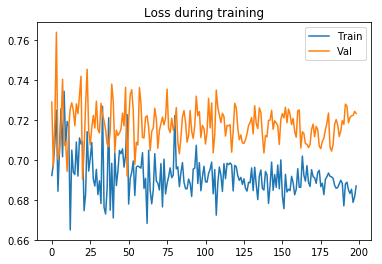

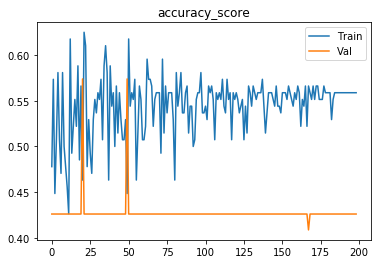

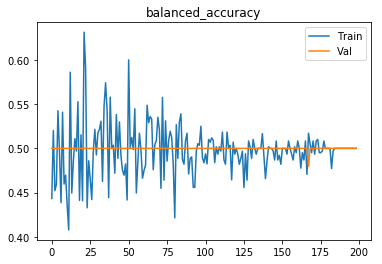

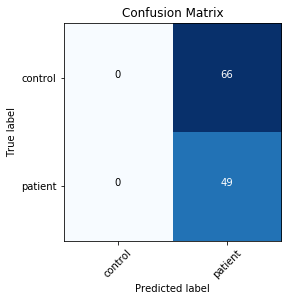

###### Starting inner fold 2
{'model': 'ModelLiu', 'batch_size': 12, 'patience': 12, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.70513
[0,     4] loss: 0.69936
[0,     6] loss: 0.68934
[0,     8] loss: 0.71438
[0,    10] loss: 0.70225
Time elapsed: 0h:0m:2s
train accuracy_score: 50.74 %
train balanced_accuracy: 49.43 %
val accuracy_score: 41.74 %
val balanced_accuracy: 48.72 %
Val loss: 0.706980
[1,     2] loss: 0.78381
[1,     4] loss: 0.67053
[1,     6] loss: 0.66766
[1,     8] loss: 0.67757
[1,    10] loss: 0.71262
Time elapsed: 0h:0m:5s
train accuracy_score: 52.94 %
train balanced_accuracy: 48.77 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.713774
[2,     2] loss: 0.68359
[2,     4] loss: 0.70903
[2,     6] loss: 0.71427
[2,     8] loss: 0.68247
[2,    10] loss: 0.74696
Time elapsed: 0h:0m:8s
train accuracy_score: 52.21 %
train balanced_accuracy: 49.34 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.704611


val accuracy_score: 57.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.688792
[28,     2] loss: 0.73782
[28,     4] loss: 0.70592
[28,     6] loss: 0.70291
[28,     8] loss: 0.72486
[28,    10] loss: 0.71777
Time elapsed: 0h:1m:33s
train accuracy_score: 44.12 %
train balanced_accuracy: 45.26 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.712162
[29,     2] loss: 0.72221
[29,     4] loss: 0.71261
[29,     6] loss: 0.68722
[29,     8] loss: 0.70723
[29,    10] loss: 0.70163
Time elapsed: 0h:1m:36s
train accuracy_score: 52.21 %
train balanced_accuracy: 47.41 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.743477
[30,     2] loss: 0.68371
[30,     4] loss: 0.76297
[30,     6] loss: 0.70791
[30,     8] loss: 0.77331
[30,    10] loss: 0.70507
Time elapsed: 0h:1m:39s
train accuracy_score: 53.68 %
train balanced_accuracy: 48.55 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.729121
[31,     2] loss: 0.68763
[31,     4]

val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.707513
[56,     2] loss: 0.70378
[56,     4] loss: 0.67554
[56,     6] loss: 0.67549
[56,     8] loss: 0.70919
[56,    10] loss: 0.70749
Time elapsed: 0h:3m:4s
train accuracy_score: 52.21 %
train balanced_accuracy: 47.59 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.724927
[57,     2] loss: 0.64988
[57,     4] loss: 0.68869
[57,     6] loss: 0.73771
[57,     8] loss: 0.75126
[57,    10] loss: 0.73686
Time elapsed: 0h:3m:8s
train accuracy_score: 56.62 %
train balanced_accuracy: 51.54 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.731755
[58,     2] loss: 0.73805
[58,     4] loss: 0.66428
[58,     6] loss: 0.66646
[58,     8] loss: 0.65325
[58,    10] loss: 0.66405
Time elapsed: 0h:3m:11s
train accuracy_score: 56.62 %
train balanced_accuracy: 51.71 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.715810
[59,     2] loss: 0.67940
[59,     4] l

val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.726012
[84,     2] loss: 0.69577
[84,     4] loss: 0.69248
[84,     6] loss: 0.67423
[84,     8] loss: 0.70930
[84,    10] loss: 0.68999
Time elapsed: 0h:4m:35s
train accuracy_score: 52.21 %
train balanced_accuracy: 48.11 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.704195
[85,     2] loss: 0.68807
[85,     4] loss: 0.70284
[85,     6] loss: 0.69280
[85,     8] loss: 0.74159
[85,    10] loss: 0.70115
Time elapsed: 0h:4m:38s
train accuracy_score: 44.12 %
train balanced_accuracy: 42.46 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.698426
[86,     2] loss: 0.70471
[86,     4] loss: 0.70387
[86,     6] loss: 0.70411
[86,     8] loss: 0.71543
[86,    10] loss: 0.66933
Time elapsed: 0h:4m:42s
train accuracy_score: 49.26 %
train balanced_accuracy: 45.83 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.713670
[87,     2] loss: 0.71151
[87,     4]

Time elapsed: 0h:6m:3s
train accuracy_score: 55.15 %
train balanced_accuracy: 49.52 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.731891
[112,     2] loss: 0.68093
[112,     4] loss: 0.68895
[112,     6] loss: 0.66726
[112,     8] loss: 0.70546
[112,    10] loss: 0.67230
Time elapsed: 0h:6m:7s
train accuracy_score: 57.35 %
train balanced_accuracy: 51.84 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.721652
[113,     2] loss: 0.64557
[113,     4] loss: 0.76135
[113,     6] loss: 0.68159
[113,     8] loss: 0.65671
[113,    10] loss: 0.67247
Time elapsed: 0h:6m:10s
train accuracy_score: 56.62 %
train balanced_accuracy: 51.18 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.715575
[114,     2] loss: 0.69579
[114,     4] loss: 0.68371
[114,     6] loss: 0.67643
[114,     8] loss: 0.72873
[114,    10] loss: 0.71520
Time elapsed: 0h:6m:13s
train accuracy_score: 55.15 %
train balanced_accuracy: 49.69 %
val accuracy_sc

[139,     2] loss: 0.68100
[139,     4] loss: 0.69018
[139,     6] loss: 0.66906
[139,     8] loss: 0.65690
[139,    10] loss: 0.73145
Time elapsed: 0h:7m:34s
train accuracy_score: 55.15 %
train balanced_accuracy: 49.34 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.726853
[140,     2] loss: 0.73300
[140,     4] loss: 0.65036
[140,     6] loss: 0.65387
[140,     8] loss: 0.70659
[140,    10] loss: 0.66509
Time elapsed: 0h:7m:38s
train accuracy_score: 55.15 %
train balanced_accuracy: 49.34 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.726605
[141,     2] loss: 0.70439
[141,     4] loss: 0.71882
[141,     6] loss: 0.68743
[141,     8] loss: 0.68804
[141,    10] loss: 0.64898
Time elapsed: 0h:7m:41s
train accuracy_score: 53.68 %
train balanced_accuracy: 48.03 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.723941
[142,     2] loss: 0.69618
[142,     4] loss: 0.73191
[142,     6] loss: 0.66944
[142,     8] loss: 

Time elapsed: 0h:9m:2s
train accuracy_score: 54.41 %
train balanced_accuracy: 48.86 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.716693
[167,     2] loss: 0.67789
[167,     4] loss: 0.68691
[167,     6] loss: 0.71923
[167,     8] loss: 0.65953
[167,    10] loss: 0.70107
Time elapsed: 0h:9m:5s
train accuracy_score: 54.41 %
train balanced_accuracy: 48.86 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.713774
[168,     2] loss: 0.68611
[168,     4] loss: 0.66732
[168,     6] loss: 0.70825
[168,     8] loss: 0.70979
[168,    10] loss: 0.66458
Time elapsed: 0h:9m:9s
train accuracy_score: 56.62 %
train balanced_accuracy: 51.36 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.712020
[169,     2] loss: 0.68990
[169,     4] loss: 0.70014
[169,     6] loss: 0.67381
[169,     8] loss: 0.64006
[169,    10] loss: 0.72489
Time elapsed: 0h:9m:12s
train accuracy_score: 57.35 %
train balanced_accuracy: 51.84 %
val accuracy_sco

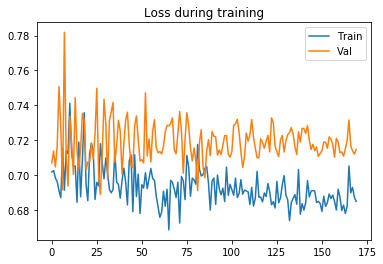

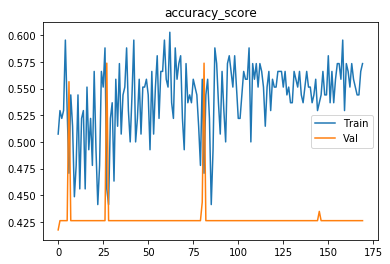

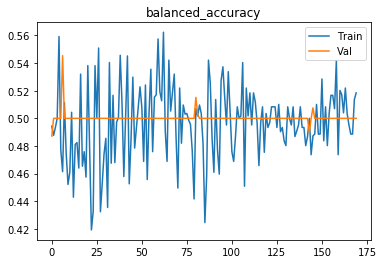

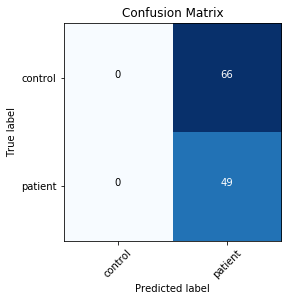

###### Starting inner fold 3
{'model': 'ModelLiu', 'batch_size': 6, 'patience': 12, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.69991
[0,     4] loss: 0.65893
[0,     6] loss: 0.56090
[0,     8] loss: 0.71293
[0,    10] loss: 0.83504
[0,    12] loss: 0.71348
[0,    14] loss: 0.71866
[0,    16] loss: 0.69662
[0,    18] loss: 0.74445
[0,    20] loss: 0.70664
[0,    22] loss: 0.66530
Time elapsed: 0h:0m:2s
train accuracy_score: 57.35 %
train balanced_accuracy: 53.95 %
val accuracy_score: 57.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.689832
[1,     2] loss: 0.81288
[1,     4] loss: 0.80224
[1,     6] loss: 0.77559
[1,     8] loss: 0.64065
[1,    10] loss: 0.66418
[1,    12] loss: 0.80207
[1,    14] loss: 0.69536
[1,    16] loss: 0.68587
[1,    18] loss: 0.68926
[1,    20] loss: 0.70599
[1,    22] loss: 0.62449
Time elapsed: 0h:0m:5s
train accuracy_score: 44.85 %
train balanced_accuracy: 45.04 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss:

[18,     8] loss: 0.69172
[18,    10] loss: 0.64513
[18,    12] loss: 0.67582
[18,    14] loss: 0.65061
[18,    16] loss: 0.67141
[18,    18] loss: 0.74882
[18,    20] loss: 0.64780
[18,    22] loss: 0.67243
Time elapsed: 0h:0m:57s
train accuracy_score: 52.94 %
train balanced_accuracy: 50.18 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.711300
[19,     2] loss: 0.75907
[19,     4] loss: 0.69468
[19,     6] loss: 0.73390
[19,     8] loss: 0.74172
[19,    10] loss: 0.73660
[19,    12] loss: 0.72394
[19,    14] loss: 0.63601
[19,    16] loss: 0.76552
[19,    18] loss: 0.72635
[19,    20] loss: 0.62043
[19,    22] loss: 0.80658
Time elapsed: 0h:1m:0s
train accuracy_score: 50.74 %
train balanced_accuracy: 46.97 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.718524
[20,     2] loss: 0.68617
[20,     4] loss: 0.62214
[20,     6] loss: 0.67326
[20,     8] loss: 0.67508
[20,    10] loss: 0.75805
[20,    12] loss: 0.69830
[20,    14] loss: 0.7

[36,    18] loss: 0.67328
[36,    20] loss: 0.71381
[36,    22] loss: 0.71308
Time elapsed: 0h:1m:52s
train accuracy_score: 50.74 %
train balanced_accuracy: 46.97 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.712219
[37,     2] loss: 0.70472
[37,     4] loss: 0.73077
[37,     6] loss: 0.75390
[37,     8] loss: 0.71106
[37,    10] loss: 0.68090
[37,    12] loss: 0.67667
[37,    14] loss: 0.70085
[37,    16] loss: 0.67345
[37,    18] loss: 0.72478
[37,    20] loss: 0.63602
[37,    22] loss: 0.68596
Time elapsed: 0h:1m:55s
train accuracy_score: 46.32 %
train balanced_accuracy: 42.50 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.719478
[38,     2] loss: 0.73552
[38,     4] loss: 0.72467
[38,     6] loss: 0.66975
[38,     8] loss: 0.72159
[38,    10] loss: 0.65889
[38,    12] loss: 0.68613
[38,    14] loss: 0.70803
[38,    16] loss: 0.64345
[38,    18] loss: 0.70634
[38,    20] loss: 0.63229
[38,    22] loss: 0.64273
Time elapsed: 0h:1m:

Time elapsed: 0h:2m:46s
train accuracy_score: 52.94 %
train balanced_accuracy: 48.60 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.719218
[55,     2] loss: 0.69954
[55,     4] loss: 0.66175
[55,     6] loss: 0.67135
[55,     8] loss: 0.67958
[55,    10] loss: 0.62474
[55,    12] loss: 0.70220
[55,    14] loss: 0.70774
[55,    16] loss: 0.78615
[55,    18] loss: 0.74892
[55,    20] loss: 0.70839
[55,    22] loss: 0.62393
Time elapsed: 0h:2m:49s
train accuracy_score: 57.35 %
train balanced_accuracy: 51.84 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.736214
[56,     2] loss: 0.78295
[56,     4] loss: 0.65142
[56,     6] loss: 0.63543
[56,     8] loss: 0.76235
[56,    10] loss: 0.67322
[56,    12] loss: 0.73975
[56,    14] loss: 0.69011
[56,    16] loss: 0.74259
[56,    18] loss: 0.65586
[56,    20] loss: 0.70962
[56,    22] loss: 0.65356
Time elapsed: 0h:2m:52s
train accuracy_score: 50.00 %
train balanced_accuracy: 44.74 %
val accurac

val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.711208
[73,     2] loss: 0.69407
[73,     4] loss: 0.73006
[73,     6] loss: 0.64656
[73,     8] loss: 0.70427
[73,    10] loss: 0.63556
[73,    12] loss: 0.67558
[73,    14] loss: 0.71553
[73,    16] loss: 0.67783
[73,    18] loss: 0.73985
[73,    20] loss: 0.66583
[73,    22] loss: 0.69435
Time elapsed: 0h:3m:44s
train accuracy_score: 54.41 %
train balanced_accuracy: 49.39 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.717500
[74,     2] loss: 0.66465
[74,     4] loss: 0.73267
[74,     6] loss: 0.66569
[74,     8] loss: 0.67189
[74,    10] loss: 0.78173
[74,    12] loss: 0.65234
[74,    14] loss: 0.73771
[74,    16] loss: 0.68960
[74,    18] loss: 0.67120
[74,    20] loss: 0.70547
[74,    22] loss: 0.63464
Time elapsed: 0h:3m:47s
train accuracy_score: 58.82 %
train balanced_accuracy: 53.33 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.715219
[75,     2] loss: 0.

[91,     2] loss: 0.64785
[91,     4] loss: 0.75137
[91,     6] loss: 0.71609
[91,     8] loss: 0.66625
[91,    10] loss: 0.74747
[91,    12] loss: 0.64322
[91,    14] loss: 0.68034
[91,    16] loss: 0.68556
[91,    18] loss: 0.64917
[91,    20] loss: 0.75567
[91,    22] loss: 0.74283
Time elapsed: 0h:4m:38s
train accuracy_score: 55.15 %
train balanced_accuracy: 49.87 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.717064
[92,     2] loss: 0.71228
[92,     4] loss: 0.68996
[92,     6] loss: 0.64257
[92,     8] loss: 0.68075
[92,    10] loss: 0.69326
[92,    12] loss: 0.68549
[92,    14] loss: 0.68559
[92,    16] loss: 0.65453
[92,    18] loss: 0.69017
[92,    20] loss: 0.72523
[92,    22] loss: 0.73929
Time elapsed: 0h:4m:41s
train accuracy_score: 52.94 %
train balanced_accuracy: 48.07 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.718473
[93,     2] loss: 0.72403
[93,     4] loss: 0.69933
[93,     6] loss: 0.65227
[93,     8] loss: 0.

[109,     2] loss: 0.68673
[109,     4] loss: 0.66106
[109,     6] loss: 0.65514
[109,     8] loss: 0.70888
[109,    10] loss: 0.69213
[109,    12] loss: 0.66898
[109,    14] loss: 0.71752
[109,    16] loss: 0.64920
[109,    18] loss: 0.66568
[109,    20] loss: 0.71077
[109,    22] loss: 0.70987
Time elapsed: 0h:5m:35s
train accuracy_score: 55.88 %
train balanced_accuracy: 50.00 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.719642
[110,     2] loss: 0.68004
[110,     4] loss: 0.65005
[110,     6] loss: 0.73825
[110,     8] loss: 0.62328
[110,    10] loss: 0.66953
[110,    12] loss: 0.69222
[110,    14] loss: 0.68988
[110,    16] loss: 0.72217
[110,    18] loss: 0.70687
[110,    20] loss: 0.71213
[110,    22] loss: 0.73365
Time elapsed: 0h:5m:39s
train accuracy_score: 55.88 %
train balanced_accuracy: 50.00 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.724096
[111,     2] loss: 0.66740
[111,     4] loss: 0.62850
[111,     6] loss: 0.7

val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.722592
[127,     2] loss: 0.66929
[127,     4] loss: 0.68685
[127,     6] loss: 0.66956
[127,     8] loss: 0.66832
[127,    10] loss: 0.64988
[127,    12] loss: 0.70850
[127,    14] loss: 0.72834
[127,    16] loss: 0.67482
[127,    18] loss: 0.70919
[127,    20] loss: 0.71175
[127,    22] loss: 0.73904
Time elapsed: 0h:6m:31s
train accuracy_score: 55.88 %
train balanced_accuracy: 50.18 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.726029
[128,     2] loss: 0.69800
[128,     4] loss: 0.66180
[128,     6] loss: 0.69866
[128,     8] loss: 0.71874
[128,    10] loss: 0.69255
[128,    12] loss: 0.68949
[128,    14] loss: 0.66795
[128,    16] loss: 0.69436
[128,    18] loss: 0.63244
[128,    20] loss: 0.72525
[128,    22] loss: 0.68627
Time elapsed: 0h:6m:34s
train accuracy_score: 55.88 %
train balanced_accuracy: 50.00 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.71779

Time elapsed: 0h:7m:23s
train accuracy_score: 55.88 %
train balanced_accuracy: 50.00 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.719251
[145,     2] loss: 0.68728
[145,     4] loss: 0.66374
[145,     6] loss: 0.72530
[145,     8] loss: 0.64743
[145,    10] loss: 0.66498
[145,    12] loss: 0.71996
[145,    14] loss: 0.66026
[145,    16] loss: 0.68720
[145,    18] loss: 0.64735
[145,    20] loss: 0.70740
[145,    22] loss: 0.73262
Time elapsed: 0h:7m:26s
train accuracy_score: 55.88 %
train balanced_accuracy: 50.00 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.719110
[146,     2] loss: 0.67520
[146,     4] loss: 0.69154
[146,     6] loss: 0.71876
[146,     8] loss: 0.66482
[146,    10] loss: 0.70126
[146,    12] loss: 0.77041
[146,    14] loss: 0.65009
[146,    16] loss: 0.67992
[146,    18] loss: 0.65040
[146,    20] loss: 0.67173
[146,    22] loss: 0.72923
Time elapsed: 0h:7m:29s
train accuracy_score: 55.88 %
train balanced_accurac

[162,    18] loss: 0.65128
[162,    20] loss: 0.67918
[162,    22] loss: 0.63254
Time elapsed: 0h:8m:18s
train accuracy_score: 55.88 %
train balanced_accuracy: 50.00 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.717995
[163,     2] loss: 0.67552
[163,     4] loss: 0.68497
[163,     6] loss: 0.70464
[163,     8] loss: 0.66134
[163,    10] loss: 0.67991
[163,    12] loss: 0.65555
[163,    14] loss: 0.69079
[163,    16] loss: 0.75865
[163,    18] loss: 0.70985
[163,    20] loss: 0.68206
[163,    22] loss: 0.77197
Time elapsed: 0h:8m:21s
train accuracy_score: 55.88 %
train balanced_accuracy: 50.00 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.726742
[164,     2] loss: 0.66680
[164,     4] loss: 0.71463
[164,     6] loss: 0.67275
[164,     8] loss: 0.72669
[164,    10] loss: 0.69937
[164,    12] loss: 0.74762
[164,    14] loss: 0.66920
[164,    16] loss: 0.65283
[164,    18] loss: 0.66755
[164,    20] loss: 0.67671
[164,    22] loss: 0.6

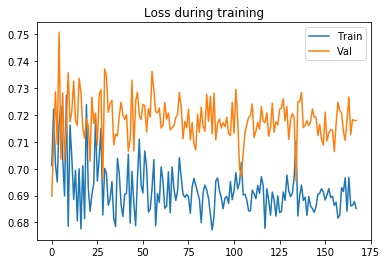

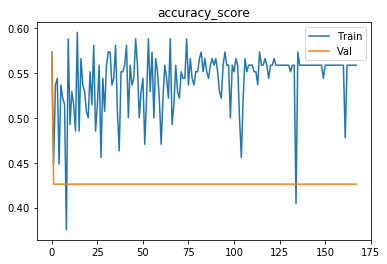

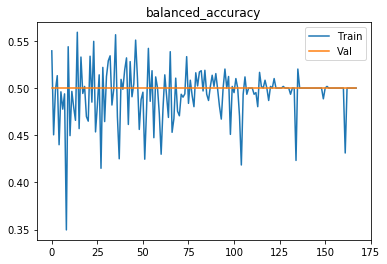

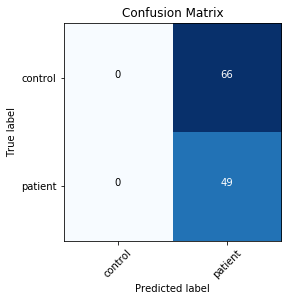

###### Starting inner fold 4
{'model': 'ModelLiu', 'batch_size': 6, 'patience': 12, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.69710
[0,     4] loss: 0.69623
[0,     6] loss: 0.75165
[0,     8] loss: 0.67452
[0,    10] loss: 0.77540
[0,    12] loss: 0.64973
[0,    14] loss: 0.73971
[0,    16] loss: 0.69214
[0,    18] loss: 0.70135
[0,    20] loss: 0.67335
[0,    22] loss: 0.72539
Time elapsed: 0h:0m:2s
train accuracy_score: 47.79 %
train balanced_accuracy: 46.27 %
val accuracy_score: 51.30 %
val balanced_accuracy: 50.22 %
Val loss: 0.694303
[1,     2] loss: 0.66175
[1,     4] loss: 0.71488
[1,     6] loss: 0.66386
[1,     8] loss: 0.66682
[1,    10] loss: 0.65883
[1,    12] loss: 0.84862
[1,    14] loss: 0.60882
[1,    16] loss: 0.72644
[1,    18] loss: 0.74974
[1,    20] loss: 0.70597
[1,    22] loss: 0.76339
Time elapsed: 0h:0m:5s
train accuracy_score: 52.21 %
train balanced_accuracy: 49.34 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss:

[18,     8] loss: 0.62285
[18,    10] loss: 0.75498
[18,    12] loss: 0.78291
[18,    14] loss: 0.63786
[18,    16] loss: 0.74725
[18,    18] loss: 0.66225
[18,    20] loss: 0.69487
[18,    22] loss: 0.63789
Time elapsed: 0h:0m:57s
train accuracy_score: 52.94 %
train balanced_accuracy: 48.42 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.711493
[19,     2] loss: 0.68047
[19,     4] loss: 0.67686
[19,     6] loss: 0.76769
[19,     8] loss: 0.65538
[19,    10] loss: 0.66600
[19,    12] loss: 0.62004
[19,    14] loss: 0.69914
[19,    16] loss: 0.70533
[19,    18] loss: 0.72293
[19,    20] loss: 0.61553
[19,    22] loss: 0.68111
Time elapsed: 0h:1m:0s
train accuracy_score: 56.62 %
train balanced_accuracy: 52.24 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.732450
[20,     2] loss: 0.60955
[20,     4] loss: 0.69109
[20,     6] loss: 0.68294
[20,     8] loss: 0.66995
[20,    10] loss: 0.70840
[20,    12] loss: 0.73192
[20,    14] loss: 0.6

[36,    20] loss: 0.64216
[36,    22] loss: 0.72526
Time elapsed: 0h:1m:52s
train accuracy_score: 50.00 %
train balanced_accuracy: 48.77 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.703324
[37,     2] loss: 0.63420
[37,     4] loss: 0.71309
[37,     6] loss: 0.74714
[37,     8] loss: 0.70391
[37,    10] loss: 0.69285
[37,    12] loss: 0.63674
[37,    14] loss: 0.64164
[37,    16] loss: 0.78795
[37,    18] loss: 0.64197
[37,    20] loss: 0.66749
[37,    22] loss: 0.63519
Time elapsed: 0h:1m:55s
train accuracy_score: 58.82 %
train balanced_accuracy: 55.26 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.719703
[38,     2] loss: 0.66948
[38,     4] loss: 0.66915
[38,     6] loss: 0.72444
[38,     8] loss: 0.67267
[38,    10] loss: 0.66309
[38,    12] loss: 0.71770
[38,    14] loss: 0.67477
[38,    16] loss: 0.65899
[38,    18] loss: 0.65903
[38,    20] loss: 0.71839
[38,    22] loss: 0.68460
Time elapsed: 0h:1m:58s
train accuracy_score: 

val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.722661
[55,     2] loss: 0.63593
[55,     4] loss: 0.63127
[55,     6] loss: 0.72581
[55,     8] loss: 0.66831
[55,    10] loss: 0.67756
[55,    12] loss: 0.78187
[55,    14] loss: 0.63697
[55,    16] loss: 0.74892
[55,    18] loss: 0.67473
[55,    20] loss: 0.61736
[55,    22] loss: 0.73708
Time elapsed: 0h:2m:51s
train accuracy_score: 55.88 %
train balanced_accuracy: 50.18 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.730372
[56,     2] loss: 0.67166
[56,     4] loss: 0.79192
[56,     6] loss: 0.61581
[56,     8] loss: 0.73641
[56,    10] loss: 0.68619
[56,    12] loss: 0.75198
[56,    14] loss: 0.62495
[56,    16] loss: 0.61773
[56,    18] loss: 0.67728
[56,    20] loss: 0.57152
[56,    22] loss: 0.72336
Time elapsed: 0h:2m:54s
train accuracy_score: 54.41 %
train balanced_accuracy: 49.39 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.718656
[57,     2] loss: 0.

[73,     8] loss: 0.70049
[73,    10] loss: 0.65990
[73,    12] loss: 0.69404
[73,    14] loss: 0.64735
[73,    16] loss: 0.64989
[73,    18] loss: 0.70388
[73,    20] loss: 0.68860
[73,    22] loss: 0.68682
Time elapsed: 0h:3m:46s
train accuracy_score: 57.35 %
train balanced_accuracy: 51.84 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.718507
[74,     2] loss: 0.66562
[74,     4] loss: 0.67851
[74,     6] loss: 0.71494
[74,     8] loss: 0.68082
[74,    10] loss: 0.68723
[74,    12] loss: 0.71750
[74,    14] loss: 0.70859
[74,    16] loss: 0.74756
[74,    18] loss: 0.64227
[74,    20] loss: 0.67643
[74,    22] loss: 0.69674
Time elapsed: 0h:3m:49s
train accuracy_score: 52.94 %
train balanced_accuracy: 47.54 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.710449
[75,     2] loss: 0.68893
[75,     4] loss: 0.61321
[75,     6] loss: 0.67637
[75,     8] loss: 0.68038
[75,    10] loss: 0.70868
[75,    12] loss: 0.74108
[75,    14] loss: 0.

[91,    14] loss: 0.69382
[91,    16] loss: 0.64720
[91,    18] loss: 0.69737
[91,    20] loss: 0.65488
[91,    22] loss: 0.64949
Time elapsed: 0h:4m:41s
train accuracy_score: 55.15 %
train balanced_accuracy: 49.52 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.713752
[92,     2] loss: 0.67818
[92,     4] loss: 0.70922
[92,     6] loss: 0.69522
[92,     8] loss: 0.67491
[92,    10] loss: 0.67116
[92,    12] loss: 0.67949
[92,    14] loss: 0.69488
[92,    16] loss: 0.75009
[92,    18] loss: 0.66238
[92,    20] loss: 0.72205
[92,    22] loss: 0.71569
Time elapsed: 0h:4m:44s
train accuracy_score: 55.88 %
train balanced_accuracy: 50.00 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.721996
[93,     2] loss: 0.67599
[93,     4] loss: 0.64302
[93,     6] loss: 0.65621
[93,     8] loss: 0.69457
[93,    10] loss: 0.65334
[93,    12] loss: 0.70216
[93,    14] loss: 0.75023
[93,    16] loss: 0.66194
[93,    18] loss: 0.73362
[93,    20] loss: 0.

[109,    14] loss: 0.72480
[109,    16] loss: 0.68417
[109,    18] loss: 0.71036
[109,    20] loss: 0.68556
[109,    22] loss: 0.68090
Time elapsed: 0h:5m:36s
train accuracy_score: 55.88 %
train balanced_accuracy: 50.00 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.715641
[110,     2] loss: 0.71148
[110,     4] loss: 0.69726
[110,     6] loss: 0.66126
[110,     8] loss: 0.68898
[110,    10] loss: 0.67438
[110,    12] loss: 0.66759
[110,    14] loss: 0.72009
[110,    16] loss: 0.71781
[110,    18] loss: 0.63084
[110,    20] loss: 0.64488
[110,    22] loss: 0.75983
Time elapsed: 0h:5m:40s
train accuracy_score: 55.15 %
train balanced_accuracy: 49.34 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.723548
[111,     2] loss: 0.64581
[111,     4] loss: 0.65245
[111,     6] loss: 0.74035
[111,     8] loss: 0.64576
[111,    10] loss: 0.67653
[111,    12] loss: 0.65919
[111,    14] loss: 0.64359
[111,    16] loss: 0.73767
[111,    18] loss: 0.7

[127,     8] loss: 0.63503
[127,    10] loss: 0.68969
[127,    12] loss: 0.68802
[127,    14] loss: 0.67030
[127,    16] loss: 0.69764
[127,    18] loss: 0.70414
[127,    20] loss: 0.70413
[127,    22] loss: 0.69501
Time elapsed: 0h:6m:33s
train accuracy_score: 55.88 %
train balanced_accuracy: 50.00 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.718579
[128,     2] loss: 0.70636
[128,     4] loss: 0.73871
[128,     6] loss: 0.67608
[128,     8] loss: 0.68965
[128,    10] loss: 0.66033
[128,    12] loss: 0.67585
[128,    14] loss: 0.64604
[128,    16] loss: 0.68804
[128,    18] loss: 0.68990
[128,    20] loss: 0.65460
[128,    22] loss: 0.72240
Time elapsed: 0h:6m:36s
train accuracy_score: 55.88 %
train balanced_accuracy: 50.00 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.716110
[129,     2] loss: 0.65560
[129,     4] loss: 0.68912
[129,     6] loss: 0.69061
[129,     8] loss: 0.70309
[129,    10] loss: 0.69322
[129,    12] loss: 0.6

[145,     2] loss: 0.75337
[145,     4] loss: 0.68221
[145,     6] loss: 0.71664
[145,     8] loss: 0.68041
[145,    10] loss: 0.67494
[145,    12] loss: 0.66940
[145,    14] loss: 0.69607
[145,    16] loss: 0.66254
[145,    18] loss: 0.68999
[145,    20] loss: 0.66871
[145,    22] loss: 0.65585
Time elapsed: 0h:7m:29s
train accuracy_score: 55.88 %
train balanced_accuracy: 50.00 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.713925
[146,     2] loss: 0.71454
[146,     4] loss: 0.72820
[146,     6] loss: 0.76413
[146,     8] loss: 0.66513
[146,    10] loss: 0.63475
[146,    12] loss: 0.72520
[146,    14] loss: 0.69566
[146,    16] loss: 0.67912
[146,    18] loss: 0.63712
[146,    20] loss: 0.65083
[146,    22] loss: 0.67493
Time elapsed: 0h:7m:32s
train accuracy_score: 55.88 %
train balanced_accuracy: 50.00 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.717231
[147,     2] loss: 0.65911
[147,     4] loss: 0.60516
[147,     6] loss: 0.6

val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.716121
[163,     2] loss: 0.65694
[163,     4] loss: 0.69637
[163,     6] loss: 0.66460
[163,     8] loss: 0.69247
[163,    10] loss: 0.66111
[163,    12] loss: 0.69237
[163,    14] loss: 0.70634
[163,    16] loss: 0.71354
[163,    18] loss: 0.67386
[163,    20] loss: 0.69223
[163,    22] loss: 0.70802
Time elapsed: 0h:8m:24s
train accuracy_score: 55.88 %
train balanced_accuracy: 50.00 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.718702
[164,     2] loss: 0.67585
[164,     4] loss: 0.66194
[164,     6] loss: 0.70944
[164,     8] loss: 0.64929
[164,    10] loss: 0.75382
[164,    12] loss: 0.68218
[164,    14] loss: 0.67301
[164,    16] loss: 0.66721
[164,    18] loss: 0.70755
[164,    20] loss: 0.73351
[164,    22] loss: 0.69653
Time elapsed: 0h:8m:27s
train accuracy_score: 55.88 %
train balanced_accuracy: 50.00 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.71670

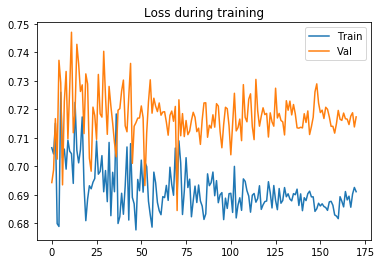

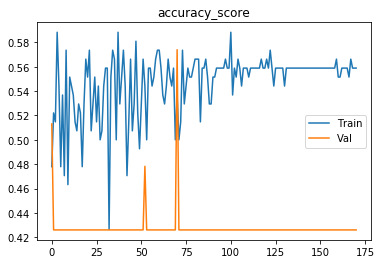

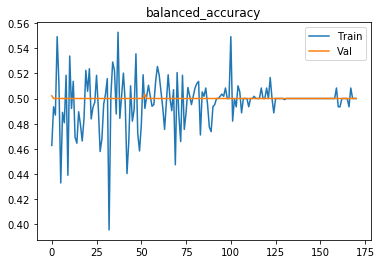

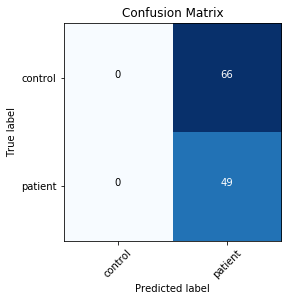

Finished outer fold.
{'final_acc': 0.5, 'best_acc': 0.5, 'final_iter': 177, 'best_iter': 1, 'params': {'model': 'ModelLiu', 'batch_size': 6, 'patience': 16, 'lr': 0.001}, 'inner_fold_idx': 0}
###### Starting outer fold 6
# of patients 112, # of healthy controls 132
141
103
###### Starting inner fold 0
{'model': 'ModelLiu', 'batch_size': 12, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.70915
[0,     4] loss: 0.69889
[0,     6] loss: 0.74439
[0,     8] loss: 0.68575
[0,    10] loss: 0.72691
Time elapsed: 0h:0m:2s
train accuracy_score: 46.81 %
train balanced_accuracy: 46.38 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.721970
[1,     2] loss: 0.69268
[1,     4] loss: 0.69105
[1,     6] loss: 0.68169
[1,     8] loss: 0.71245
[1,    10] loss: 0.69705
Time elapsed: 0h:0m:5s
train accuracy_score: 52.48 %
train balanced_accuracy: 52.11 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.708490
[2,     2] loss

val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.701954
[27,     2] loss: 0.66962
[27,     4] loss: 0.71450
[27,     6] loss: 0.66665
[27,     8] loss: 0.70309
[27,    10] loss: 0.70398
Time elapsed: 0h:1m:26s
train accuracy_score: 50.35 %
train balanced_accuracy: 50.15 %
val accuracy_score: 61.17 %
val balanced_accuracy: 50.00 %
Val loss: 0.689701
[28,     2] loss: 0.68871
[28,     4] loss: 0.68957
[28,     6] loss: 0.68801
[28,     8] loss: 0.73152
[28,    10] loss: 0.71973
Time elapsed: 0h:1m:29s
train accuracy_score: 46.10 %
train balanced_accuracy: 45.80 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.700179
[29,     2] loss: 0.72063
[29,     4] loss: 0.70917
[29,     6] loss: 0.67915
[29,     8] loss: 0.68898
[29,    10] loss: 0.71237
Time elapsed: 0h:1m:32s
train accuracy_score: 48.23 %
train balanced_accuracy: 48.55 %
val accuracy_score: 61.17 %
val balanced_accuracy: 50.00 %
Val loss: 0.679810
[30,     2] loss: 0.67638
[30,     4]

val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.706118
[55,     2] loss: 0.69867
[55,     4] loss: 0.69918
[55,     6] loss: 0.69554
[55,     8] loss: 0.68923
[55,    10] loss: 0.70046
Time elapsed: 0h:2m:52s
train accuracy_score: 54.61 %
train balanced_accuracy: 53.99 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.712688
[56,     2] loss: 0.67158
[56,     4] loss: 0.71819
[56,     6] loss: 0.71805
[56,     8] loss: 0.72944
[56,    10] loss: 0.69828
Time elapsed: 0h:2m:55s
train accuracy_score: 51.06 %
train balanced_accuracy: 50.33 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.701677
[57,     2] loss: 0.72289
[57,     4] loss: 0.67847
[57,     6] loss: 0.65832
[57,     8] loss: 0.69815
[57,    10] loss: 0.68401
Time elapsed: 0h:2m:58s
train accuracy_score: 51.06 %
train balanced_accuracy: 51.15 %
val accuracy_score: 58.25 %
val balanced_accuracy: 56.29 %
Val loss: 0.692458
[58,     2] loss: 0.68979
[58,     4]

val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.695528
[83,     2] loss: 0.69735
[83,     4] loss: 0.69977
[83,     6] loss: 0.71851
[83,     8] loss: 0.68476
[83,    10] loss: 0.67794
Time elapsed: 0h:4m:19s
train accuracy_score: 47.52 %
train balanced_accuracy: 47.43 %
val accuracy_score: 45.63 %
val balanced_accuracy: 53.73 %
Val loss: 0.693151
[84,     2] loss: 0.69240
[84,     4] loss: 0.67076
[84,     6] loss: 0.70195
[84,     8] loss: 0.69280
[84,    10] loss: 0.70822
Time elapsed: 0h:4m:22s
train accuracy_score: 52.48 %
train balanced_accuracy: 52.42 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.695662
[85,     2] loss: 0.69468
[85,     4] loss: 0.72378
[85,     6] loss: 0.72702
[85,     8] loss: 0.66245
[85,    10] loss: 0.67867
Time elapsed: 0h:4m:25s
train accuracy_score: 48.94 %
train balanced_accuracy: 48.64 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.700479
[86,     2] loss: 0.70042
[86,     4]

Time elapsed: 0h:5m:41s
train accuracy_score: 51.06 %
train balanced_accuracy: 50.30 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.708588
[111,     2] loss: 0.70582
[111,     4] loss: 0.68845
[111,     6] loss: 0.67835
[111,     8] loss: 0.66300
[111,    10] loss: 0.70915
Time elapsed: 0h:5m:44s
train accuracy_score: 51.06 %
train balanced_accuracy: 50.36 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.703556
[112,     2] loss: 0.68018
[112,     4] loss: 0.70286
[112,     6] loss: 0.69721
[112,     8] loss: 0.69043
[112,    10] loss: 0.69428
Time elapsed: 0h:5m:48s
train accuracy_score: 50.35 %
train balanced_accuracy: 50.18 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.693863
[113,     2] loss: 0.69628
[113,     4] loss: 0.69571
[113,     6] loss: 0.69071
[113,     8] loss: 0.69282
[113,    10] loss: 0.72080
Time elapsed: 0h:5m:51s
train accuracy_score: 46.81 %
train balanced_accuracy: 46.83 %
val accuracy_

[138,     2] loss: 0.70584
[138,     4] loss: 0.70591
[138,     6] loss: 0.67889
[138,     8] loss: 0.70883
[138,    10] loss: 0.70417
Time elapsed: 0h:7m:8s
train accuracy_score: 46.10 %
train balanced_accuracy: 45.65 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.700587
[139,     2] loss: 0.67553
[139,     4] loss: 0.68478
[139,     6] loss: 0.69456
[139,     8] loss: 0.68133
[139,    10] loss: 0.67118
Time elapsed: 0h:7m:11s
train accuracy_score: 58.87 %
train balanced_accuracy: 58.30 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.699782
[140,     2] loss: 0.69926
[140,     4] loss: 0.70481
[140,     6] loss: 0.69619
[140,     8] loss: 0.70654
[140,    10] loss: 0.70369
Time elapsed: 0h:7m:14s
train accuracy_score: 43.97 %
train balanced_accuracy: 43.39 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.699667
[141,     2] loss: 0.69827
[141,     4] loss: 0.72452
[141,     6] loss: 0.70102
[141,     8] loss: 0

Time elapsed: 0h:8m:32s
train accuracy_score: 48.23 %
train balanced_accuracy: 47.77 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.703863
[166,     2] loss: 0.68262
[166,     4] loss: 0.69387
[166,     6] loss: 0.68531
[166,     8] loss: 0.73941
[166,    10] loss: 0.68341
Time elapsed: 0h:8m:35s
train accuracy_score: 52.48 %
train balanced_accuracy: 51.63 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.702157
[167,     2] loss: 0.69170
[167,     4] loss: 0.68377
[167,     6] loss: 0.68505
[167,     8] loss: 0.68359
[167,    10] loss: 0.68681
Time elapsed: 0h:8m:38s
train accuracy_score: 57.45 %
train balanced_accuracy: 57.00 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.695328
[168,     2] loss: 0.69096
[168,     4] loss: 0.68486
[168,     6] loss: 0.70448
[168,     8] loss: 0.68565
[168,    10] loss: 0.69991
Time elapsed: 0h:8m:41s
train accuracy_score: 56.74 %
train balanced_accuracy: 56.88 %
val accuracy_

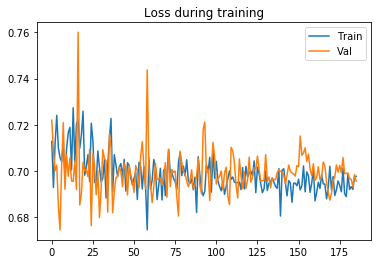

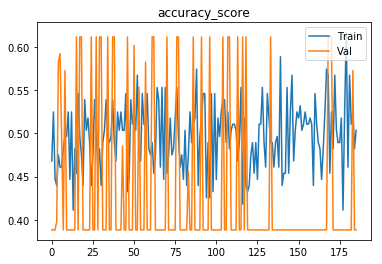

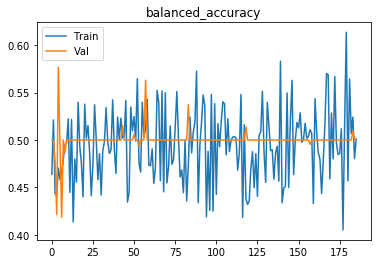

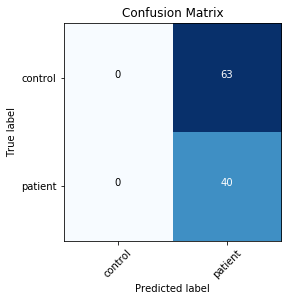

###### Starting inner fold 1
{'model': 'ModelLiu', 'batch_size': 4, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.73114
[0,     4] loss: 0.66089
[0,     6] loss: 0.72072
[0,     8] loss: 0.71626
[0,    10] loss: 0.65943
[0,    12] loss: 0.66304
[0,    14] loss: 0.63828
[0,    16] loss: 0.76969
[0,    18] loss: 0.64203
[0,    20] loss: 0.85038
[0,    22] loss: 0.75664
[0,    24] loss: 0.69426
[0,    26] loss: 0.67140
[0,    28] loss: 0.66404
[0,    30] loss: 0.74169
[0,    32] loss: 0.68602
[0,    34] loss: 0.64771
Time elapsed: 0h:0m:2s
train accuracy_score: 53.19 %
train balanced_accuracy: 52.75 %
val accuracy_score: 63.11 %
val balanced_accuracy: 55.69 %
Val loss: 0.661646
[1,     2] loss: 0.71450
[1,     4] loss: 0.68044
[1,     6] loss: 0.67660
[1,     8] loss: 0.83516
[1,    10] loss: 0.71043
[1,    12] loss: 0.72763
[1,    14] loss: 0.79334
[1,    16] loss: 0.62341
[1,    18] loss: 0.69973
[1,    20] loss: 0.68706
[1,    22] loss: 0.75408
[1, 

[13,    34] loss: 0.80203
Time elapsed: 0h:0m:41s
train accuracy_score: 56.74 %
train balanced_accuracy: 56.64 %
val accuracy_score: 50.49 %
val balanced_accuracy: 54.05 %
Val loss: 0.695184
[14,     2] loss: 0.67598
[14,     4] loss: 0.74178
[14,     6] loss: 0.67241
[14,     8] loss: 0.64879
[14,    10] loss: 0.69710
[14,    12] loss: 0.67103
[14,    14] loss: 0.71548
[14,    16] loss: 0.73070
[14,    18] loss: 0.82200
[14,    20] loss: 0.62582
[14,    22] loss: 0.85480
[14,    24] loss: 0.70604
[14,    26] loss: 0.70387
[14,    28] loss: 0.64587
[14,    30] loss: 0.67332
[14,    32] loss: 0.60546
[14,    34] loss: 0.69982
Time elapsed: 0h:0m:44s
train accuracy_score: 56.03 %
train balanced_accuracy: 56.07 %
val accuracy_score: 50.49 %
val balanced_accuracy: 45.38 %
Val loss: 0.695566
[15,     2] loss: 0.72474
[15,     4] loss: 0.64422
[15,     6] loss: 0.74662
[15,     8] loss: 0.61456
[15,    10] loss: 0.90403
[15,    12] loss: 0.75633
[15,    14] loss: 0.80863
[15,    16] loss: 0.

[27,    16] loss: 0.70069
[27,    18] loss: 0.69297
[27,    20] loss: 0.70676
[27,    22] loss: 0.70399
[27,    24] loss: 0.66438
[27,    26] loss: 0.64802
[27,    28] loss: 0.76451
[27,    30] loss: 0.74309
[27,    32] loss: 0.69971
[27,    34] loss: 0.61191
Time elapsed: 0h:1m:23s
train accuracy_score: 56.74 %
train balanced_accuracy: 56.64 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.708475
[28,     2] loss: 0.66912
[28,     4] loss: 0.66322
[28,     6] loss: 0.68751
[28,     8] loss: 0.73913
[28,    10] loss: 0.64862
[28,    12] loss: 0.66440
[28,    14] loss: 0.71527
[28,    16] loss: 0.71040
[28,    18] loss: 0.76589
[28,    20] loss: 0.75439
[28,    22] loss: 0.71177
[28,    24] loss: 0.74263
[28,    26] loss: 0.71636
[28,    28] loss: 0.67735
[28,    30] loss: 0.70051
[28,    32] loss: 0.65896
[28,    34] loss: 0.71984
Time elapsed: 0h:1m:26s
train accuracy_score: 47.52 %
train balanced_accuracy: 47.22 %
val accuracy_score: 38.83 %
val balanced_accur

val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.694059
[41,     2] loss: 0.73293
[41,     4] loss: 0.68621
[41,     6] loss: 0.71020
[41,     8] loss: 0.66853
[41,    10] loss: 0.73637
[41,    12] loss: 0.71354
[41,    14] loss: 0.67162
[41,    16] loss: 0.73129
[41,    18] loss: 0.70950
[41,    20] loss: 0.65694
[41,    22] loss: 0.68722
[41,    24] loss: 0.69818
[41,    26] loss: 0.68602
[41,    28] loss: 0.68761
[41,    30] loss: 0.72944
[41,    32] loss: 0.70169
[41,    34] loss: 0.73068
Time elapsed: 0h:2m:5s
train accuracy_score: 46.81 %
train balanced_accuracy: 46.74 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.696901
[42,     2] loss: 0.73284
[42,     4] loss: 0.68661
[42,     6] loss: 0.71468
[42,     8] loss: 0.67822
[42,    10] loss: 0.76416
[42,    12] loss: 0.66576
[42,    14] loss: 0.70208
[42,    16] loss: 0.65423
[42,    18] loss: 0.66975
[42,    20] loss: 0.71669
[42,    22] loss: 0.69035
[42,    24] loss: 0.69562
[42,

[54,    26] loss: 0.68182
[54,    28] loss: 0.66050
[54,    30] loss: 0.75132
[54,    32] loss: 0.71868
[54,    34] loss: 0.72950
Time elapsed: 0h:2m:45s
train accuracy_score: 51.06 %
train balanced_accuracy: 51.03 %
val accuracy_score: 61.17 %
val balanced_accuracy: 50.00 %
Val loss: 0.690093
[55,     2] loss: 0.72060
[55,     4] loss: 0.71099
[55,     6] loss: 0.70812
[55,     8] loss: 0.66066
[55,    10] loss: 0.67844
[55,    12] loss: 0.68851
[55,    14] loss: 0.69564
[55,    16] loss: 0.75044
[55,    18] loss: 0.67650
[55,    20] loss: 0.70292
[55,    22] loss: 0.69882
[55,    24] loss: 0.64790
[55,    26] loss: 0.66314
[55,    28] loss: 0.69620
[55,    30] loss: 0.71640
[55,    32] loss: 0.74429
[55,    34] loss: 0.73121
Time elapsed: 0h:2m:48s
train accuracy_score: 46.81 %
train balanced_accuracy: 46.50 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.700063
[56,     2] loss: 0.67093
[56,     4] loss: 0.70765
[56,     6] loss: 0.67091
[56,     8] loss: 0.

[68,     8] loss: 0.69085
[68,    10] loss: 0.70816
[68,    12] loss: 0.70485
[68,    14] loss: 0.68494
[68,    16] loss: 0.67080
[68,    18] loss: 0.71433
[68,    20] loss: 0.74149
[68,    22] loss: 0.69603
[68,    24] loss: 0.68866
[68,    26] loss: 0.73529
[68,    28] loss: 0.69674
[68,    30] loss: 0.69450
[68,    32] loss: 0.69747
[68,    34] loss: 0.71320
Time elapsed: 0h:3m:27s
train accuracy_score: 49.65 %
train balanced_accuracy: 49.00 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.697616
[69,     2] loss: 0.70520
[69,     4] loss: 0.62715
[69,     6] loss: 0.70070
[69,     8] loss: 0.70263
[69,    10] loss: 0.70634
[69,    12] loss: 0.70525
[69,    14] loss: 0.66070
[69,    16] loss: 0.69904
[69,    18] loss: 0.70516
[69,    20] loss: 0.68785
[69,    22] loss: 0.70870
[69,    24] loss: 0.68725
[69,    26] loss: 0.69449
[69,    28] loss: 0.67960
[69,    30] loss: 0.68025
[69,    32] loss: 0.69138
[69,    34] loss: 0.70313
Time elapsed: 0h:3m:30s
train

Time elapsed: 0h:4m:6s
train accuracy_score: 53.90 %
train balanced_accuracy: 53.41 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.702862
[82,     2] loss: 0.70175
[82,     4] loss: 0.72181
[82,     6] loss: 0.74874
[82,     8] loss: 0.67177
[82,    10] loss: 0.68764
[82,    12] loss: 0.66198
[82,    14] loss: 0.72777
[82,    16] loss: 0.69690
[82,    18] loss: 0.67363
[82,    20] loss: 0.70649
[82,    22] loss: 0.70035
[82,    24] loss: 0.66766
[82,    26] loss: 0.70599
[82,    28] loss: 0.67418
[82,    30] loss: 0.69042
[82,    32] loss: 0.69809
[82,    34] loss: 0.68142
Time elapsed: 0h:4m:9s
train accuracy_score: 50.35 %
train balanced_accuracy: 49.64 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.701166
[83,     2] loss: 0.67008
[83,     4] loss: 0.70418
[83,     6] loss: 0.73539
[83,     8] loss: 0.67345
[83,    10] loss: 0.67476
[83,    12] loss: 0.65576
[83,    14] loss: 0.68935
[83,    16] loss: 0.74278
[83,    18] loss: 0.75

[95,    16] loss: 0.68351
[95,    18] loss: 0.71037
[95,    20] loss: 0.66529
[95,    22] loss: 0.66404
[95,    24] loss: 0.70634
[95,    26] loss: 0.67495
[95,    28] loss: 0.68954
[95,    30] loss: 0.68288
[95,    32] loss: 0.71867
[95,    34] loss: 0.71097
Time elapsed: 0h:4m:48s
train accuracy_score: 55.32 %
train balanced_accuracy: 54.68 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.703461
[96,     2] loss: 0.69593
[96,     4] loss: 0.68804
[96,     6] loss: 0.71303
[96,     8] loss: 0.69947
[96,    10] loss: 0.74938
[96,    12] loss: 0.70990
[96,    14] loss: 0.70992
[96,    16] loss: 0.69495
[96,    18] loss: 0.68986
[96,    20] loss: 0.68273
[96,    22] loss: 0.68119
[96,    24] loss: 0.66077
[96,    26] loss: 0.70842
[96,    28] loss: 0.65887
[96,    30] loss: 0.70002
[96,    32] loss: 0.69174
[96,    34] loss: 0.69115
Time elapsed: 0h:4m:51s
train accuracy_score: 51.06 %
train balanced_accuracy: 50.48 %
val accuracy_score: 38.83 %
val balanced_accur

[108,    34] loss: 0.69783
Time elapsed: 0h:5m:28s
train accuracy_score: 48.94 %
train balanced_accuracy: 48.58 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.694037
[109,     2] loss: 0.70503
[109,     4] loss: 0.68802
[109,     6] loss: 0.69741
[109,     8] loss: 0.69096
[109,    10] loss: 0.68967
[109,    12] loss: 0.70709
[109,    14] loss: 0.69761
[109,    16] loss: 0.67537
[109,    18] loss: 0.69925
[109,    20] loss: 0.71424
[109,    22] loss: 0.69500
[109,    24] loss: 0.70666
[109,    26] loss: 0.72187
[109,    28] loss: 0.68421
[109,    30] loss: 0.68304
[109,    32] loss: 0.68937
[109,    34] loss: 0.68051
Time elapsed: 0h:5m:31s
train accuracy_score: 43.97 %
train balanced_accuracy: 43.51 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.697036
[110,     2] loss: 0.68524
[110,     4] loss: 0.68110
[110,     6] loss: 0.68111
[110,     8] loss: 0.70724
[110,    10] loss: 0.68312
[110,    12] loss: 0.69618
[110,    14] loss: 0.6

val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.702290
[122,     2] loss: 0.66476
[122,     4] loss: 0.71194
[122,     6] loss: 0.70211
[122,     8] loss: 0.71445
[122,    10] loss: 0.71203
[122,    12] loss: 0.69494
[122,    14] loss: 0.70600
[122,    16] loss: 0.69915
[122,    18] loss: 0.69812
[122,    20] loss: 0.65988
[122,    22] loss: 0.67240
[122,    24] loss: 0.75622
[122,    26] loss: 0.73000
[122,    28] loss: 0.70921
[122,    30] loss: 0.67941
[122,    32] loss: 0.70587
[122,    34] loss: 0.70361
Time elapsed: 0h:6m:10s
train accuracy_score: 51.06 %
train balanced_accuracy: 50.06 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.700796
[123,     2] loss: 0.69935
[123,     4] loss: 0.72851
[123,     6] loss: 0.69979
[123,     8] loss: 0.68813
[123,    10] loss: 0.68955
[123,    12] loss: 0.69032
[123,    14] loss: 0.69348
[123,    16] loss: 0.69860
[123,    18] loss: 0.69679
[123,    20] loss: 0.70764
[123,    22] loss: 0.69572
[

[135,    10] loss: 0.70577
[135,    12] loss: 0.68740
[135,    14] loss: 0.70707
[135,    16] loss: 0.70178
[135,    18] loss: 0.68742
[135,    20] loss: 0.73834
[135,    22] loss: 0.68930
[135,    24] loss: 0.69246
[135,    26] loss: 0.69277
[135,    28] loss: 0.68162
[135,    30] loss: 0.67982
[135,    32] loss: 0.68639
[135,    34] loss: 0.70395
Time elapsed: 0h:6m:48s
train accuracy_score: 46.81 %
train balanced_accuracy: 47.22 %
val accuracy_score: 61.17 %
val balanced_accuracy: 50.00 %
Val loss: 0.692303
[136,     2] loss: 0.70491
[136,     4] loss: 0.68547
[136,     6] loss: 0.67390
[136,     8] loss: 0.68545
[136,    10] loss: 0.70129
[136,    12] loss: 0.70461
[136,    14] loss: 0.72945
[136,    16] loss: 0.69563
[136,    18] loss: 0.70103
[136,    20] loss: 0.67822
[136,    22] loss: 0.68092
[136,    24] loss: 0.69854
[136,    26] loss: 0.71469
[136,    28] loss: 0.68934
[136,    30] loss: 0.71679
[136,    32] loss: 0.70688
[136,    34] loss: 0.67525
Time elapsed: 0h:6m:52s
t

[148,    24] loss: 0.69277
[148,    26] loss: 0.69863
[148,    28] loss: 0.69080
[148,    30] loss: 0.72079
[148,    32] loss: 0.71300
[148,    34] loss: 0.68291
Time elapsed: 0h:7m:29s
train accuracy_score: 43.97 %
train balanced_accuracy: 43.42 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.700155
[149,     2] loss: 0.67937
[149,     4] loss: 0.67963
[149,     6] loss: 0.69353
[149,     8] loss: 0.67811
[149,    10] loss: 0.68740
[149,    12] loss: 0.69678
[149,    14] loss: 0.68352
[149,    16] loss: 0.71806
[149,    18] loss: 0.71627
[149,    20] loss: 0.70696
[149,    22] loss: 0.70463
[149,    24] loss: 0.70978
[149,    26] loss: 0.68020
[149,    28] loss: 0.73873
[149,    30] loss: 0.68175
[149,    32] loss: 0.71364
[149,    34] loss: 0.74314
Time elapsed: 0h:7m:32s
train accuracy_score: 50.35 %
train balanced_accuracy: 49.31 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.705130
[150,     2] loss: 0.68031
[150,     4] loss: 0.6

Time elapsed: 0h:8m:8s
train accuracy_score: 51.06 %
train balanced_accuracy: 50.15 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.704696
[162,     2] loss: 0.68694
[162,     4] loss: 0.72190
[162,     6] loss: 0.69883
[162,     8] loss: 0.68559
[162,    10] loss: 0.68592
[162,    12] loss: 0.69238
[162,    14] loss: 0.69262
[162,    16] loss: 0.70085
[162,    18] loss: 0.69100
[162,    20] loss: 0.68659
[162,    22] loss: 0.69838
[162,    24] loss: 0.71479
[162,    26] loss: 0.69448
[162,    28] loss: 0.69791
[162,    30] loss: 0.68653
[162,    32] loss: 0.67437
[162,    34] loss: 0.71014
Time elapsed: 0h:8m:11s
train accuracy_score: 48.23 %
train balanced_accuracy: 47.43 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.699230
[163,     2] loss: 0.68932
[163,     4] loss: 0.69863
[163,     6] loss: 0.69494
[163,     8] loss: 0.67891
[163,    10] loss: 0.68368
[163,    12] loss: 0.69210
[163,    14] loss: 0.69402
[163,    16] loss: 0.69

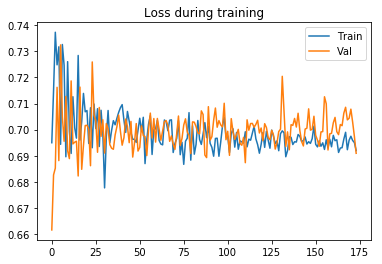

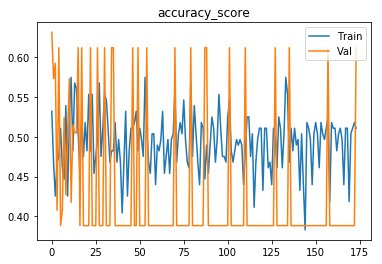

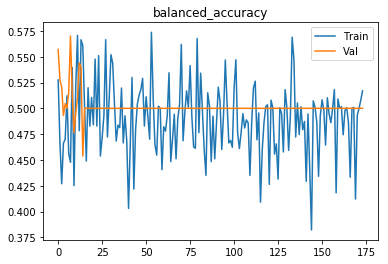

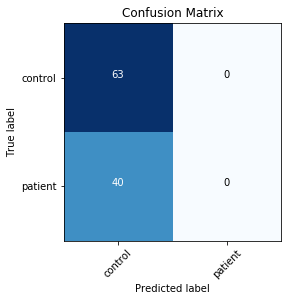

###### Starting inner fold 2
{'model': 'ModelLiu', 'batch_size': 4, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.61009
[0,     4] loss: 0.90563
[0,     6] loss: 0.67094
[0,     8] loss: 0.67046
[0,    10] loss: 0.67802
[0,    12] loss: 0.71889
[0,    14] loss: 0.77111
[0,    16] loss: 0.71492
[0,    18] loss: 0.74258
[0,    20] loss: 0.68024
[0,    22] loss: 0.70925
[0,    24] loss: 0.66928
[0,    26] loss: 0.66538
[0,    28] loss: 0.71855
[0,    30] loss: 0.76644
[0,    32] loss: 0.71093
[0,    34] loss: 0.71524
Time elapsed: 0h:0m:2s
train accuracy_score: 44.68 %
train balanced_accuracy: 44.96 %
val accuracy_score: 39.81 %
val balanced_accuracy: 50.79 %
Val loss: 0.708639
[1,     2] loss: 0.70026
[1,     4] loss: 0.70948
[1,     6] loss: 0.72933
[1,     8] loss: 0.66940
[1,    10] loss: 0.74495
[1,    12] loss: 0.72936
[1,    14] loss: 0.71480
[1,    16] loss: 0.68647
[1,    18] loss: 0.71456
[1,    20] loss: 0.66004
[1,    22] loss: 0.70786
[1, 

[13,    30] loss: 0.72570
[13,    32] loss: 0.68576
[13,    34] loss: 0.64549
Time elapsed: 0h:0m:47s
train accuracy_score: 48.23 %
train balanced_accuracy: 47.98 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.706363
[14,     2] loss: 0.64557
[14,     4] loss: 0.72278
[14,     6] loss: 0.70668
[14,     8] loss: 0.66646
[14,    10] loss: 0.75682
[14,    12] loss: 0.67549
[14,    14] loss: 0.82319
[14,    16] loss: 0.71761
[14,    18] loss: 0.69268
[14,    20] loss: 0.61431
[14,    22] loss: 0.82429
[14,    24] loss: 0.68888
[14,    26] loss: 0.87566
[14,    28] loss: 0.70930
[14,    30] loss: 0.60355
[14,    32] loss: 0.65989
[14,    34] loss: 0.65754
Time elapsed: 0h:0m:50s
train accuracy_score: 48.94 %
train balanced_accuracy: 48.31 %
val accuracy_score: 61.17 %
val balanced_accuracy: 50.00 %
Val loss: 0.687362
[15,     2] loss: 0.61984
[15,     4] loss: 0.73880
[15,     6] loss: 0.72173
[15,     8] loss: 0.79246
[15,    10] loss: 0.74086
[15,    12] loss: 0.

[27,     8] loss: 0.67028
[27,    10] loss: 0.64045
[27,    12] loss: 0.78547
[27,    14] loss: 0.66474
[27,    16] loss: 0.79089
[27,    18] loss: 0.70073
[27,    20] loss: 0.64603
[27,    22] loss: 0.72725
[27,    24] loss: 0.74246
[27,    26] loss: 0.74086
[27,    28] loss: 0.71539
[27,    30] loss: 0.75053
[27,    32] loss: 0.77327
[27,    34] loss: 0.67007
Time elapsed: 0h:1m:35s
train accuracy_score: 46.81 %
train balanced_accuracy: 47.37 %
val accuracy_score: 61.17 %
val balanced_accuracy: 50.00 %
Val loss: 0.692665
[28,     2] loss: 0.70959
[28,     4] loss: 0.69372
[28,     6] loss: 0.70927
[28,     8] loss: 0.69462
[28,    10] loss: 0.65831
[28,    12] loss: 0.70181
[28,    14] loss: 0.69740
[28,    16] loss: 0.83335
[28,    18] loss: 0.66699
[28,    20] loss: 0.70802
[28,    22] loss: 0.66274
[28,    24] loss: 0.65864
[28,    26] loss: 0.71487
[28,    28] loss: 0.70141
[28,    30] loss: 0.62133
[28,    32] loss: 0.74449
[28,    34] loss: 0.76143
Time elapsed: 0h:1m:39s
train

Time elapsed: 0h:2m:20s
train accuracy_score: 41.13 %
train balanced_accuracy: 40.58 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.704374
[41,     2] loss: 0.69084
[41,     4] loss: 0.68690
[41,     6] loss: 0.71532
[41,     8] loss: 0.66411
[41,    10] loss: 0.68835
[41,    12] loss: 0.69236
[41,    14] loss: 0.75551
[41,    16] loss: 0.69489
[41,    18] loss: 0.67803
[41,    20] loss: 0.70901
[41,    22] loss: 0.73873
[41,    24] loss: 0.69850
[41,    26] loss: 0.66631
[41,    28] loss: 0.69446
[41,    30] loss: 0.76905
[41,    32] loss: 0.66272
[41,    34] loss: 0.72198
Time elapsed: 0h:2m:23s
train accuracy_score: 50.35 %
train balanced_accuracy: 49.88 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.698164
[42,     2] loss: 0.70103
[42,     4] loss: 0.73540
[42,     6] loss: 0.70138
[42,     8] loss: 0.70365
[42,    10] loss: 0.70742
[42,    12] loss: 0.70365
[42,    14] loss: 0.66288
[42,    16] loss: 0.69056
[42,    18] loss: 0.

[54,    16] loss: 0.70659
[54,    18] loss: 0.66380
[54,    20] loss: 0.66994
[54,    22] loss: 0.69299
[54,    24] loss: 0.72579
[54,    26] loss: 0.67697
[54,    28] loss: 0.72416
[54,    30] loss: 0.71519
[54,    32] loss: 0.71850
[54,    34] loss: 0.74328
Time elapsed: 0h:3m:6s
train accuracy_score: 45.39 %
train balanced_accuracy: 44.69 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.701994
[55,     2] loss: 0.67983
[55,     4] loss: 0.72407
[55,     6] loss: 0.70164
[55,     8] loss: 0.70884
[55,    10] loss: 0.68177
[55,    12] loss: 0.72062
[55,    14] loss: 0.67184
[55,    16] loss: 0.72915
[55,    18] loss: 0.70922
[55,    20] loss: 0.72271
[55,    22] loss: 0.72059
[55,    24] loss: 0.71893
[55,    26] loss: 0.69523
[55,    28] loss: 0.69045
[55,    30] loss: 0.67866
[55,    32] loss: 0.68310
[55,    34] loss: 0.69728
Time elapsed: 0h:3m:9s
train accuracy_score: 42.55 %
train balanced_accuracy: 42.00 %
val accuracy_score: 38.83 %
val balanced_accurac

val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.706101
[68,     2] loss: 0.70187
[68,     4] loss: 0.67702
[68,     6] loss: 0.71052
[68,     8] loss: 0.70105
[68,    10] loss: 0.68745
[68,    12] loss: 0.69599
[68,    14] loss: 0.75546
[68,    16] loss: 0.66266
[68,    18] loss: 0.69728
[68,    20] loss: 0.66844
[68,    22] loss: 0.69245
[68,    24] loss: 0.65018
[68,    26] loss: 0.71836
[68,    28] loss: 0.70463
[68,    30] loss: 0.72468
[68,    32] loss: 0.72043
[68,    34] loss: 0.70363
Time elapsed: 0h:3m:54s
train accuracy_score: 53.19 %
train balanced_accuracy: 52.20 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.706325
[69,     2] loss: 0.70868
[69,     4] loss: 0.67347
[69,     6] loss: 0.68874
[69,     8] loss: 0.71325
[69,    10] loss: 0.67648
[69,    12] loss: 0.69519
[69,    14] loss: 0.67176
[69,    16] loss: 0.68594
[69,    18] loss: 0.71145
[69,    20] loss: 0.70054
[69,    22] loss: 0.67857
[69,    24] loss: 0.67446
[69

[81,    22] loss: 0.68727
[81,    24] loss: 0.68693
[81,    26] loss: 0.70771
[81,    28] loss: 0.69719
[81,    30] loss: 0.69068
[81,    32] loss: 0.69948
[81,    34] loss: 0.68295
Time elapsed: 0h:4m:39s
train accuracy_score: 48.94 %
train balanced_accuracy: 49.25 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.693527
[82,     2] loss: 0.69696
[82,     4] loss: 0.69206
[82,     6] loss: 0.69496
[82,     8] loss: 0.67588
[82,    10] loss: 0.69177
[82,    12] loss: 0.69283
[82,    14] loss: 0.69985
[82,    16] loss: 0.67649
[82,    18] loss: 0.73352
[82,    20] loss: 0.68907
[82,    22] loss: 0.70309
[82,    24] loss: 0.66909
[82,    26] loss: 0.70321
[82,    28] loss: 0.66710
[82,    30] loss: 0.69703
[82,    32] loss: 0.72509
[82,    34] loss: 0.70349
Time elapsed: 0h:4m:43s
train accuracy_score: 48.23 %
train balanced_accuracy: 47.37 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.705935
[83,     2] loss: 0.68463
[83,     4] loss: 0.

[95,     2] loss: 0.69678
[95,     4] loss: 0.69188
[95,     6] loss: 0.69613
[95,     8] loss: 0.68958
[95,    10] loss: 0.67536
[95,    12] loss: 0.68587
[95,    14] loss: 0.68480
[95,    16] loss: 0.68508
[95,    18] loss: 0.69127
[95,    20] loss: 0.70126
[95,    22] loss: 0.69685
[95,    24] loss: 0.69373
[95,    26] loss: 0.68568
[95,    28] loss: 0.69828
[95,    30] loss: 0.67291
[95,    32] loss: 0.71483
[95,    34] loss: 0.68191
Time elapsed: 0h:5m:28s
train accuracy_score: 53.90 %
train balanced_accuracy: 53.71 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.698148
[96,     2] loss: 0.68269
[96,     4] loss: 0.68189
[96,     6] loss: 0.68965
[96,     8] loss: 0.70739
[96,    10] loss: 0.68689
[96,    12] loss: 0.70551
[96,    14] loss: 0.70721
[96,    16] loss: 0.70556
[96,    18] loss: 0.69136
[96,    20] loss: 0.70108
[96,    22] loss: 0.67183
[96,    24] loss: 0.69801
[96,    26] loss: 0.67912
[96,    28] loss: 0.70868
[96,    30] loss: 0.70264
[96

[108,    16] loss: 0.68085
[108,    18] loss: 0.70217
[108,    20] loss: 0.69232
[108,    22] loss: 0.70507
[108,    24] loss: 0.71014
[108,    26] loss: 0.69191
[108,    28] loss: 0.68285
[108,    30] loss: 0.67319
[108,    32] loss: 0.69424
[108,    34] loss: 0.69803
Time elapsed: 0h:6m:9s
train accuracy_score: 46.81 %
train balanced_accuracy: 46.71 %
val accuracy_score: 61.17 %
val balanced_accuracy: 50.00 %
Val loss: 0.692010
[109,     2] loss: 0.68539
[109,     4] loss: 0.70334
[109,     6] loss: 0.70091
[109,     8] loss: 0.69275
[109,    10] loss: 0.69123
[109,    12] loss: 0.69109
[109,    14] loss: 0.68767
[109,    16] loss: 0.69131
[109,    18] loss: 0.67901
[109,    20] loss: 0.68687
[109,    22] loss: 0.68072
[109,    24] loss: 0.69925
[109,    26] loss: 0.68764
[109,    28] loss: 0.69553
[109,    30] loss: 0.70392
[109,    32] loss: 0.68520
[109,    34] loss: 0.69873
Time elapsed: 0h:6m:12s
train accuracy_score: 55.32 %
train balanced_accuracy: 54.89 %
val accuracy_score: 

[121,    28] loss: 0.70684
[121,    30] loss: 0.70198
[121,    32] loss: 0.67726
[121,    34] loss: 0.70280
Time elapsed: 0h:6m:54s
train accuracy_score: 48.94 %
train balanced_accuracy: 48.49 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.698709
[122,     2] loss: 0.70641
[122,     4] loss: 0.70185
[122,     6] loss: 0.68871
[122,     8] loss: 0.70639
[122,    10] loss: 0.70473
[122,    12] loss: 0.71946
[122,    14] loss: 0.67605
[122,    16] loss: 0.71273
[122,    18] loss: 0.71100
[122,    20] loss: 0.69442
[122,    22] loss: 0.68947
[122,    24] loss: 0.69044
[122,    26] loss: 0.69765
[122,    28] loss: 0.72003
[122,    30] loss: 0.68554
[122,    32] loss: 0.69272
[122,    34] loss: 0.68935
Time elapsed: 0h:6m:57s
train accuracy_score: 46.10 %
train balanced_accuracy: 46.44 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.703406
[123,     2] loss: 0.70781
[123,     4] loss: 0.68237
[123,     6] loss: 0.68205
[123,     8] loss: 0.7

Time elapsed: 0h:7m:39s
train accuracy_score: 50.35 %
train balanced_accuracy: 50.06 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.694968
[135,     2] loss: 0.69592
[135,     4] loss: 0.69590
[135,     6] loss: 0.70662
[135,     8] loss: 0.70506
[135,    10] loss: 0.68671
[135,    12] loss: 0.70843
[135,    14] loss: 0.69332
[135,    16] loss: 0.68489
[135,    18] loss: 0.68485
[135,    20] loss: 0.68138
[135,    22] loss: 0.69837
[135,    24] loss: 0.67627
[135,    26] loss: 0.69190
[135,    28] loss: 0.68973
[135,    30] loss: 0.73121
[135,    32] loss: 0.71552
[135,    34] loss: 0.71997
Time elapsed: 0h:7m:43s
train accuracy_score: 45.39 %
train balanced_accuracy: 46.01 %
val accuracy_score: 61.17 %
val balanced_accuracy: 50.00 %
Val loss: 0.687616
[136,     2] loss: 0.69546
[136,     4] loss: 0.69258
[136,     6] loss: 0.69660
[136,     8] loss: 0.69266
[136,    10] loss: 0.68498
[136,    12] loss: 0.69882
[136,    14] loss: 0.69367
[136,    16] loss: 0.6

val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.695658
[148,     2] loss: 0.68492
[148,     4] loss: 0.67476
[148,     6] loss: 0.70440
[148,     8] loss: 0.69104
[148,    10] loss: 0.69362
[148,    12] loss: 0.69057
[148,    14] loss: 0.68024
[148,    16] loss: 0.67077
[148,    18] loss: 0.69020
[148,    20] loss: 0.71476
[148,    22] loss: 0.75261
[148,    24] loss: 0.74137
[148,    26] loss: 0.65996
[148,    28] loss: 0.69252
[148,    30] loss: 0.72009
[148,    32] loss: 0.68262
[148,    34] loss: 0.69537
Time elapsed: 0h:8m:27s
train accuracy_score: 50.35 %
train balanced_accuracy: 49.31 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.701426
[149,     2] loss: 0.69365
[149,     4] loss: 0.69873
[149,     6] loss: 0.70400
[149,     8] loss: 0.68299
[149,    10] loss: 0.68512
[149,    12] loss: 0.69971
[149,    14] loss: 0.68545
[149,    16] loss: 0.69294
[149,    18] loss: 0.69724
[149,    20] loss: 0.69802
[149,    22] loss: 0.70869
[

[161,     8] loss: 0.70108
[161,    10] loss: 0.69149
[161,    12] loss: 0.70772
[161,    14] loss: 0.69595
[161,    16] loss: 0.69459
[161,    18] loss: 0.68457
[161,    20] loss: 0.69258
[161,    22] loss: 0.68717
[161,    24] loss: 0.69726
[161,    26] loss: 0.69575
[161,    28] loss: 0.69149
[161,    30] loss: 0.69655
[161,    32] loss: 0.69668
[161,    34] loss: 0.71012
Time elapsed: 0h:9m:8s
train accuracy_score: 48.23 %
train balanced_accuracy: 48.82 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.693629
[162,     2] loss: 0.68969
[162,     4] loss: 0.69590
[162,     6] loss: 0.68883
[162,     8] loss: 0.69515
[162,    10] loss: 0.68976
[162,    12] loss: 0.70477
[162,    14] loss: 0.69215
[162,    16] loss: 0.69558
[162,    18] loss: 0.69865
[162,    20] loss: 0.69349
[162,    22] loss: 0.70287
[162,    24] loss: 0.69945
[162,    26] loss: 0.68306
[162,    28] loss: 0.68542
[162,    30] loss: 0.69012
[162,    32] loss: 0.68961
[162,    34] loss: 0.70216

[174,    16] loss: 0.69629
[174,    18] loss: 0.69625
[174,    20] loss: 0.69414
[174,    22] loss: 0.69053
[174,    24] loss: 0.70855
[174,    26] loss: 0.71515
[174,    28] loss: 0.71099
[174,    30] loss: 0.68058
[174,    32] loss: 0.68863
[174,    34] loss: 0.68656
Time elapsed: 0h:9m:53s
train accuracy_score: 51.06 %
train balanced_accuracy: 50.00 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.699026
[175,     2] loss: 0.69831
[175,     4] loss: 0.70321
[175,     6] loss: 0.69255
[175,     8] loss: 0.68691
[175,    10] loss: 0.70314
[175,    12] loss: 0.68810
[175,    14] loss: 0.69986
[175,    16] loss: 0.68344
[175,    18] loss: 0.69643
[175,    20] loss: 0.68980
[175,    22] loss: 0.66700
[175,    24] loss: 0.68645
[175,    26] loss: 0.70006
[175,    28] loss: 0.69769
[175,    30] loss: 0.68646
[175,    32] loss: 0.68647
[175,    34] loss: 0.71523
Time elapsed: 0h:9m:56s
train accuracy_score: 48.94 %
train balanced_accuracy: 48.07 %
val accuracy_score:

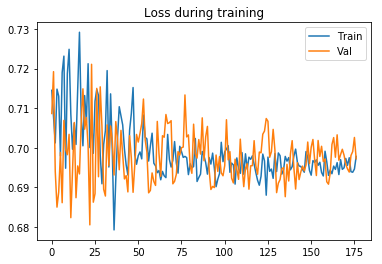

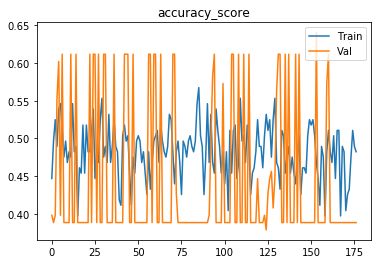

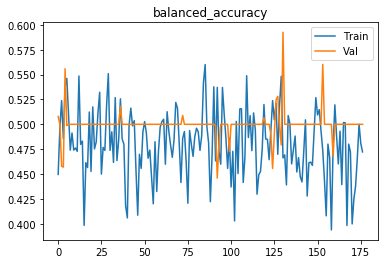

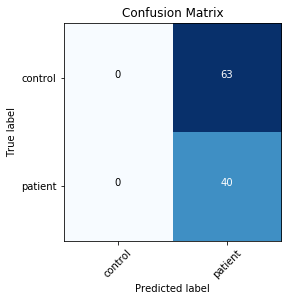

###### Starting inner fold 3
{'model': 'ModelLiu', 'batch_size': 12, 'patience': 12, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.70435
[0,     4] loss: 0.63948
[0,     6] loss: 0.83615
[0,     8] loss: 0.68071
[0,    10] loss: 0.70354
Time elapsed: 0h:0m:2s
train accuracy_score: 55.32 %
train balanced_accuracy: 55.56 %
val accuracy_score: 56.31 %
val balanced_accuracy: 51.05 %
Val loss: 0.679306
[1,     2] loss: 0.73049
[1,     4] loss: 0.83091
[1,     6] loss: 0.72512
[1,     8] loss: 0.66804
[1,    10] loss: 0.69249
Time elapsed: 0h:0m:6s
train accuracy_score: 44.68 %
train balanced_accuracy: 45.14 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.727538
[2,     2] loss: 0.72530
[2,     4] loss: 0.67423
[2,     6] loss: 0.70005
[2,     8] loss: 0.70134
[2,    10] loss: 0.71293
Time elapsed: 0h:0m:10s
train accuracy_score: 48.94 %
train balanced_accuracy: 48.73 %
val accuracy_score: 57.28 %
val balanced_accuracy: 55.04 %
Val loss: 0.686662

val accuracy_score: 49.51 %
val balanced_accuracy: 49.60 %
Val loss: 0.723908
[28,     2] loss: 0.75797
[28,     4] loss: 0.71962
[28,     6] loss: 0.70494
[28,     8] loss: 0.73573
[28,    10] loss: 0.75731
Time elapsed: 0h:1m:41s
train accuracy_score: 48.94 %
train balanced_accuracy: 48.28 %
val accuracy_score: 38.83 %
val balanced_accuracy: 48.63 %
Val loss: 0.754475
[29,     2] loss: 0.69180
[29,     4] loss: 0.66843
[29,     6] loss: 0.78500
[29,     8] loss: 0.71008
[29,    10] loss: 0.67385
Time elapsed: 0h:1m:44s
train accuracy_score: 51.06 %
train balanced_accuracy: 50.42 %
val accuracy_score: 57.28 %
val balanced_accuracy: 51.39 %
Val loss: 0.694286
[30,     2] loss: 0.69062
[30,     4] loss: 0.66932
[30,     6] loss: 0.72586
[30,     8] loss: 0.73145
[30,    10] loss: 0.67061
Time elapsed: 0h:1m:47s
train accuracy_score: 50.35 %
train balanced_accuracy: 50.63 %
val accuracy_score: 56.31 %
val balanced_accuracy: 47.86 %
Val loss: 0.685480
[31,     2] loss: 0.69612
[31,     4]

val accuracy_score: 61.17 %
val balanced_accuracy: 50.00 %
Val loss: 0.690280
[56,     2] loss: 0.69524
[56,     4] loss: 0.70776
[56,     6] loss: 0.68079
[56,     8] loss: 0.70931
[56,    10] loss: 0.67912
Time elapsed: 0h:3m:16s
train accuracy_score: 53.90 %
train balanced_accuracy: 53.99 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.697272
[57,     2] loss: 0.68119
[57,     4] loss: 0.69876
[57,     6] loss: 0.70580
[57,     8] loss: 0.72508
[57,    10] loss: 0.69153
Time elapsed: 0h:3m:20s
train accuracy_score: 52.48 %
train balanced_accuracy: 52.42 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.697071
[58,     2] loss: 0.67839
[58,     4] loss: 0.72595
[58,     6] loss: 0.69294
[58,     8] loss: 0.70843
[58,    10] loss: 0.72100
Time elapsed: 0h:3m:24s
train accuracy_score: 48.23 %
train balanced_accuracy: 47.77 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.708675
[59,     2] loss: 0.67843
[59,     4]

val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.700002
[84,     2] loss: 0.71579
[84,     4] loss: 0.69352
[84,     6] loss: 0.70165
[84,     8] loss: 0.69532
[84,    10] loss: 0.70588
Time elapsed: 0h:4m:54s
train accuracy_score: 44.68 %
train balanced_accuracy: 44.75 %
val accuracy_score: 61.17 %
val balanced_accuracy: 50.00 %
Val loss: 0.691195
[85,     2] loss: 0.70221
[85,     4] loss: 0.71162
[85,     6] loss: 0.71863
[85,     8] loss: 0.71720
[85,    10] loss: 0.66217
Time elapsed: 0h:4m:58s
train accuracy_score: 44.68 %
train balanced_accuracy: 44.50 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.703147
[86,     2] loss: 0.71089
[86,     4] loss: 0.70023
[86,     6] loss: 0.67652
[86,     8] loss: 0.69629
[86,    10] loss: 0.71751
Time elapsed: 0h:5m:1s
train accuracy_score: 42.55 %
train balanced_accuracy: 42.33 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.698878
[87,     2] loss: 0.68286
[87,     4] 

Time elapsed: 0h:6m:27s
train accuracy_score: 53.19 %
train balanced_accuracy: 52.96 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.701017
[112,     2] loss: 0.72138
[112,     4] loss: 0.68309
[112,     6] loss: 0.68087
[112,     8] loss: 0.69597
[112,    10] loss: 0.69359
Time elapsed: 0h:6m:30s
train accuracy_score: 50.35 %
train balanced_accuracy: 49.88 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.702283
[113,     2] loss: 0.70591
[113,     4] loss: 0.66294
[113,     6] loss: 0.70253
[113,     8] loss: 0.71300
[113,    10] loss: 0.68424
Time elapsed: 0h:6m:34s
train accuracy_score: 47.52 %
train balanced_accuracy: 47.37 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.696265
[114,     2] loss: 0.68122
[114,     4] loss: 0.71055
[114,     6] loss: 0.68327
[114,     8] loss: 0.70837
[114,    10] loss: 0.71172
Time elapsed: 0h:6m:38s
train accuracy_score: 50.35 %
train balanced_accuracy: 49.97 %
val accuracy_

[139,     2] loss: 0.69462
[139,     4] loss: 0.70280
[139,     6] loss: 0.69888
[139,     8] loss: 0.71339
[139,    10] loss: 0.69212
Time elapsed: 0h:8m:6s
train accuracy_score: 49.65 %
train balanced_accuracy: 49.31 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.697983
[140,     2] loss: 0.68512
[140,     4] loss: 0.70307
[140,     6] loss: 0.67035
[140,     8] loss: 0.68492
[140,    10] loss: 0.70807
Time elapsed: 0h:8m:9s
train accuracy_score: 51.06 %
train balanced_accuracy: 50.60 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.705319
[141,     2] loss: 0.69973
[141,     4] loss: 0.67190
[141,     6] loss: 0.68386
[141,     8] loss: 0.70999
[141,    10] loss: 0.69727
Time elapsed: 0h:8m:13s
train accuracy_score: 48.23 %
train balanced_accuracy: 47.92 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.698206
[142,     2] loss: 0.68495
[142,     4] loss: 0.67519
[142,     6] loss: 0.68563
[142,     8] loss: 0.

Time elapsed: 0h:9m:39s
train accuracy_score: 54.61 %
train balanced_accuracy: 54.26 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.713694
[167,     2] loss: 0.70408
[167,     4] loss: 0.69265
[167,     6] loss: 0.70826
[167,     8] loss: 0.69216
[167,    10] loss: 0.67365
Time elapsed: 0h:9m:42s
train accuracy_score: 50.35 %
train balanced_accuracy: 49.31 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.715257
[168,     2] loss: 0.71096
[168,     4] loss: 0.69663
[168,     6] loss: 0.68568
[168,     8] loss: 0.69966
[168,    10] loss: 0.69410
Time elapsed: 0h:9m:46s
train accuracy_score: 51.06 %
train balanced_accuracy: 50.15 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.702315
[169,     2] loss: 0.69750
[169,     4] loss: 0.69429
[169,     6] loss: 0.69801
[169,     8] loss: 0.69165
[169,    10] loss: 0.69417
Time elapsed: 0h:9m:49s
train accuracy_score: 49.65 %
train balanced_accuracy: 49.18 %
val accuracy_

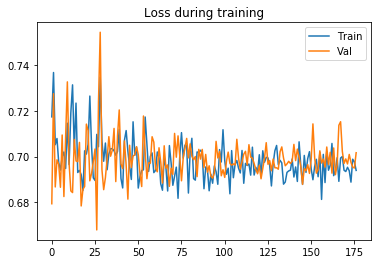

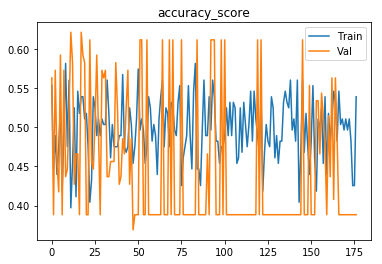

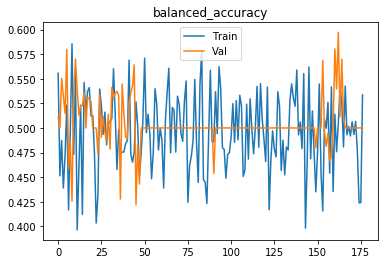

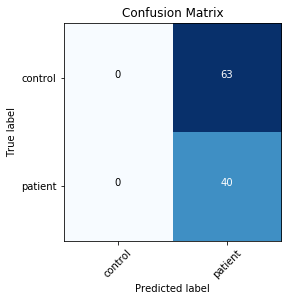

###### Starting inner fold 4
{'model': 'ModelLiu', 'batch_size': 12, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.73345
[0,     4] loss: 0.70203
[0,     6] loss: 0.67731
[0,     8] loss: 0.70139
[0,    10] loss: 0.72970
Time elapsed: 0h:0m:2s
train accuracy_score: 52.48 %
train balanced_accuracy: 52.63 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.799195
[1,     2] loss: 0.73073
[1,     4] loss: 0.81153
[1,     6] loss: 0.73505
[1,     8] loss: 0.68937
[1,    10] loss: 0.68594
Time elapsed: 0h:0m:5s
train accuracy_score: 42.55 %
train balanced_accuracy: 42.48 %
val accuracy_score: 39.81 %
val balanced_accuracy: 49.42 %
Val loss: 0.697101
[2,     2] loss: 0.71640
[2,     4] loss: 0.67710
[2,     6] loss: 0.69935
[2,     8] loss: 0.65139
[2,    10] loss: 0.72323
Time elapsed: 0h:0m:8s
train accuracy_score: 53.90 %
train balanced_accuracy: 53.47 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.704567


val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.703552
[28,     2] loss: 0.69224
[28,     4] loss: 0.70238
[28,     6] loss: 0.74119
[28,     8] loss: 0.67518
[28,    10] loss: 0.72247
Time elapsed: 0h:1m:41s
train accuracy_score: 43.97 %
train balanced_accuracy: 43.84 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.704178
[29,     2] loss: 0.67944
[29,     4] loss: 0.69835
[29,     6] loss: 0.69683
[29,     8] loss: 0.73648
[29,    10] loss: 0.68544
Time elapsed: 0h:1m:45s
train accuracy_score: 46.10 %
train balanced_accuracy: 45.92 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.699350
[30,     2] loss: 0.70177
[30,     4] loss: 0.64252
[30,     6] loss: 0.71091
[30,     8] loss: 0.68024
[30,    10] loss: 0.71780
Time elapsed: 0h:1m:49s
train accuracy_score: 57.45 %
train balanced_accuracy: 57.22 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.706080
[31,     2] loss: 0.72151
[31,     4]

val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.698554
[56,     2] loss: 0.70895
[56,     4] loss: 0.71283
[56,     6] loss: 0.69865
[56,     8] loss: 0.69233
[56,    10] loss: 0.69062
Time elapsed: 0h:3m:32s
train accuracy_score: 51.06 %
train balanced_accuracy: 50.72 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.705089
[57,     2] loss: 0.71974
[57,     4] loss: 0.71088
[57,     6] loss: 0.71661
[57,     8] loss: 0.69584
[57,    10] loss: 0.71155
Time elapsed: 0h:3m:36s
train accuracy_score: 46.10 %
train balanced_accuracy: 45.68 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.711453
[58,     2] loss: 0.69870
[58,     4] loss: 0.73106
[58,     6] loss: 0.69337
[58,     8] loss: 0.69342
[58,    10] loss: 0.69768
Time elapsed: 0h:3m:40s
train accuracy_score: 50.35 %
train balanced_accuracy: 50.06 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.699996
[59,     2] loss: 0.66948
[59,     4]

val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.696678
[84,     2] loss: 0.70222
[84,     4] loss: 0.69021
[84,     6] loss: 0.68527
[84,     8] loss: 0.70349
[84,    10] loss: 0.71535
Time elapsed: 0h:5m:21s
train accuracy_score: 47.52 %
train balanced_accuracy: 47.22 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.700516
[85,     2] loss: 0.68918
[85,     4] loss: 0.71571
[85,     6] loss: 0.69789
[85,     8] loss: 0.69665
[85,    10] loss: 0.72773
Time elapsed: 0h:5m:24s
train accuracy_score: 48.94 %
train balanced_accuracy: 48.34 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.704142
[86,     2] loss: 0.70137
[86,     4] loss: 0.69691
[86,     6] loss: 0.69958
[86,     8] loss: 0.68903
[86,    10] loss: 0.67141
Time elapsed: 0h:5m:28s
train accuracy_score: 49.65 %
train balanced_accuracy: 49.34 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.696470
[87,     2] loss: 0.69105
[87,     4]

Time elapsed: 0h:6m:48s
train accuracy_score: 53.19 %
train balanced_accuracy: 52.99 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.700289
[112,     2] loss: 0.69913
[112,     4] loss: 0.69800
[112,     6] loss: 0.68565
[112,     8] loss: 0.71776
[112,    10] loss: 0.70679
Time elapsed: 0h:6m:51s
train accuracy_score: 47.52 %
train balanced_accuracy: 47.16 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.698105
[113,     2] loss: 0.70739
[113,     4] loss: 0.69216
[113,     6] loss: 0.69957
[113,     8] loss: 0.69845
[113,    10] loss: 0.70657
Time elapsed: 0h:6m:54s
train accuracy_score: 44.68 %
train balanced_accuracy: 44.81 %
val accuracy_score: 61.17 %
val balanced_accuracy: 50.00 %
Val loss: 0.688131
[114,     2] loss: 0.70489
[114,     4] loss: 0.70220
[114,     6] loss: 0.66644
[114,     8] loss: 0.70354
[114,    10] loss: 0.72828
Time elapsed: 0h:6m:57s
train accuracy_score: 45.39 %
train balanced_accuracy: 45.29 %
val accuracy_

[139,     2] loss: 0.69992
[139,     4] loss: 0.70939
[139,     6] loss: 0.68057
[139,     8] loss: 0.69624
[139,    10] loss: 0.69379
Time elapsed: 0h:8m:14s
train accuracy_score: 52.48 %
train balanced_accuracy: 51.87 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.703789
[140,     2] loss: 0.69944
[140,     4] loss: 0.68067
[140,     6] loss: 0.71771
[140,     8] loss: 0.70512
[140,    10] loss: 0.68945
Time elapsed: 0h:8m:17s
train accuracy_score: 47.52 %
train balanced_accuracy: 46.80 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.702940
[141,     2] loss: 0.69078
[141,     4] loss: 0.70253
[141,     6] loss: 0.70037
[141,     8] loss: 0.69233
[141,    10] loss: 0.69429
Time elapsed: 0h:8m:20s
train accuracy_score: 51.77 %
train balanced_accuracy: 51.21 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.698791
[142,     2] loss: 0.68811
[142,     4] loss: 0.69252
[142,     6] loss: 0.69774
[142,     8] loss: 

Time elapsed: 0h:9m:50s
train accuracy_score: 55.32 %
train balanced_accuracy: 55.16 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.694381
[167,     2] loss: 0.69855
[167,     4] loss: 0.69245
[167,     6] loss: 0.71367
[167,     8] loss: 0.69358
[167,    10] loss: 0.69344
Time elapsed: 0h:9m:54s
train accuracy_score: 48.23 %
train balanced_accuracy: 48.04 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.698554
[168,     2] loss: 0.68782
[168,     4] loss: 0.68520
[168,     6] loss: 0.68438
[168,     8] loss: 0.70054
[168,    10] loss: 0.68993
Time elapsed: 0h:9m:58s
train accuracy_score: 53.19 %
train balanced_accuracy: 52.69 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.701018
[169,     2] loss: 0.70878
[169,     4] loss: 0.69748
[169,     6] loss: 0.68892
[169,     8] loss: 0.69820
[169,    10] loss: 0.68232
Time elapsed: 0h:10m:2s
train accuracy_score: 49.65 %
train balanced_accuracy: 49.40 %
val accuracy_

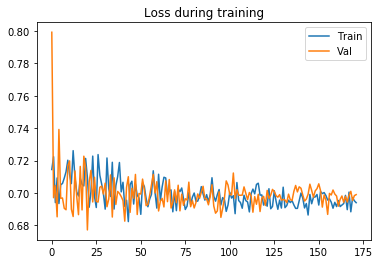

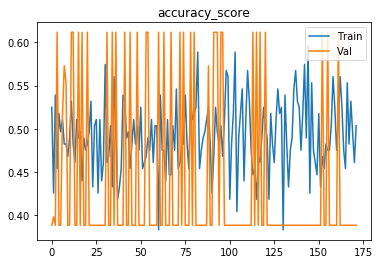

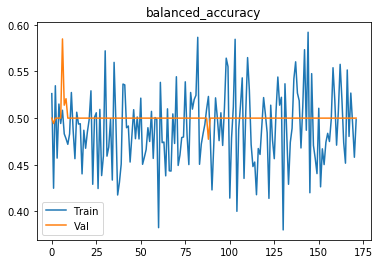

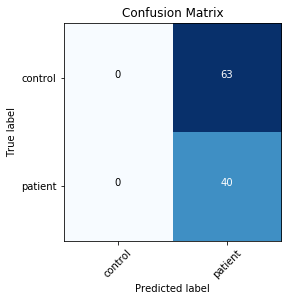

Finished outer fold.
{'final_acc': 0.5, 'best_acc': 0.50932539682539679, 'final_iter': 186, 'best_iter': 5, 'params': {'model': 'ModelLiu', 'batch_size': 12, 'patience': 16, 'lr': 0.001}, 'inner_fold_idx': 0}
###### Starting outer fold 7
# of patients 116, # of healthy controls 118
140
94
###### Starting inner fold 0
{'model': 'ModelLiu', 'batch_size': 6, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.66555
[0,     4] loss: 0.86393
[0,     6] loss: 0.67799
[0,     8] loss: 0.74950
[0,    10] loss: 0.67288
[0,    12] loss: 0.65112
[0,    14] loss: 0.63626
[0,    16] loss: 0.64627
[0,    18] loss: 0.97064
[0,    20] loss: 0.75956
[0,    22] loss: 0.73806
Time elapsed: 0h:0m:1s
train accuracy_score: 47.86 %
train balanced_accuracy: 48.30 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.698714
[1,     2] loss: 0.70790
[1,     4] loss: 0.72936
[1,     6] loss: 0.71463
[1,     8] loss: 0.65159
[1,    10] loss: 0.66266
[1,    12] los

[17,    20] loss: 0.72208
[17,    22] loss: 0.66362
Time elapsed: 0h:0m:53s
train accuracy_score: 53.57 %
train balanced_accuracy: 54.12 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.698900
[18,     2] loss: 0.70690
[18,     4] loss: 0.66942
[18,     6] loss: 0.72372
[18,     8] loss: 0.67024
[18,    10] loss: 0.70440
[18,    12] loss: 0.69033
[18,    14] loss: 0.80233
[18,    16] loss: 0.69217
[18,    18] loss: 0.73857
[18,    20] loss: 0.75521
[18,    22] loss: 0.64125
Time elapsed: 0h:0m:56s
train accuracy_score: 52.86 %
train balanced_accuracy: 51.23 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.703741
[19,     2] loss: 0.71178
[19,     4] loss: 0.73782
[19,     6] loss: 0.75836
[19,     8] loss: 0.73547
[19,    10] loss: 0.73616
[19,    12] loss: 0.68667
[19,    14] loss: 0.62596
[19,    16] loss: 0.76555
[19,    18] loss: 0.70733
[19,    20] loss: 0.70077
[19,    22] loss: 0.71964
Time elapsed: 0h:0m:59s
train accuracy_score: 

val accuracy_score: 44.68 %
val balanced_accuracy: 47.48 %
Val loss: 0.701759
[36,     2] loss: 0.71499
[36,     4] loss: 0.69884
[36,     6] loss: 0.65321
[36,     8] loss: 0.64648
[36,    10] loss: 0.68157
[36,    12] loss: 0.70157
[36,    14] loss: 0.73343
[36,    16] loss: 0.69964
[36,    18] loss: 0.66828
[36,    20] loss: 0.72989
[36,    22] loss: 0.69232
Time elapsed: 0h:1m:49s
train accuracy_score: 58.57 %
train balanced_accuracy: 59.42 %
val accuracy_score: 47.87 %
val balanced_accuracy: 51.28 %
Val loss: 0.698104
[37,     2] loss: 0.69681
[37,     4] loss: 0.72770
[37,     6] loss: 0.70239
[37,     8] loss: 0.68380
[37,    10] loss: 0.69715
[37,    12] loss: 0.60907
[37,    14] loss: 0.84594
[37,    16] loss: 0.70054
[37,    18] loss: 0.73951
[37,    20] loss: 0.74926
[37,    22] loss: 0.71233
Time elapsed: 0h:1m:52s
train accuracy_score: 47.14 %
train balanced_accuracy: 46.15 %
val accuracy_score: 45.74 %
val balanced_accuracy: 49.59 %
Val loss: 0.707532
[38,     2] loss: 0.

[54,     2] loss: 0.64717
[54,     4] loss: 0.71995
[54,     6] loss: 0.70407
[54,     8] loss: 0.70153
[54,    10] loss: 0.67628
[54,    12] loss: 0.69237
[54,    14] loss: 0.69062
[54,    16] loss: 0.71104
[54,    18] loss: 0.78912
[54,    20] loss: 0.64952
[54,    22] loss: 0.78984
Time elapsed: 0h:2m:44s
train accuracy_score: 54.29 %
train balanced_accuracy: 52.91 %
val accuracy_score: 48.94 %
val balanced_accuracy: 53.85 %
Val loss: 0.696347
[55,     2] loss: 0.72594
[55,     4] loss: 0.71978
[55,     6] loss: 0.67078
[55,     8] loss: 0.71221
[55,    10] loss: 0.75062
[55,    12] loss: 0.70097
[55,    14] loss: 0.68486
[55,    16] loss: 0.67575
[55,    18] loss: 0.68292
[55,    20] loss: 0.59675
[55,    22] loss: 0.70754
Time elapsed: 0h:2m:47s
train accuracy_score: 54.29 %
train balanced_accuracy: 53.15 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.698133
[56,     2] loss: 0.66127
[56,     4] loss: 0.74929
[56,     6] loss: 0.70033
[56,     8] loss: 0.

[72,    12] loss: 0.68892
[72,    14] loss: 0.74217
[72,    16] loss: 0.68091
[72,    18] loss: 0.68108
[72,    20] loss: 0.69057
[72,    22] loss: 0.65716
Time elapsed: 0h:3m:39s
train accuracy_score: 52.14 %
train balanced_accuracy: 50.06 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.701742
[73,     2] loss: 0.69749
[73,     4] loss: 0.70496
[73,     6] loss: 0.68772
[73,     8] loss: 0.71440
[73,    10] loss: 0.69402
[73,    12] loss: 0.68974
[73,    14] loss: 0.68027
[73,    16] loss: 0.67625
[73,    18] loss: 0.70398
[73,    20] loss: 0.69525
[73,    22] loss: 0.70211
Time elapsed: 0h:3m:43s
train accuracy_score: 51.43 %
train balanced_accuracy: 49.88 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.699287
[74,     2] loss: 0.69887
[74,     4] loss: 0.68676
[74,     6] loss: 0.70942
[74,     8] loss: 0.70824
[74,    10] loss: 0.70027
[74,    12] loss: 0.71074
[74,    14] loss: 0.68107
[74,    16] loss: 0.65921
[74,    18] loss: 0.

[90,    20] loss: 0.68553
[90,    22] loss: 0.67393
Time elapsed: 0h:4m:33s
train accuracy_score: 52.14 %
train balanced_accuracy: 50.88 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.695842
[91,     2] loss: 0.69134
[91,     4] loss: 0.73164
[91,     6] loss: 0.70430
[91,     8] loss: 0.73318
[91,    10] loss: 0.69514
[91,    12] loss: 0.69941
[91,    14] loss: 0.67971
[91,    16] loss: 0.72031
[91,    18] loss: 0.70048
[91,    20] loss: 0.68883
[91,    22] loss: 0.65628
Time elapsed: 0h:4m:36s
train accuracy_score: 50.00 %
train balanced_accuracy: 49.18 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.696543
[92,     2] loss: 0.70526
[92,     4] loss: 0.66722
[92,     6] loss: 0.68915
[92,     8] loss: 0.68987
[92,    10] loss: 0.69106
[92,    12] loss: 0.71399
[92,    14] loss: 0.68353
[92,    16] loss: 0.70994
[92,    18] loss: 0.69867
[92,    20] loss: 0.70048
[92,    22] loss: 0.69860
Time elapsed: 0h:4m:39s
train accuracy_score: 

[108,    22] loss: 0.66123
Time elapsed: 0h:5m:28s
train accuracy_score: 50.71 %
train balanced_accuracy: 48.71 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.700505
[109,     2] loss: 0.63667
[109,     4] loss: 0.65690
[109,     6] loss: 0.69264
[109,     8] loss: 0.71476
[109,    10] loss: 0.73924
[109,    12] loss: 0.74685
[109,    14] loss: 0.71693
[109,    16] loss: 0.73180
[109,    18] loss: 0.71469
[109,    20] loss: 0.68384
[109,    22] loss: 0.67992
Time elapsed: 0h:5m:31s
train accuracy_score: 55.00 %
train balanced_accuracy: 52.60 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.705861
[110,     2] loss: 0.68196
[110,     4] loss: 0.67912
[110,     6] loss: 0.65524
[110,     8] loss: 0.71112
[110,    10] loss: 0.71075
[110,    12] loss: 0.66436
[110,    14] loss: 0.69627
[110,    16] loss: 0.70432
[110,    18] loss: 0.71839
[110,    20] loss: 0.66798
[110,    22] loss: 0.67326
Time elapsed: 0h:5m:34s
train accuracy_score: 51.

[126,    14] loss: 0.71282
[126,    16] loss: 0.67423
[126,    18] loss: 0.71825
[126,    20] loss: 0.66523
[126,    22] loss: 0.67450
Time elapsed: 0h:6m:24s
train accuracy_score: 54.29 %
train balanced_accuracy: 52.09 %
val accuracy_score: 37.23 %
val balanced_accuracy: 41.67 %
Val loss: 0.715693
[127,     2] loss: 0.66207
[127,     4] loss: 0.73722
[127,     6] loss: 0.67604
[127,     8] loss: 0.70229
[127,    10] loss: 0.69036
[127,    12] loss: 0.67733
[127,    14] loss: 0.67975
[127,    16] loss: 0.69955
[127,    18] loss: 0.72781
[127,    20] loss: 0.64962
[127,    22] loss: 0.71010
Time elapsed: 0h:6m:27s
train accuracy_score: 52.14 %
train balanced_accuracy: 49.90 %
val accuracy_score: 41.49 %
val balanced_accuracy: 45.97 %
Val loss: 0.714266
[128,     2] loss: 0.71394
[128,     4] loss: 0.70910
[128,     6] loss: 0.70674
[128,     8] loss: 0.72111
[128,    10] loss: 0.72109
[128,    12] loss: 0.73356
[128,    14] loss: 0.71152
[128,    16] loss: 0.68517
[128,    18] loss: 0.6

[144,     8] loss: 0.70188
[144,    10] loss: 0.69628
[144,    12] loss: 0.67154
[144,    14] loss: 0.69945
[144,    16] loss: 0.69945
[144,    18] loss: 0.70900
[144,    20] loss: 0.67103
[144,    22] loss: 0.70115
Time elapsed: 0h:7m:18s
train accuracy_score: 50.00 %
train balanced_accuracy: 47.62 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.700115
[145,     2] loss: 0.70701
[145,     4] loss: 0.66644
[145,     6] loss: 0.69949
[145,     8] loss: 0.70576
[145,    10] loss: 0.67575
[145,    12] loss: 0.68121
[145,    14] loss: 0.70183
[145,    16] loss: 0.70595
[145,    18] loss: 0.66927
[145,    20] loss: 0.69024
[145,    22] loss: 0.69201
Time elapsed: 0h:7m:21s
train accuracy_score: 52.14 %
train balanced_accuracy: 49.98 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.699518
[146,     2] loss: 0.72689
[146,     4] loss: 0.70585
[146,     6] loss: 0.71251
[146,     8] loss: 0.70399
[146,    10] loss: 0.69798
[146,    12] loss: 0.6

[162,     2] loss: 0.70887
[162,     4] loss: 0.69982
[162,     6] loss: 0.66793
[162,     8] loss: 0.70378
[162,    10] loss: 0.67459
[162,    12] loss: 0.70551
[162,    14] loss: 0.69738
[162,    16] loss: 0.68322
[162,    18] loss: 0.66684
[162,    20] loss: 0.67706
[162,    22] loss: 0.71138
Time elapsed: 0h:8m:13s
train accuracy_score: 53.57 %
train balanced_accuracy: 51.66 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.698357
[163,     2] loss: 0.69051
[163,     4] loss: 0.67812
[163,     6] loss: 0.72802
[163,     8] loss: 0.71772
[163,    10] loss: 0.66737
[163,    12] loss: 0.67691
[163,    14] loss: 0.67348
[163,    16] loss: 0.70679
[163,    18] loss: 0.71721
[163,    20] loss: 0.68840
[163,    22] loss: 0.68028
Time elapsed: 0h:8m:16s
train accuracy_score: 51.43 %
train balanced_accuracy: 48.81 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.702345
[164,     2] loss: 0.71423
[164,     4] loss: 0.69881
[164,     6] loss: 0.6

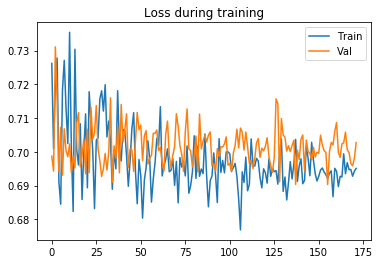

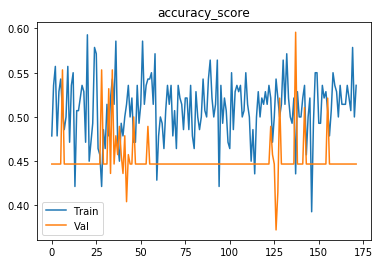

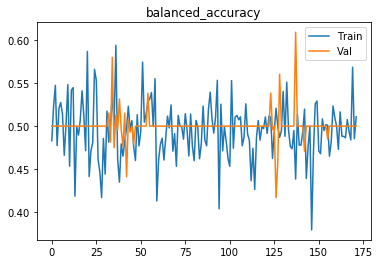

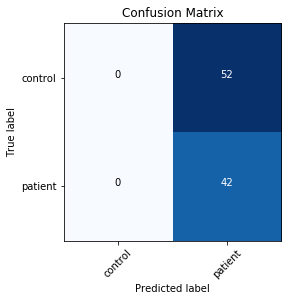

###### Starting inner fold 1
{'model': 'ModelLiu', 'batch_size': 4, 'patience': 12, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.70895
[0,     4] loss: 0.60382
[0,     6] loss: 0.75805
[0,     8] loss: 0.68408
[0,    10] loss: 0.90581
[0,    12] loss: 0.74293
[0,    14] loss: 0.65379
[0,    16] loss: 0.58648
[0,    18] loss: 0.76511
[0,    20] loss: 0.72955
[0,    22] loss: 0.70296
[0,    24] loss: 0.70677
[0,    26] loss: 0.66903
[0,    28] loss: 0.69052
[0,    30] loss: 0.66711
[0,    32] loss: 0.73683
[0,    34] loss: 0.69499
Time elapsed: 0h:0m:2s
train accuracy_score: 51.43 %
train balanced_accuracy: 50.78 %
val accuracy_score: 55.32 %
val balanced_accuracy: 50.00 %
Val loss: 0.687444
[1,     2] loss: 0.72917
[1,     4] loss: 0.71824
[1,     6] loss: 0.73941
[1,     8] loss: 0.84709
[1,    10] loss: 0.61296
[1,    12] loss: 0.73850
[1,    14] loss: 0.62404
[1,    16] loss: 0.73103
[1,    18] loss: 0.81691
[1,    20] loss: 0.83127
[1,    22] loss: 0.63002
[1, 

[13,    30] loss: 0.71486
[13,    32] loss: 0.78868
[13,    34] loss: 0.62136
Time elapsed: 0h:0m:42s
train accuracy_score: 45.71 %
train balanced_accuracy: 45.70 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.710825
[14,     2] loss: 0.66497
[14,     4] loss: 0.74875
[14,     6] loss: 0.66007
[14,     8] loss: 0.88920
[14,    10] loss: 0.87124
[14,    12] loss: 0.70981
[14,    14] loss: 0.87592
[14,    16] loss: 0.64701
[14,    18] loss: 0.75027
[14,    20] loss: 0.72420
[14,    22] loss: 0.84297
[14,    24] loss: 0.66056
[14,    26] loss: 0.72965
[14,    28] loss: 0.74979
[14,    30] loss: 0.74690
[14,    32] loss: 0.67031
[14,    34] loss: 0.75797
Time elapsed: 0h:0m:45s
train accuracy_score: 47.86 %
train balanced_accuracy: 46.33 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.695022
[15,     2] loss: 0.66437
[15,     4] loss: 0.73581
[15,     6] loss: 0.65438
[15,     8] loss: 0.70488
[15,    10] loss: 0.65346
[15,    12] loss: 0.

[27,    10] loss: 0.57132
[27,    12] loss: 0.54280
[27,    14] loss: 0.64929
[27,    16] loss: 0.70084
[27,    18] loss: 0.68692
[27,    20] loss: 0.80385
[27,    22] loss: 0.82245
[27,    24] loss: 0.83186
[27,    26] loss: 0.70629
[27,    28] loss: 0.66797
[27,    30] loss: 0.71210
[27,    32] loss: 0.70036
[27,    34] loss: 0.66399
Time elapsed: 0h:1m:24s
train accuracy_score: 50.71 %
train balanced_accuracy: 48.71 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.700305
[28,     2] loss: 0.71554
[28,     4] loss: 0.69534
[28,     6] loss: 0.73152
[28,     8] loss: 0.66539
[28,    10] loss: 0.70764
[28,    12] loss: 0.69796
[28,    14] loss: 0.67494
[28,    16] loss: 0.71089
[28,    18] loss: 0.68806
[28,    20] loss: 0.67426
[28,    22] loss: 0.78610
[28,    24] loss: 0.68156
[28,    26] loss: 0.72019
[28,    28] loss: 0.67064
[28,    30] loss: 0.72085
[28,    32] loss: 0.61751
[28,    34] loss: 0.77130
Time elapsed: 0h:1m:27s
train accuracy_score: 45.71 %
t

Time elapsed: 0h:2m:2s
train accuracy_score: 50.00 %
train balanced_accuracy: 49.10 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.694338
[41,     2] loss: 0.72637
[41,     4] loss: 0.67134
[41,     6] loss: 0.72400
[41,     8] loss: 0.66921
[41,    10] loss: 0.65292
[41,    12] loss: 0.69073
[41,    14] loss: 0.69262
[41,    16] loss: 0.65368
[41,    18] loss: 0.64556
[41,    20] loss: 0.66459
[41,    22] loss: 0.61716
[41,    24] loss: 0.69817
[41,    26] loss: 0.68893
[41,    28] loss: 0.70184
[41,    30] loss: 0.71631
[41,    32] loss: 0.75995
[41,    34] loss: 0.71075
Time elapsed: 0h:2m:5s
train accuracy_score: 53.57 %
train balanced_accuracy: 52.81 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.702183
[42,     2] loss: 0.68414
[42,     4] loss: 0.71882
[42,     6] loss: 0.74373
[42,     8] loss: 0.70724
[42,    10] loss: 0.65443
[42,    12] loss: 0.67124
[42,    14] loss: 0.85472
[42,    16] loss: 0.76228
[42,    18] loss: 0.74

[54,    18] loss: 0.69116
[54,    20] loss: 0.68514
[54,    22] loss: 0.71221
[54,    24] loss: 0.68757
[54,    26] loss: 0.61616
[54,    28] loss: 0.68110
[54,    30] loss: 0.73076
[54,    32] loss: 0.75642
[54,    34] loss: 0.63975
Time elapsed: 0h:2m:46s
train accuracy_score: 48.57 %
train balanced_accuracy: 46.44 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.711664
[55,     2] loss: 0.72665
[55,     4] loss: 0.64553
[55,     6] loss: 0.72188
[55,     8] loss: 0.67077
[55,    10] loss: 0.72532
[55,    12] loss: 0.75119
[55,    14] loss: 0.66488
[55,    16] loss: 0.66661
[55,    18] loss: 0.67303
[55,    20] loss: 0.69969
[55,    22] loss: 0.67770
[55,    24] loss: 0.64751
[55,    26] loss: 0.69466
[55,    28] loss: 0.73728
[55,    30] loss: 0.72702
[55,    32] loss: 0.71168
[55,    34] loss: 0.68358
Time elapsed: 0h:2m:49s
train accuracy_score: 55.00 %
train balanced_accuracy: 53.01 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.7

val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.698956
[68,     2] loss: 0.70278
[68,     4] loss: 0.69632
[68,     6] loss: 0.67235
[68,     8] loss: 0.67557
[68,    10] loss: 0.68715
[68,    12] loss: 0.65550
[68,    14] loss: 0.64621
[68,    16] loss: 0.67730
[68,    18] loss: 0.70787
[68,    20] loss: 0.68782
[68,    22] loss: 0.71738
[68,    24] loss: 0.73101
[68,    26] loss: 0.66931
[68,    28] loss: 0.72522
[68,    30] loss: 0.69478
[68,    32] loss: 0.65554
[68,    34] loss: 0.66380
Time elapsed: 0h:3m:28s
train accuracy_score: 52.14 %
train balanced_accuracy: 49.90 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.707423
[69,     2] loss: 0.71056
[69,     4] loss: 0.70300
[69,     6] loss: 0.69050
[69,     8] loss: 0.67851
[69,    10] loss: 0.71690
[69,    12] loss: 0.68777
[69,    14] loss: 0.73763
[69,    16] loss: 0.68374
[69,    18] loss: 0.67975
[69,    20] loss: 0.65621
[69,    22] loss: 0.66622
[69,    24] loss: 0.63125
[69

[81,    26] loss: 0.79473
[81,    28] loss: 0.81775
[81,    30] loss: 0.78851
[81,    32] loss: 0.70177
[81,    34] loss: 0.70153
Time elapsed: 0h:4m:8s
train accuracy_score: 47.14 %
train balanced_accuracy: 44.84 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.710423
[82,     2] loss: 0.73857
[82,     4] loss: 0.68648
[82,     6] loss: 0.73429
[82,     8] loss: 0.72248
[82,    10] loss: 0.66965
[82,    12] loss: 0.67199
[82,    14] loss: 0.70190
[82,    16] loss: 0.72405
[82,    18] loss: 0.67957
[82,    20] loss: 0.69582
[82,    22] loss: 0.71703
[82,    24] loss: 0.69679
[82,    26] loss: 0.68813
[82,    28] loss: 0.68394
[82,    30] loss: 0.70250
[82,    32] loss: 0.69611
[82,    34] loss: 0.70748
Time elapsed: 0h:4m:11s
train accuracy_score: 47.14 %
train balanced_accuracy: 46.15 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.696775
[83,     2] loss: 0.70117
[83,     4] loss: 0.66604
[83,     6] loss: 0.68101
[83,     8] loss: 0.6

[95,    10] loss: 0.69256
[95,    12] loss: 0.70676
[95,    14] loss: 0.65296
[95,    16] loss: 0.68418
[95,    18] loss: 0.69462
[95,    20] loss: 0.72541
[95,    22] loss: 0.70695
[95,    24] loss: 0.67987
[95,    26] loss: 0.71165
[95,    28] loss: 0.68130
[95,    30] loss: 0.74005
[95,    32] loss: 0.68100
[95,    34] loss: 0.70803
Time elapsed: 0h:4m:49s
train accuracy_score: 47.14 %
train balanced_accuracy: 45.00 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.698816
[96,     2] loss: 0.70229
[96,     4] loss: 0.65869
[96,     6] loss: 0.62547
[96,     8] loss: 0.70414
[96,    10] loss: 0.66623
[96,    12] loss: 0.69439
[96,    14] loss: 0.70270
[96,    16] loss: 0.68151
[96,    18] loss: 0.75925
[96,    20] loss: 0.70139
[96,    22] loss: 0.71116
[96,    24] loss: 0.66728
[96,    26] loss: 0.68869
[96,    28] loss: 0.70250
[96,    30] loss: 0.72159
[96,    32] loss: 0.71550
[96,    34] loss: 0.66613
Time elapsed: 0h:4m:52s
train accuracy_score: 52.86 %
t

[108,    26] loss: 0.67509
[108,    28] loss: 0.68372
[108,    30] loss: 0.69062
[108,    32] loss: 0.75418
[108,    34] loss: 0.72607
Time elapsed: 0h:5m:27s
train accuracy_score: 50.71 %
train balanced_accuracy: 48.55 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.703592
[109,     2] loss: 0.67133
[109,     4] loss: 0.69085
[109,     6] loss: 0.66562
[109,     8] loss: 0.74680
[109,    10] loss: 0.69671
[109,    12] loss: 0.71762
[109,    14] loss: 0.68789
[109,    16] loss: 0.69100
[109,    18] loss: 0.69694
[109,    20] loss: 0.70738
[109,    22] loss: 0.67941
[109,    24] loss: 0.67901
[109,    26] loss: 0.66880
[109,    28] loss: 0.69466
[109,    30] loss: 0.69531
[109,    32] loss: 0.69546
[109,    34] loss: 0.72785
Time elapsed: 0h:5m:30s
train accuracy_score: 52.86 %
train balanced_accuracy: 51.31 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.698975
[110,     2] loss: 0.67630
[110,     4] loss: 0.72477
[110,     6] loss: 0.7

Time elapsed: 0h:6m:6s
train accuracy_score: 46.43 %
train balanced_accuracy: 44.49 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.699615
[122,     2] loss: 0.68533
[122,     4] loss: 0.72274
[122,     6] loss: 0.70878
[122,     8] loss: 0.69795
[122,    10] loss: 0.70533
[122,    12] loss: 0.69800
[122,    14] loss: 0.73551
[122,    16] loss: 0.71166
[122,    18] loss: 0.68276
[122,    20] loss: 0.69645
[122,    22] loss: 0.70464
[122,    24] loss: 0.69620
[122,    26] loss: 0.68012
[122,    28] loss: 0.68889
[122,    30] loss: 0.70165
[122,    32] loss: 0.68439
[122,    34] loss: 0.71525
Time elapsed: 0h:6m:9s
train accuracy_score: 45.00 %
train balanced_accuracy: 44.29 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.699126
[123,     2] loss: 0.69761
[123,     4] loss: 0.68458
[123,     6] loss: 0.69157
[123,     8] loss: 0.64803
[123,    10] loss: 0.70012
[123,    12] loss: 0.68549
[123,    14] loss: 0.68468
[123,    16] loss: 0.680

val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.703971
[135,     2] loss: 0.66647
[135,     4] loss: 0.67376
[135,     6] loss: 0.70650
[135,     8] loss: 0.70874
[135,    10] loss: 0.77549
[135,    12] loss: 0.71704
[135,    14] loss: 0.65912
[135,    16] loss: 0.70567
[135,    18] loss: 0.67625
[135,    20] loss: 0.73172
[135,    22] loss: 0.69764
[135,    24] loss: 0.71435
[135,    26] loss: 0.67907
[135,    28] loss: 0.68279
[135,    30] loss: 0.71063
[135,    32] loss: 0.68962
[135,    34] loss: 0.64454
Time elapsed: 0h:6m:49s
train accuracy_score: 45.00 %
train balanced_accuracy: 42.98 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.697671
[136,     2] loss: 0.68495
[136,     4] loss: 0.68522
[136,     6] loss: 0.67881
[136,     8] loss: 0.65403
[136,    10] loss: 0.69099
[136,    12] loss: 0.68985
[136,    14] loss: 0.72079
[136,    16] loss: 0.66344
[136,    18] loss: 0.72150
[136,    20] loss: 0.67589
[136,    22] loss: 0.61941
[

[148,    10] loss: 0.67997
[148,    12] loss: 0.66559
[148,    14] loss: 0.71902
[148,    16] loss: 0.67305
[148,    18] loss: 0.70808
[148,    20] loss: 0.73361
[148,    22] loss: 0.70774
[148,    24] loss: 0.67404
[148,    26] loss: 0.69812
[148,    28] loss: 0.69864
[148,    30] loss: 0.66905
[148,    32] loss: 0.68284
[148,    34] loss: 0.69147
Time elapsed: 0h:7m:29s
train accuracy_score: 51.43 %
train balanced_accuracy: 49.22 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.698362
[149,     2] loss: 0.69864
[149,     4] loss: 0.69958
[149,     6] loss: 0.73258
[149,     8] loss: 0.68139
[149,    10] loss: 0.70400
[149,    12] loss: 0.69818
[149,    14] loss: 0.69166
[149,    16] loss: 0.68435
[149,    18] loss: 0.69571
[149,    20] loss: 0.69412
[149,    22] loss: 0.69069
[149,    24] loss: 0.70026
[149,    26] loss: 0.68171
[149,    28] loss: 0.66241
[149,    30] loss: 0.67227
[149,    32] loss: 0.68138
[149,    34] loss: 0.74929
Time elapsed: 0h:7m:32s
t

[161,    18] loss: 0.70814
[161,    20] loss: 0.67334
[161,    22] loss: 0.68508
[161,    24] loss: 0.71598
[161,    26] loss: 0.67596
[161,    28] loss: 0.68327
[161,    30] loss: 0.68880
[161,    32] loss: 0.70942
[161,    34] loss: 0.69642
Time elapsed: 0h:8m:7s
train accuracy_score: 55.71 %
train balanced_accuracy: 53.44 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.700887
[162,     2] loss: 0.71340
[162,     4] loss: 0.68460
[162,     6] loss: 0.69625
[162,     8] loss: 0.71524
[162,    10] loss: 0.66853
[162,    12] loss: 0.69122
[162,    14] loss: 0.69309
[162,    16] loss: 0.71887
[162,    18] loss: 0.66467
[162,    20] loss: 0.71174
[162,    22] loss: 0.67672
[162,    24] loss: 0.66463
[162,    26] loss: 0.65986
[162,    28] loss: 0.70585
[162,    30] loss: 0.69263
[162,    32] loss: 0.69147
[162,    34] loss: 0.70204
Time elapsed: 0h:8m:10s
train accuracy_score: 53.57 %
train balanced_accuracy: 50.84 %
val accuracy_score: 44.68 %
val balanced_accura

[174,    32] loss: 0.72749
[174,    34] loss: 0.68463
Time elapsed: 0h:8m:46s
train accuracy_score: 43.57 %
train balanced_accuracy: 41.87 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.698485
[175,     2] loss: 0.70122
[175,     4] loss: 0.68078
[175,     6] loss: 0.68609
[175,     8] loss: 0.68616
[175,    10] loss: 0.72359
[175,    12] loss: 0.70432
[175,    14] loss: 0.69635
[175,    16] loss: 0.70079
[175,    18] loss: 0.70883
[175,    20] loss: 0.69368
[175,    22] loss: 0.69685
[175,    24] loss: 0.68440
[175,    26] loss: 0.66770
[175,    28] loss: 0.67709
[175,    30] loss: 0.69893
[175,    32] loss: 0.68826
[175,    34] loss: 0.68831
Time elapsed: 0h:8m:49s
train accuracy_score: 50.00 %
train balanced_accuracy: 47.95 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.701029
[176,     2] loss: 0.69651
[176,     4] loss: 0.69659
[176,     6] loss: 0.70335
[176,     8] loss: 0.68336
[176,    10] loss: 0.66820
[176,    12] loss: 0.7

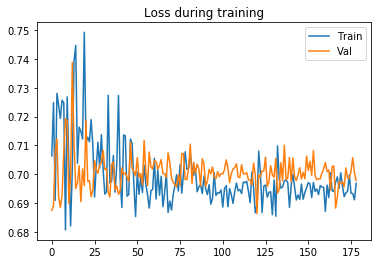

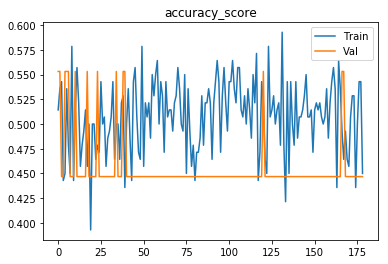

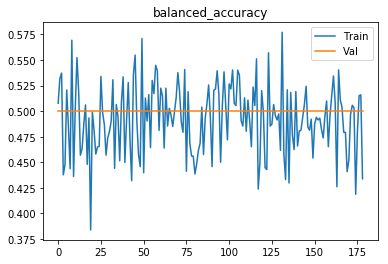

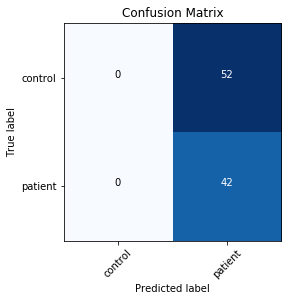

###### Starting inner fold 2
{'model': 'ModelLiu', 'batch_size': 4, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.74772
[0,     4] loss: 0.68182
[0,     6] loss: 0.73517
[0,     8] loss: 0.65916
[0,    10] loss: 0.81493
[0,    12] loss: 0.67050
[0,    14] loss: 0.70449
[0,    16] loss: 0.79773
[0,    18] loss: 0.71794
[0,    20] loss: 0.68118
[0,    22] loss: 0.75341
[0,    24] loss: 0.70549
[0,    26] loss: 0.72500
[0,    28] loss: 0.68271
[0,    30] loss: 0.76431
[0,    32] loss: 0.65235
[0,    34] loss: 0.68433
Time elapsed: 0h:0m:2s
train accuracy_score: 45.71 %
train balanced_accuracy: 43.82 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.697019
[1,     2] loss: 0.72408
[1,     4] loss: 0.70879
[1,     6] loss: 0.69679
[1,     8] loss: 0.75994
[1,    10] loss: 0.68036
[1,    12] loss: 0.71462
[1,    14] loss: 0.66202
[1,    16] loss: 0.67827
[1,    18] loss: 0.76300
[1,    20] loss: 0.69647
[1,    22] loss: 0.73719
[1, 

Time elapsed: 0h:0m:41s
train accuracy_score: 52.86 %
train balanced_accuracy: 52.21 %
val accuracy_score: 45.74 %
val balanced_accuracy: 50.27 %
Val loss: 0.713440
[14,     2] loss: 0.73322
[14,     4] loss: 0.70292
[14,     6] loss: 0.64894
[14,     8] loss: 0.70015
[14,    10] loss: 0.58051
[14,    12] loss: 0.63284
[14,    14] loss: 0.70380
[14,    16] loss: 0.64075
[14,    18] loss: 0.75148
[14,    20] loss: 0.69266
[14,    22] loss: 0.79255
[14,    24] loss: 0.62533
[14,    26] loss: 0.72180
[14,    28] loss: 0.62655
[14,    30] loss: 0.63489
[14,    32] loss: 0.72649
[14,    34] loss: 0.77942
Time elapsed: 0h:0m:44s
train accuracy_score: 56.43 %
train balanced_accuracy: 55.67 %
val accuracy_score: 54.26 %
val balanced_accuracy: 57.74 %
Val loss: 0.695122
[15,     2] loss: 0.76858
[15,     4] loss: 0.71013
[15,     6] loss: 0.66291
[15,     8] loss: 0.75270
[15,    10] loss: 0.60899
[15,    12] loss: 0.60540
[15,    14] loss: 0.59329
[15,    16] loss: 0.75182
[15,    18] loss: 0.

[27,    16] loss: 0.70812
[27,    18] loss: 0.70527
[27,    20] loss: 0.67377
[27,    22] loss: 0.73669
[27,    24] loss: 0.69440
[27,    26] loss: 0.74078
[27,    28] loss: 0.70499
[27,    30] loss: 0.62177
[27,    32] loss: 0.60763
[27,    34] loss: 0.72353
Time elapsed: 0h:1m:23s
train accuracy_score: 52.86 %
train balanced_accuracy: 50.66 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.698281
[28,     2] loss: 0.73450
[28,     4] loss: 0.58238
[28,     6] loss: 0.83193
[28,     8] loss: 0.65084
[28,    10] loss: 0.70966
[28,    12] loss: 0.68623
[28,    14] loss: 0.67341
[28,    16] loss: 0.63587
[28,    18] loss: 0.67168
[28,    20] loss: 0.69994
[28,    22] loss: 0.71878
[28,    24] loss: 0.70433
[28,    26] loss: 0.72146
[28,    28] loss: 0.67510
[28,    30] loss: 0.69095
[28,    32] loss: 0.72058
[28,    34] loss: 0.71866
Time elapsed: 0h:1m:26s
train accuracy_score: 52.14 %
train balanced_accuracy: 50.88 %
val accuracy_score: 44.68 %
val balanced_accur

val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.698104
[41,     2] loss: 0.65995
[41,     4] loss: 0.64970
[41,     6] loss: 0.70918
[41,     8] loss: 0.70818
[41,    10] loss: 0.68274
[41,    12] loss: 0.69156
[41,    14] loss: 0.69496
[41,    16] loss: 0.84570
[41,    18] loss: 0.78089
[41,    20] loss: 0.67068
[41,    22] loss: 0.69910
[41,    24] loss: 0.72683
[41,    26] loss: 0.65151
[41,    28] loss: 0.69522
[41,    30] loss: 0.65607
[41,    32] loss: 0.68524
[41,    34] loss: 0.73061
Time elapsed: 0h:2m:6s
train accuracy_score: 51.43 %
train balanced_accuracy: 49.80 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.703977
[42,     2] loss: 0.69543
[42,     4] loss: 0.74322
[42,     6] loss: 0.64216
[42,     8] loss: 0.68710
[42,    10] loss: 0.73349
[42,    12] loss: 0.66883
[42,    14] loss: 0.71025
[42,    16] loss: 0.66975
[42,    18] loss: 0.72180
[42,    20] loss: 0.57488
[42,    22] loss: 0.71499
[42,    24] loss: 0.81483
[42,

[54,    26] loss: 0.72084
[54,    28] loss: 0.72668
[54,    30] loss: 0.71630
[54,    32] loss: 0.70903
[54,    34] loss: 0.68802
Time elapsed: 0h:2m:45s
train accuracy_score: 47.14 %
train balanced_accuracy: 45.00 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.706023
[55,     2] loss: 0.69013
[55,     4] loss: 0.68673
[55,     6] loss: 0.71117
[55,     8] loss: 0.66417
[55,    10] loss: 0.72215
[55,    12] loss: 0.62310
[55,    14] loss: 0.64751
[55,    16] loss: 0.68390
[55,    18] loss: 0.73356
[55,    20] loss: 0.64814
[55,    22] loss: 0.77937
[55,    24] loss: 0.70113
[55,    26] loss: 0.66526
[55,    28] loss: 0.70775
[55,    30] loss: 0.69816
[55,    32] loss: 0.65488
[55,    34] loss: 0.67531
Time elapsed: 0h:2m:48s
train accuracy_score: 51.43 %
train balanced_accuracy: 48.89 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.705048
[56,     2] loss: 0.73341
[56,     4] loss: 0.65608
[56,     6] loss: 0.73229
[56,     8] loss: 0.

[68,    12] loss: 0.70412
[68,    14] loss: 0.65409
[68,    16] loss: 0.75426
[68,    18] loss: 0.68955
[68,    20] loss: 0.71055
[68,    22] loss: 0.63352
[68,    24] loss: 0.72617
[68,    26] loss: 0.69346
[68,    28] loss: 0.69117
[68,    30] loss: 0.65363
[68,    32] loss: 0.69158
[68,    34] loss: 0.68914
Time elapsed: 0h:3m:29s
train accuracy_score: 50.00 %
train balanced_accuracy: 49.75 %
val accuracy_score: 46.81 %
val balanced_accuracy: 44.83 %
Val loss: 0.714884
[69,     2] loss: 0.67536
[69,     4] loss: 0.67227
[69,     6] loss: 0.70312
[69,     8] loss: 0.67357
[69,    10] loss: 0.70338
[69,    12] loss: 0.65403
[69,    14] loss: 0.61600
[69,    16] loss: 0.71967
[69,    18] loss: 0.63489
[69,    20] loss: 0.67908
[69,    22] loss: 0.74706
[69,    24] loss: 0.67949
[69,    26] loss: 0.75517
[69,    28] loss: 0.66987
[69,    30] loss: 0.67465
[69,    32] loss: 0.66741
[69,    34] loss: 0.74374
Time elapsed: 0h:3m:31s
train accuracy_score: 54.29 %
train balanced_accuracy: 55

Time elapsed: 0h:4m:8s
train accuracy_score: 50.00 %
train balanced_accuracy: 47.87 %
val accuracy_score: 53.19 %
val balanced_accuracy: 57.69 %
Val loss: 0.697385
[82,     2] loss: 0.69126
[82,     4] loss: 0.74665
[82,     6] loss: 0.71610
[82,     8] loss: 0.67719
[82,    10] loss: 0.69206
[82,    12] loss: 0.66128
[82,    14] loss: 0.66384
[82,    16] loss: 0.69368
[82,    18] loss: 0.65293
[82,    20] loss: 0.67083
[82,    22] loss: 0.71746
[82,    24] loss: 0.68163
[82,    26] loss: 0.65864
[82,    28] loss: 0.68316
[82,    30] loss: 0.74098
[82,    32] loss: 0.70399
[82,    34] loss: 0.68654
Time elapsed: 0h:4m:10s
train accuracy_score: 57.86 %
train balanced_accuracy: 55.71 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.701259
[83,     2] loss: 0.70129
[83,     4] loss: 0.65570
[83,     6] loss: 0.66307
[83,     8] loss: 0.67222
[83,    10] loss: 0.73143
[83,    12] loss: 0.71519
[83,    14] loss: 0.65644
[83,    16] loss: 0.79459
[83,    18] loss: 0.7

[95,    20] loss: 0.68667
[95,    22] loss: 0.66977
[95,    24] loss: 0.66880
[95,    26] loss: 0.69133
[95,    28] loss: 0.67191
[95,    30] loss: 0.66326
[95,    32] loss: 0.71265
[95,    34] loss: 0.71142
Time elapsed: 0h:4m:50s
train accuracy_score: 54.29 %
train balanced_accuracy: 52.50 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.698064
[96,     2] loss: 0.71700
[96,     4] loss: 0.69024
[96,     6] loss: 0.70465
[96,     8] loss: 0.67724
[96,    10] loss: 0.69159
[96,    12] loss: 0.70445
[96,    14] loss: 0.71445
[96,    16] loss: 0.70213
[96,    18] loss: 0.67680
[96,    20] loss: 0.66164
[96,    22] loss: 0.69670
[96,    24] loss: 0.66329
[96,    26] loss: 0.65953
[96,    28] loss: 0.66462
[96,    30] loss: 0.73382
[96,    32] loss: 0.69265
[96,    34] loss: 0.66886
Time elapsed: 0h:4m:53s
train accuracy_score: 54.29 %
train balanced_accuracy: 53.24 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.701433
[97,     2] loss: 0.

[108,    34] loss: 0.67550
Time elapsed: 0h:5m:30s
train accuracy_score: 53.57 %
train balanced_accuracy: 51.25 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.700676
[109,     2] loss: 0.71000
[109,     4] loss: 0.70438
[109,     6] loss: 0.70249
[109,     8] loss: 0.68377
[109,    10] loss: 0.75412
[109,    12] loss: 0.66544
[109,    14] loss: 0.67458
[109,    16] loss: 0.70357
[109,    18] loss: 0.69695
[109,    20] loss: 0.71379
[109,    22] loss: 0.70820
[109,    24] loss: 0.67375
[109,    26] loss: 0.68434
[109,    28] loss: 0.71484
[109,    30] loss: 0.70403
[109,    32] loss: 0.67239
[109,    34] loss: 0.70558
Time elapsed: 0h:5m:33s
train accuracy_score: 48.57 %
train balanced_accuracy: 46.60 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.701468
[110,     2] loss: 0.67780
[110,     4] loss: 0.72492
[110,     6] loss: 0.65282
[110,     8] loss: 0.66869
[110,    10] loss: 0.68806
[110,    12] loss: 0.73859
[110,    14] loss: 0.7

val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.700265
[122,     2] loss: 0.70282
[122,     4] loss: 0.68918
[122,     6] loss: 0.69437
[122,     8] loss: 0.73546
[122,    10] loss: 0.69530
[122,    12] loss: 0.69346
[122,    14] loss: 0.67508
[122,    16] loss: 0.68218
[122,    18] loss: 0.66075
[122,    20] loss: 0.68667
[122,    22] loss: 0.70491
[122,    24] loss: 0.68888
[122,    26] loss: 0.68428
[122,    28] loss: 0.68307
[122,    30] loss: 0.71098
[122,    32] loss: 0.68778
[122,    34] loss: 0.67409
Time elapsed: 0h:6m:15s
train accuracy_score: 52.14 %
train balanced_accuracy: 49.49 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.702459
[123,     2] loss: 0.68555
[123,     4] loss: 0.66935
[123,     6] loss: 0.68974
[123,     8] loss: 0.65045
[123,    10] loss: 0.73300
[123,    12] loss: 0.70125
[123,    14] loss: 0.66545
[123,    16] loss: 0.69451
[123,    18] loss: 0.72323
[123,    20] loss: 0.63979
[123,    22] loss: 0.69019
[

[135,    10] loss: 0.63661
[135,    12] loss: 0.70450
[135,    14] loss: 0.74251
[135,    16] loss: 0.76848
[135,    18] loss: 0.65938
[135,    20] loss: 0.64206
[135,    22] loss: 0.72432
[135,    24] loss: 0.71595
[135,    26] loss: 0.68877
[135,    28] loss: 0.71825
[135,    30] loss: 0.70355
[135,    32] loss: 0.68884
[135,    34] loss: 0.69608
Time elapsed: 0h:6m:57s
train accuracy_score: 52.14 %
train balanced_accuracy: 49.32 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.699775
[136,     2] loss: 0.69650
[136,     4] loss: 0.71092
[136,     6] loss: 0.70759
[136,     8] loss: 0.68449
[136,    10] loss: 0.67385
[136,    12] loss: 0.72220
[136,    14] loss: 0.70002
[136,    16] loss: 0.68758
[136,    18] loss: 0.67189
[136,    20] loss: 0.67081
[136,    22] loss: 0.71308
[136,    24] loss: 0.70701
[136,    26] loss: 0.65943
[136,    28] loss: 0.69346
[136,    30] loss: 0.66290
[136,    32] loss: 0.69827
[136,    34] loss: 0.72132
Time elapsed: 0h:7m:0s
tr

[148,    18] loss: 0.69472
[148,    20] loss: 0.66811
[148,    22] loss: 0.64040
[148,    24] loss: 0.66356
[148,    26] loss: 0.75418
[148,    28] loss: 0.66495
[148,    30] loss: 0.68455
[148,    32] loss: 0.74268
[148,    34] loss: 0.77328
Time elapsed: 0h:7m:38s
train accuracy_score: 53.57 %
train balanced_accuracy: 50.84 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.711857
[149,     2] loss: 0.71420
[149,     4] loss: 0.69049
[149,     6] loss: 0.68522
[149,     8] loss: 0.72652
[149,    10] loss: 0.67625
[149,    12] loss: 0.67342
[149,    14] loss: 0.66565
[149,    16] loss: 0.65369
[149,    18] loss: 0.67760
[149,    20] loss: 0.68722
[149,    22] loss: 0.69495
[149,    24] loss: 0.64365
[149,    26] loss: 0.73324
[149,    28] loss: 0.67443
[149,    30] loss: 0.74763
[149,    32] loss: 0.69650
[149,    34] loss: 0.76291
Time elapsed: 0h:7m:41s
train accuracy_score: 52.86 %
train balanced_accuracy: 50.00 %
val accuracy_score: 44.68 %
val balanced_accur

[161,    34] loss: 0.66820
Time elapsed: 0h:8m:17s
train accuracy_score: 52.86 %
train balanced_accuracy: 50.08 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.698820
[162,     2] loss: 0.68138
[162,     4] loss: 0.72776
[162,     6] loss: 0.70193
[162,     8] loss: 0.67920
[162,    10] loss: 0.69852
[162,    12] loss: 0.68375
[162,    14] loss: 0.69005
[162,    16] loss: 0.66446
[162,    18] loss: 0.71061
[162,    20] loss: 0.71836
[162,    22] loss: 0.67120
[162,    24] loss: 0.69178
[162,    26] loss: 0.66907
[162,    28] loss: 0.71964
[162,    30] loss: 0.74837
[162,    32] loss: 0.69205
[162,    34] loss: 0.64755
Time elapsed: 0h:8m:20s
train accuracy_score: 52.14 %
train balanced_accuracy: 49.49 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.700568
[163,     2] loss: 0.68657
[163,     4] loss: 0.71850
[163,     6] loss: 0.68303
[163,     8] loss: 0.67837
[163,    10] loss: 0.66347
[163,    12] loss: 0.71648
[163,    14] loss: 0.6

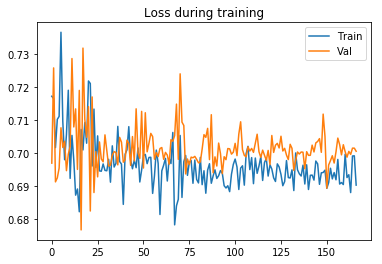

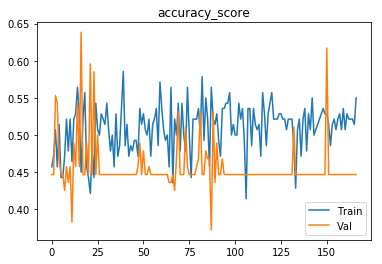

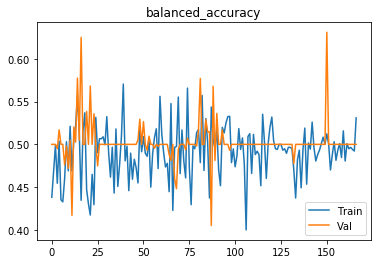

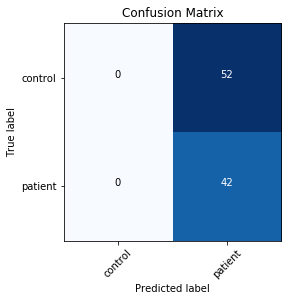

###### Starting inner fold 3
{'model': 'ModelLiu', 'batch_size': 12, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.71840
[0,     4] loss: 0.69933
[0,     6] loss: 0.70074
[0,     8] loss: 0.71256
[0,    10] loss: 0.70171
Time elapsed: 0h:0m:2s
train accuracy_score: 53.57 %
train balanced_accuracy: 52.56 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.697313
[1,     2] loss: 0.70815
[1,     4] loss: 0.69339
[1,     6] loss: 0.69234
[1,     8] loss: 0.69327
[1,    10] loss: 0.66951
Time elapsed: 0h:0m:5s
train accuracy_score: 53.57 %
train balanced_accuracy: 52.23 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.737538
[2,     2] loss: 0.68543
[2,     4] loss: 0.66890
[2,     6] loss: 0.73203
[2,     8] loss: 0.68388
[2,    10] loss: 0.69583
Time elapsed: 0h:0m:8s
train accuracy_score: 53.57 %
train balanced_accuracy: 50.84 %
val accuracy_score: 46.81 %
val balanced_accuracy: 51.92 %
Val loss: 0.694108


val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.707267
[28,     2] loss: 0.69927
[28,     4] loss: 0.71062
[28,     6] loss: 0.71928
[28,     8] loss: 0.64980
[28,    10] loss: 0.67890
Time elapsed: 0h:1m:26s
train accuracy_score: 52.14 %
train balanced_accuracy: 51.78 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.696145
[29,     2] loss: 0.68454
[29,     4] loss: 0.74571
[29,     6] loss: 0.68732
[29,     8] loss: 0.72075
[29,    10] loss: 0.69429
Time elapsed: 0h:1m:29s
train accuracy_score: 50.71 %
train balanced_accuracy: 49.61 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.708926
[30,     2] loss: 0.73490
[30,     4] loss: 0.65844
[30,     6] loss: 0.69832
[30,     8] loss: 0.64341
[30,    10] loss: 0.73130
Time elapsed: 0h:1m:33s
train accuracy_score: 52.86 %
train balanced_accuracy: 51.23 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.707477
[31,     2] loss: 0.72903
[31,     4]

val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.706916
[56,     2] loss: 0.73048
[56,     4] loss: 0.71622
[56,     6] loss: 0.68827
[56,     8] loss: 0.69127
[56,    10] loss: 0.68061
Time elapsed: 0h:2m:52s
train accuracy_score: 51.43 %
train balanced_accuracy: 50.04 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.699176
[57,     2] loss: 0.70443
[57,     4] loss: 0.70522
[57,     6] loss: 0.69415
[57,     8] loss: 0.70768
[57,    10] loss: 0.74551
Time elapsed: 0h:2m:55s
train accuracy_score: 42.86 %
train balanced_accuracy: 41.36 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.694816
[58,     2] loss: 0.69049
[58,     4] loss: 0.67499
[58,     6] loss: 0.68737
[58,     8] loss: 0.69492
[58,    10] loss: 0.69445
Time elapsed: 0h:2m:58s
train accuracy_score: 53.57 %
train balanced_accuracy: 52.23 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.701067
[59,     2] loss: 0.70055
[59,     4]

val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.697369
[84,     2] loss: 0.69387
[84,     4] loss: 0.67784
[84,     6] loss: 0.68267
[84,     8] loss: 0.67852
[84,    10] loss: 0.69915
Time elapsed: 0h:4m:17s
train accuracy_score: 57.14 %
train balanced_accuracy: 56.02 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.704792
[85,     2] loss: 0.68085
[85,     4] loss: 0.68898
[85,     6] loss: 0.70053
[85,     8] loss: 0.71318
[85,    10] loss: 0.70827
Time elapsed: 0h:4m:20s
train accuracy_score: 52.14 %
train balanced_accuracy: 49.73 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.707056
[86,     2] loss: 0.69824
[86,     4] loss: 0.69595
[86,     6] loss: 0.71536
[86,     8] loss: 0.71351
[86,    10] loss: 0.67220
Time elapsed: 0h:4m:23s
train accuracy_score: 47.86 %
train balanced_accuracy: 46.09 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.699440
[87,     2] loss: 0.70796
[87,     4]

[111,    10] loss: 0.69823
Time elapsed: 0h:5m:40s
train accuracy_score: 52.86 %
train balanced_accuracy: 50.90 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.700924
[112,     2] loss: 0.69041
[112,     4] loss: 0.67865
[112,     6] loss: 0.70199
[112,     8] loss: 0.67333
[112,    10] loss: 0.70760
Time elapsed: 0h:5m:43s
train accuracy_score: 52.86 %
train balanced_accuracy: 50.57 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.702838
[113,     2] loss: 0.69903
[113,     4] loss: 0.68003
[113,     6] loss: 0.70349
[113,     8] loss: 0.69557
[113,    10] loss: 0.68071
Time elapsed: 0h:5m:46s
train accuracy_score: 48.57 %
train balanced_accuracy: 46.85 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.698446
[114,     2] loss: 0.69562
[114,     4] loss: 0.70871
[114,     6] loss: 0.70384
[114,     8] loss: 0.69797
[114,    10] loss: 0.68096
Time elapsed: 0h:5m:50s
train accuracy_score: 49.29 %
train balanced_accu

val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.695621
[139,     2] loss: 0.69435
[139,     4] loss: 0.68893
[139,     6] loss: 0.69499
[139,     8] loss: 0.72595
[139,    10] loss: 0.67890
Time elapsed: 0h:7m:8s
train accuracy_score: 49.29 %
train balanced_accuracy: 47.77 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.700108
[140,     2] loss: 0.69788
[140,     4] loss: 0.69318
[140,     6] loss: 0.72170
[140,     8] loss: 0.68434
[140,    10] loss: 0.68492
Time elapsed: 0h:7m:11s
train accuracy_score: 54.29 %
train balanced_accuracy: 52.09 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.701849
[141,     2] loss: 0.69561
[141,     4] loss: 0.66966
[141,     6] loss: 0.70682
[141,     8] loss: 0.69045
[141,    10] loss: 0.68677
Time elapsed: 0h:7m:14s
train accuracy_score: 54.29 %
train balanced_accuracy: 52.17 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.700717
[142,     2] loss: 0.68

[166,     4] loss: 0.69749
[166,     6] loss: 0.67043
[166,     8] loss: 0.69955
[166,    10] loss: 0.66186
Time elapsed: 0h:8m:29s
train accuracy_score: 50.71 %
train balanced_accuracy: 48.79 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.701721
[167,     2] loss: 0.66493
[167,     4] loss: 0.70849
[167,     6] loss: 0.68892
[167,     8] loss: 0.70350
[167,    10] loss: 0.71338
Time elapsed: 0h:8m:33s
train accuracy_score: 55.00 %
train balanced_accuracy: 52.35 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.703167
[168,     2] loss: 0.69909
[168,     4] loss: 0.69474
[168,     6] loss: 0.70113
[168,     8] loss: 0.67819
[168,    10] loss: 0.70169
Time elapsed: 0h:8m:36s
train accuracy_score: 49.29 %
train balanced_accuracy: 47.36 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.699428
[169,     2] loss: 0.69690
[169,     4] loss: 0.70588
[169,     6] loss: 0.68561
[169,     8] loss: 0.71499
[169,    10] loss: 

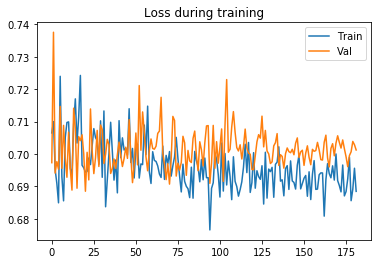

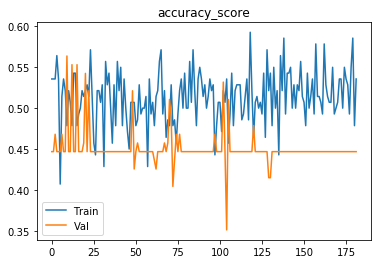

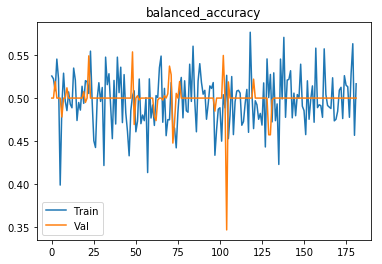

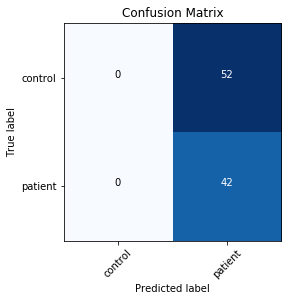

###### Starting inner fold 4
{'model': 'ModelLiu', 'batch_size': 12, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.70558
[0,     4] loss: 0.69824
[0,     6] loss: 0.69887
[0,     8] loss: 0.69555
[0,    10] loss: 0.70451
Time elapsed: 0h:0m:2s
train accuracy_score: 47.14 %
train balanced_accuracy: 46.64 %
val accuracy_score: 43.62 %
val balanced_accuracy: 48.58 %
Val loss: 0.695678
[1,     2] loss: 0.70449
[1,     4] loss: 0.73063
[1,     6] loss: 0.68661
[1,     8] loss: 0.72520
[1,    10] loss: 0.68175
Time elapsed: 0h:0m:5s
train accuracy_score: 50.00 %
train balanced_accuracy: 49.84 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.700627
[2,     2] loss: 0.71037
[2,     4] loss: 0.71172
[2,     6] loss: 0.74077
[2,     8] loss: 0.69811
[2,    10] loss: 0.66859
Time elapsed: 0h:0m:8s
train accuracy_score: 49.29 %
train balanced_accuracy: 49.08 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.713645


val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.696787
[28,     2] loss: 0.70267
[28,     4] loss: 0.65462
[28,     6] loss: 0.71624
[28,     8] loss: 0.70526
[28,    10] loss: 0.70509
Time elapsed: 0h:1m:26s
train accuracy_score: 51.43 %
train balanced_accuracy: 50.29 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.701868
[29,     2] loss: 0.70722
[29,     4] loss: 0.72360
[29,     6] loss: 0.71210
[29,     8] loss: 0.67911
[29,    10] loss: 0.69137
Time elapsed: 0h:1m:30s
train accuracy_score: 52.14 %
train balanced_accuracy: 51.13 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.702782
[30,     2] loss: 0.69043
[30,     4] loss: 0.73930
[30,     6] loss: 0.68701
[30,     8] loss: 0.70540
[30,    10] loss: 0.70652
Time elapsed: 0h:1m:33s
train accuracy_score: 51.43 %
train balanced_accuracy: 50.45 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.699526
[31,     2] loss: 0.69397
[31,     4]

val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.704742
[56,     2] loss: 0.66521
[56,     4] loss: 0.69956
[56,     6] loss: 0.67353
[56,     8] loss: 0.70544
[56,    10] loss: 0.69286
Time elapsed: 0h:2m:53s
train accuracy_score: 53.57 %
train balanced_accuracy: 52.40 %
val accuracy_score: 56.38 %
val balanced_accuracy: 51.65 %
Val loss: 0.692135
[57,     2] loss: 0.71427
[57,     4] loss: 0.66525
[57,     6] loss: 0.69430
[57,     8] loss: 0.71604
[57,    10] loss: 0.71995
Time elapsed: 0h:2m:56s
train accuracy_score: 50.00 %
train balanced_accuracy: 51.15 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.702916
[58,     2] loss: 0.72877
[58,     4] loss: 0.68925
[58,     6] loss: 0.69618
[58,     8] loss: 0.67433
[58,    10] loss: 0.71158
Time elapsed: 0h:2m:59s
train accuracy_score: 47.14 %
train balanced_accuracy: 45.66 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.708200
[59,     2] loss: 0.69480
[59,     4]

val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.699005
[84,     2] loss: 0.68403
[84,     4] loss: 0.69709
[84,     6] loss: 0.69074
[84,     8] loss: 0.69476
[84,    10] loss: 0.70833
Time elapsed: 0h:4m:16s
train accuracy_score: 52.86 %
train balanced_accuracy: 51.31 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.704553
[85,     2] loss: 0.69142
[85,     4] loss: 0.68321
[85,     6] loss: 0.63685
[85,     8] loss: 0.70942
[85,    10] loss: 0.72343
Time elapsed: 0h:4m:19s
train accuracy_score: 51.43 %
train balanced_accuracy: 49.71 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.706967
[86,     2] loss: 0.69630
[86,     4] loss: 0.72938
[86,     6] loss: 0.72350
[86,     8] loss: 0.68537
[86,    10] loss: 0.70226
Time elapsed: 0h:4m:23s
train accuracy_score: 55.71 %
train balanced_accuracy: 53.60 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.705380
[87,     2] loss: 0.68349
[87,     4]

[111,    10] loss: 0.70020
Time elapsed: 0h:5m:41s
train accuracy_score: 55.00 %
train balanced_accuracy: 53.42 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.703562
[112,     2] loss: 0.69443
[112,     4] loss: 0.70931
[112,     6] loss: 0.68427
[112,     8] loss: 0.66118
[112,    10] loss: 0.70716
Time elapsed: 0h:5m:44s
train accuracy_score: 51.43 %
train balanced_accuracy: 49.14 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.706450
[113,     2] loss: 0.69176
[113,     4] loss: 0.67663
[113,     6] loss: 0.69883
[113,     8] loss: 0.67978
[113,    10] loss: 0.69055
Time elapsed: 0h:5m:47s
train accuracy_score: 52.14 %
train balanced_accuracy: 50.72 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.702312
[114,     2] loss: 0.70100
[114,     4] loss: 0.67959
[114,     6] loss: 0.69749
[114,     8] loss: 0.68584
[114,    10] loss: 0.70036
Time elapsed: 0h:5m:50s
train accuracy_score: 49.29 %
train balanced_accu

val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.698029
[139,     2] loss: 0.70663
[139,     4] loss: 0.66914
[139,     6] loss: 0.72301
[139,     8] loss: 0.70534
[139,    10] loss: 0.72148
Time elapsed: 0h:7m:7s
train accuracy_score: 45.00 %
train balanced_accuracy: 43.22 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.700494
[140,     2] loss: 0.68477
[140,     4] loss: 0.69004
[140,     6] loss: 0.69644
[140,     8] loss: 0.70209
[140,    10] loss: 0.67503
Time elapsed: 0h:7m:10s
train accuracy_score: 57.86 %
train balanced_accuracy: 56.12 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.698623
[141,     2] loss: 0.68792
[141,     4] loss: 0.70263
[141,     6] loss: 0.70677
[141,     8] loss: 0.68833
[141,    10] loss: 0.68416
Time elapsed: 0h:7m:13s
train accuracy_score: 52.86 %
train balanced_accuracy: 51.31 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.698227
[142,     2] loss: 0.69

[166,     4] loss: 0.69480
[166,     6] loss: 0.69120
[166,     8] loss: 0.68004
[166,    10] loss: 0.70424
Time elapsed: 0h:8m:27s
train accuracy_score: 54.29 %
train balanced_accuracy: 52.50 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.696085
[167,     2] loss: 0.67258
[167,     4] loss: 0.68805
[167,     6] loss: 0.69969
[167,     8] loss: 0.68167
[167,    10] loss: 0.70390
Time elapsed: 0h:8m:30s
train accuracy_score: 54.29 %
train balanced_accuracy: 53.81 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.694535
[168,     2] loss: 0.68501
[168,     4] loss: 0.69026
[168,     6] loss: 0.68059
[168,     8] loss: 0.69125
[168,    10] loss: 0.69934
Time elapsed: 0h:8m:33s
train accuracy_score: 54.29 %
train balanced_accuracy: 53.48 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.698569
[169,     2] loss: 0.69598
[169,     4] loss: 0.68717
[169,     6] loss: 0.69319
[169,     8] loss: 0.67919
[169,    10] loss: 

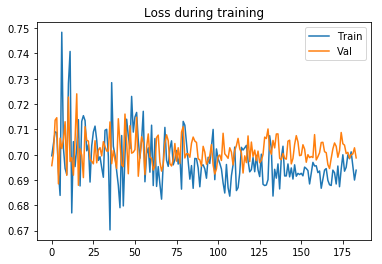

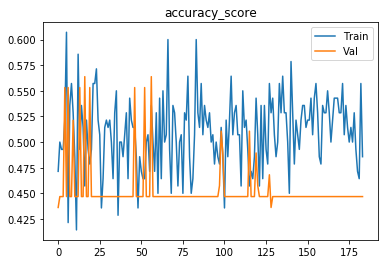

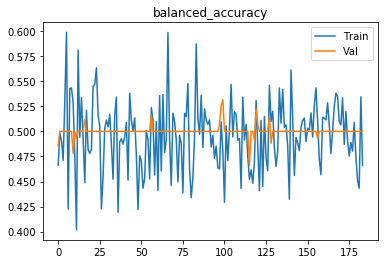

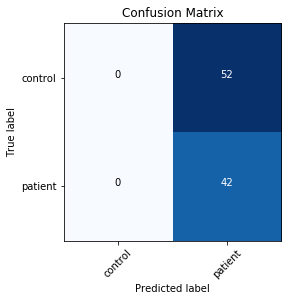

Finished outer fold.
{'final_acc': 0.5, 'best_acc': 0.5, 'final_iter': 172, 'best_iter': 138, 'params': {'model': 'ModelLiu', 'batch_size': 6, 'patience': 16, 'lr': 0.001}, 'inner_fold_idx': 0}
###### Starting outer fold 8
# of patients 118, # of healthy controls 119
138
99
###### Starting inner fold 0
{'model': 'ModelLiu', 'batch_size': 12, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.70715
[0,     4] loss: 0.69300
[0,     6] loss: 0.75570
[0,     8] loss: 0.68616
[0,    10] loss: 0.70596
Time elapsed: 0h:0m:2s
train accuracy_score: 52.17 %
train balanced_accuracy: 48.79 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.710597
[1,     2] loss: 0.66813
[1,     4] loss: 0.75305
[1,     6] loss: 0.68740
[1,     8] loss: 0.65619
[1,    10] loss: 0.69890
Time elapsed: 0h:0m:6s
train accuracy_score: 57.25 %
train balanced_accuracy: 51.93 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.774860
[2,     2] los

val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.741507
[27,     2] loss: 0.73713
[27,     4] loss: 0.61307
[27,     6] loss: 0.69894
[27,     8] loss: 0.69345
[27,    10] loss: 0.64580
Time elapsed: 0h:1m:26s
train accuracy_score: 57.97 %
train balanced_accuracy: 52.78 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.744068
[28,     2] loss: 0.68727
[28,     4] loss: 0.71460
[28,     6] loss: 0.69093
[28,     8] loss: 0.66827
[28,    10] loss: 0.68275
Time elapsed: 0h:1m:29s
train accuracy_score: 58.70 %
train balanced_accuracy: 53.20 %
val accuracy_score: 37.37 %
val balanced_accuracy: 47.44 %
Val loss: 0.774516
[29,     2] loss: 0.65747
[29,     4] loss: 0.67804
[29,     6] loss: 0.68343
[29,     8] loss: 0.79174
[29,    10] loss: 0.66115
Time elapsed: 0h:1m:32s
train accuracy_score: 59.42 %
train balanced_accuracy: 52.97 %
val accuracy_score: 40.40 %
val balanced_accuracy: 50.83 %
Val loss: 0.772737
[30,     2] loss: 0.68949
[30,     4]

val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.737220
[55,     2] loss: 0.63633
[55,     4] loss: 0.66669
[55,     6] loss: 0.64820
[55,     8] loss: 0.72989
[55,    10] loss: 0.74883
Time elapsed: 0h:2m:52s
train accuracy_score: 60.14 %
train balanced_accuracy: 53.60 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.761875
[56,     2] loss: 0.69300
[56,     4] loss: 0.68843
[56,     6] loss: 0.67184
[56,     8] loss: 0.62958
[56,    10] loss: 0.71729
Time elapsed: 0h:2m:55s
train accuracy_score: 54.35 %
train balanced_accuracy: 47.68 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.739112
[57,     2] loss: 0.70958
[57,     4] loss: 0.67947
[57,     6] loss: 0.69786
[57,     8] loss: 0.66528
[57,    10] loss: 0.69340
Time elapsed: 0h:2m:58s
train accuracy_score: 55.07 %
train balanced_accuracy: 49.39 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.722039
[58,     2] loss: 0.71883
[58,     4]

val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.726484
[83,     2] loss: 0.68587
[83,     4] loss: 0.69976
[83,     6] loss: 0.71424
[83,     8] loss: 0.69470
[83,    10] loss: 0.64628
Time elapsed: 0h:4m:17s
train accuracy_score: 52.90 %
train balanced_accuracy: 47.28 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.723893
[84,     2] loss: 0.69001
[84,     4] loss: 0.65583
[84,     6] loss: 0.69068
[84,     8] loss: 0.67185
[84,    10] loss: 0.62875
Time elapsed: 0h:4m:20s
train accuracy_score: 61.59 %
train balanced_accuracy: 55.08 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.738594
[85,     2] loss: 0.66468
[85,     4] loss: 0.72125
[85,     6] loss: 0.68594
[85,     8] loss: 0.71853
[85,    10] loss: 0.65215
Time elapsed: 0h:4m:22s
train accuracy_score: 55.80 %
train balanced_accuracy: 48.95 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.725293
[86,     2] loss: 0.65925
[86,     4]

Time elapsed: 0h:5m:40s
train accuracy_score: 60.87 %
train balanced_accuracy: 54.45 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.723008
[111,     2] loss: 0.69075
[111,     4] loss: 0.70398
[111,     6] loss: 0.68038
[111,     8] loss: 0.67811
[111,    10] loss: 0.71150
Time elapsed: 0h:5m:43s
train accuracy_score: 54.35 %
train balanced_accuracy: 48.11 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.730117
[112,     2] loss: 0.67290
[112,     4] loss: 0.66895
[112,     6] loss: 0.67108
[112,     8] loss: 0.66709
[112,    10] loss: 0.71388
Time elapsed: 0h:5m:46s
train accuracy_score: 58.70 %
train balanced_accuracy: 51.69 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.737545
[113,     2] loss: 0.69552
[113,     4] loss: 0.69277
[113,     6] loss: 0.67295
[113,     8] loss: 0.65320
[113,    10] loss: 0.71561
Time elapsed: 0h:5m:50s
train accuracy_score: 57.25 %
train balanced_accuracy: 50.21 %
val accuracy_

[138,     2] loss: 0.65413
[138,     4] loss: 0.69250
[138,     6] loss: 0.73544
[138,     8] loss: 0.68881
[138,    10] loss: 0.76141
Time elapsed: 0h:7m:7s
train accuracy_score: 57.25 %
train balanced_accuracy: 50.21 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.744831
[139,     2] loss: 0.67399
[139,     4] loss: 0.62338
[139,     6] loss: 0.65371
[139,     8] loss: 0.69377
[139,    10] loss: 0.75416
Time elapsed: 0h:7m:10s
train accuracy_score: 57.25 %
train balanced_accuracy: 50.00 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.740437
[140,     2] loss: 0.67374
[140,     4] loss: 0.70983
[140,     6] loss: 0.67636
[140,     8] loss: 0.69168
[140,    10] loss: 0.69352
Time elapsed: 0h:7m:13s
train accuracy_score: 56.52 %
train balanced_accuracy: 49.37 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.729514
[141,     2] loss: 0.67808
[141,     4] loss: 0.68168
[141,     6] loss: 0.67471
[141,     8] loss: 0

Time elapsed: 0h:8m:28s
train accuracy_score: 57.25 %
train balanced_accuracy: 50.00 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.725257
[166,     2] loss: 0.71480
[166,     4] loss: 0.68526
[166,     6] loss: 0.66568
[166,     8] loss: 0.68137
[166,    10] loss: 0.65597
Time elapsed: 0h:8m:31s
train accuracy_score: 57.25 %
train balanced_accuracy: 50.00 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.730460
[167,     2] loss: 0.69459
[167,     4] loss: 0.64310
[167,     6] loss: 0.69532
[167,     8] loss: 0.72964
[167,    10] loss: 0.69417
Time elapsed: 0h:8m:34s
train accuracy_score: 56.52 %
train balanced_accuracy: 49.37 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.734118
[168,     2] loss: 0.67933
[168,     4] loss: 0.70433
[168,     6] loss: 0.68324
[168,     8] loss: 0.70157
[168,    10] loss: 0.67584
Time elapsed: 0h:8m:37s
train accuracy_score: 57.25 %
train balanced_accuracy: 50.43 %
val accuracy_

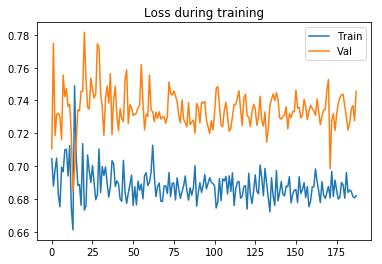

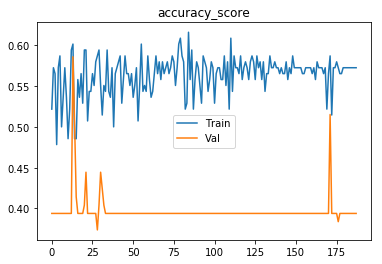

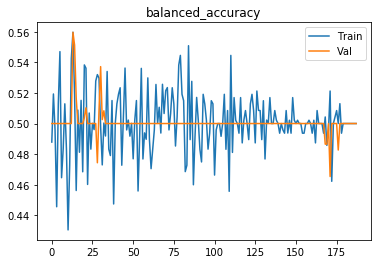

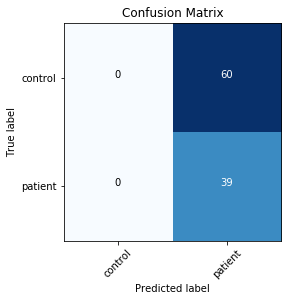

###### Starting inner fold 1
{'model': 'ModelLiu', 'batch_size': 6, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.69833
[0,     4] loss: 0.69771
[0,     6] loss: 0.70907
[0,     8] loss: 0.68417
[0,    10] loss: 0.66311
[0,    12] loss: 0.65189
[0,    14] loss: 0.67904
[0,    16] loss: 0.57795
[0,    18] loss: 0.83852
[0,    20] loss: 0.72238
[0,    22] loss: 0.70966
Time elapsed: 0h:0m:2s
train accuracy_score: 55.80 %
train balanced_accuracy: 49.38 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.731864
[1,     2] loss: 0.68099
[1,     4] loss: 0.66565
[1,     6] loss: 0.65103
[1,     8] loss: 0.69105
[1,    10] loss: 0.72497
[1,    12] loss: 0.65331
[1,    14] loss: 0.64749
[1,    16] loss: 0.63942
[1,    18] loss: 0.72261
[1,    20] loss: 0.82620
[1,    22] loss: 0.68578
Time elapsed: 0h:0m:5s
train accuracy_score: 57.25 %
train balanced_accuracy: 54.08 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss:

[18,     8] loss: 0.67151
[18,    10] loss: 0.75088
[18,    12] loss: 0.63853
[18,    14] loss: 0.72361
[18,    16] loss: 0.67291
[18,    18] loss: 0.75421
[18,    20] loss: 0.65609
[18,    22] loss: 0.71941
Time elapsed: 0h:0m:58s
train accuracy_score: 49.28 %
train balanced_accuracy: 44.75 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.717040
[19,     2] loss: 0.63870
[19,     4] loss: 0.63908
[19,     6] loss: 0.73961
[19,     8] loss: 0.71307
[19,    10] loss: 0.75120
[19,    12] loss: 0.72859
[19,    14] loss: 0.73119
[19,    16] loss: 0.71353
[19,    18] loss: 0.65340
[19,    20] loss: 0.68147
[19,    22] loss: 0.61178
Time elapsed: 0h:1m:1s
train accuracy_score: 55.80 %
train balanced_accuracy: 49.81 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.730851
[20,     2] loss: 0.71538
[20,     4] loss: 0.69736
[20,     6] loss: 0.68218
[20,     8] loss: 0.72305
[20,    10] loss: 0.68295
[20,    12] loss: 0.72813
[20,    14] loss: 0.6

[36,    16] loss: 0.74600
[36,    18] loss: 0.74146
[36,    20] loss: 0.67333
[36,    22] loss: 0.66866
Time elapsed: 0h:1m:52s
train accuracy_score: 57.25 %
train balanced_accuracy: 50.43 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.744637
[37,     2] loss: 0.64284
[37,     4] loss: 0.76433
[37,     6] loss: 0.75069
[37,     8] loss: 0.58011
[37,    10] loss: 0.68506
[37,    12] loss: 0.73459
[37,    14] loss: 0.76452
[37,    16] loss: 0.73089
[37,    18] loss: 0.76607
[37,    20] loss: 0.75228
[37,    22] loss: 0.66431
Time elapsed: 0h:1m:55s
train accuracy_score: 54.35 %
train balanced_accuracy: 47.47 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.739123
[38,     2] loss: 0.69499
[38,     4] loss: 0.69783
[38,     6] loss: 0.69411
[38,     8] loss: 0.66491
[38,    10] loss: 0.75296
[38,    12] loss: 0.68567
[38,    14] loss: 0.66754
[38,    16] loss: 0.63732
[38,    18] loss: 0.62617
[38,    20] loss: 0.68643
[38,    22] loss: 0.

Time elapsed: 0h:2m:47s
train accuracy_score: 57.25 %
train balanced_accuracy: 50.43 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.729524
[55,     2] loss: 0.68453
[55,     4] loss: 0.67186
[55,     6] loss: 0.72066
[55,     8] loss: 0.71844
[55,    10] loss: 0.70828
[55,    12] loss: 0.62403
[55,    14] loss: 0.76734
[55,    16] loss: 0.60619
[55,    18] loss: 0.72055
[55,    20] loss: 0.65768
[55,    22] loss: 0.66004
Time elapsed: 0h:2m:50s
train accuracy_score: 56.52 %
train balanced_accuracy: 49.58 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.721942
[56,     2] loss: 0.66950
[56,     4] loss: 0.73594
[56,     6] loss: 0.65498
[56,     8] loss: 0.73789
[56,    10] loss: 0.69213
[56,    12] loss: 0.73537
[56,    14] loss: 0.65875
[56,    16] loss: 0.70283
[56,    18] loss: 0.71986
[56,    20] loss: 0.69096
[56,    22] loss: 0.64073
Time elapsed: 0h:2m:54s
train accuracy_score: 55.07 %
train balanced_accuracy: 48.74 %
val accurac

val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.730937
[73,     2] loss: 0.71749
[73,     4] loss: 0.68328
[73,     6] loss: 0.68307
[73,     8] loss: 0.73855
[73,    10] loss: 0.63075
[73,    12] loss: 0.68263
[73,    14] loss: 0.73141
[73,    16] loss: 0.62131
[73,    18] loss: 0.69157
[73,    20] loss: 0.58864
[73,    22] loss: 0.69482
Time elapsed: 0h:3m:45s
train accuracy_score: 55.80 %
train balanced_accuracy: 48.73 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.731159
[74,     2] loss: 0.66046
[74,     4] loss: 0.69362
[74,     6] loss: 0.63304
[74,     8] loss: 0.69339
[74,    10] loss: 0.67482
[74,    12] loss: 0.66640
[74,    14] loss: 0.60805
[74,    16] loss: 0.72770
[74,    18] loss: 0.68426
[74,    20] loss: 0.72048
[74,    22] loss: 0.80804
Time elapsed: 0h:3m:48s
train accuracy_score: 57.25 %
train balanced_accuracy: 50.00 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.755928
[75,     2] loss: 0.

[91,     8] loss: 0.61025
[91,    10] loss: 0.71733
[91,    12] loss: 0.80164
[91,    14] loss: 0.75509
[91,    16] loss: 0.70033
[91,    18] loss: 0.67614
[91,    20] loss: 0.68357
[91,    22] loss: 0.69891
Time elapsed: 0h:4m:41s
train accuracy_score: 57.25 %
train balanced_accuracy: 50.00 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.735751
[92,     2] loss: 0.66769
[92,     4] loss: 0.66830
[92,     6] loss: 0.65017
[92,     8] loss: 0.70093
[92,    10] loss: 0.71557
[92,    12] loss: 0.69289
[92,    14] loss: 0.60442
[92,    16] loss: 0.72817
[92,    18] loss: 0.73091
[92,    20] loss: 0.73015
[92,    22] loss: 0.68973
Time elapsed: 0h:4m:44s
train accuracy_score: 57.25 %
train balanced_accuracy: 50.00 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.732693
[93,     2] loss: 0.71530
[93,     4] loss: 0.64874
[93,     6] loss: 0.72813
[93,     8] loss: 0.68763
[93,    10] loss: 0.68477
[93,    12] loss: 0.68454
[93,    14] loss: 0.

[109,     8] loss: 0.73316
[109,    10] loss: 0.68849
[109,    12] loss: 0.72465
[109,    14] loss: 0.66741
[109,    16] loss: 0.71889
[109,    18] loss: 0.66197
[109,    20] loss: 0.64438
[109,    22] loss: 0.68956
Time elapsed: 0h:5m:36s
train accuracy_score: 57.25 %
train balanced_accuracy: 50.00 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.732326
[110,     2] loss: 0.68727
[110,     4] loss: 0.73427
[110,     6] loss: 0.75655
[110,     8] loss: 0.75904
[110,    10] loss: 0.67611
[110,    12] loss: 0.71289
[110,    14] loss: 0.67352
[110,    16] loss: 0.63696
[110,    18] loss: 0.65465
[110,    20] loss: 0.67550
[110,    22] loss: 0.65647
Time elapsed: 0h:5m:40s
train accuracy_score: 57.25 %
train balanced_accuracy: 50.00 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.720587
[111,     2] loss: 0.66849
[111,     4] loss: 0.68857
[111,     6] loss: 0.67015
[111,     8] loss: 0.66881
[111,    10] loss: 0.68624
[111,    12] loss: 0.7

[127,     2] loss: 0.69614
[127,     4] loss: 0.70860
[127,     6] loss: 0.72327
[127,     8] loss: 0.67687
[127,    10] loss: 0.65268
[127,    12] loss: 0.67952
[127,    14] loss: 0.66072
[127,    16] loss: 0.65284
[127,    18] loss: 0.65502
[127,    20] loss: 0.69395
[127,    22] loss: 0.71772
Time elapsed: 0h:6m:31s
train accuracy_score: 57.25 %
train balanced_accuracy: 50.00 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.730610
[128,     2] loss: 0.67660
[128,     4] loss: 0.65006
[128,     6] loss: 0.68479
[128,     8] loss: 0.71042
[128,    10] loss: 0.67300
[128,    12] loss: 0.65443
[128,    14] loss: 0.64724
[128,    16] loss: 0.70632
[128,    18] loss: 0.69930
[128,    20] loss: 0.70471
[128,    22] loss: 0.75207
Time elapsed: 0h:6m:34s
train accuracy_score: 57.25 %
train balanced_accuracy: 50.00 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.740591
[129,     2] loss: 0.70486
[129,     4] loss: 0.73493
[129,     6] loss: 0.6

val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.735389
[145,     2] loss: 0.64745
[145,     4] loss: 0.74625
[145,     6] loss: 0.71088
[145,     8] loss: 0.72697
[145,    10] loss: 0.66097
[145,    12] loss: 0.68632
[145,    14] loss: 0.63651
[145,    16] loss: 0.67039
[145,    18] loss: 0.72122
[145,    20] loss: 0.63282
[145,    22] loss: 0.69402
Time elapsed: 0h:7m:27s
train accuracy_score: 57.25 %
train balanced_accuracy: 50.00 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.729960
[146,     2] loss: 0.73141
[146,     4] loss: 0.70518
[146,     6] loss: 0.64087
[146,     8] loss: 0.69094
[146,    10] loss: 0.68090
[146,    12] loss: 0.66841
[146,    14] loss: 0.70801
[146,    16] loss: 0.71314
[146,    18] loss: 0.63346
[146,    20] loss: 0.68623
[146,    22] loss: 0.64465
Time elapsed: 0h:7m:30s
train accuracy_score: 57.25 %
train balanced_accuracy: 50.00 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.73571

Time elapsed: 0h:8m:19s
train accuracy_score: 57.25 %
train balanced_accuracy: 50.00 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.734504
[163,     2] loss: 0.65417
[163,     4] loss: 0.70866
[163,     6] loss: 0.62413
[163,     8] loss: 0.59257
[163,    10] loss: 0.70937
[163,    12] loss: 0.75231
[163,    14] loss: 0.77564
[163,    16] loss: 0.71059
[163,    18] loss: 0.65417
[163,    20] loss: 0.65110
[163,    22] loss: 0.67157
Time elapsed: 0h:8m:22s
train accuracy_score: 57.25 %
train balanced_accuracy: 50.00 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.735009
[164,     2] loss: 0.67800
[164,     4] loss: 0.64436
[164,     6] loss: 0.67933
[164,     8] loss: 0.73320
[164,    10] loss: 0.75991
[164,    12] loss: 0.69523
[164,    14] loss: 0.66916
[164,    16] loss: 0.66944
[164,    18] loss: 0.66950
[164,    20] loss: 0.67099
[164,    22] loss: 0.67132
Time elapsed: 0h:8m:25s
train accuracy_score: 57.25 %
train balanced_accurac

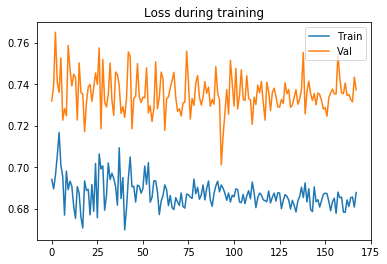

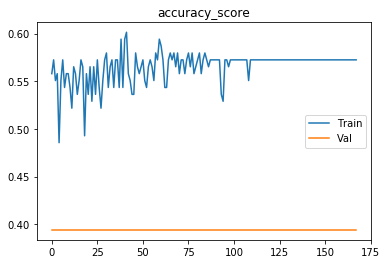

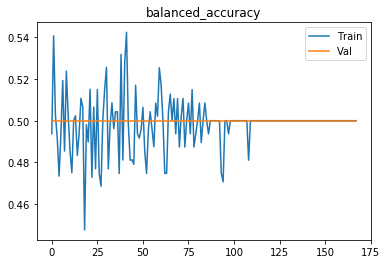

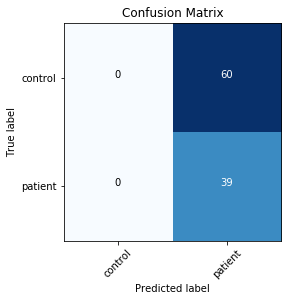

###### Starting inner fold 2
{'model': 'ModelLiu', 'batch_size': 6, 'patience': 12, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.70784
[0,     4] loss: 0.68170
[0,     6] loss: 0.59289
[0,     8] loss: 0.75484
[0,    10] loss: 0.70344
[0,    12] loss: 0.69268
[0,    14] loss: 0.66910
[0,    16] loss: 0.68803
[0,    18] loss: 0.61580
[0,    20] loss: 0.77683
[0,    22] loss: 0.72130
Time elapsed: 0h:0m:2s
train accuracy_score: 59.42 %
train balanced_accuracy: 57.26 %
val accuracy_score: 39.39 %
val balanced_accuracy: 48.21 %
Val loss: 0.756435
[1,     2] loss: 0.69634
[1,     4] loss: 0.66135
[1,     6] loss: 0.74126
[1,     8] loss: 0.77663
[1,    10] loss: 0.78105
[1,    12] loss: 0.73623
[1,    14] loss: 0.64785
[1,    16] loss: 0.59929
[1,    18] loss: 0.70682
[1,    20] loss: 0.73596
[1,    22] loss: 0.74309
Time elapsed: 0h:0m:5s
train accuracy_score: 49.28 %
train balanced_accuracy: 44.54 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss:

[18,    10] loss: 0.85494
[18,    12] loss: 0.62482
[18,    14] loss: 0.69356
[18,    16] loss: 0.60154
[18,    18] loss: 0.69828
[18,    20] loss: 0.70374
[18,    22] loss: 0.64162
Time elapsed: 0h:0m:59s
train accuracy_score: 56.52 %
train balanced_accuracy: 51.08 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.728211
[19,     2] loss: 0.64485
[19,     4] loss: 0.58726
[19,     6] loss: 0.76293
[19,     8] loss: 0.76552
[19,    10] loss: 0.69825
[19,    12] loss: 0.69766
[19,    14] loss: 0.69540
[19,    16] loss: 0.71643
[19,    18] loss: 0.71303
[19,    20] loss: 0.60950
[19,    22] loss: 0.65891
Time elapsed: 0h:1m:2s
train accuracy_score: 57.25 %
train balanced_accuracy: 51.93 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.742356
[20,     2] loss: 0.79100
[20,     4] loss: 0.76100
[20,     6] loss: 0.71528
[20,     8] loss: 0.71597
[20,    10] loss: 0.66751
[20,    12] loss: 0.68636
[20,    14] loss: 0.65250
[20,    16] loss: 0.7

[36,    22] loss: 0.68647
Time elapsed: 0h:1m:54s
train accuracy_score: 57.25 %
train balanced_accuracy: 50.21 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.744537
[37,     2] loss: 0.71856
[37,     4] loss: 0.70282
[37,     6] loss: 0.62567
[37,     8] loss: 0.60289
[37,    10] loss: 0.66638
[37,    12] loss: 0.81634
[37,    14] loss: 0.69339
[37,    16] loss: 0.71806
[37,    18] loss: 0.70087
[37,    20] loss: 0.76695
[37,    22] loss: 0.68323
Time elapsed: 0h:1m:57s
train accuracy_score: 57.25 %
train balanced_accuracy: 50.64 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.730078
[38,     2] loss: 0.69780
[38,     4] loss: 0.66791
[38,     6] loss: 0.69823
[38,     8] loss: 0.62206
[38,    10] loss: 0.65951
[38,    12] loss: 0.74301
[38,    14] loss: 0.81762
[38,    16] loss: 0.72815
[38,    18] loss: 0.69045
[38,    20] loss: 0.66253
[38,    22] loss: 0.66726
Time elapsed: 0h:2m:0s
train accuracy_score: 55.80 %
train balanced_accu

val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.730914
[55,     2] loss: 0.68591
[55,     4] loss: 0.63428
[55,     6] loss: 0.64511
[55,     8] loss: 0.62127
[55,    10] loss: 0.71651
[55,    12] loss: 0.65949
[55,    14] loss: 0.72391
[55,    16] loss: 0.69502
[55,    18] loss: 0.75485
[55,    20] loss: 0.78443
[55,    22] loss: 0.69518
Time elapsed: 0h:2m:52s
train accuracy_score: 55.07 %
train balanced_accuracy: 48.10 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.742604
[56,     2] loss: 0.69340
[56,     4] loss: 0.64069
[56,     6] loss: 0.62726
[56,     8] loss: 0.68526
[56,    10] loss: 0.69856
[56,    12] loss: 0.70615
[56,    14] loss: 0.63863
[56,    16] loss: 0.69838
[56,    18] loss: 0.73525
[56,    20] loss: 0.71815
[56,    22] loss: 0.74300
Time elapsed: 0h:2m:55s
train accuracy_score: 57.25 %
train balanced_accuracy: 50.21 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.736440
[57,     2] loss: 0.

[73,     2] loss: 0.73435
[73,     4] loss: 0.66281
[73,     6] loss: 0.68835
[73,     8] loss: 0.68729
[73,    10] loss: 0.58343
[73,    12] loss: 0.66398
[73,    14] loss: 0.73854
[73,    16] loss: 0.69475
[73,    18] loss: 0.69167
[73,    20] loss: 0.76570
[73,    22] loss: 0.67902
Time elapsed: 0h:3m:48s
train accuracy_score: 54.35 %
train balanced_accuracy: 47.47 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.750813
[74,     2] loss: 0.77379
[74,     4] loss: 0.66457
[74,     6] loss: 0.69473
[74,     8] loss: 0.65539
[74,    10] loss: 0.73657
[74,    12] loss: 0.71255
[74,    14] loss: 0.67343
[74,    16] loss: 0.63911
[74,    18] loss: 0.70387
[74,    20] loss: 0.71291
[74,    22] loss: 0.57801
Time elapsed: 0h:3m:51s
train accuracy_score: 56.52 %
train balanced_accuracy: 49.80 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.730096
[75,     2] loss: 0.65605
[75,     4] loss: 0.67176
[75,     6] loss: 0.68117
[75,     8] loss: 0.

[91,     8] loss: 0.67605
[91,    10] loss: 0.64707
[91,    12] loss: 0.68560
[91,    14] loss: 0.73738
[91,    16] loss: 0.68931
[91,    18] loss: 0.67824
[91,    20] loss: 0.61377
[91,    22] loss: 0.71579
Time elapsed: 0h:4m:44s
train accuracy_score: 57.25 %
train balanced_accuracy: 50.00 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.738236
[92,     2] loss: 0.57911
[92,     4] loss: 0.72506
[92,     6] loss: 0.68847
[92,     8] loss: 0.70216
[92,    10] loss: 0.73649
[92,    12] loss: 0.70988
[92,    14] loss: 0.71053
[92,    16] loss: 0.68756
[92,    18] loss: 0.64465
[92,    20] loss: 0.76411
[92,    22] loss: 0.65758
Time elapsed: 0h:4m:47s
train accuracy_score: 57.25 %
train balanced_accuracy: 50.00 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.732190
[93,     2] loss: 0.70356
[93,     4] loss: 0.68163
[93,     6] loss: 0.71689
[93,     8] loss: 0.71397
[93,    10] loss: 0.69080
[93,    12] loss: 0.71599
[93,    14] loss: 0.

[109,    10] loss: 0.71927
[109,    12] loss: 0.62677
[109,    14] loss: 0.64968
[109,    16] loss: 0.67591
[109,    18] loss: 0.72096
[109,    20] loss: 0.71092
[109,    22] loss: 0.69931
Time elapsed: 0h:5m:40s
train accuracy_score: 57.25 %
train balanced_accuracy: 50.00 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.719343
[110,     2] loss: 0.69636
[110,     4] loss: 0.75241
[110,     6] loss: 0.72196
[110,     8] loss: 0.72810
[110,    10] loss: 0.70498
[110,    12] loss: 0.70102
[110,    14] loss: 0.64835
[110,    16] loss: 0.72430
[110,    18] loss: 0.69648
[110,    20] loss: 0.66954
[110,    22] loss: 0.66239
Time elapsed: 0h:5m:43s
train accuracy_score: 47.10 %
train balanced_accuracy: 44.79 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.717340
[111,     2] loss: 0.70281
[111,     4] loss: 0.67003
[111,     6] loss: 0.73752
[111,     8] loss: 0.68846
[111,    10] loss: 0.66037
[111,    12] loss: 0.65111
[111,    14] loss: 0.6

[127,     2] loss: 0.69371
[127,     4] loss: 0.69641
[127,     6] loss: 0.68629
[127,     8] loss: 0.71359
[127,    10] loss: 0.66453
[127,    12] loss: 0.67998
[127,    14] loss: 0.65978
[127,    16] loss: 0.70125
[127,    18] loss: 0.66911
[127,    20] loss: 0.67256
[127,    22] loss: 0.67514
Time elapsed: 0h:6m:38s
train accuracy_score: 57.25 %
train balanced_accuracy: 50.00 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.729169
[128,     2] loss: 0.65123
[128,     4] loss: 0.68434
[128,     6] loss: 0.68145
[128,     8] loss: 0.69995
[128,    10] loss: 0.73321
[128,    12] loss: 0.69057
[128,    14] loss: 0.70130
[128,    16] loss: 0.64869
[128,    18] loss: 0.70242
[128,    20] loss: 0.67207
[128,    22] loss: 0.69761
Time elapsed: 0h:6m:41s
train accuracy_score: 57.25 %
train balanced_accuracy: 50.00 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.738635
[129,     2] loss: 0.65043
[129,     4] loss: 0.70568
[129,     6] loss: 0.6

val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.721862
[145,     2] loss: 0.69914
[145,     4] loss: 0.67543
[145,     6] loss: 0.70138
[145,     8] loss: 0.66429
[145,    10] loss: 0.67374
[145,    12] loss: 0.65993
[145,    14] loss: 0.71385
[145,    16] loss: 0.67729
[145,    18] loss: 0.68097
[145,    20] loss: 0.76355
[145,    22] loss: 0.63905
Time elapsed: 0h:7m:34s
train accuracy_score: 57.25 %
train balanced_accuracy: 50.00 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.735658
[146,     2] loss: 0.63476
[146,     4] loss: 0.74821
[146,     6] loss: 0.75037
[146,     8] loss: 0.73241
[146,    10] loss: 0.68242
[146,    12] loss: 0.67138
[146,    14] loss: 0.64514
[146,    16] loss: 0.67703
[146,    18] loss: 0.65980
[146,    20] loss: 0.65358
[146,    22] loss: 0.68867
Time elapsed: 0h:7m:37s
train accuracy_score: 57.25 %
train balanced_accuracy: 50.00 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.73383

Time elapsed: 0h:8m:25s
train accuracy_score: 57.25 %
train balanced_accuracy: 50.00 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.718500
[163,     2] loss: 0.67396
[163,     4] loss: 0.65879
[163,     6] loss: 0.67556
[163,     8] loss: 0.71065
[163,    10] loss: 0.69636
[163,    12] loss: 0.70017
[163,    14] loss: 0.66876
[163,    16] loss: 0.64025
[163,    18] loss: 0.69729
[163,    20] loss: 0.70961
[163,    22] loss: 0.68538
Time elapsed: 0h:8m:29s
train accuracy_score: 57.25 %
train balanced_accuracy: 50.00 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.727439
[164,     2] loss: 0.68547
[164,     4] loss: 0.63423
[164,     6] loss: 0.69885
[164,     8] loss: 0.68254
[164,    10] loss: 0.69639
[164,    12] loss: 0.67103
[164,    14] loss: 0.72015
[164,    16] loss: 0.61072
[164,    18] loss: 0.69147
[164,    20] loss: 0.78417
[164,    22] loss: 0.64950
Time elapsed: 0h:8m:32s
train accuracy_score: 57.25 %
train balanced_accurac

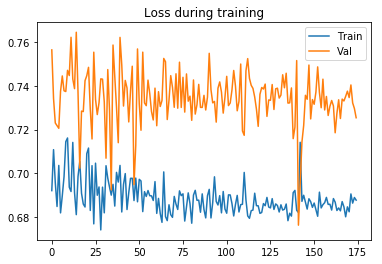

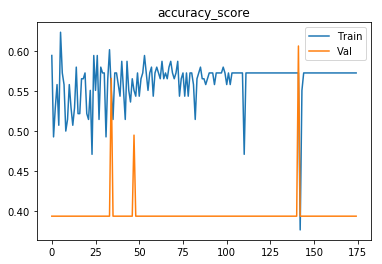

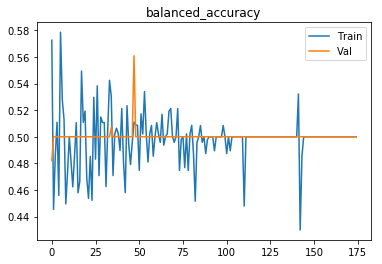

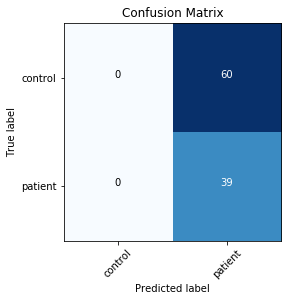

###### Starting inner fold 3
{'model': 'ModelLiu', 'batch_size': 4, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.69881
[0,     4] loss: 0.68993
[0,     6] loss: 0.70614
[0,     8] loss: 0.68736
[0,    10] loss: 0.64467
[0,    12] loss: 0.71724
[0,    14] loss: 0.66398
[0,    16] loss: 0.74774
[0,    18] loss: 0.61451
[0,    20] loss: 0.85744
[0,    22] loss: 0.68309
[0,    24] loss: 0.59647
[0,    26] loss: 0.78077
[0,    28] loss: 0.68461
[0,    30] loss: 0.65561
[0,    32] loss: 0.64643
[0,    34] loss: 0.73899
Time elapsed: 0h:0m:2s
train accuracy_score: 56.52 %
train balanced_accuracy: 52.80 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.728173
[1,     2] loss: 0.53705
[1,     4] loss: 0.84389
[1,     6] loss: 0.70437
[1,     8] loss: 0.71051
[1,    10] loss: 0.83337
[1,    12] loss: 0.72997
[1,    14] loss: 0.79857
[1,    16] loss: 0.62246
[1,    18] loss: 0.68086
[1,    20] loss: 0.81568
[1,    22] loss: 0.71638
[1, 

[13,    32] loss: 0.63804
[13,    34] loss: 0.66719
Time elapsed: 0h:0m:43s
train accuracy_score: 52.90 %
train balanced_accuracy: 48.78 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.725321
[14,     2] loss: 0.67859
[14,     4] loss: 0.55596
[14,     6] loss: 0.68366
[14,     8] loss: 0.57052
[14,    10] loss: 0.64017
[14,    12] loss: 0.71008
[14,    14] loss: 0.66440
[14,    16] loss: 0.77610
[14,    18] loss: 0.66330
[14,    20] loss: 0.78802
[14,    22] loss: 0.66123
[14,    24] loss: 0.73805
[14,    26] loss: 0.73006
[14,    28] loss: 0.56963
[14,    30] loss: 0.71481
[14,    32] loss: 0.63744
[14,    34] loss: 0.60379
Time elapsed: 0h:0m:46s
train accuracy_score: 59.42 %
train balanced_accuracy: 54.26 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.732287
[15,     2] loss: 0.66518
[15,     4] loss: 0.77530
[15,     6] loss: 0.61364
[15,     8] loss: 0.66140
[15,    10] loss: 0.69232
[15,    12] loss: 0.75001
[15,    14] loss: 0.

[27,    10] loss: 0.56594
[27,    12] loss: 0.60865
[27,    14] loss: 0.80508
[27,    16] loss: 0.71381
[27,    18] loss: 0.64725
[27,    20] loss: 0.73604
[27,    22] loss: 0.66618
[27,    24] loss: 0.67377
[27,    26] loss: 0.65195
[27,    28] loss: 0.74751
[27,    30] loss: 0.67896
[27,    32] loss: 0.65933
[27,    34] loss: 0.85606
Time elapsed: 0h:1m:26s
train accuracy_score: 55.07 %
train balanced_accuracy: 48.32 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.748683
[28,     2] loss: 0.70505
[28,     4] loss: 0.66844
[28,     6] loss: 0.67284
[28,     8] loss: 0.72846
[28,    10] loss: 0.70393
[28,    12] loss: 0.73111
[28,    14] loss: 0.82069
[28,    16] loss: 0.73784
[28,    18] loss: 0.67829
[28,    20] loss: 0.75635
[28,    22] loss: 0.70972
[28,    24] loss: 0.70494
[28,    26] loss: 0.69627
[28,    28] loss: 0.70889
[28,    30] loss: 0.68133
[28,    32] loss: 0.60552
[28,    34] loss: 0.64345
Time elapsed: 0h:1m:29s
train accuracy_score: 50.00 %
t

[40,    34] loss: 0.67369
Time elapsed: 0h:2m:5s
train accuracy_score: 57.25 %
train balanced_accuracy: 53.43 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.722399
[41,     2] loss: 0.62030
[41,     4] loss: 0.60337
[41,     6] loss: 0.74110
[41,     8] loss: 0.69695
[41,    10] loss: 0.65197
[41,    12] loss: 0.79000
[41,    14] loss: 0.89552
[41,    16] loss: 0.62899
[41,    18] loss: 0.75715
[41,    20] loss: 0.56253
[41,    22] loss: 0.63995
[41,    24] loss: 0.61569
[41,    26] loss: 0.81660
[41,    28] loss: 0.71659
[41,    30] loss: 0.77294
[41,    32] loss: 0.58251
[41,    34] loss: 0.64851
Time elapsed: 0h:2m:8s
train accuracy_score: 57.97 %
train balanced_accuracy: 51.06 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.745810
[42,     2] loss: 0.77068
[42,     4] loss: 0.67163
[42,     6] loss: 0.72051
[42,     8] loss: 0.63460
[42,    10] loss: 0.58826
[42,    12] loss: 0.71210
[42,    14] loss: 0.82567
[42,    16] loss: 0.67

[54,    12] loss: 0.75958
[54,    14] loss: 0.71675
[54,    16] loss: 0.64132
[54,    18] loss: 0.75959
[54,    20] loss: 0.77986
[54,    22] loss: 0.63274
[54,    24] loss: 0.71651
[54,    26] loss: 0.63652
[54,    28] loss: 0.60099
[54,    30] loss: 0.70826
[54,    32] loss: 0.69187
[54,    34] loss: 0.67152
Time elapsed: 0h:2m:47s
train accuracy_score: 56.52 %
train balanced_accuracy: 49.37 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.730263
[55,     2] loss: 0.73156
[55,     4] loss: 0.75331
[55,     6] loss: 0.71173
[55,     8] loss: 0.64954
[55,    10] loss: 0.68447
[55,    12] loss: 0.68053
[55,    14] loss: 0.74900
[55,    16] loss: 0.67902
[55,    18] loss: 0.68085
[55,    20] loss: 0.69491
[55,    22] loss: 0.63189
[55,    24] loss: 0.71419
[55,    26] loss: 0.62091
[55,    28] loss: 0.67534
[55,    30] loss: 0.63092
[55,    32] loss: 0.65911
[55,    34] loss: 0.81257
Time elapsed: 0h:2m:50s
train accuracy_score: 56.52 %
train balanced_accuracy: 49

Time elapsed: 0h:3m:25s
train accuracy_score: 57.25 %
train balanced_accuracy: 50.21 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.735072
[68,     2] loss: 0.64360
[68,     4] loss: 0.65630
[68,     6] loss: 0.64035
[68,     8] loss: 0.65466
[68,    10] loss: 0.69488
[68,    12] loss: 0.63856
[68,    14] loss: 0.67215
[68,    16] loss: 0.82362
[68,    18] loss: 0.67128
[68,    20] loss: 0.62173
[68,    22] loss: 0.74227
[68,    24] loss: 0.68889
[68,    26] loss: 0.70450
[68,    28] loss: 0.76228
[68,    30] loss: 0.71385
[68,    32] loss: 0.61549
[68,    34] loss: 0.70439
Time elapsed: 0h:3m:28s
train accuracy_score: 57.25 %
train balanced_accuracy: 50.00 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.737534
[69,     2] loss: 0.67862
[69,     4] loss: 0.61762
[69,     6] loss: 0.58724
[69,     8] loss: 0.69545
[69,    10] loss: 0.60884
[69,    12] loss: 0.78421
[69,    14] loss: 0.58676
[69,    16] loss: 0.64540
[69,    18] loss: 0.

[81,    16] loss: 0.63816
[81,    18] loss: 0.72052
[81,    20] loss: 0.69652
[81,    22] loss: 0.67889
[81,    24] loss: 0.64453
[81,    26] loss: 0.62776
[81,    28] loss: 0.65502
[81,    30] loss: 0.76919
[81,    32] loss: 0.75616
[81,    34] loss: 0.59199
Time elapsed: 0h:4m:6s
train accuracy_score: 57.25 %
train balanced_accuracy: 50.00 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.726230
[82,     2] loss: 0.64590
[82,     4] loss: 0.60165
[82,     6] loss: 0.73194
[82,     8] loss: 0.66518
[82,    10] loss: 0.66677
[82,    12] loss: 0.61560
[82,    14] loss: 0.73873
[82,    16] loss: 0.70081
[82,    18] loss: 0.68253
[82,    20] loss: 0.62714
[82,    22] loss: 0.79129
[82,    24] loss: 0.69492
[82,    26] loss: 0.68108
[82,    28] loss: 0.74826
[82,    30] loss: 0.67789
[82,    32] loss: 0.63889
[82,    34] loss: 0.66907
Time elapsed: 0h:4m:9s
train accuracy_score: 57.97 %
train balanced_accuracy: 50.85 %
val accuracy_score: 39.39 %
val balanced_accurac

val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.731299
[95,     2] loss: 0.66314
[95,     4] loss: 0.72234
[95,     6] loss: 0.77899
[95,     8] loss: 0.66045
[95,    10] loss: 0.69996
[95,    12] loss: 0.71211
[95,    14] loss: 0.64650
[95,    16] loss: 0.81537
[95,    18] loss: 0.67144
[95,    20] loss: 0.70735
[95,    22] loss: 0.66901
[95,    24] loss: 0.66555
[95,    26] loss: 0.61192
[95,    28] loss: 0.69594
[95,    30] loss: 0.68634
[95,    32] loss: 0.61660
[95,    34] loss: 0.63192
Time elapsed: 0h:4m:49s
train accuracy_score: 57.25 %
train balanced_accuracy: 50.00 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.736799
[96,     2] loss: 0.70927
[96,     4] loss: 0.79743
[96,     6] loss: 0.59712
[96,     8] loss: 0.70913
[96,    10] loss: 0.73173
[96,    12] loss: 0.70888
[96,    14] loss: 0.53844
[96,    16] loss: 0.67995
[96,    18] loss: 0.63953
[96,    20] loss: 0.66084
[96,    22] loss: 0.58965
[96,    24] loss: 0.75252
[96

[108,    12] loss: 0.71936
[108,    14] loss: 0.74146
[108,    16] loss: 0.66380
[108,    18] loss: 0.66727
[108,    20] loss: 0.73568
[108,    22] loss: 0.66968
[108,    24] loss: 0.64600
[108,    26] loss: 0.63300
[108,    28] loss: 0.70408
[108,    30] loss: 0.63631
[108,    32] loss: 0.65681
[108,    34] loss: 0.74810
Time elapsed: 0h:5m:28s
train accuracy_score: 57.25 %
train balanced_accuracy: 50.00 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.744079
[109,     2] loss: 0.63131
[109,     4] loss: 0.63823
[109,     6] loss: 0.66590
[109,     8] loss: 0.76173
[109,    10] loss: 0.83035
[109,    12] loss: 0.85179
[109,    14] loss: 0.75408
[109,    16] loss: 0.61825
[109,    18] loss: 0.64003
[109,    20] loss: 0.57947
[109,    22] loss: 0.62536
[109,    24] loss: 0.68806
[109,    26] loss: 0.62943
[109,    28] loss: 0.74903
[109,    30] loss: 0.68460
[109,    32] loss: 0.66763
[109,    34] loss: 0.70668
Time elapsed: 0h:5m:31s
train accuracy_score: 57.25 

[121,    20] loss: 0.68004
[121,    22] loss: 0.70764
[121,    24] loss: 0.70207
[121,    26] loss: 0.64877
[121,    28] loss: 0.66973
[121,    30] loss: 0.73963
[121,    32] loss: 0.67899
[121,    34] loss: 0.68975
Time elapsed: 0h:6m:8s
train accuracy_score: 57.25 %
train balanced_accuracy: 50.00 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.736829
[122,     2] loss: 0.66849
[122,     4] loss: 0.71347
[122,     6] loss: 0.71442
[122,     8] loss: 0.54426
[122,    10] loss: 0.70940
[122,    12] loss: 0.71916
[122,    14] loss: 0.66978
[122,    16] loss: 0.72796
[122,    18] loss: 0.63022
[122,    20] loss: 0.81558
[122,    22] loss: 0.65737
[122,    24] loss: 0.66696
[122,    26] loss: 0.70830
[122,    28] loss: 0.67673
[122,    30] loss: 0.71581
[122,    32] loss: 0.68411
[122,    34] loss: 0.72579
Time elapsed: 0h:6m:11s
train accuracy_score: 57.25 %
train balanced_accuracy: 50.00 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.736

[134,    28] loss: 0.65609
[134,    30] loss: 0.65231
[134,    32] loss: 0.74089
[134,    34] loss: 0.67295
Time elapsed: 0h:6m:47s
train accuracy_score: 57.25 %
train balanced_accuracy: 50.00 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.729956
[135,     2] loss: 0.66080
[135,     4] loss: 0.72754
[135,     6] loss: 0.59265
[135,     8] loss: 0.64793
[135,    10] loss: 0.77716
[135,    12] loss: 0.69116
[135,    14] loss: 0.65631
[135,    16] loss: 0.67965
[135,    18] loss: 0.64749
[135,    20] loss: 0.69459
[135,    22] loss: 0.67737
[135,    24] loss: 0.68711
[135,    26] loss: 0.69648
[135,    28] loss: 0.75276
[135,    30] loss: 0.66262
[135,    32] loss: 0.63131
[135,    34] loss: 0.72329
Time elapsed: 0h:6m:50s
train accuracy_score: 57.25 %
train balanced_accuracy: 50.00 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.728579
[136,     2] loss: 0.71308
[136,     4] loss: 0.63376
[136,     6] loss: 0.65103
[136,     8] loss: 0.6

Time elapsed: 0h:7m:25s
train accuracy_score: 57.25 %
train balanced_accuracy: 50.00 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.729671
[148,     2] loss: 0.74176
[148,     4] loss: 0.63264
[148,     6] loss: 0.63907
[148,     8] loss: 0.69390
[148,    10] loss: 0.70445
[148,    12] loss: 0.73975
[148,    14] loss: 0.67135
[148,    16] loss: 0.64766
[148,    18] loss: 0.74027
[148,    20] loss: 0.65273
[148,    22] loss: 0.63935
[148,    24] loss: 0.69342
[148,    26] loss: 0.64986
[148,    28] loss: 0.75639
[148,    30] loss: 0.64967
[148,    32] loss: 0.67218
[148,    34] loss: 0.62797
Time elapsed: 0h:7m:28s
train accuracy_score: 57.25 %
train balanced_accuracy: 50.00 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.730579
[149,     2] loss: 0.69871
[149,     4] loss: 0.69980
[149,     6] loss: 0.70533
[149,     8] loss: 0.62945
[149,    10] loss: 0.71271
[149,    12] loss: 0.65167
[149,    14] loss: 0.69035
[149,    16] loss: 0.7

val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.719599
[161,     2] loss: 0.67006
[161,     4] loss: 0.65498
[161,     6] loss: 0.66994
[161,     8] loss: 0.69420
[161,    10] loss: 0.64157
[161,    12] loss: 0.69450
[161,    14] loss: 0.69933
[161,    16] loss: 0.67920
[161,    18] loss: 0.69969
[161,    20] loss: 0.66950
[161,    22] loss: 0.67725
[161,    24] loss: 0.61506
[161,    26] loss: 0.68867
[161,    28] loss: 0.72440
[161,    30] loss: 0.68267
[161,    32] loss: 0.74090
[161,    34] loss: 0.68468
Time elapsed: 0h:8m:7s
train accuracy_score: 57.25 %
train balanced_accuracy: 50.00 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.727710
[162,     2] loss: 0.68532
[162,     4] loss: 0.68440
[162,     6] loss: 0.67369
[162,     8] loss: 0.66980
[162,    10] loss: 0.64705
[162,    12] loss: 0.74221
[162,    14] loss: 0.71521
[162,    16] loss: 0.65013
[162,    18] loss: 0.67474
[162,    20] loss: 0.72874
[162,    22] loss: 0.71060
[1

[174,    10] loss: 0.75633
[174,    12] loss: 0.62153
[174,    14] loss: 0.78319
[174,    16] loss: 0.70252
[174,    18] loss: 0.68619
[174,    20] loss: 0.63811
[174,    22] loss: 0.58792
[174,    24] loss: 0.67371
[174,    26] loss: 0.67603
[174,    28] loss: 0.64747
[174,    30] loss: 0.71876
[174,    32] loss: 0.73537
[174,    34] loss: 0.75398
Time elapsed: 0h:8m:48s
train accuracy_score: 57.25 %
train balanced_accuracy: 50.00 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.750270
[175,     2] loss: 0.67161
[175,     4] loss: 0.69292
[175,     6] loss: 0.72912
[175,     8] loss: 0.65861
[175,    10] loss: 0.67989
[175,    12] loss: 0.66497
[175,    14] loss: 0.70063
[175,    16] loss: 0.73634
[175,    18] loss: 0.65388
[175,    20] loss: 0.65283
[175,    22] loss: 0.68750
[175,    24] loss: 0.60926
[175,    26] loss: 0.71435
[175,    28] loss: 0.66918
[175,    30] loss: 0.68149
[175,    32] loss: 0.69605
[175,    34] loss: 0.64081
Time elapsed: 0h:8m:51s
t

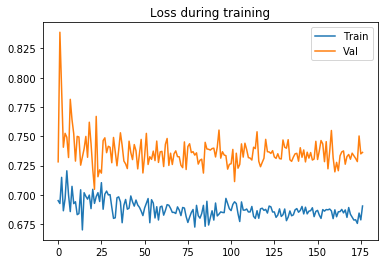

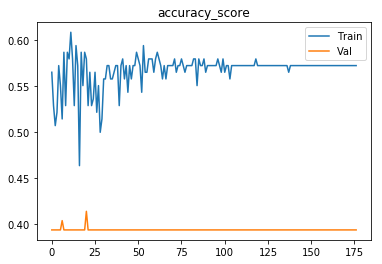

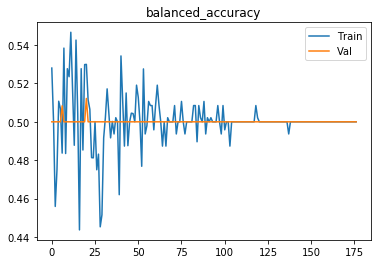

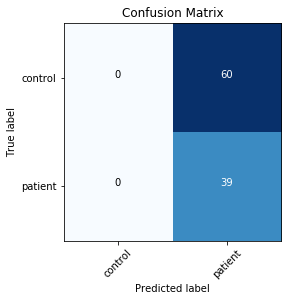

###### Starting inner fold 4
{'model': 'ModelLiu', 'batch_size': 6, 'patience': 12, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.66828
[0,     4] loss: 0.76482
[0,     6] loss: 0.69886
[0,     8] loss: 0.78863
[0,    10] loss: 0.67856
[0,    12] loss: 0.66619
[0,    14] loss: 0.76614
[0,    16] loss: 0.67196
[0,    18] loss: 0.86726
[0,    20] loss: 0.64624
[0,    22] loss: 0.71649
Time elapsed: 0h:0m:2s
train accuracy_score: 54.35 %
train balanced_accuracy: 50.69 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.766658
[1,     2] loss: 0.68050
[1,     4] loss: 0.63173
[1,     6] loss: 0.76134
[1,     8] loss: 0.74811
[1,    10] loss: 0.64927
[1,    12] loss: 0.69586
[1,    14] loss: 0.76973
[1,    16] loss: 0.73167
[1,    18] loss: 0.64499
[1,    20] loss: 0.72168
[1,    22] loss: 0.66217
Time elapsed: 0h:0m:5s
train accuracy_score: 52.90 %
train balanced_accuracy: 48.78 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss:

[18,     8] loss: 0.66907
[18,    10] loss: 0.78581
[18,    12] loss: 0.63853
[18,    14] loss: 0.70158
[18,    16] loss: 0.74538
[18,    18] loss: 0.61715
[18,    20] loss: 0.69542
[18,    22] loss: 0.71238
Time elapsed: 0h:0m:58s
train accuracy_score: 50.72 %
train balanced_accuracy: 45.59 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.733994
[19,     2] loss: 0.67308
[19,     4] loss: 0.67102
[19,     6] loss: 0.67995
[19,     8] loss: 0.71236
[19,    10] loss: 0.67270
[19,    12] loss: 0.68625
[19,    14] loss: 0.71815
[19,    16] loss: 0.67507
[19,    18] loss: 0.68209
[19,    20] loss: 0.63476
[19,    22] loss: 0.71519
Time elapsed: 0h:1m:2s
train accuracy_score: 57.97 %
train balanced_accuracy: 55.35 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.777193
[20,     2] loss: 0.81275
[20,     4] loss: 0.66520
[20,     6] loss: 0.77311
[20,     8] loss: 0.71001
[20,    10] loss: 0.71678
[20,    12] loss: 0.74792
[20,    14] loss: 0.6

[36,    14] loss: 0.70965
[36,    16] loss: 0.69525
[36,    18] loss: 0.67838
[36,    20] loss: 0.72338
[36,    22] loss: 0.72068
Time elapsed: 0h:1m:54s
train accuracy_score: 55.07 %
train balanced_accuracy: 48.96 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.738013
[37,     2] loss: 0.68536
[37,     4] loss: 0.64665
[37,     6] loss: 0.70492
[37,     8] loss: 0.65863
[37,    10] loss: 0.70453
[37,    12] loss: 0.65389
[37,    14] loss: 0.66386
[37,    16] loss: 0.63162
[37,    18] loss: 0.66001
[37,    20] loss: 0.98101
[37,    22] loss: 0.69738
Time elapsed: 0h:1m:57s
train accuracy_score: 55.80 %
train balanced_accuracy: 48.73 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.743389
[38,     2] loss: 0.71869
[38,     4] loss: 0.68416
[38,     6] loss: 0.72693
[38,     8] loss: 0.70481
[38,    10] loss: 0.69405
[38,    12] loss: 0.67844
[38,    14] loss: 0.70562
[38,    16] loss: 0.71006
[38,    18] loss: 0.64430
[38,    20] loss: 0.

Time elapsed: 0h:2m:48s
train accuracy_score: 52.90 %
train balanced_accuracy: 47.06 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.725699
[55,     2] loss: 0.65344
[55,     4] loss: 0.72792
[55,     6] loss: 0.74257
[55,     8] loss: 0.70597
[55,    10] loss: 0.64949
[55,    12] loss: 0.64260
[55,    14] loss: 0.77326
[55,    16] loss: 0.62638
[55,    18] loss: 0.69103
[55,    20] loss: 0.63973
[55,    22] loss: 0.69042
Time elapsed: 0h:2m:51s
train accuracy_score: 57.25 %
train balanced_accuracy: 51.93 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.729297
[56,     2] loss: 0.65970
[56,     4] loss: 0.65153
[56,     6] loss: 0.71651
[56,     8] loss: 0.71830
[56,    10] loss: 0.71682
[56,    12] loss: 0.69891
[56,    14] loss: 0.74878
[56,    16] loss: 0.63196
[56,    18] loss: 0.61292
[56,    20] loss: 0.63967
[56,    22] loss: 0.62702
Time elapsed: 0h:2m:54s
train accuracy_score: 57.97 %
train balanced_accuracy: 51.06 %
val accurac

val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.737177
[73,     2] loss: 0.64190
[73,     4] loss: 0.74597
[73,     6] loss: 0.62383
[73,     8] loss: 0.71637
[73,    10] loss: 0.61759
[73,    12] loss: 0.71327
[73,    14] loss: 0.64206
[73,    16] loss: 0.71826
[73,    18] loss: 0.74531
[73,    20] loss: 0.62215
[73,    22] loss: 0.70099
Time elapsed: 0h:3m:45s
train accuracy_score: 55.80 %
train balanced_accuracy: 48.95 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.733543
[74,     2] loss: 0.62551
[74,     4] loss: 0.74670
[74,     6] loss: 0.71400
[74,     8] loss: 0.66004
[74,    10] loss: 0.72035
[74,    12] loss: 0.72746
[74,    14] loss: 0.67425
[74,    16] loss: 0.66337
[74,    18] loss: 0.65573
[74,    20] loss: 0.72121
[74,    22] loss: 0.62409
Time elapsed: 0h:3m:48s
train accuracy_score: 57.25 %
train balanced_accuracy: 50.43 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.735355
[75,     2] loss: 0.

[91,     6] loss: 0.64708
[91,     8] loss: 0.62780
[91,    10] loss: 0.63983
[91,    12] loss: 0.71895
[91,    14] loss: 0.73576
[91,    16] loss: 0.59820
[91,    18] loss: 0.75841
[91,    20] loss: 0.75751
[91,    22] loss: 0.75481
Time elapsed: 0h:4m:40s
train accuracy_score: 57.25 %
train balanced_accuracy: 50.00 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.758411
[92,     2] loss: 0.75010
[92,     4] loss: 0.71911
[92,     6] loss: 0.69617
[92,     8] loss: 0.64813
[92,    10] loss: 0.65215
[92,    12] loss: 0.70428
[92,    14] loss: 0.61576
[92,    16] loss: 0.67113
[92,    18] loss: 0.71602
[92,    20] loss: 0.65889
[92,    22] loss: 0.81083
Time elapsed: 0h:4m:43s
train accuracy_score: 57.25 %
train balanced_accuracy: 50.00 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.742351
[93,     2] loss: 0.70964
[93,     4] loss: 0.67689
[93,     6] loss: 0.71495
[93,     8] loss: 0.69975
[93,    10] loss: 0.67675
[93,    12] loss: 0.

[109,     8] loss: 0.66965
[109,    10] loss: 0.67576
[109,    12] loss: 0.67672
[109,    14] loss: 0.59366
[109,    16] loss: 0.64761
[109,    18] loss: 0.66292
[109,    20] loss: 0.78861
[109,    22] loss: 0.76459
Time elapsed: 0h:5m:33s
train accuracy_score: 57.25 %
train balanced_accuracy: 50.00 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.753077
[110,     2] loss: 0.68005
[110,     4] loss: 0.73866
[110,     6] loss: 0.66219
[110,     8] loss: 0.66297
[110,    10] loss: 0.73482
[110,    12] loss: 0.63186
[110,    14] loss: 0.69612
[110,    16] loss: 0.66403
[110,    18] loss: 0.62985
[110,    20] loss: 0.68509
[110,    22] loss: 0.69959
Time elapsed: 0h:5m:36s
train accuracy_score: 56.52 %
train balanced_accuracy: 49.37 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.731683
[111,     2] loss: 0.68211
[111,     4] loss: 0.66302
[111,     6] loss: 0.74283
[111,     8] loss: 0.66372
[111,    10] loss: 0.69364
[111,    12] loss: 0.6

[127,     2] loss: 0.70609
[127,     4] loss: 0.63418
[127,     6] loss: 0.71988
[127,     8] loss: 0.63771
[127,    10] loss: 0.66025
[127,    12] loss: 0.66841
[127,    14] loss: 0.63075
[127,    16] loss: 0.79105
[127,    18] loss: 0.63765
[127,    20] loss: 0.75088
[127,    22] loss: 0.75753
Time elapsed: 0h:6m:29s
train accuracy_score: 57.25 %
train balanced_accuracy: 50.00 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.747175
[128,     2] loss: 0.64716
[128,     4] loss: 0.74051
[128,     6] loss: 0.68436
[128,     8] loss: 0.63297
[128,    10] loss: 0.70084
[128,    12] loss: 0.67431
[128,    14] loss: 0.74759
[128,    16] loss: 0.63862
[128,    18] loss: 0.71770
[128,    20] loss: 0.63768
[128,    22] loss: 0.65006
Time elapsed: 0h:6m:32s
train accuracy_score: 57.25 %
train balanced_accuracy: 50.00 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.732205
[129,     2] loss: 0.67329
[129,     4] loss: 0.74572
[129,     6] loss: 0.6

val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.742868
[145,     2] loss: 0.65862
[145,     4] loss: 0.71431
[145,     6] loss: 0.69098
[145,     8] loss: 0.64347
[145,    10] loss: 0.76166
[145,    12] loss: 0.73414
[145,    14] loss: 0.74463
[145,    16] loss: 0.68424
[145,    18] loss: 0.56825
[145,    20] loss: 0.69716
[145,    22] loss: 0.66952
Time elapsed: 0h:7m:25s
train accuracy_score: 57.25 %
train balanced_accuracy: 50.00 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.734237
[146,     2] loss: 0.68997
[146,     4] loss: 0.72076
[146,     6] loss: 0.73615
[146,     8] loss: 0.71273
[146,    10] loss: 0.69941
[146,    12] loss: 0.68714
[146,    14] loss: 0.66331
[146,    16] loss: 0.65383
[146,    18] loss: 0.66461
[146,    20] loss: 0.63772
[146,    22] loss: 0.69223
Time elapsed: 0h:7m:28s
train accuracy_score: 57.25 %
train balanced_accuracy: 50.00 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.73333

Time elapsed: 0h:8m:18s
train accuracy_score: 57.25 %
train balanced_accuracy: 50.00 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.735378
[163,     2] loss: 0.73230
[163,     4] loss: 0.68611
[163,     6] loss: 0.67589
[163,     8] loss: 0.66976
[163,    10] loss: 0.69973
[163,    12] loss: 0.64708
[163,    14] loss: 0.65254
[163,    16] loss: 0.71225
[163,    18] loss: 0.68407
[163,    20] loss: 0.67675
[163,    22] loss: 0.64634
Time elapsed: 0h:8m:22s
train accuracy_score: 57.25 %
train balanced_accuracy: 50.00 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.748898
[164,     2] loss: 0.76616
[164,     4] loss: 0.68506
[164,     6] loss: 0.68559
[164,     8] loss: 0.64719
[164,    10] loss: 0.64165
[164,    12] loss: 0.67978
[164,    14] loss: 0.69619
[164,    16] loss: 0.68097
[164,    18] loss: 0.68018
[164,    20] loss: 0.69197
[164,    22] loss: 0.60415
Time elapsed: 0h:8m:24s
train accuracy_score: 57.25 %
train balanced_accurac

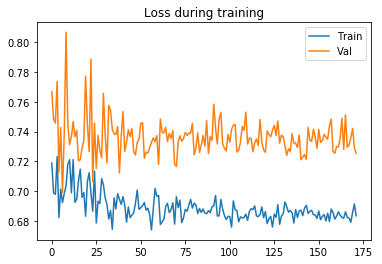

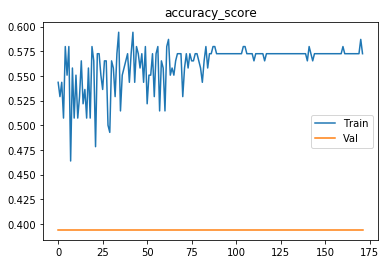

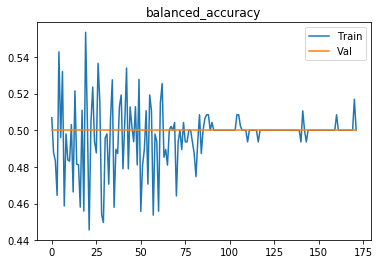

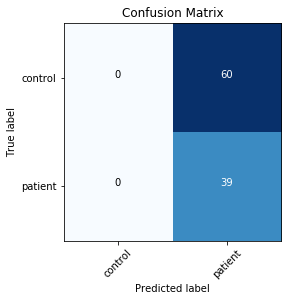

Finished outer fold.
{'final_acc': 0.5, 'best_acc': 0.5, 'final_iter': 188, 'best_iter': 14, 'params': {'model': 'ModelLiu', 'batch_size': 12, 'patience': 16, 'lr': 0.001}, 'inner_fold_idx': 0}
###### Starting outer fold 9
# of patients 121, # of healthy controls 128
137
112
###### Starting inner fold 0
{'model': 'ModelLiu', 'batch_size': 6, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.69812
[0,     4] loss: 0.72903
[0,     6] loss: 0.69947
[0,     8] loss: 0.69806
[0,    10] loss: 0.73235
[0,    12] loss: 0.71511
[0,    14] loss: 0.72441
[0,    16] loss: 0.67425
[0,    18] loss: 0.70934
[0,    20] loss: 0.70522
[0,    22] loss: 0.72193
Time elapsed: 0h:0m:2s
train accuracy_score: 39.42 %
train balanced_accuracy: 39.82 %
val accuracy_score: 54.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.690465
[1,     2] loss: 0.71783
[1,     4] loss: 0.71250
[1,     6] loss: 0.67460
[1,     8] loss: 0.74121
[1,    10] loss: 0.68668
[1,    12] loss: 0.65687
[1,

Time elapsed: 0h:0m:56s
train accuracy_score: 41.61 %
train balanced_accuracy: 41.71 %
val accuracy_score: 54.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.691475
[18,     2] loss: 0.69845
[18,     4] loss: 0.71393
[18,     6] loss: 0.67616
[18,     8] loss: 0.70233
[18,    10] loss: 0.66508
[18,    12] loss: 0.66969
[18,    14] loss: 0.74014
[18,    16] loss: 0.67930
[18,    18] loss: 0.73649
[18,    20] loss: 0.71138
[18,    22] loss: 0.73884
Time elapsed: 0h:1m:0s
train accuracy_score: 50.36 %
train balanced_accuracy: 50.60 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.699385
[19,     2] loss: 0.68403
[19,     4] loss: 0.76399
[19,     6] loss: 0.76013
[19,     8] loss: 0.69277
[19,    10] loss: 0.75179
[19,    12] loss: 0.71769
[19,    14] loss: 0.67599
[19,    16] loss: 0.65495
[19,    18] loss: 0.65873
[19,    20] loss: 0.67277
[19,    22] loss: 0.69491
Time elapsed: 0h:1m:3s
train accuracy_score: 51.09 %
train balanced_accuracy: 50.51 %
val accuracy_

val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.696369
[36,     2] loss: 0.70792
[36,     4] loss: 0.66747
[36,     6] loss: 0.72217
[36,     8] loss: 0.73616
[36,    10] loss: 0.75930
[36,    12] loss: 0.65848
[36,    14] loss: 0.74737
[36,    16] loss: 0.68108
[36,    18] loss: 0.70977
[36,    20] loss: 0.69243
[36,    22] loss: 0.67420
Time elapsed: 0h:1m:57s
train accuracy_score: 48.91 %
train balanced_accuracy: 48.24 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.696186
[37,     2] loss: 0.71654
[37,     4] loss: 0.72449
[37,     6] loss: 0.68640
[37,     8] loss: 0.69348
[37,    10] loss: 0.67299
[37,    12] loss: 0.67690
[37,    14] loss: 0.65095
[37,    16] loss: 0.64519
[37,    18] loss: 0.75473
[37,    20] loss: 0.69171
[37,    22] loss: 0.68825
Time elapsed: 0h:2m:1s
train accuracy_score: 54.01 %
train balanced_accuracy: 53.88 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.696409
[38,     2] loss: 0.7

[54,     2] loss: 0.67599
[54,     4] loss: 0.67337
[54,     6] loss: 0.69360
[54,     8] loss: 0.69370
[54,    10] loss: 0.73722
[54,    12] loss: 0.65327
[54,    14] loss: 0.72960
[54,    16] loss: 0.70535
[54,    18] loss: 0.78203
[54,    20] loss: 0.69723
[54,    22] loss: 0.63536
Time elapsed: 0h:2m:54s
train accuracy_score: 55.47 %
train balanced_accuracy: 54.93 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.699498
[55,     2] loss: 0.68250
[55,     4] loss: 0.72688
[55,     6] loss: 0.69518
[55,     8] loss: 0.69345
[55,    10] loss: 0.68076
[55,    12] loss: 0.71192
[55,    14] loss: 0.68768
[55,    16] loss: 0.69459
[55,    18] loss: 0.67954
[55,    20] loss: 0.69237
[55,    22] loss: 0.69505
Time elapsed: 0h:2m:57s
train accuracy_score: 47.45 %
train balanced_accuracy: 47.20 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.695939
[56,     2] loss: 0.69456
[56,     4] loss: 0.68658
[56,     6] loss: 0.71626
[56,     8] loss: 0.

[72,    14] loss: 0.70424
[72,    16] loss: 0.74599
[72,    18] loss: 0.70470
[72,    20] loss: 0.71493
[72,    22] loss: 0.67152
Time elapsed: 0h:3m:49s
train accuracy_score: 45.99 %
train balanced_accuracy: 46.44 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.693516
[73,     2] loss: 0.72761
[73,     4] loss: 0.70396
[73,     6] loss: 0.73043
[73,     8] loss: 0.67476
[73,    10] loss: 0.69213
[73,    12] loss: 0.69169
[73,    14] loss: 0.68567
[73,    16] loss: 0.67731
[73,    18] loss: 0.68410
[73,    20] loss: 0.66018
[73,    22] loss: 0.68050
Time elapsed: 0h:3m:52s
train accuracy_score: 51.09 %
train balanced_accuracy: 50.93 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.695940
[74,     2] loss: 0.70598
[74,     4] loss: 0.73162
[74,     6] loss: 0.71271
[74,     8] loss: 0.68060
[74,    10] loss: 0.71850
[74,    12] loss: 0.68850
[74,    14] loss: 0.71138
[74,    16] loss: 0.71086
[74,    18] loss: 0.68422
[74,    20] loss: 0.

[90,    20] loss: 0.68211
[90,    22] loss: 0.70443
Time elapsed: 0h:4m:45s
train accuracy_score: 51.82 %
train balanced_accuracy: 51.19 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.695112
[91,     2] loss: 0.71992
[91,     4] loss: 0.70227
[91,     6] loss: 0.70305
[91,     8] loss: 0.71381
[91,    10] loss: 0.72318
[91,    12] loss: 0.68352
[91,    14] loss: 0.70863
[91,    16] loss: 0.67956
[91,    18] loss: 0.70448
[91,    20] loss: 0.69524
[91,    22] loss: 0.73331
Time elapsed: 0h:4m:48s
train accuracy_score: 42.34 %
train balanced_accuracy: 42.23 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.697077
[92,     2] loss: 0.69385
[92,     4] loss: 0.70080
[92,     6] loss: 0.69045
[92,     8] loss: 0.69254
[92,    10] loss: 0.67807
[92,    12] loss: 0.72543
[92,    14] loss: 0.68391
[92,    16] loss: 0.67810
[92,    18] loss: 0.66196
[92,    20] loss: 0.65861
[92,    22] loss: 0.69250
Time elapsed: 0h:4m:51s
train accuracy_score: 

[108,    20] loss: 0.69593
[108,    22] loss: 0.71585
Time elapsed: 0h:5m:41s
train accuracy_score: 51.82 %
train balanced_accuracy: 51.96 %
val accuracy_score: 59.82 %
val balanced_accuracy: 57.33 %
Val loss: 0.684030
[109,     2] loss: 0.69901
[109,     4] loss: 0.70902
[109,     6] loss: 0.69592
[109,     8] loss: 0.70020
[109,    10] loss: 0.68403
[109,    12] loss: 0.70352
[109,    14] loss: 0.70359
[109,    16] loss: 0.68642
[109,    18] loss: 0.70975
[109,    20] loss: 0.68606
[109,    22] loss: 0.66547
Time elapsed: 0h:5m:45s
train accuracy_score: 48.91 %
train balanced_accuracy: 48.66 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.696251
[110,     2] loss: 0.67802
[110,     4] loss: 0.69830
[110,     6] loss: 0.71583
[110,     8] loss: 0.67021
[110,    10] loss: 0.71415
[110,    12] loss: 0.66915
[110,    14] loss: 0.68250
[110,    16] loss: 0.69522
[110,    18] loss: 0.68973
[110,    20] loss: 0.70173
[110,    22] loss: 0.70847
Time elapsed: 0h:5m:48

[126,    14] loss: 0.69125
[126,    16] loss: 0.68899
[126,    18] loss: 0.68741
[126,    20] loss: 0.68261
[126,    22] loss: 0.69731
Time elapsed: 0h:6m:40s
train accuracy_score: 48.18 %
train balanced_accuracy: 47.53 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.700019
[127,     2] loss: 0.70214
[127,     4] loss: 0.71953
[127,     6] loss: 0.71844
[127,     8] loss: 0.68292
[127,    10] loss: 0.70405
[127,    12] loss: 0.68294
[127,    14] loss: 0.69241
[127,    16] loss: 0.68565
[127,    18] loss: 0.71138
[127,    20] loss: 0.71203
[127,    22] loss: 0.71744
Time elapsed: 0h:6m:43s
train accuracy_score: 46.72 %
train balanced_accuracy: 46.13 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.695064
[128,     2] loss: 0.71594
[128,     4] loss: 0.70729
[128,     6] loss: 0.69659
[128,     8] loss: 0.69763
[128,    10] loss: 0.70260
[128,    12] loss: 0.70144
[128,    14] loss: 0.69564
[128,    16] loss: 0.69499
[128,    18] loss: 0.7

[144,     8] loss: 0.68796
[144,    10] loss: 0.70591
[144,    12] loss: 0.70701
[144,    14] loss: 0.68868
[144,    16] loss: 0.67395
[144,    18] loss: 0.69568
[144,    20] loss: 0.72398
[144,    22] loss: 0.72811
Time elapsed: 0h:7m:39s
train accuracy_score: 54.01 %
train balanced_accuracy: 53.43 %
val accuracy_score: 51.79 %
val balanced_accuracy: 54.13 %
Val loss: 0.693871
[145,     2] loss: 0.69284
[145,     4] loss: 0.70578
[145,     6] loss: 0.68310
[145,     8] loss: 0.67839
[145,    10] loss: 0.68137
[145,    12] loss: 0.70603
[145,    14] loss: 0.70367
[145,    16] loss: 0.69625
[145,    18] loss: 0.70277
[145,    20] loss: 0.70139
[145,    22] loss: 0.68187
Time elapsed: 0h:7m:43s
train accuracy_score: 52.55 %
train balanced_accuracy: 52.23 %
val accuracy_score: 42.86 %
val balanced_accuracy: 45.77 %
Val loss: 0.700321
[146,     2] loss: 0.68514
[146,     4] loss: 0.68450
[146,     6] loss: 0.69054
[146,     8] loss: 0.69241
[146,    10] loss: 0.68708
[146,    12] loss: 0.6

[162,     2] loss: 0.70174
[162,     4] loss: 0.69862
[162,     6] loss: 0.67967
[162,     8] loss: 0.70135
[162,    10] loss: 0.69692
[162,    12] loss: 0.69312
[162,    14] loss: 0.70033
[162,    16] loss: 0.69185
[162,    18] loss: 0.70153
[162,    20] loss: 0.69020
[162,    22] loss: 0.69212
Time elapsed: 0h:8m:37s
train accuracy_score: 48.91 %
train balanced_accuracy: 49.39 %
val accuracy_score: 54.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.692484
[163,     2] loss: 0.69899
[163,     4] loss: 0.68771
[163,     6] loss: 0.70125
[163,     8] loss: 0.69283
[163,    10] loss: 0.70216
[163,    12] loss: 0.68417
[163,    14] loss: 0.69071
[163,    16] loss: 0.71262
[163,    18] loss: 0.69237
[163,    20] loss: 0.69970
[163,    22] loss: 0.70209
Time elapsed: 0h:8m:41s
train accuracy_score: 41.61 %
train balanced_accuracy: 41.16 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.695033
[164,     2] loss: 0.68835
[164,     4] loss: 0.69081
[164,     6] loss: 0.6

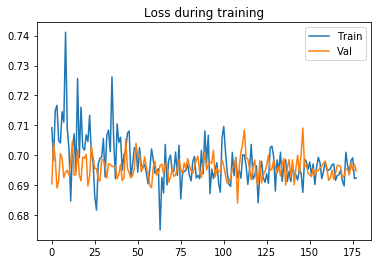

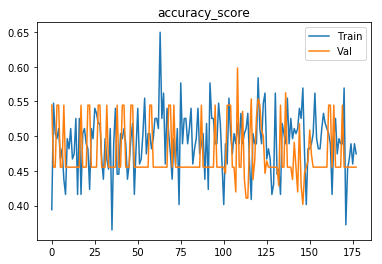

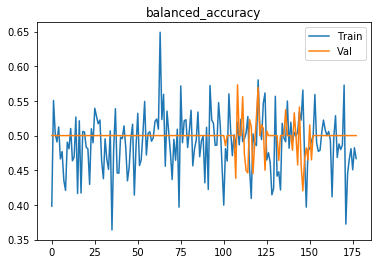

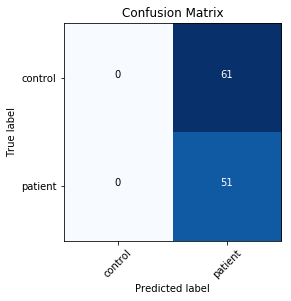

###### Starting inner fold 1
{'model': 'ModelLiu', 'batch_size': 6, 'patience': 12, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.67985
[0,     4] loss: 0.61998
[0,     6] loss: 0.79606
[0,     8] loss: 0.61528
[0,    10] loss: 0.73842
[0,    12] loss: 0.80056
[0,    14] loss: 0.65402
[0,    16] loss: 0.66541
[0,    18] loss: 0.66637
[0,    20] loss: 0.75057
[0,    22] loss: 0.75850
Time elapsed: 0h:0m:2s
train accuracy_score: 56.20 %
train balanced_accuracy: 56.06 %
val accuracy_score: 54.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.696187
[1,     2] loss: 0.79627
[1,     4] loss: 0.72818
[1,     6] loss: 0.70765
[1,     8] loss: 0.73221
[1,    10] loss: 0.67951
[1,    12] loss: 0.71134
[1,    14] loss: 0.70187
[1,    16] loss: 0.74839
[1,    18] loss: 0.80839
[1,    20] loss: 0.69799
[1,    22] loss: 0.74640
Time elapsed: 0h:0m:5s
train accuracy_score: 43.80 %
train balanced_accuracy: 43.82 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss:

[18,     8] loss: 0.70392
[18,    10] loss: 0.74238
[18,    12] loss: 0.66998
[18,    14] loss: 0.77840
[18,    16] loss: 0.74129
[18,    18] loss: 0.73229
[18,    20] loss: 0.73032
[18,    22] loss: 0.65706
Time elapsed: 0h:0m:59s
train accuracy_score: 51.82 %
train balanced_accuracy: 51.45 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.696424
[19,     2] loss: 0.70722
[19,     4] loss: 0.70580
[19,     6] loss: 0.68135
[19,     8] loss: 0.64174
[19,    10] loss: 0.72678
[19,    12] loss: 0.69136
[19,    14] loss: 0.62762
[19,    16] loss: 0.76313
[19,    18] loss: 0.70614
[19,    20] loss: 0.76111
[19,    22] loss: 0.75622
Time elapsed: 0h:1m:2s
train accuracy_score: 48.91 %
train balanced_accuracy: 49.01 %
val accuracy_score: 54.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.691258
[20,     2] loss: 0.72457
[20,     4] loss: 0.78758
[20,     6] loss: 0.72162
[20,     8] loss: 0.69479
[20,    10] loss: 0.69291
[20,    12] loss: 0.76952
[20,    14] loss: 0.6

[36,    14] loss: 0.74221
[36,    16] loss: 0.67802
[36,    18] loss: 0.71907
[36,    20] loss: 0.67638
[36,    22] loss: 0.69332
Time elapsed: 0h:1m:56s
train accuracy_score: 42.34 %
train balanced_accuracy: 42.36 %
val accuracy_score: 54.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.692391
[37,     2] loss: 0.69404
[37,     4] loss: 0.69519
[37,     6] loss: 0.69407
[37,     8] loss: 0.68232
[37,    10] loss: 0.69615
[37,    12] loss: 0.71003
[37,    14] loss: 0.69931
[37,    16] loss: 0.73838
[37,    18] loss: 0.65847
[37,    20] loss: 0.66737
[37,    22] loss: 0.67030
Time elapsed: 0h:1m:59s
train accuracy_score: 49.64 %
train balanced_accuracy: 49.69 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.696957
[38,     2] loss: 0.70827
[38,     4] loss: 0.68287
[38,     6] loss: 0.69819
[38,     8] loss: 0.65134
[38,    10] loss: 0.68800
[38,    12] loss: 0.76859
[38,    14] loss: 0.66897
[38,    16] loss: 0.69645
[38,    18] loss: 0.70722
[38,    20] loss: 0.

[54,    20] loss: 0.69758
[54,    22] loss: 0.70902
Time elapsed: 0h:2m:53s
train accuracy_score: 43.80 %
train balanced_accuracy: 43.46 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.695424
[55,     2] loss: 0.68874
[55,     4] loss: 0.68747
[55,     6] loss: 0.67271
[55,     8] loss: 0.65044
[55,    10] loss: 0.72559
[55,    12] loss: 0.69173
[55,    14] loss: 0.68119
[55,    16] loss: 0.72536
[55,    18] loss: 0.70373
[55,    20] loss: 0.68897
[55,    22] loss: 0.68833
Time elapsed: 0h:2m:56s
train accuracy_score: 52.55 %
train balanced_accuracy: 52.68 %
val accuracy_score: 54.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.691689
[56,     2] loss: 0.71085
[56,     4] loss: 0.63579
[56,     6] loss: 0.67626
[56,     8] loss: 0.66719
[56,    10] loss: 0.68655
[56,    12] loss: 0.69596
[56,    14] loss: 0.70744
[56,    16] loss: 0.70293
[56,    18] loss: 0.67401
[56,    20] loss: 0.67841
[56,    22] loss: 0.64391
Time elapsed: 0h:2m:59s
train accuracy_score: 

val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.693321
[73,     2] loss: 0.71468
[73,     4] loss: 0.69273
[73,     6] loss: 0.69647
[73,     8] loss: 0.69247
[73,    10] loss: 0.69029
[73,    12] loss: 0.70746
[73,    14] loss: 0.70338
[73,    16] loss: 0.69660
[73,    18] loss: 0.70850
[73,    20] loss: 0.66974
[73,    22] loss: 0.70525
Time elapsed: 0h:3m:52s
train accuracy_score: 48.91 %
train balanced_accuracy: 48.69 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.693890
[74,     2] loss: 0.71807
[74,     4] loss: 0.70621
[74,     6] loss: 0.70601
[74,     8] loss: 0.70566
[74,    10] loss: 0.72874
[74,    12] loss: 0.70674
[74,    14] loss: 0.71936
[74,    16] loss: 0.71079
[74,    18] loss: 0.69777
[74,    20] loss: 0.71559
[74,    22] loss: 0.72002
Time elapsed: 0h:3m:56s
train accuracy_score: 40.88 %
train balanced_accuracy: 40.64 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.694133
[75,     2] loss: 0.

[91,     2] loss: 0.68543
[91,     4] loss: 0.69416
[91,     6] loss: 0.68443
[91,     8] loss: 0.70559
[91,    10] loss: 0.70380
[91,    12] loss: 0.69365
[91,    14] loss: 0.67787
[91,    16] loss: 0.68107
[91,    18] loss: 0.68970
[91,    20] loss: 0.70615
[91,    22] loss: 0.73098
Time elapsed: 0h:4m:50s
train accuracy_score: 48.91 %
train balanced_accuracy: 48.14 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.699722
[92,     2] loss: 0.70822
[92,     4] loss: 0.68586
[92,     6] loss: 0.68912
[92,     8] loss: 0.69485
[92,    10] loss: 0.67148
[92,    12] loss: 0.71707
[92,    14] loss: 0.68790
[92,    16] loss: 0.67765
[92,    18] loss: 0.70995
[92,    20] loss: 0.67062
[92,    22] loss: 0.69158
Time elapsed: 0h:4m:52s
train accuracy_score: 51.09 %
train balanced_accuracy: 50.45 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.693729
[93,     2] loss: 0.69259
[93,     4] loss: 0.70887
[93,     6] loss: 0.67459
[93,     8] loss: 0.

[109,     2] loss: 0.67993
[109,     4] loss: 0.69676
[109,     6] loss: 0.69918
[109,     8] loss: 0.67857
[109,    10] loss: 0.70135
[109,    12] loss: 0.71839
[109,    14] loss: 0.70348
[109,    16] loss: 0.68779
[109,    18] loss: 0.69640
[109,    20] loss: 0.70813
[109,    22] loss: 0.70217
Time elapsed: 0h:5m:46s
train accuracy_score: 49.64 %
train balanced_accuracy: 49.91 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.695113
[110,     2] loss: 0.68305
[110,     4] loss: 0.70259
[110,     6] loss: 0.68015
[110,     8] loss: 0.68246
[110,    10] loss: 0.71203
[110,    12] loss: 0.69569
[110,    14] loss: 0.68246
[110,    16] loss: 0.70440
[110,    18] loss: 0.72928
[110,    20] loss: 0.67787
[110,    22] loss: 0.71292
Time elapsed: 0h:5m:49s
train accuracy_score: 46.72 %
train balanced_accuracy: 46.03 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.697474
[111,     2] loss: 0.70605
[111,     4] loss: 0.69418
[111,     6] loss: 0.7

val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.695606
[127,     2] loss: 0.69747
[127,     4] loss: 0.68123
[127,     6] loss: 0.68055
[127,     8] loss: 0.70274
[127,    10] loss: 0.67859
[127,    12] loss: 0.68683
[127,    14] loss: 0.69016
[127,    16] loss: 0.72792
[127,    18] loss: 0.68828
[127,    20] loss: 0.69983
[127,    22] loss: 0.68839
Time elapsed: 0h:6m:44s
train accuracy_score: 51.09 %
train balanced_accuracy: 50.58 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.696865
[128,     2] loss: 0.68938
[128,     4] loss: 0.69606
[128,     6] loss: 0.70912
[128,     8] loss: 0.67835
[128,    10] loss: 0.69668
[128,    12] loss: 0.70057
[128,    14] loss: 0.70049
[128,    16] loss: 0.70096
[128,    18] loss: 0.70326
[128,    20] loss: 0.71247
[128,    22] loss: 0.67489
Time elapsed: 0h:6m:47s
train accuracy_score: 46.72 %
train balanced_accuracy: 46.16 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.69485

Time elapsed: 0h:7m:38s
train accuracy_score: 45.26 %
train balanced_accuracy: 45.41 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.693855
[145,     2] loss: 0.68561
[145,     4] loss: 0.69549
[145,     6] loss: 0.67998
[145,     8] loss: 0.67121
[145,    10] loss: 0.73212
[145,    12] loss: 0.68571
[145,    14] loss: 0.70801
[145,    16] loss: 0.68346
[145,    18] loss: 0.69511
[145,    20] loss: 0.69229
[145,    22] loss: 0.69598
Time elapsed: 0h:7m:42s
train accuracy_score: 54.01 %
train balanced_accuracy: 54.52 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.693447
[146,     2] loss: 0.68301
[146,     4] loss: 0.69770
[146,     6] loss: 0.68991
[146,     8] loss: 0.68783
[146,    10] loss: 0.70299
[146,    12] loss: 0.69224
[146,    14] loss: 0.69089
[146,    16] loss: 0.71155
[146,    18] loss: 0.69056
[146,    20] loss: 0.68956
[146,    22] loss: 0.69638
Time elapsed: 0h:7m:45s
train accuracy_score: 48.18 %
train balanced_accurac

[162,    20] loss: 0.68583
[162,    22] loss: 0.67694
Time elapsed: 0h:8m:36s
train accuracy_score: 45.99 %
train balanced_accuracy: 45.35 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.693902
[163,     2] loss: 0.68753
[163,     4] loss: 0.69701
[163,     6] loss: 0.70689
[163,     8] loss: 0.69318
[163,    10] loss: 0.69205
[163,    12] loss: 0.69433
[163,    14] loss: 0.67809
[163,    16] loss: 0.70714
[163,    18] loss: 0.69497
[163,    20] loss: 0.69480
[163,    22] loss: 0.70489
Time elapsed: 0h:8m:39s
train accuracy_score: 52.55 %
train balanced_accuracy: 51.88 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.697815
[164,     2] loss: 0.72077
[164,     4] loss: 0.68022
[164,     6] loss: 0.70682
[164,     8] loss: 0.69205
[164,    10] loss: 0.68557
[164,    12] loss: 0.67783
[164,    14] loss: 0.70008
[164,    16] loss: 0.68510
[164,    18] loss: 0.67527
[164,    20] loss: 0.71002
[164,    22] loss: 0.69115
Time elapsed: 0h:8m:42

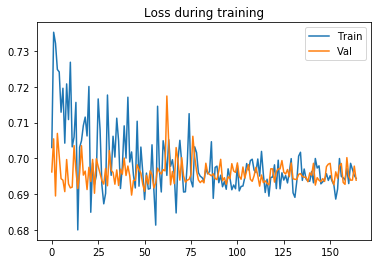

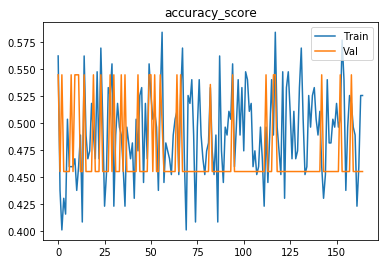

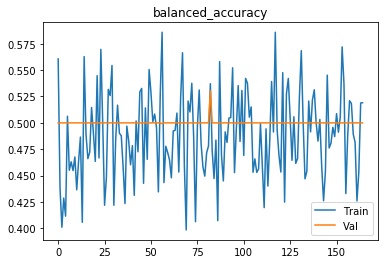

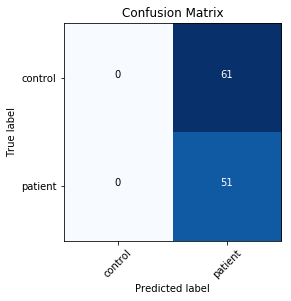

###### Starting inner fold 2
{'model': 'ModelLiu', 'batch_size': 6, 'patience': 12, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.69302
[0,     4] loss: 0.63805
[0,     6] loss: 0.67742
[0,     8] loss: 0.71316
[0,    10] loss: 0.97069
[0,    12] loss: 0.67754
[0,    14] loss: 0.66923
[0,    16] loss: 0.61735
[0,    18] loss: 0.71502
[0,    20] loss: 0.66948
[0,    22] loss: 0.65491
Time elapsed: 0h:0m:2s
train accuracy_score: 57.66 %
train balanced_accuracy: 57.84 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.774923
[1,     2] loss: 0.75948
[1,     4] loss: 0.68131
[1,     6] loss: 0.72993
[1,     8] loss: 0.76544
[1,    10] loss: 0.61864
[1,    12] loss: 0.67658
[1,    14] loss: 0.70226
[1,    16] loss: 0.73512
[1,    18] loss: 0.64304
[1,    20] loss: 0.76136
[1,    22] loss: 0.72182
Time elapsed: 0h:0m:5s
train accuracy_score: 48.91 %
train balanced_accuracy: 48.24 %
val accuracy_score: 54.46 %
val balanced_accuracy: 50.00 %
Val loss:

[18,    10] loss: 0.70285
[18,    12] loss: 0.70124
[18,    14] loss: 0.69637
[18,    16] loss: 0.68220
[18,    18] loss: 0.71157
[18,    20] loss: 0.66746
[18,    22] loss: 0.72910
Time elapsed: 0h:0m:59s
train accuracy_score: 50.36 %
train balanced_accuracy: 50.18 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.694773
[19,     2] loss: 0.70499
[19,     4] loss: 0.73407
[19,     6] loss: 0.70497
[19,     8] loss: 0.75580
[19,    10] loss: 0.69300
[19,    12] loss: 0.63362
[19,    14] loss: 0.79919
[19,    16] loss: 0.73199
[19,    18] loss: 0.70859
[19,    20] loss: 0.65515
[19,    22] loss: 0.68525
Time elapsed: 0h:1m:2s
train accuracy_score: 44.53 %
train balanced_accuracy: 44.31 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.694618
[20,     2] loss: 0.67195
[20,     4] loss: 0.64962
[20,     6] loss: 0.68768
[20,     8] loss: 0.63569
[20,    10] loss: 0.74232
[20,    12] loss: 0.68852
[20,    14] loss: 0.67958
[20,    16] loss: 0.7

[36,    20] loss: 0.72242
[36,    22] loss: 0.69500
Time elapsed: 0h:1m:56s
train accuracy_score: 45.99 %
train balanced_accuracy: 45.38 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.700501
[37,     2] loss: 0.69712
[37,     4] loss: 0.69963
[37,     6] loss: 0.69389
[37,     8] loss: 0.71490
[37,    10] loss: 0.72332
[37,    12] loss: 0.69110
[37,    14] loss: 0.71203
[37,    16] loss: 0.73225
[37,    18] loss: 0.68297
[37,    20] loss: 0.66875
[37,    22] loss: 0.70267
Time elapsed: 0h:1m:59s
train accuracy_score: 47.45 %
train balanced_accuracy: 47.29 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.702241
[38,     2] loss: 0.69430
[38,     4] loss: 0.66979
[38,     6] loss: 0.68848
[38,     8] loss: 0.68854
[38,    10] loss: 0.66149
[38,    12] loss: 0.69894
[38,    14] loss: 0.67503
[38,    16] loss: 0.58955
[38,    18] loss: 0.70069
[38,    20] loss: 0.69548
[38,    22] loss: 0.73025
Time elapsed: 0h:2m:2s
train accuracy_score: 5

val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.696579
[55,     2] loss: 0.71744
[55,     4] loss: 0.73175
[55,     6] loss: 0.68597
[55,     8] loss: 0.71369
[55,    10] loss: 0.67833
[55,    12] loss: 0.67057
[55,    14] loss: 0.66652
[55,    16] loss: 0.72216
[55,    18] loss: 0.72053
[55,    20] loss: 0.70750
[55,    22] loss: 0.77178
Time elapsed: 0h:2m:57s
train accuracy_score: 43.80 %
train balanced_accuracy: 43.91 %
val accuracy_score: 54.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.690209
[56,     2] loss: 0.64677
[56,     4] loss: 0.69986
[56,     6] loss: 0.69703
[56,     8] loss: 0.69871
[56,    10] loss: 0.72688
[56,    12] loss: 0.68532
[56,    14] loss: 0.69510
[56,    16] loss: 0.71425
[56,    18] loss: 0.70877
[56,    20] loss: 0.68762
[56,    22] loss: 0.67427
Time elapsed: 0h:3m:0s
train accuracy_score: 50.36 %
train balanced_accuracy: 49.96 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.701084
[57,     2] loss: 0.6

[73,     8] loss: 0.69553
[73,    10] loss: 0.68398
[73,    12] loss: 0.70164
[73,    14] loss: 0.67911
[73,    16] loss: 0.68685
[73,    18] loss: 0.72437
[73,    20] loss: 0.69094
[73,    22] loss: 0.68073
Time elapsed: 0h:3m:53s
train accuracy_score: 51.09 %
train balanced_accuracy: 50.70 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.693734
[74,     2] loss: 0.69137
[74,     4] loss: 0.67782
[74,     6] loss: 0.71709
[74,     8] loss: 0.72446
[74,    10] loss: 0.66243
[74,    12] loss: 0.68537
[74,    14] loss: 0.69961
[74,    16] loss: 0.69710
[74,    18] loss: 0.71781
[74,    20] loss: 0.68077
[74,    22] loss: 0.67750
Time elapsed: 0h:3m:56s
train accuracy_score: 48.18 %
train balanced_accuracy: 47.72 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.696221
[75,     2] loss: 0.68660
[75,     4] loss: 0.70264
[75,     6] loss: 0.69960
[75,     8] loss: 0.70398
[75,    10] loss: 0.65328
[75,    12] loss: 0.69325
[75,    14] loss: 0.

[91,    14] loss: 0.69523
[91,    16] loss: 0.70691
[91,    18] loss: 0.70053
[91,    20] loss: 0.68795
[91,    22] loss: 0.67567
Time elapsed: 0h:4m:50s
train accuracy_score: 52.55 %
train balanced_accuracy: 52.36 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.694067
[92,     2] loss: 0.68937
[92,     4] loss: 0.68901
[92,     6] loss: 0.67282
[92,     8] loss: 0.67933
[92,    10] loss: 0.69477
[92,    12] loss: 0.69939
[92,    14] loss: 0.74409
[92,    16] loss: 0.69085
[92,    18] loss: 0.70038
[92,    20] loss: 0.68426
[92,    22] loss: 0.71288
Time elapsed: 0h:4m:53s
train accuracy_score: 50.36 %
train balanced_accuracy: 50.25 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.693796
[93,     2] loss: 0.70167
[93,     4] loss: 0.70642
[93,     6] loss: 0.69959
[93,     8] loss: 0.69158
[93,    10] loss: 0.71070
[93,    12] loss: 0.67903
[93,    14] loss: 0.69464
[93,    16] loss: 0.70279
[93,    18] loss: 0.70776
[93,    20] loss: 0.

[109,    16] loss: 0.72839
[109,    18] loss: 0.70204
[109,    20] loss: 0.67793
[109,    22] loss: 0.68831
Time elapsed: 0h:5m:46s
train accuracy_score: 52.55 %
train balanced_accuracy: 51.97 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.694928
[110,     2] loss: 0.69664
[110,     4] loss: 0.69898
[110,     6] loss: 0.67099
[110,     8] loss: 0.68479
[110,    10] loss: 0.69967
[110,    12] loss: 0.68794
[110,    14] loss: 0.70412
[110,    16] loss: 0.67451
[110,    18] loss: 0.71317
[110,    20] loss: 0.70043
[110,    22] loss: 0.70866
Time elapsed: 0h:5m:49s
train accuracy_score: 48.18 %
train balanced_accuracy: 48.13 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.693172
[111,     2] loss: 0.67226
[111,     4] loss: 0.69509
[111,     6] loss: 0.66455
[111,     8] loss: 0.69047
[111,    10] loss: 0.71099
[111,    12] loss: 0.69853
[111,    14] loss: 0.69717
[111,    16] loss: 0.73656
[111,    18] loss: 0.67829
[111,    20] loss: 0.7

[127,    10] loss: 0.69177
[127,    12] loss: 0.71501
[127,    14] loss: 0.68265
[127,    16] loss: 0.69902
[127,    18] loss: 0.69002
[127,    20] loss: 0.68135
[127,    22] loss: 0.68556
Time elapsed: 0h:6m:42s
train accuracy_score: 55.47 %
train balanced_accuracy: 55.09 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.693993
[128,     2] loss: 0.71130
[128,     4] loss: 0.70401
[128,     6] loss: 0.70470
[128,     8] loss: 0.67708
[128,    10] loss: 0.68615
[128,    12] loss: 0.68773
[128,    14] loss: 0.71414
[128,    16] loss: 0.70510
[128,    18] loss: 0.69922
[128,    20] loss: 0.70958
[128,    22] loss: 0.70631
Time elapsed: 0h:6m:45s
train accuracy_score: 39.42 %
train balanced_accuracy: 38.86 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.695918
[129,     2] loss: 0.70184
[129,     4] loss: 0.68810
[129,     6] loss: 0.68074
[129,     8] loss: 0.70126
[129,    10] loss: 0.69336
[129,    12] loss: 0.70084
[129,    14] loss: 0.6

[145,     2] loss: 0.70408
[145,     4] loss: 0.70437
[145,     6] loss: 0.68878
[145,     8] loss: 0.70002
[145,    10] loss: 0.71110
[145,    12] loss: 0.69015
[145,    14] loss: 0.69706
[145,    16] loss: 0.68095
[145,    18] loss: 0.68771
[145,    20] loss: 0.69101
[145,    22] loss: 0.68933
Time elapsed: 0h:7m:37s
train accuracy_score: 49.64 %
train balanced_accuracy: 49.18 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.694265
[146,     2] loss: 0.69351
[146,     4] loss: 0.70502
[146,     6] loss: 0.68615
[146,     8] loss: 0.70397
[146,    10] loss: 0.70930
[146,    12] loss: 0.67548
[146,    14] loss: 0.69368
[146,    16] loss: 0.69285
[146,    18] loss: 0.68646
[146,    20] loss: 0.70262
[146,    22] loss: 0.69079
Time elapsed: 0h:7m:40s
train accuracy_score: 48.91 %
train balanced_accuracy: 48.50 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.694265
[147,     2] loss: 0.69288
[147,     4] loss: 0.68375
[147,     6] loss: 0.6

val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.701112
[163,     2] loss: 0.67768
[163,     4] loss: 0.69750
[163,     6] loss: 0.69123
[163,     8] loss: 0.68093
[163,    10] loss: 0.67197
[163,    12] loss: 0.73896
[163,    14] loss: 0.72323
[163,    16] loss: 0.68885
[163,    18] loss: 0.67765
[163,    20] loss: 0.69919
[163,    22] loss: 0.73432
Time elapsed: 0h:8m:36s
train accuracy_score: 51.09 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.699989
Early stopping in epoch 164
Total time elapsed: 0h:8m:37s
Writing model to disk...
Best result during training: 0.50. Saving model..
Finished inner fold.


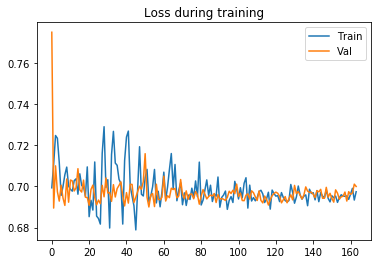

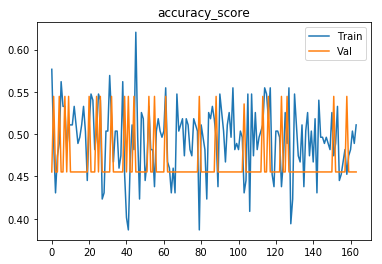

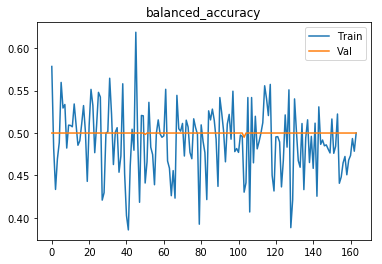

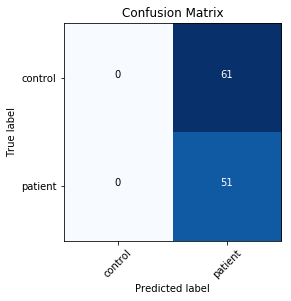

###### Starting inner fold 3
{'model': 'ModelLiu', 'batch_size': 12, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.69988
[0,     4] loss: 0.72187
[0,     6] loss: 0.69749
[0,     8] loss: 0.69265
[0,    10] loss: 0.69422
Time elapsed: 0h:0m:2s
train accuracy_score: 43.80 %
train balanced_accuracy: 43.56 %
val accuracy_score: 46.43 %
val balanced_accuracy: 50.66 %
Val loss: 0.697883
[1,     2] loss: 0.68187
[1,     4] loss: 0.71270
[1,     6] loss: 0.67185
[1,     8] loss: 0.73140
[1,    10] loss: 0.70774
Time elapsed: 0h:0m:5s
train accuracy_score: 48.18 %
train balanced_accuracy: 47.46 %
val accuracy_score: 57.14 %
val balanced_accuracy: 54.07 %
Val loss: 0.687952
[2,     2] loss: 0.69256
[2,     4] loss: 0.73034
[2,     6] loss: 0.69450
[2,     8] loss: 0.69957
[2,    10] loss: 0.67549
Time elapsed: 0h:0m:8s
train accuracy_score: 50.36 %
train balanced_accuracy: 49.77 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.700623


val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.694564
[28,     2] loss: 0.70679
[28,     4] loss: 0.67993
[28,     6] loss: 0.69670
[28,     8] loss: 0.72988
[28,    10] loss: 0.71058
Time elapsed: 0h:1m:32s
train accuracy_score: 52.55 %
train balanced_accuracy: 52.71 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.694417
[29,     2] loss: 0.67702
[29,     4] loss: 0.68039
[29,     6] loss: 0.70918
[29,     8] loss: 0.68983
[29,    10] loss: 0.65078
Time elapsed: 0h:1m:35s
train accuracy_score: 56.93 %
train balanced_accuracy: 56.61 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.695894
[30,     2] loss: 0.67581
[30,     4] loss: 0.71382
[30,     6] loss: 0.70666
[30,     8] loss: 0.72561
[30,    10] loss: 0.71110
Time elapsed: 0h:1m:38s
train accuracy_score: 51.09 %
train balanced_accuracy: 50.90 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.695148
[31,     2] loss: 0.71029
[31,     4]

val accuracy_score: 54.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.692414
[56,     2] loss: 0.71906
[56,     4] loss: 0.68827
[56,     6] loss: 0.65753
[56,     8] loss: 0.74536
[56,    10] loss: 0.69779
Time elapsed: 0h:3m:1s
train accuracy_score: 45.26 %
train balanced_accuracy: 45.18 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.697025
[57,     2] loss: 0.67186
[57,     4] loss: 0.68457
[57,     6] loss: 0.67726
[57,     8] loss: 0.69783
[57,    10] loss: 0.73760
Time elapsed: 0h:3m:4s
train accuracy_score: 56.20 %
train balanced_accuracy: 55.64 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.701666
[58,     2] loss: 0.70308
[58,     4] loss: 0.68354
[58,     6] loss: 0.71497
[58,     8] loss: 0.68359
[58,    10] loss: 0.71352
Time elapsed: 0h:3m:8s
train accuracy_score: 48.18 %
train balanced_accuracy: 47.75 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.696046
[59,     2] loss: 0.68923
[59,     4] lo

val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.698435
[84,     2] loss: 0.71581
[84,     4] loss: 0.69657
[84,     6] loss: 0.72058
[84,     8] loss: 0.67928
[84,    10] loss: 0.68361
Time elapsed: 0h:4m:31s
train accuracy_score: 50.36 %
train balanced_accuracy: 49.89 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.697652
[85,     2] loss: 0.68404
[85,     4] loss: 0.69833
[85,     6] loss: 0.67181
[85,     8] loss: 0.69076
[85,    10] loss: 0.71196
Time elapsed: 0h:4m:34s
train accuracy_score: 55.47 %
train balanced_accuracy: 55.05 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.702552
[86,     2] loss: 0.68105
[86,     4] loss: 0.70696
[86,     6] loss: 0.71306
[86,     8] loss: 0.70954
[86,    10] loss: 0.71989
Time elapsed: 0h:4m:38s
train accuracy_score: 48.91 %
train balanced_accuracy: 48.37 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.698609
[87,     2] loss: 0.68677
[87,     4]

Time elapsed: 0h:5m:58s
train accuracy_score: 47.45 %
train balanced_accuracy: 46.68 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.698162
[112,     2] loss: 0.70086
[112,     4] loss: 0.69836
[112,     6] loss: 0.68916
[112,     8] loss: 0.71268
[112,    10] loss: 0.70471
Time elapsed: 0h:6m:1s
train accuracy_score: 43.80 %
train balanced_accuracy: 43.30 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.694924
[113,     2] loss: 0.67994
[113,     4] loss: 0.69314
[113,     6] loss: 0.69189
[113,     8] loss: 0.68498
[113,    10] loss: 0.71194
Time elapsed: 0h:6m:4s
train accuracy_score: 51.82 %
train balanced_accuracy: 51.55 %
val accuracy_score: 55.36 %
val balanced_accuracy: 52.43 %
Val loss: 0.692947
[114,     2] loss: 0.71479
[114,     4] loss: 0.71341
[114,     6] loss: 0.68672
[114,     8] loss: 0.68010
[114,    10] loss: 0.68653
Time elapsed: 0h:6m:8s
train accuracy_score: 43.07 %
train balanced_accuracy: 43.13 %
val accuracy_sco

[139,     2] loss: 0.69575
[139,     4] loss: 0.70031
[139,     6] loss: 0.70152
[139,     8] loss: 0.70174
[139,    10] loss: 0.69623
Time elapsed: 0h:7m:29s
train accuracy_score: 46.72 %
train balanced_accuracy: 46.16 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.696985
[140,     2] loss: 0.69404
[140,     4] loss: 0.70194
[140,     6] loss: 0.70396
[140,     8] loss: 0.69064
[140,    10] loss: 0.69687
Time elapsed: 0h:7m:32s
train accuracy_score: 54.74 %
train balanced_accuracy: 54.05 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.695603
[141,     2] loss: 0.68948
[141,     4] loss: 0.68472
[141,     6] loss: 0.70080
[141,     8] loss: 0.69475
[141,    10] loss: 0.67267
Time elapsed: 0h:7m:36s
train accuracy_score: 56.93 %
train balanced_accuracy: 56.51 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.694776
[142,     2] loss: 0.70001
[142,     4] loss: 0.69943
[142,     6] loss: 0.68352
[142,     8] loss: 

Time elapsed: 0h:8m:57s
train accuracy_score: 48.91 %
train balanced_accuracy: 48.05 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.697700
[167,     2] loss: 0.69218
[167,     4] loss: 0.69726
[167,     6] loss: 0.71352
[167,     8] loss: 0.69785
[167,    10] loss: 0.69788
Time elapsed: 0h:8m:59s
train accuracy_score: 46.72 %
train balanced_accuracy: 45.78 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.697540
[168,     2] loss: 0.68724
[168,     4] loss: 0.69801
[168,     6] loss: 0.69031
[168,     8] loss: 0.69759
[168,    10] loss: 0.67094
Time elapsed: 0h:9m:3s
train accuracy_score: 53.28 %
train balanced_accuracy: 52.65 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.694982
Early stopping in epoch 169
Total time elapsed: 0h:9m:4s
Writing model to disk...
Best result during training: 0.52. Saving model..
Finished inner fold.


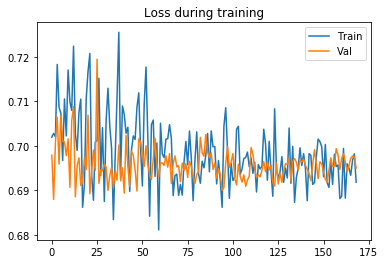

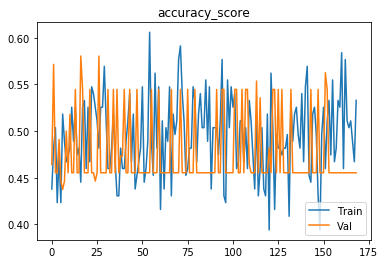

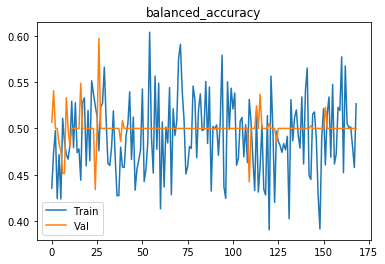

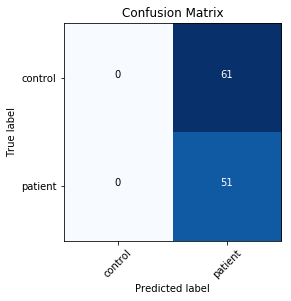

###### Starting inner fold 4
{'model': 'ModelLiu', 'batch_size': 4, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.68432
[0,     4] loss: 0.71381
[0,     6] loss: 0.66539
[0,     8] loss: 0.68736
[0,    10] loss: 0.74888
[0,    12] loss: 0.67276
[0,    14] loss: 0.63076
[0,    16] loss: 0.66640
[0,    18] loss: 0.64516
[0,    20] loss: 0.69950
[0,    22] loss: 0.63286
[0,    24] loss: 0.71418
[0,    26] loss: 0.82874
[0,    28] loss: 0.88362
[0,    30] loss: 0.97049
[0,    32] loss: 0.69780
[0,    34] loss: 0.83465
Time elapsed: 0h:0m:2s
train accuracy_score: 54.74 %
train balanced_accuracy: 54.85 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.702561
[1,     2] loss: 0.69320
[1,     4] loss: 0.78532
[1,     6] loss: 0.58001
[1,     8] loss: 0.66378
[1,    10] loss: 0.76430
[1,    12] loss: 0.68145
[1,    14] loss: 0.72890
[1,    16] loss: 0.72062
[1,    18] loss: 0.70108
[1,    20] loss: 0.67104
[1,    22] loss: 0.71051
[1, 

[13,    30] loss: 0.70275
[13,    32] loss: 0.74946
[13,    34] loss: 0.65138
Time elapsed: 0h:0m:44s
train accuracy_score: 48.18 %
train balanced_accuracy: 48.04 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.695641
[14,     2] loss: 0.66105
[14,     4] loss: 0.76235
[14,     6] loss: 0.71510
[14,     8] loss: 0.79102
[14,    10] loss: 0.70110
[14,    12] loss: 0.70957
[14,    14] loss: 0.73975
[14,    16] loss: 0.72001
[14,    18] loss: 0.68197
[14,    20] loss: 0.68863
[14,    22] loss: 0.70512
[14,    24] loss: 0.76146
[14,    26] loss: 0.78712
[14,    28] loss: 0.70322
[14,    30] loss: 0.77767
[14,    32] loss: 0.66188
[14,    34] loss: 0.64073
Time elapsed: 0h:0m:47s
train accuracy_score: 41.61 %
train balanced_accuracy: 41.51 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.705450
[15,     2] loss: 0.71169
[15,     4] loss: 0.64971
[15,     6] loss: 0.74363
[15,     8] loss: 0.70365
[15,    10] loss: 0.70707
[15,    12] loss: 0.

[27,    12] loss: 0.73644
[27,    14] loss: 0.71098
[27,    16] loss: 0.61957
[27,    18] loss: 0.69434
[27,    20] loss: 0.71995
[27,    22] loss: 0.70279
[27,    24] loss: 0.65316
[27,    26] loss: 0.69726
[27,    28] loss: 0.68809
[27,    30] loss: 0.66183
[27,    32] loss: 0.76976
[27,    34] loss: 0.72141
Time elapsed: 0h:1m:28s
train accuracy_score: 49.64 %
train balanced_accuracy: 49.69 %
val accuracy_score: 52.68 %
val balanced_accuracy: 50.61 %
Val loss: 0.696278
[28,     2] loss: 0.69447
[28,     4] loss: 0.66837
[28,     6] loss: 0.64912
[28,     8] loss: 0.70251
[28,    10] loss: 0.62902
[28,    12] loss: 0.82698
[28,    14] loss: 0.75532
[28,    16] loss: 0.61778
[28,    18] loss: 0.64189
[28,    20] loss: 0.77953
[28,    22] loss: 0.63989
[28,    24] loss: 0.63791
[28,    26] loss: 0.69545
[28,    28] loss: 0.68746
[28,    30] loss: 0.72083
[28,    32] loss: 0.73026
[28,    34] loss: 0.59384
Time elapsed: 0h:1m:32s
train accuracy_score: 51.82 %
train balanced_accuracy: 51

Time elapsed: 0h:2m:9s
train accuracy_score: 46.72 %
train balanced_accuracy: 47.06 %
val accuracy_score: 56.25 %
val balanced_accuracy: 59.03 %
Val loss: 0.691299
[41,     2] loss: 0.64978
[41,     4] loss: 0.68429
[41,     6] loss: 0.70749
[41,     8] loss: 0.67719
[41,    10] loss: 0.70942
[41,    12] loss: 0.68781
[41,    14] loss: 0.66789
[41,    16] loss: 0.71641
[41,    18] loss: 0.67877
[41,    20] loss: 0.72673
[41,    22] loss: 0.63935
[41,    24] loss: 0.68416
[41,    26] loss: 0.69426
[41,    28] loss: 0.67161
[41,    30] loss: 0.68037
[41,    32] loss: 0.70869
[41,    34] loss: 0.70522
Time elapsed: 0h:2m:13s
train accuracy_score: 59.12 %
train balanced_accuracy: 59.20 %
val accuracy_score: 51.79 %
val balanced_accuracy: 52.04 %
Val loss: 0.692229
[42,     2] loss: 0.68647
[42,     4] loss: 0.71127
[42,     6] loss: 0.67604
[42,     8] loss: 0.69259
[42,    10] loss: 0.72591
[42,    12] loss: 0.66915
[42,    14] loss: 0.70761
[42,    16] loss: 0.71839
[42,    18] loss: 0.7

[54,    16] loss: 0.69457
[54,    18] loss: 0.70527
[54,    20] loss: 0.68360
[54,    22] loss: 0.68631
[54,    24] loss: 0.71776
[54,    26] loss: 0.68236
[54,    28] loss: 0.68168
[54,    30] loss: 0.71378
[54,    32] loss: 0.72578
[54,    34] loss: 0.67291
Time elapsed: 0h:2m:53s
train accuracy_score: 54.74 %
train balanced_accuracy: 54.63 %
val accuracy_score: 54.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.692815
[55,     2] loss: 0.73463
[55,     4] loss: 0.71540
[55,     6] loss: 0.72682
[55,     8] loss: 0.70782
[55,    10] loss: 0.64236
[55,    12] loss: 0.69717
[55,    14] loss: 0.66615
[55,    16] loss: 0.72048
[55,    18] loss: 0.66189
[55,    20] loss: 0.72687
[55,    22] loss: 0.69194
[55,    24] loss: 0.74916
[55,    26] loss: 0.76977
[55,    28] loss: 0.71113
[55,    30] loss: 0.75965
[55,    32] loss: 0.72747
[55,    34] loss: 0.70298
Time elapsed: 0h:2m:57s
train accuracy_score: 45.26 %
train balanced_accuracy: 45.60 %
val accuracy_score: 45.54 %
val balanced_accur

val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.697306
[68,     2] loss: 0.67833
[68,     4] loss: 0.71708
[68,     6] loss: 0.70980
[68,     8] loss: 0.65192
[68,    10] loss: 0.71739
[68,    12] loss: 0.70368
[68,    14] loss: 0.68580
[68,    16] loss: 0.69810
[68,    18] loss: 0.69968
[68,    20] loss: 0.72624
[68,    22] loss: 0.67406
[68,    24] loss: 0.73789
[68,    26] loss: 0.67071
[68,    28] loss: 0.72749
[68,    30] loss: 0.71833
[68,    32] loss: 0.68757
[68,    34] loss: 0.68487
Time elapsed: 0h:3m:40s
train accuracy_score: 46.72 %
train balanced_accuracy: 46.71 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.694207
[69,     2] loss: 0.67998
[69,     4] loss: 0.69446
[69,     6] loss: 0.67918
[69,     8] loss: 0.70302
[69,    10] loss: 0.65988
[69,    12] loss: 0.70970
[69,    14] loss: 0.67011
[69,    16] loss: 0.71507
[69,    18] loss: 0.68520
[69,    20] loss: 0.69925
[69,    22] loss: 0.72390
[69,    24] loss: 0.66920
[69

[81,    20] loss: 0.67292
[81,    22] loss: 0.69623
[81,    24] loss: 0.68157
[81,    26] loss: 0.72011
[81,    28] loss: 0.68629
[81,    30] loss: 0.69334
[81,    32] loss: 0.64918
[81,    34] loss: 0.69342
Time elapsed: 0h:4m:21s
train accuracy_score: 52.55 %
train balanced_accuracy: 52.58 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.693970
[82,     2] loss: 0.70643
[82,     4] loss: 0.68288
[82,     6] loss: 0.70027
[82,     8] loss: 0.72539
[82,    10] loss: 0.72060
[82,    12] loss: 0.67508
[82,    14] loss: 0.66245
[82,    16] loss: 0.69385
[82,    18] loss: 0.70539
[82,    20] loss: 0.71558
[82,    22] loss: 0.69465
[82,    24] loss: 0.67737
[82,    26] loss: 0.72853
[82,    28] loss: 0.61570
[82,    30] loss: 0.75085
[82,    32] loss: 0.69085
[82,    34] loss: 0.69788
Time elapsed: 0h:4m:24s
train accuracy_score: 48.91 %
train balanced_accuracy: 49.23 %
val accuracy_score: 54.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.691959
[83,     2] loss: 0.

[95,     2] loss: 0.66196
[95,     4] loss: 0.71344
[95,     6] loss: 0.67686
[95,     8] loss: 0.71335
[95,    10] loss: 0.70470
[95,    12] loss: 0.72552
[95,    14] loss: 0.67448
[95,    16] loss: 0.70016
[95,    18] loss: 0.69752
[95,    20] loss: 0.69519
[95,    22] loss: 0.70741
[95,    24] loss: 0.68221
[95,    26] loss: 0.69197
[95,    28] loss: 0.72960
[95,    30] loss: 0.70711
[95,    32] loss: 0.71641
[95,    34] loss: 0.67037
Time elapsed: 0h:5m:4s
train accuracy_score: 42.34 %
train balanced_accuracy: 41.84 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.694312
[96,     2] loss: 0.70947
[96,     4] loss: 0.65783
[96,     6] loss: 0.72096
[96,     8] loss: 0.66867
[96,    10] loss: 0.68196
[96,    12] loss: 0.67420
[96,    14] loss: 0.69830
[96,    16] loss: 0.70706
[96,    18] loss: 0.70096
[96,    20] loss: 0.72189
[96,    22] loss: 0.67034
[96,    24] loss: 0.72659
[96,    26] loss: 0.67584
[96,    28] loss: 0.72653
[96,    30] loss: 0.69961
[96,

[108,    18] loss: 0.72369
[108,    20] loss: 0.66967
[108,    22] loss: 0.67767
[108,    24] loss: 0.74453
[108,    26] loss: 0.71647
[108,    28] loss: 0.66683
[108,    30] loss: 0.69441
[108,    32] loss: 0.70943
[108,    34] loss: 0.70130
Time elapsed: 0h:5m:44s
train accuracy_score: 48.18 %
train balanced_accuracy: 47.46 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.696733
[109,     2] loss: 0.69253
[109,     4] loss: 0.69086
[109,     6] loss: 0.69870
[109,     8] loss: 0.68472
[109,    10] loss: 0.69464
[109,    12] loss: 0.70597
[109,    14] loss: 0.69502
[109,    16] loss: 0.70487
[109,    18] loss: 0.65901
[109,    20] loss: 0.66954
[109,    22] loss: 0.67216
[109,    24] loss: 0.70865
[109,    26] loss: 0.69517
[109,    28] loss: 0.69767
[109,    30] loss: 0.70845
[109,    32] loss: 0.68835
[109,    34] loss: 0.75161
Time elapsed: 0h:5m:47s
train accuracy_score: 51.09 %
train balanced_accuracy: 50.42 %
val accuracy_score: 45.54 %
val balanced_accur

[121,    26] loss: 0.68904
[121,    28] loss: 0.68380
[121,    30] loss: 0.69968
[121,    32] loss: 0.66507
[121,    34] loss: 0.68679
Time elapsed: 0h:6m:27s
train accuracy_score: 52.55 %
train balanced_accuracy: 52.74 %
val accuracy_score: 50.00 %
val balanced_accuracy: 48.31 %
Val loss: 0.693152
[122,     2] loss: 0.69419
[122,     4] loss: 0.69769
[122,     6] loss: 0.68418
[122,     8] loss: 0.70416
[122,    10] loss: 0.66626
[122,    12] loss: 0.70715
[122,    14] loss: 0.70917
[122,    16] loss: 0.67719
[122,    18] loss: 0.69143
[122,    20] loss: 0.67450
[122,    22] loss: 0.69884
[122,    24] loss: 0.68686
[122,    26] loss: 0.66315
[122,    28] loss: 0.70484
[122,    30] loss: 0.67964
[122,    32] loss: 0.72211
[122,    34] loss: 0.75126
Time elapsed: 0h:6m:30s
train accuracy_score: 54.74 %
train balanced_accuracy: 54.05 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.700500
[123,     2] loss: 0.68397
[123,     4] loss: 0.68911
[123,     6] loss: 0.6

Time elapsed: 0h:7m:7s
train accuracy_score: 48.91 %
train balanced_accuracy: 48.08 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.696057
[135,     2] loss: 0.67661
[135,     4] loss: 0.66898
[135,     6] loss: 0.66668
[135,     8] loss: 0.68653
[135,    10] loss: 0.68911
[135,    12] loss: 0.72797
[135,    14] loss: 0.67521
[135,    16] loss: 0.73337
[135,    18] loss: 0.70070
[135,    20] loss: 0.69514
[135,    22] loss: 0.73250
[135,    24] loss: 0.70252
[135,    26] loss: 0.70290
[135,    28] loss: 0.70791
[135,    30] loss: 0.69261
[135,    32] loss: 0.70823
[135,    34] loss: 0.72625
Time elapsed: 0h:7m:10s
train accuracy_score: 50.36 %
train balanced_accuracy: 49.54 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.694778
[136,     2] loss: 0.68926
[136,     4] loss: 0.68689
[136,     6] loss: 0.67582
[136,     8] loss: 0.70640
[136,    10] loss: 0.69298
[136,    12] loss: 0.67765
[136,    14] loss: 0.69871
[136,    16] loss: 0.71

val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.698809
[148,     2] loss: 0.71846
[148,     4] loss: 0.74637
[148,     6] loss: 0.69242
[148,     8] loss: 0.67796
[148,    10] loss: 0.70931
[148,    12] loss: 0.70138
[148,    14] loss: 0.68832
[148,    16] loss: 0.70271
[148,    18] loss: 0.70914
[148,    20] loss: 0.71598
[148,    22] loss: 0.68725
[148,    24] loss: 0.66174
[148,    26] loss: 0.67641
[148,    28] loss: 0.70565
[148,    30] loss: 0.66607
[148,    32] loss: 0.70579
[148,    34] loss: 0.66383
Time elapsed: 0h:7m:52s
train accuracy_score: 49.64 %
train balanced_accuracy: 48.73 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.699213
[149,     2] loss: 0.72655
[149,     4] loss: 0.70475
[149,     6] loss: 0.70368
[149,     8] loss: 0.68204
[149,    10] loss: 0.70957
[149,    12] loss: 0.67438
[149,    14] loss: 0.70031
[149,    16] loss: 0.69356
[149,    18] loss: 0.69540
[149,    20] loss: 0.68627
[149,    22] loss: 0.69159
[

[161,    12] loss: 0.71108
[161,    14] loss: 0.70529
[161,    16] loss: 0.69215
[161,    18] loss: 0.69652
[161,    20] loss: 0.68650
[161,    22] loss: 0.67437
[161,    24] loss: 0.70851
[161,    26] loss: 0.68935
[161,    28] loss: 0.69369
[161,    30] loss: 0.71504
[161,    32] loss: 0.68162
[161,    34] loss: 0.67967
Time elapsed: 0h:8m:32s
train accuracy_score: 50.36 %
train balanced_accuracy: 49.45 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.695739
[162,     2] loss: 0.69689
[162,     4] loss: 0.69639
[162,     6] loss: 0.70272
[162,     8] loss: 0.69691
[162,    10] loss: 0.69186
[162,    12] loss: 0.70492
[162,    14] loss: 0.71153
[162,    16] loss: 0.70558
[162,    18] loss: 0.69436
[162,    20] loss: 0.70666
[162,    22] loss: 0.68545
[162,    24] loss: 0.69619
[162,    26] loss: 0.68140
[162,    28] loss: 0.68775
[162,    30] loss: 0.69402
[162,    32] loss: 0.67404
[162,    34] loss: 0.68695
Time elapsed: 0h:8m:35s
train accuracy_score: 49.64 

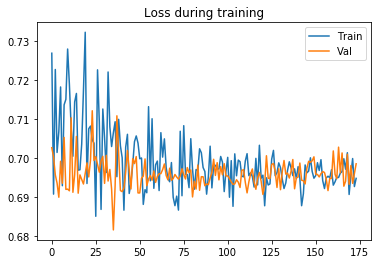

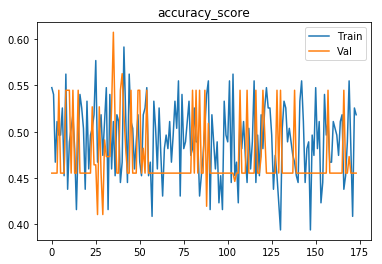

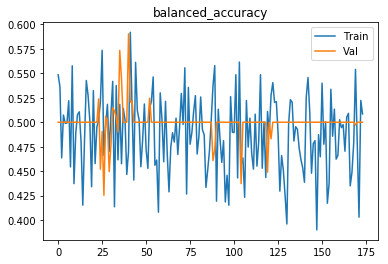

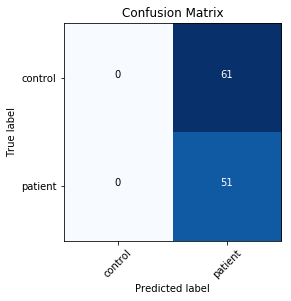

Finished outer fold.
{'final_acc': 0.5, 'best_acc': 0.51542912246865957, 'final_iter': 178, 'best_iter': 109, 'params': {'model': 'ModelLiu', 'batch_size': 6, 'patience': 16, 'lr': 0.001}, 'inner_fold_idx': 0}
################################
################################
All accuracies: [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.43181818181818177, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5]
Best accuracies mean: 0.5000346971371386 All :[0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.49318181818181805, 0.5, 0.50443181818181826, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.4991666666666667, 0.5, 0.5, 0.5, 0.5, 0.50431131019036957, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5009325396825397, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.49971070395371264]
[{'final_acc': 0.5, 'best_acc': 0.5, 'final_iter':

In [19]:
fold_metric, models = run(net=None, data=None,
                  k_folds=-1,
                  callbacks=None,
                  shape=-1,
                  masked=False,
                  metrics=metrics,
                  num_epochs=num_epochs,
                  retain_metric=retain_metric,
                  augmentations=augmentations,
                  b=None
                 )

print(np.mean(fold_metric))
print(np.std(fold_metric))

In [20]:
5/0

ZeroDivisionError: division by zero

In [20]:
training_res = [{'final_acc': 0.5, 'best_acc': 0.5, 'final_iter': 169, 'best_iter': 169, 'params': {'model': 'ModelLiu', 'batch_size': 6, 'patience': 16, 'lr': 0.001}, 'inner_fold_idx': 0}, {'final_acc': 0.5, 'best_acc': 0.58409090909090911, 'final_iter': 185, 'best_iter': 75, 'params': {'model': 'ModelLiu', 'batch_size': 12, 'patience': 12, 'lr': 0.001}, 'inner_fold_idx': 4}, {'final_acc': 0.5, 'best_acc': 0.5, 'final_iter': 179, 'best_iter': 33, 'params': {'model': 'ModelLiu', 'batch_size': 12, 'patience': 12, 'lr': 0.001}, 'inner_fold_idx': 0}, {'final_acc': 0.5, 'best_acc': 0.5, 'final_iter': 171, 'best_iter': 7, 'params': {'model': 'ModelLiu', 'batch_size': 6, 'patience': 12, 'lr': 0.001}, 'inner_fold_idx': 0}, {'final_acc': 0.5, 'best_acc': 0.53060843598357588, 'final_iter': 182, 'best_iter': 119, 'params': {'model': 'ModelLiu', 'batch_size': 4, 'patience': 16, 'lr': 0.001}, 'inner_fold_idx': 1}, {'final_acc': 0.5, 'best_acc': 0.5, 'final_iter': 177, 'best_iter': 1, 'params': {'model': 'ModelLiu', 'batch_size': 6, 'patience': 16, 'lr': 0.001}, 'inner_fold_idx': 0}, {'final_acc': 0.5, 'best_acc': 0.50932539682539679, 'final_iter': 186, 'best_iter': 5, 'params': {'model': 'ModelLiu', 'batch_size': 12, 'patience': 16, 'lr': 0.001}, 'inner_fold_idx': 0}, {'final_acc': 0.5, 'best_acc': 0.5, 'final_iter': 172, 'best_iter': 138, 'params': {'model': 'ModelLiu', 'batch_size': 6, 'patience': 16, 'lr': 0.001}, 'inner_fold_idx': 0}, {'final_acc': 0.5, 'best_acc': 0.5, 'final_iter': 188, 'best_iter': 14, 'params': {'model': 'ModelLiu', 'batch_size': 12, 'patience': 16, 'lr': 0.001}, 'inner_fold_idx': 0}, {'final_acc': 0.5, 'best_acc': 0.51542912246865957, 'final_iter': 178, 'best_iter': 109, 'params': {'model': 'ModelLiu', 'batch_size': 6, 'patience': 16, 'lr': 0.001}, 'inner_fold_idx': 0}]

# Start inference

In [21]:
print(len(training_res))
res_df = pd.DataFrame(training_res)

10


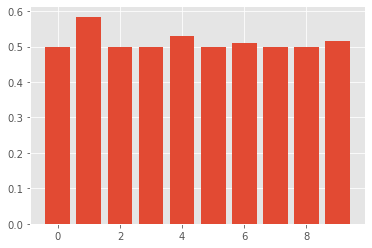

0.5139453864368541
0.5


In [22]:
plt.bar(np.arange(len(res_df["best_acc"])), res_df["best_acc"])
plt.show()
print(np.mean(res_df["best_acc"]))
print(np.mean(res_df["final_acc"]))

In [23]:
print(np.mean(res_df["final_iter"]))

178.7


In [24]:
print(res_df["final_iter"])

0    169
1    185
2    179
3    171
4    182
5    177
6    186
7    172
8    188
9    178
Name: final_iter, dtype: int64


In [25]:
from collections import OrderedDict, Counter

### Use majority vote of all patches to select prediction

In [26]:
def majority_vote_patches(img, net, gpu):
    # forward each patch per subject
    patch_preds = []
    avg_score = 0
    for i in range(img.shape[2]):
        patch = img[:,:,i].to(torch.device("cuda:" + str(gpu)))

        patch_output = net.forward(patch)
        patch_score = torch.sigmoid(patch_output)
        patch_pred = patch_score >= 0.5
        patch_preds.append(patch_pred.cpu().numpy().item())
        avg_score += patch_score.cpu().numpy().item()
    # take vote of predictions
    pred = Counter(patch_preds).most_common(1)[0][0]
    avg_score /= img.shape[2]
    return pred, avg_score

In [ ]:
metrics = []
random_states = np.arange(20, 30) # important to use the same values as during training
maj_vote = True

for outer_fold, r in enumerate(random_states):
    print("Outer fold {}".format(outer_fold))

    all_scores = []
    all_preds = []
    all_labels = []
    
    train_res = training_res[outer_fold]
    model_dir = os.path.join(output_dir,"outer_{}_inner_{}_cv_fold_{}_BEST_ITERATION.h5".format(outer_fold, train_res["inner_fold_idx"], outer_fold * 5 + train_res["inner_fold_idx"]))
    model_name = train_res["params"]["model"]
    net = pick_model(model_name)
    state_dict = torch.load(model_dir, map_location='cpu')
    new_state_dict = OrderedDict()
    for param in state_dict.items():
        new_state_dict.update([(param[0].replace("module.", ""), param[1])])
    
    net.load_state_dict(new_state_dict)
    net = net.cuda(gpu)
    net.eval()
    
    test_h5 = h5py.File(train_data_path.replace("train", "holdout") + str(r) + ".h5", 'r')

    X_test, y_test = np.array(test_h5['X']), np.array(test_h5['y'])

    # dataset overview
    print("# of patients {}, # of healthy controls {}".format(np.sum(y_test), len(y_test)-np.sum(y_test)))

    print(len(y_test))

    if zero_one_normalize:
        intensity = IntensityRescale(data_min=np.min(X_train), data_max=np.max(X_train)) # use the same min and max for all datasets
        adni_data_test= ADNIDataset(X_test, y_test, transform=transforms.Compose([intensity]), mask=mask, dtype=dtype, patched=True, all_locs=True)
    else:
        adni_data_test = ADNIDataset(X_test, y_test, transform=None, mask=mask, dtype=dtype, patched=True, all_locs=True)

    test_h5.close()
    
    test_loader = DataLoader(
            adni_data_test, batch_size=1, num_workers=0, shuffle=False)
    
    with torch.no_grad():
        for sample in test_loader:
            img = sample["image"]
            label = sample["label"]
            
            if maj_vote:
                pred, score = majority_vote_patches(img, net, gpu)
            else:
                img = img.to(torch.device("cuda:" + str(gpu)))
                output = net.forward(img)
                score = torch.sigmoid(output)
                pred = score >= 0.5
                score = score.numpy().item()
                pred = pred.numpy().item()
            
            all_scores.append(score)
            all_preds.append(pred)
            all_labels.append(label.numpy().item())
    
    balanced_acc = balanced_accuracy(all_labels, all_preds)
    roc_score = roc_auc_score(all_labels, all_scores)
    sens = sensitivity(all_labels, all_preds)
    spec = specificity(all_labels, all_preds)
    print("Bal. accuracy {:.3f} %".format(balanced_acc*100))
    print("ROC AUC Score {:.3f} %".format(roc_score*100))
    print("Sensitivity {:.3f} %".format(sens*100))
    print("Specificity {:.3f} %".format(spec*100))
    metrics.append([balanced_acc, roc_score, sens, spec, all_labels, all_scores])
# reset network to training mode
net.train()
print("######## Final results ########")
metrics_df = pd.DataFrame(metrics, columns=["Bal Acc", "ROC AUC", "Sensitivity", "Specificity", "Labels", "Scores"])
print(metrics_df)
print("Balanced accuracy mean {:.3f} %".format(np.mean(metrics_df["Bal Acc"])*100))
print("ROC AUC mean {:.3f} %".format(np.mean(metrics_df["ROC AUC"])*100))
print("Sensitivity mean {:.3f} %".format(np.mean(metrics_df["Sensitivity"])*100))
print("Specificity mean {:.3f} %".format(np.mean(metrics_df["Specificity"])*100))

Outer fold 0
# of patients 65, # of healthy controls 98
163


/home/fabiane/anaconda2/envs/mort1.8/lib/python3.6/site-packages/torch/nn/functional.py:1698: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")


Bal. accuracy 50.000 %
ROC AUC Score 55.761 %
Sensitivity 100.000 %
Specificity 0.000 %
Outer fold 1
# of patients 77, # of healthy controls 99
176
Bal. accuracy 51.299 %
ROC AUC Score 61.892 %
Sensitivity 2.597 %
Specificity 100.000 %
Outer fold 2
# of patients 78, # of healthy controls 100
178
Bal. accuracy 50.000 %
ROC AUC Score 35.038 %
Sensitivity 100.000 %
Specificity 0.000 %
Outer fold 3
# of patients 70, # of healthy controls 93
163
Bal. accuracy 50.000 %
ROC AUC Score 61.966 %
Sensitivity 0.000 %
Specificity 100.000 %
Outer fold 4
# of patients 73, # of healthy controls 96
169
Bal. accuracy 50.000 %
ROC AUC Score 35.103 %
Sensitivity 0.000 %
Specificity 100.000 %
Outer fold 5
# of patients 73, # of healthy controls 97
170
Bal. accuracy 50.000 %
ROC AUC Score 73.987 %
Sensitivity 100.000 %
Specificity 0.000 %
Outer fold 6
# of patients 68, # of healthy controls 90
158
Bal. accuracy 50.000 %
ROC AUC Score 61.667 %
Sensitivity 0.000 %
Specificity 100.000 %
Outer fold 7
# of patie

In [ ]:
fig_path = "ADNI_liu_patches_20percent_roc_curve.pdf"
plot_roc_curve(metrics_df, title="ADNI patch-based 20% ROC curve", path=fig_path)